In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
print('all the library installed')


all the library installed


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Specify the path to your .xlsx file
file_path = '/content/drive/MyDrive/Athens.xlsx'

# Load the data from the specific sheet ('final') into a DataFrame
df = pd.read_excel(file_path, sheet_name='Final')

# Display the first few rows of the data
df.head()


,NAME,Περιφερειακή ενότητα,KWD_YPES,buildings,Area,Pop Dens,PV Production Gwh – Only BBE,BBE SC1_100 – Consumption GWh,Adequacy,Population,Residents per building,Energy consuption per resident Mwh,Energy consumption per household Mwh 4 residents,Consumption Mwh per building,Energy cost per residents,Average,annual income per household
0,Dafni – Imittos,Κεντρική Αττική,9189,6040,2.4,14119.166670,28.438429,92.682110,0.306838,33886,5.610265,2.735115,10.940460,15.344720,272.007195,Average,32114
1,Agia Varbara,Δυτική Αττική,9179,4908,2.4,11149.583330,26.721555,27.255805,0.980399,26759,5.452119,1.018566,4.074264,5.553342,101.296378,Average,28262
2,Nea Smyrni,Νότια Αττική,9200,5895,3.5,20815.142860,38.941916,253.013508,0.153912,72853,12.358439,3.472932,13.891728,42.920018,345.383078,Average,31011
3,Filadelphia,Κεντρική Αττική,9193,3824,3.7,9448.108108,25.052255,87.689008,0.285694,34958,9.141736,2.508410,10.033641,22.931226,249.461407,Average,31634
4,Vrilissia,Βόρεια Αττική,9169,3595,3.9,8312.051282,33.345475,93.125557,0.358070,32417,9.017246,2.872738,11.490953,25.904188,285.693824,Average,29857


In [ ]:
# Step 4a: Calculate the PV Contribution per Person
# Formula: PCPP = (pv production / population)
df['PCPP Index'] = (df['PV Production Gwh – Only BBE'] / df['Population'])


In [ ]:
# Step 4a: Calculate the Consumption per Person
# Formula: CPP = (consumption / population)
df['CPP Index'] = (df['BBE SC1_100 – Consumption GWh'] / df['Population'])


In [ ]:
df['Adequacy_Index'] = df['Adequacy']*100

In [ ]:
# Step 5: Display the updated DataFrame
print(df.head())


              NAME Περιφερειακή ενότητα  KWD_YPES  buildings  Area  \
0  Dafni – Imittos      Κεντρική Αττική      9189       6040   2.4   
1     Agia Varbara        Δυτική Αττική      9179       4908   2.4   
2       Nea Smyrni         Νότια Αττική      9200       5895   3.5   
3      Filadelphia      Κεντρική Αττική      9193       3824   3.7   
4        Vrilissia        Βόρεια Αττική      9169       3595   3.9   

       Pop Dens  PV Production Gwh – Only BBE  BBE SC1_100 – Consumption GWh  \
0  14119.166670                     28.438429                      92.682110   
1  11149.583330                     26.721555                      27.255805   
2  20815.142860                     38.941916                     253.013508   
3   9448.108108                     25.052255                      87.689008   
4   8312.051282                     33.345475                      93.125557   

   Adequacy  Population  Residents per building  \
0  0.306838       33886                5.610265

In [ ]:
# Step 6: Save the updated DataFrame to a new Excel file
output_file_path = 'updated_municipality_data.xlsx'
df.to_excel(output_file_path, index=False)
print(f"Updated data saved to: {output_file_path}")

Updated data saved to: updated_municipality_data.xlsx


In [ ]:
print(df.columns)

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'PCPP Index', 'CPP Index',
       'Adequacy_Index'],
      dtype='object')


In [ ]:
import numpy as np
import pandas as pd

def create_percentile_bins(df, column):
    """
    Creates 10th percentile bins for the specified column in the DataFrame.

    Args:
    - df: Pandas DataFrame
    - column: Column name for which percentile bins need to be created

    Returns:
    - Updated DataFrame with a new bin column
    """
    # Ensure column is numeric
    df[column] = pd.to_numeric(df[column], errors='coerce')  # Convert non-numeric to NaN
    df = df.dropna(subset=[column])  # Drop rows with NaN values

    # Create 10th percentile bins
    bins = np.percentile(df[column], np.arange(0, 110, 10))  # Define bin edges
    labels = [f'{bins[i]:.2f}-{bins[i+1]:.2f}' for i in range(len(bins) - 1)]  # Bin labels
    bin_column = f'{column}_bin'  # Name for the new bin column

    # Add the bin column to the DataFrame
    df[bin_column] = pd.cut(df[column], bins=bins, labels=labels, include_lowest=True)

    return df


In [ ]:
# Create 10th percentile bins for the variables
df = create_percentile_bins(df, 'Area')
df = create_percentile_bins(df, 'Population')
df = create_percentile_bins(df, 'Pop Dens')
df = create_percentile_bins(df, 'buildings')
df = create_percentile_bins(df, 'Residents per building')
df = create_percentile_bins(df, 'Energy cost per residents')


In [ ]:
print(df.columns)

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'PCPP Index', 'CPP Index',
       'Adequacy_Index', 'Area_bin', 'Population_bin', 'Pop Dens_bin',
       'buildings_bin', 'Residents per building_bin',
       'Energy cost per residents_bin'],
      dtype='object')


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_bin_frequency(df, bin_column, title):
    """
    Plots a histogram showing the frequency of data points in each bin.

    Args:
    - df: Pandas DataFrame
    - bin_column: Column containing bin labels
    - title: Title for the plot

    Returns:
    - Histogram plot
    """
    # Count occurrences in each bin
    bin_counts = df[bin_column].value_counts().sort_index()

    # Plot histogram
    plt.figure(figsize=(10, 6))
    sns.barplot(x=bin_counts.index.astype(str), y=bin_counts.values, color='skyblue')
    plt.title(title)
    plt.xlabel(bin_column)
    plt.ylabel('Frequency')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


In [ ]:
print(df.columns)

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'PCPP Index', 'CPP Index',
       'Adequacy_Index', 'Area_bin', 'Population_bin', 'Pop Dens_bin',
       'buildings_bin', 'Residents per building_bin',
       'Energy cost per residents_bin'],
      dtype='object')


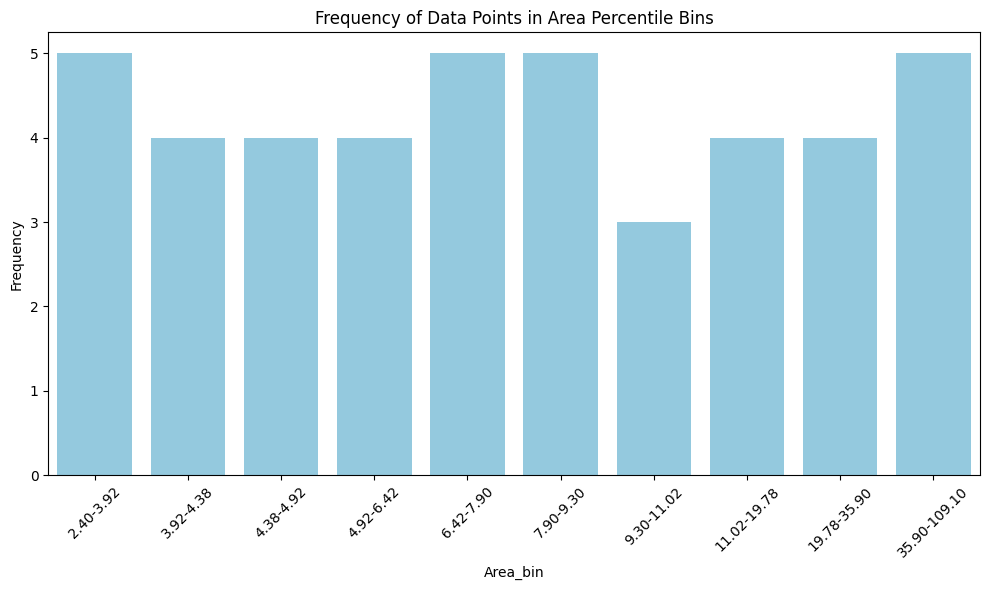

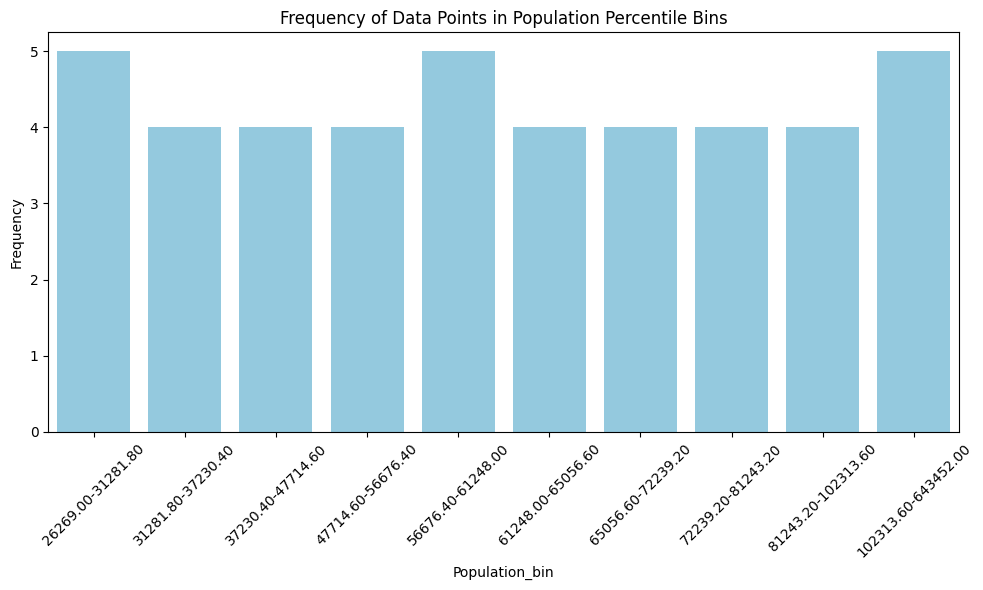

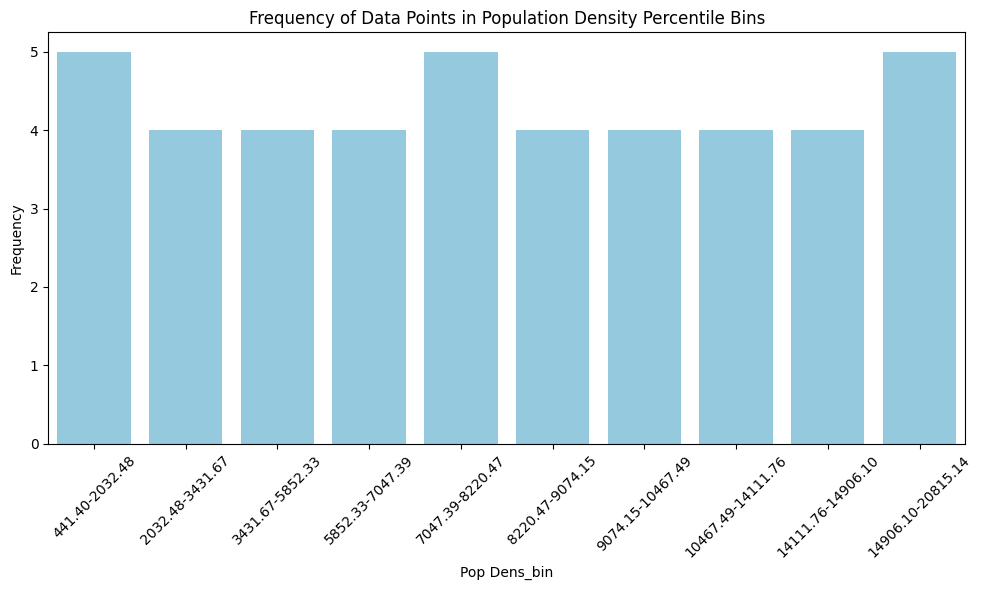

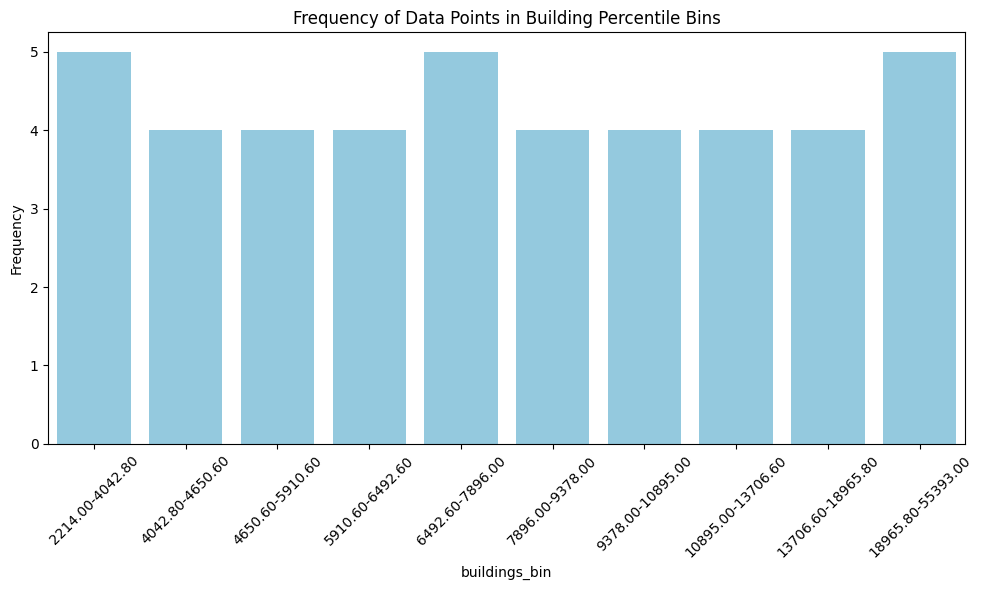

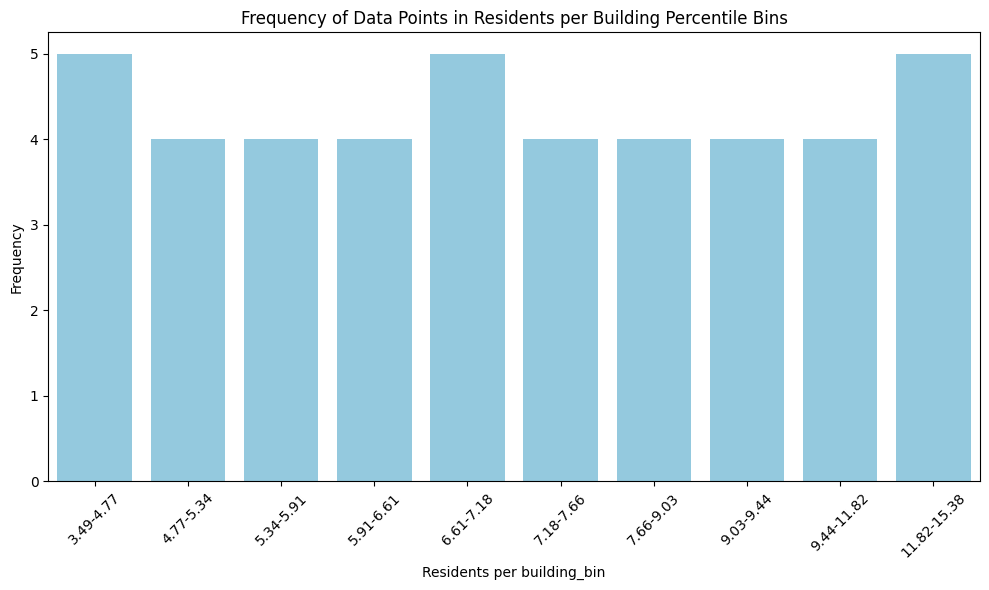

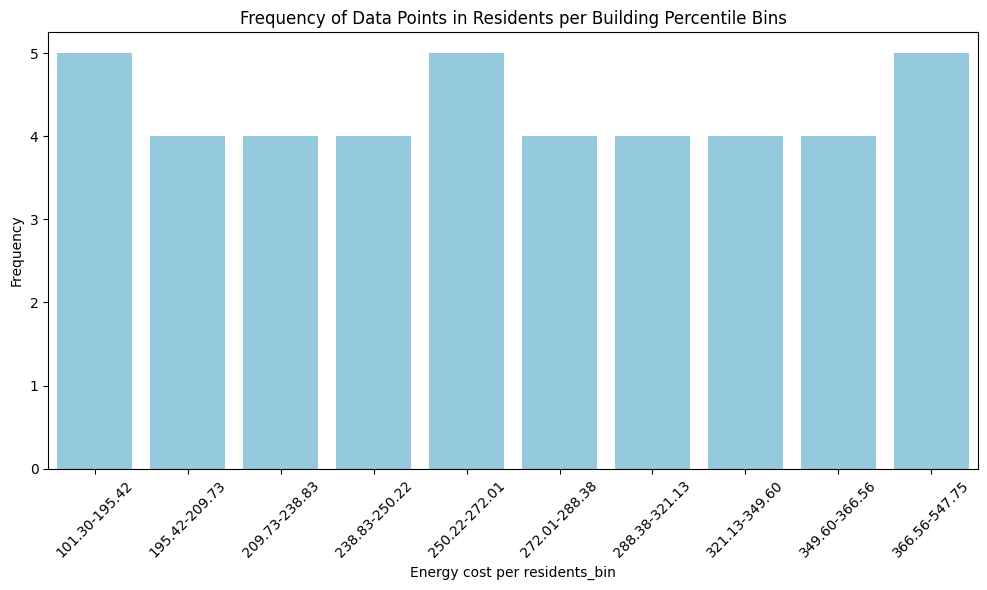

In [ ]:
# Plot histograms for each variable
plot_bin_frequency(df, 'Area_bin', 'Frequency of Data Points in Area Percentile Bins')
plot_bin_frequency(df, 'Population_bin', 'Frequency of Data Points in Population Percentile Bins')
plot_bin_frequency(df, 'Pop Dens_bin', 'Frequency of Data Points in Population Density Percentile Bins')
plot_bin_frequency(df, 'buildings_bin', 'Frequency of Data Points in Building Percentile Bins')
plot_bin_frequency(df, 'Residents per building_bin', 'Frequency of Data Points in Residents per Building Percentile Bins')
plot_bin_frequency(df, 'Energy cost per residents_bin', 'Frequency of Data Points in Residents per Building Percentile Bins')


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap

# Define the colormap
cmap = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

def plot_bin_frequency_color(df, bin_column, title):
    """
    Plots a histogram showing the frequency of data points in each bin,
    using distinct colors for each bin and styled text.

    Args:
    - df: Pandas DataFrame
    - bin_column: Column containing bin labels
    - title: Title for the plot
    """
    # Count occurrences in each bin
    bin_counts = df[bin_column].value_counts().sort_index()
    colors = cmap.colors[:len(bin_counts)]

    # Plot
    plt.figure(figsize=(10, 6))
    sns.barplot(
        x=bin_counts.index.astype(str),
        y=bin_counts.values,
        palette=colors
    )

    plt.title(title, fontsize=14, fontweight='bold')
    plt.xlabel(bin_column.replace("_", " "), fontsize=14, fontweight='bold')
    plt.ylabel("Frequency", fontsize=14, fontweight='bold')

    # Make tick labels bold
    plt.xticks(rotation=45, fontsize=12, fontweight='bold')
    plt.yticks(fontsize=12, fontweight='bold')

    plt.tight_layout()
    plt.show()


/tmp/ipython-input-312201705.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


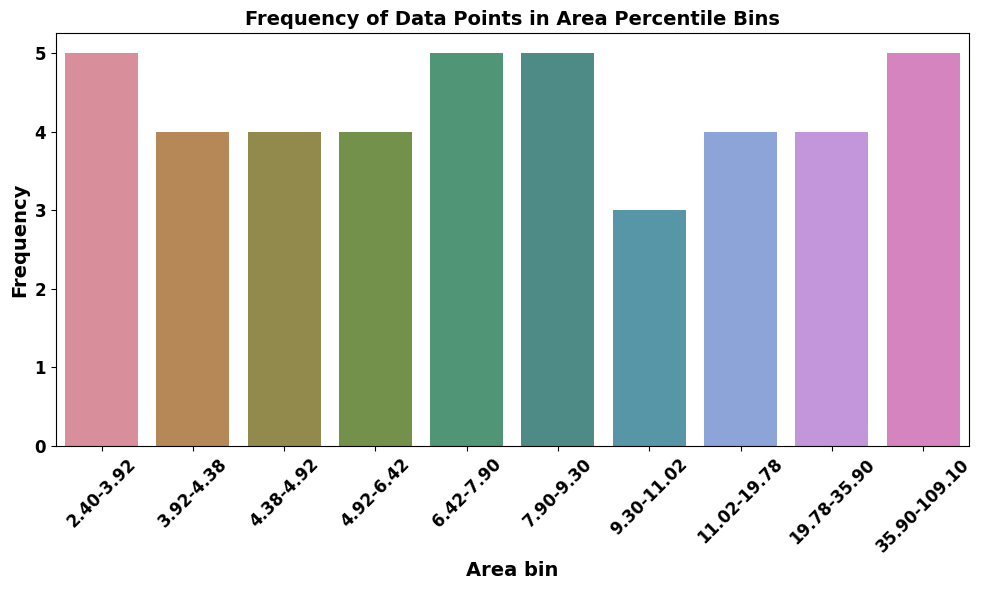

/tmp/ipython-input-312201705.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


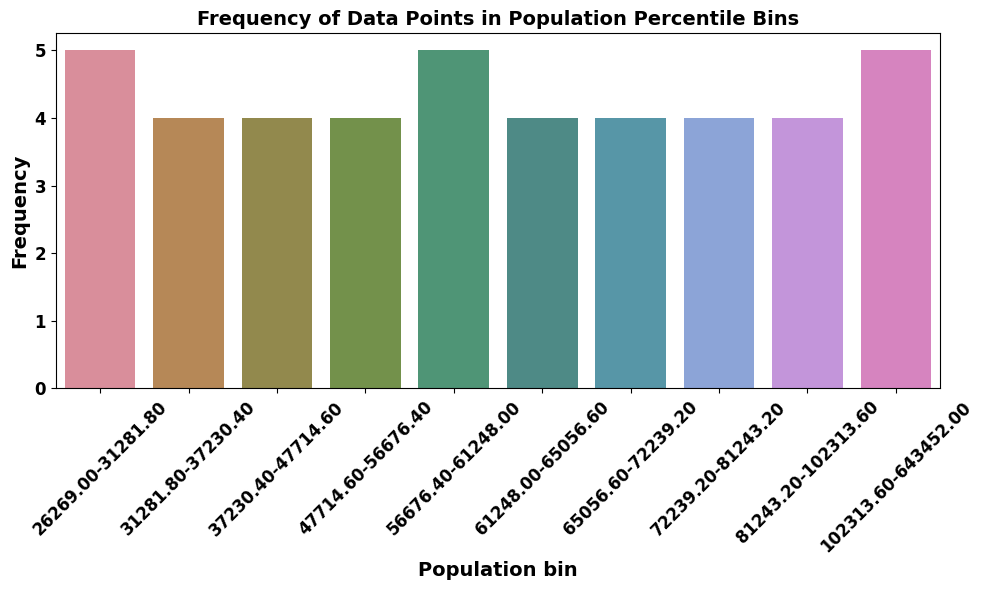

/tmp/ipython-input-312201705.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


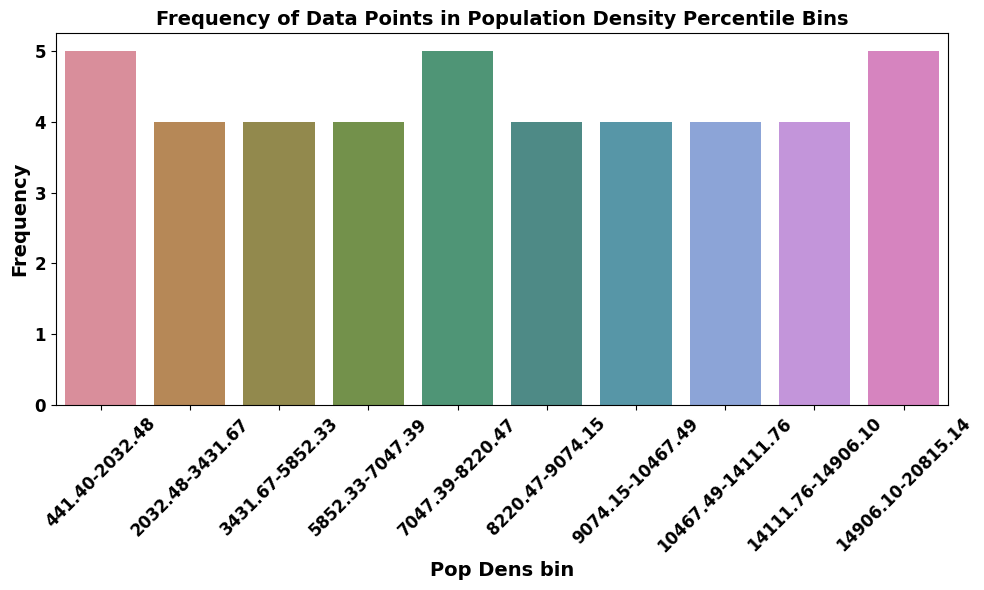

/tmp/ipython-input-312201705.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


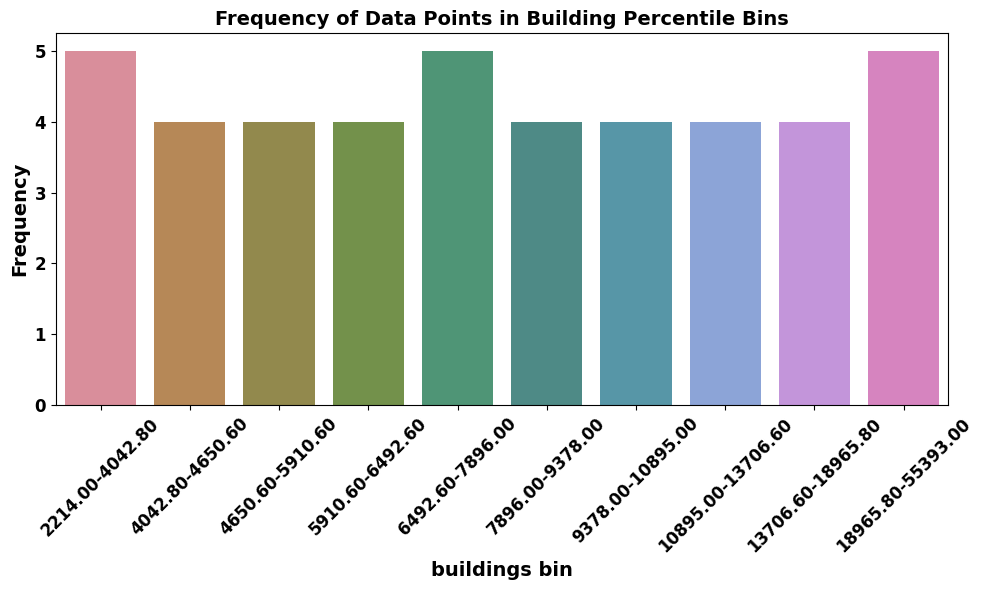

/tmp/ipython-input-312201705.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


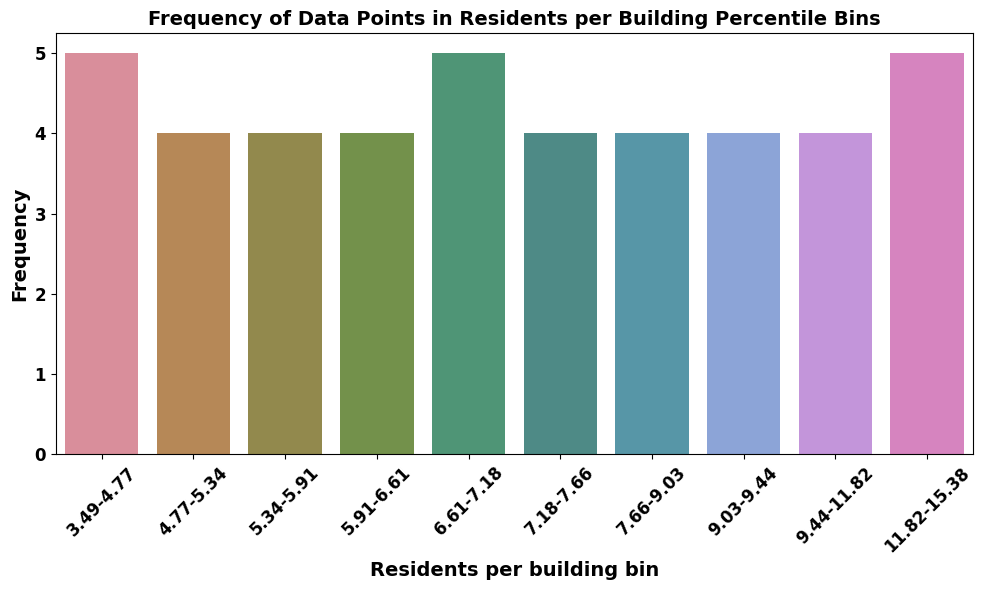

/tmp/ipython-input-312201705.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


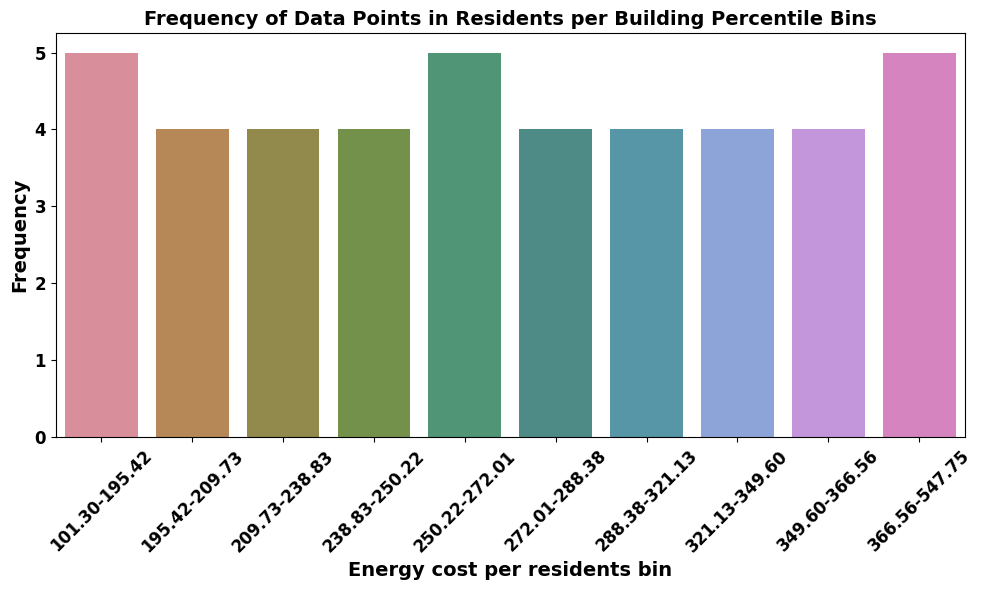

In [ ]:
# Plot histograms for each variable
plot_bin_frequency_color(df, 'Area_bin', 'Frequency of Data Points in Area Percentile Bins')
plot_bin_frequency_color(df, 'Population_bin', 'Frequency of Data Points in Population Percentile Bins')
plot_bin_frequency_color(df, 'Pop Dens_bin', 'Frequency of Data Points in Population Density Percentile Bins')
plot_bin_frequency_color(df, 'buildings_bin', 'Frequency of Data Points in Building Percentile Bins')
plot_bin_frequency_color(df, 'Residents per building_bin', 'Frequency of Data Points in Residents per Building Percentile Bins')
plot_bin_frequency_color(df, 'Energy cost per residents_bin', 'Frequency of Data Points in Residents per Building Percentile Bins')


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_colored_boxplot(df, feature_bin, title):
    """
    Plots a colorful boxplot, connects the medians with a line,
    and overlays the means as red circles with black edges.

    Args:
    - df: Pandas DataFrame
    - feature_bin: Column containing bin labels
    - title: Title for the plot

    Returns:
    - A boxplot with colorful bins, median line, and mean markers.
    """
    plt.figure(figsize=(10, 6))

    # Step 1: Create a colorful boxplot
    palette = sns.color_palette("husl", len(df[feature_bin].unique()))  # Use a colorful palette
    sns.boxplot(
        x=feature_bin,
        y='BBE SC1_100 – Consumption GWh',
        data=df,
        showfliers=False,
        palette=palette
    )

    # Step 2: Calculate the mean and median for each bin
    bin_medians = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].median()
    bin_means = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].mean()

    # Step 3: Add a line to connect the medians
    plt.plot(
        bin_medians.index,
        bin_medians.values,
        marker='o',
        color='blue',
        label='Median',
        linestyle='-',
        linewidth=2
    )

    # Step 4: Overlay the means as red circles with black edges
    plt.scatter(
        bin_means.index,
        bin_means.values,
        color='red',
        s=100,
        label='Mean',
        edgecolors='black'
    )

    # Step 5: Add title, labels, and legend
    plt.title(title)
    plt.xlabel(feature_bin)
    plt.ylabel('BBE SC1_100 – Consumption GWh')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


/tmp/ipython-input-3239485281.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3239485281.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].median()
/tmp/ipython-input-3239485281.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].mean()


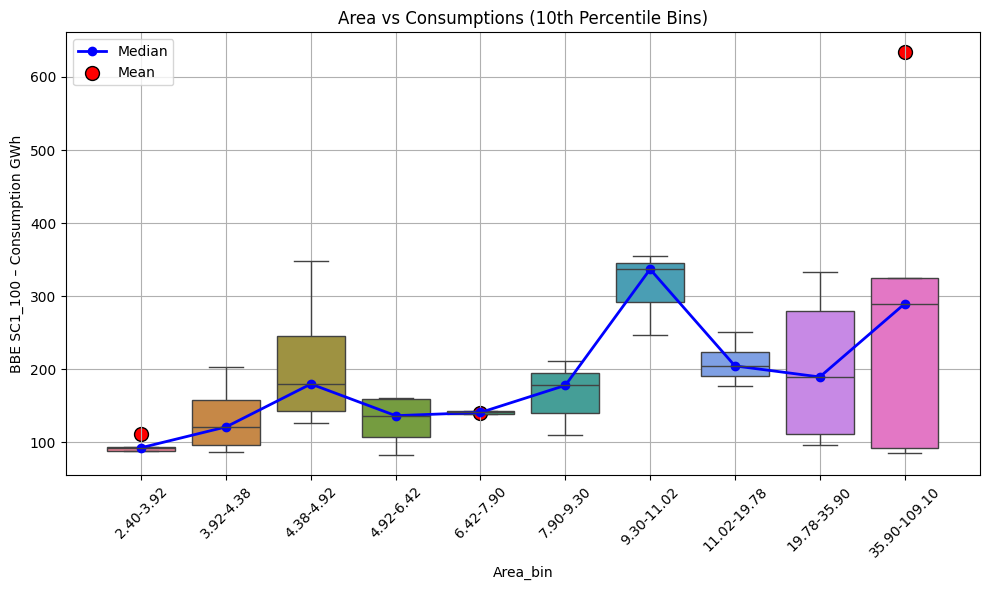

/tmp/ipython-input-3239485281.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3239485281.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].median()
/tmp/ipython-input-3239485281.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].mean()


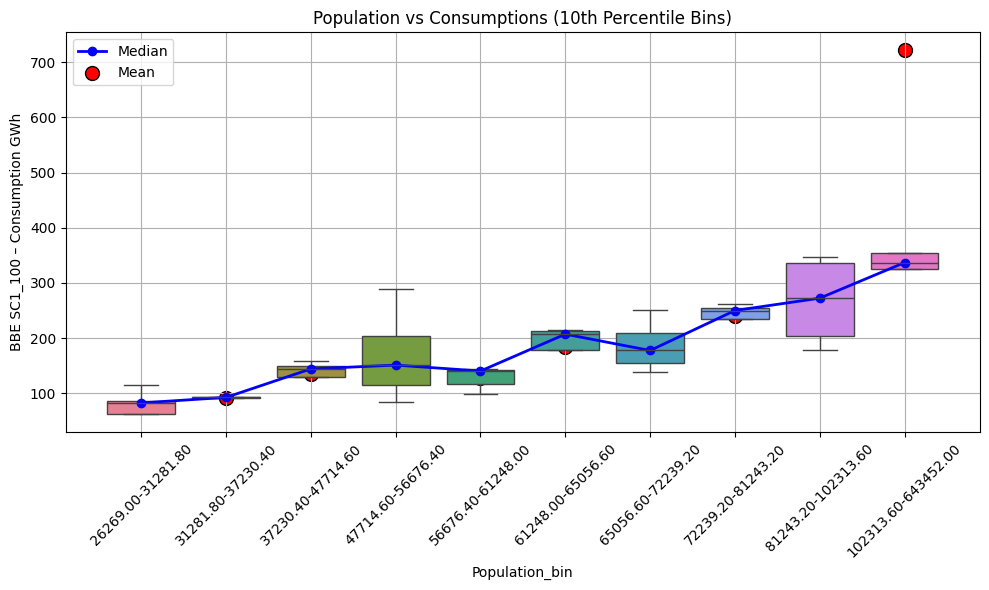

/tmp/ipython-input-3239485281.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3239485281.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].median()
/tmp/ipython-input-3239485281.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].mean()


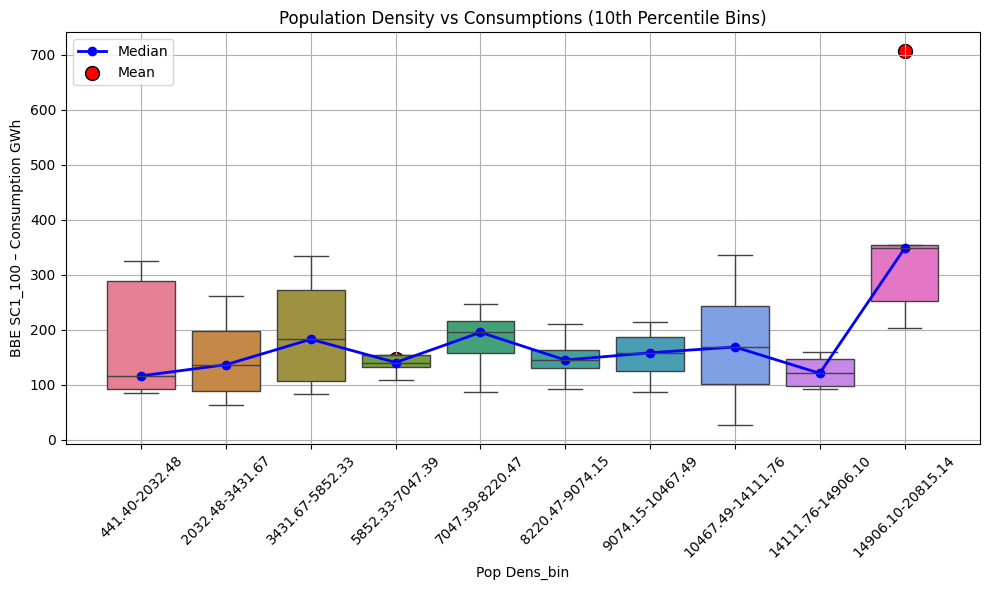

/tmp/ipython-input-3239485281.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3239485281.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].median()
/tmp/ipython-input-3239485281.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].mean()


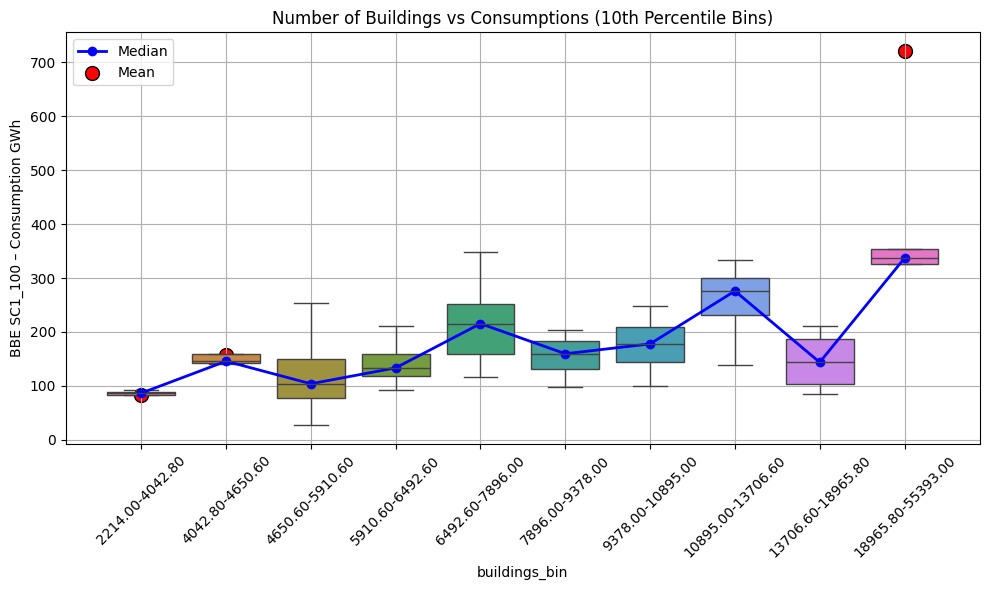

/tmp/ipython-input-3239485281.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3239485281.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].median()
/tmp/ipython-input-3239485281.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].mean()


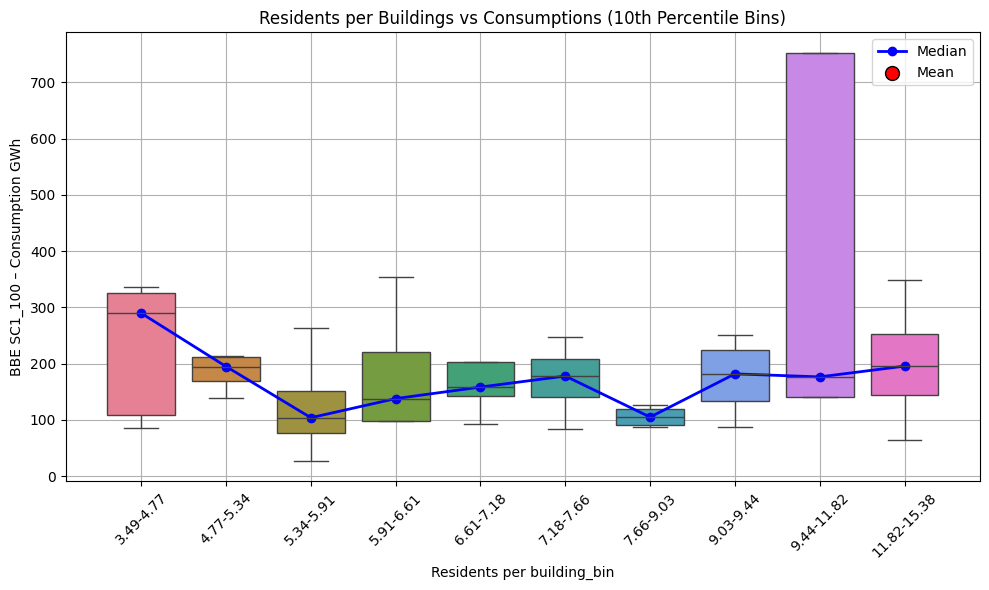

/tmp/ipython-input-3239485281.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3239485281.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].median()
/tmp/ipython-input-3239485281.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].mean()


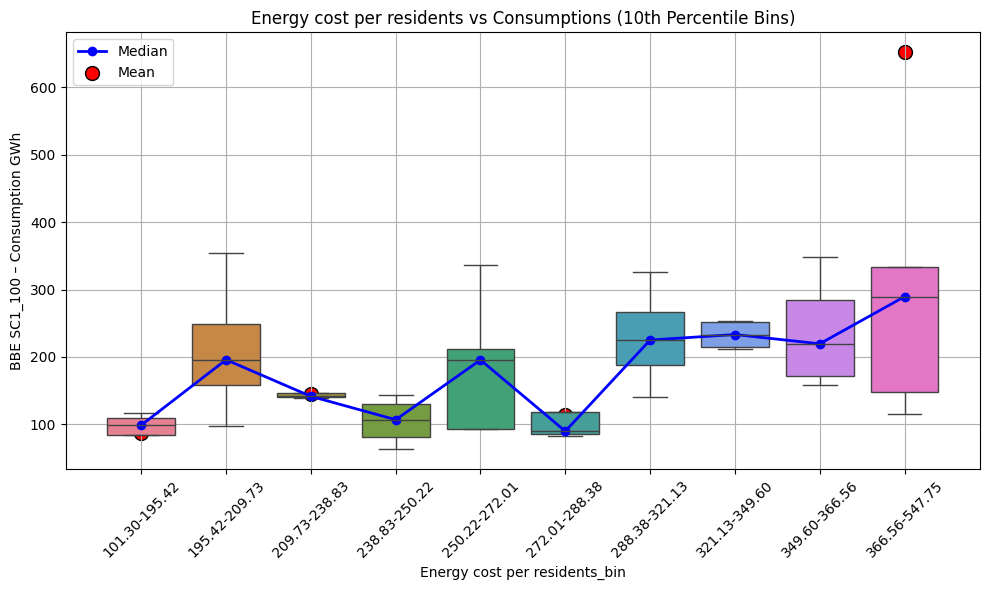

In [ ]:
# Step 5: Plot boxplots for each feature
plot_colored_boxplot(df, 'Area_bin', 'Area vs Consumptions (10th Percentile Bins)')
plot_colored_boxplot(df, 'Population_bin', 'Population vs Consumptions (10th Percentile Bins)')
plot_colored_boxplot(df, 'Pop Dens_bin', 'Population Density vs Consumptions (10th Percentile Bins)')
plot_colored_boxplot(df, 'buildings_bin', 'Number of Buildings vs Consumptions (10th Percentile Bins)')
plot_colored_boxplot(df, 'Residents per building_bin', 'Residents per Buildings vs Consumptions (10th Percentile Bins)')
plot_colored_boxplot(df, 'Energy cost per residents_bin', 'Energy cost per residents vs Consumptions (10th Percentile Bins)')


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap

# Define the custom colormap
cmap = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

def plot_colored_boxplot_lined(df, feature_bin, title):
    """
    Plots a colorful boxplot, connects the medians with a line,
    overlays the means as red circles with black edges,
    and shows outliers as red '+' symbols.
    """
    plt.figure(figsize=(10, 6))

    # Use fixed colormap
    palette = cmap.colors[:len(df[feature_bin].unique())]

    # Plot the boxplot with outliers as red '+'
    sns.boxplot(
        x=feature_bin,
        y='PV Production Gwh – Only BBE',
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1
    )

    # Compute statistics
    bin_medians = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].median()
    bin_means = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].mean()

    # Median line
    plt.plot(
        bin_medians.index,
        bin_medians.values,
        marker='o',
        color='blue',
        label='Median',
        linestyle='-',
        linewidth=2
    )

    # Mean scatter
    plt.scatter(
        bin_means.index,
        bin_means.values,
        color='red',
        s=100,
        label='Mean',
        edgecolors='black'
    )

    # Styling
    plt.title(title, fontsize=14, fontweight='bold')
    plt.xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    plt.ylabel('PV Production (GWh)', fontsize=14, fontweight='bold')

    # Numeric x-ticks
    plt.xticks(
        ticks=range(len(bin_medians.index)),
        labels=[str(i + 1) for i in range(len(bin_medians.index))],
        fontsize=12,
        fontweight='bold'
    )
    plt.yticks(fontsize=12, fontweight='bold')

    # Y-axis limit
    y_max = df['PV Production Gwh – Only BBE'].max()
    plt.ylim(0, y_max * 1.05)

    # Vertical separators
    plt.axvline(x=2.5, color='black', linestyle='--')
    plt.axvline(x=6.5, color='black', linestyle='--')

    plt.grid(True)
    plt.legend(loc='upper left')  # <-- Move legend to top-left
    plt.tight_layout()
    plt.show()


/tmp/ipython-input-1373756204.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-1373756204.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].median()
/tmp/ipython-input-1373756204.py:34: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].mean()


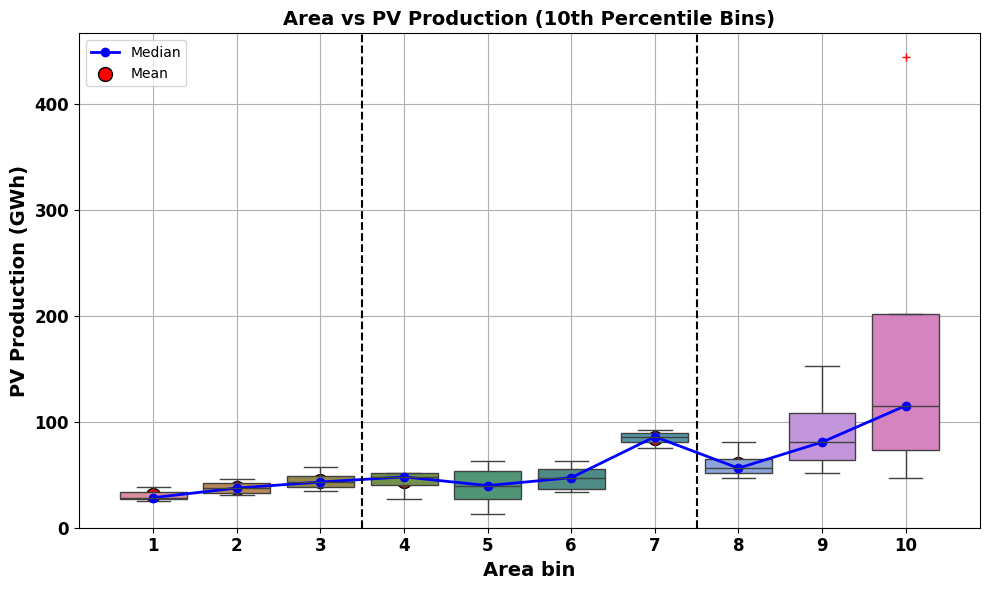

/tmp/ipython-input-1373756204.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-1373756204.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].median()
/tmp/ipython-input-1373756204.py:34: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].mean()


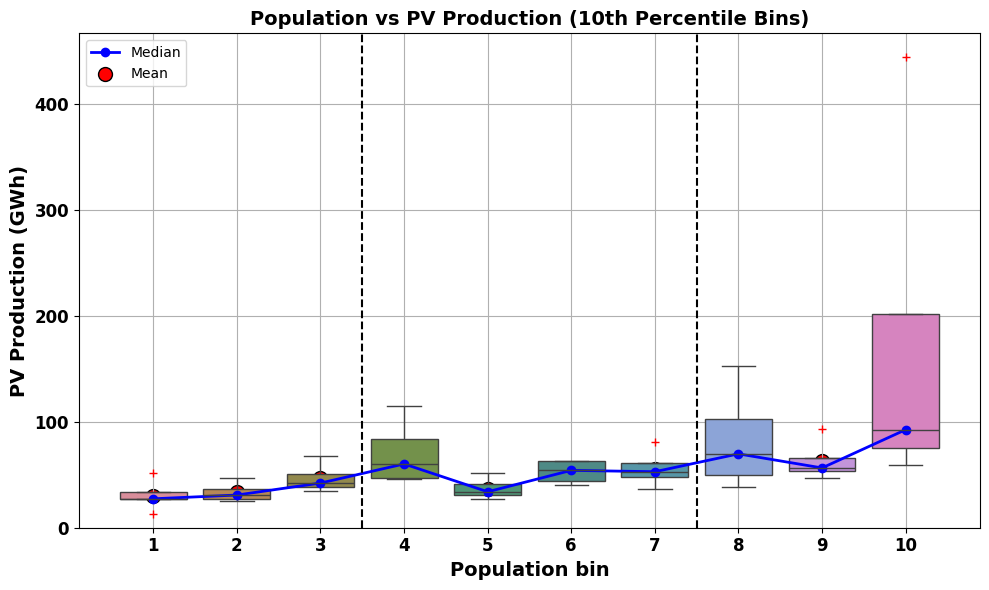

/tmp/ipython-input-1373756204.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-1373756204.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].median()
/tmp/ipython-input-1373756204.py:34: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].mean()


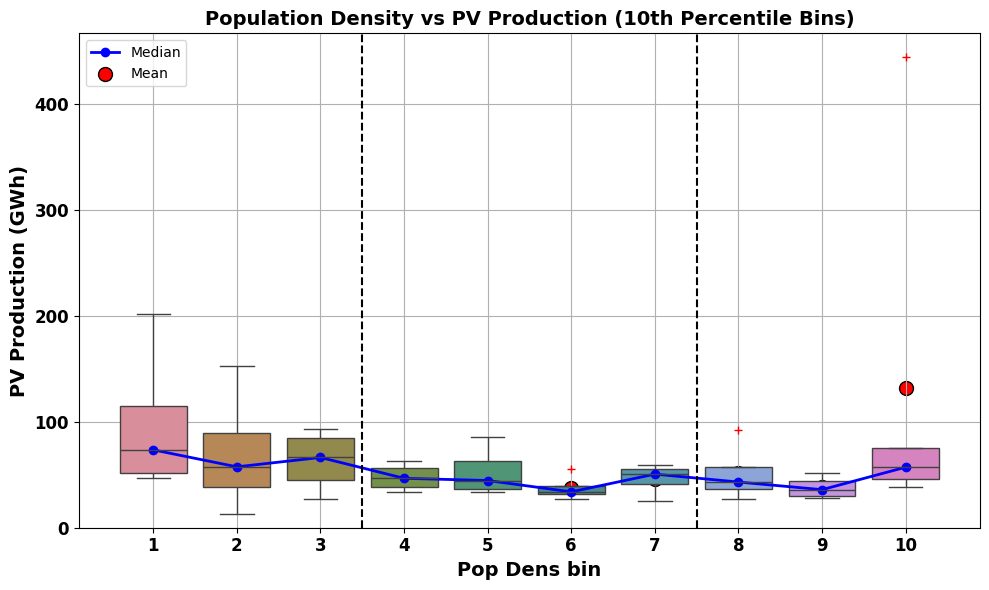

/tmp/ipython-input-1373756204.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-1373756204.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].median()
/tmp/ipython-input-1373756204.py:34: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].mean()


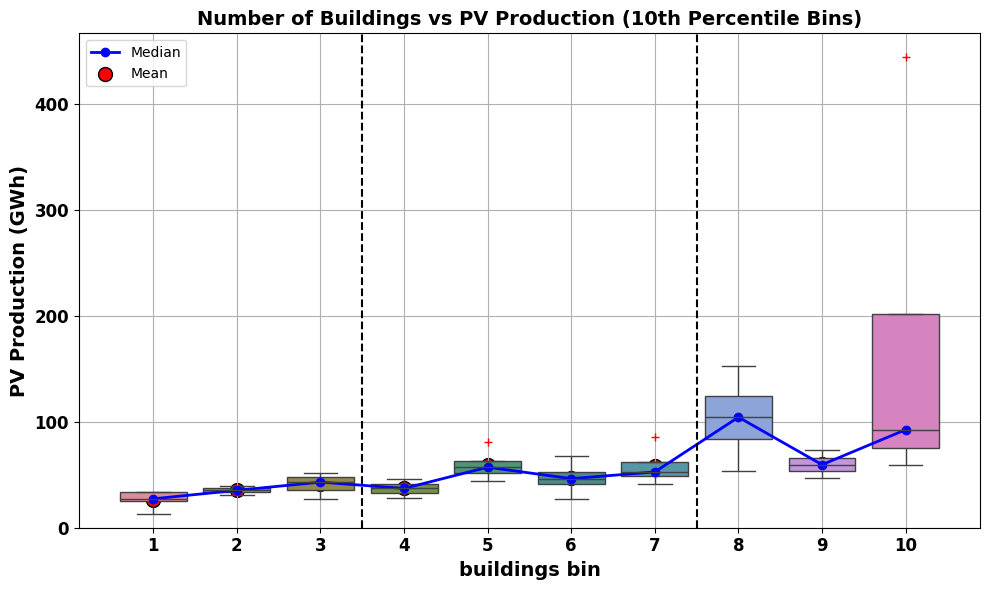

/tmp/ipython-input-1373756204.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-1373756204.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].median()
/tmp/ipython-input-1373756204.py:34: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].mean()


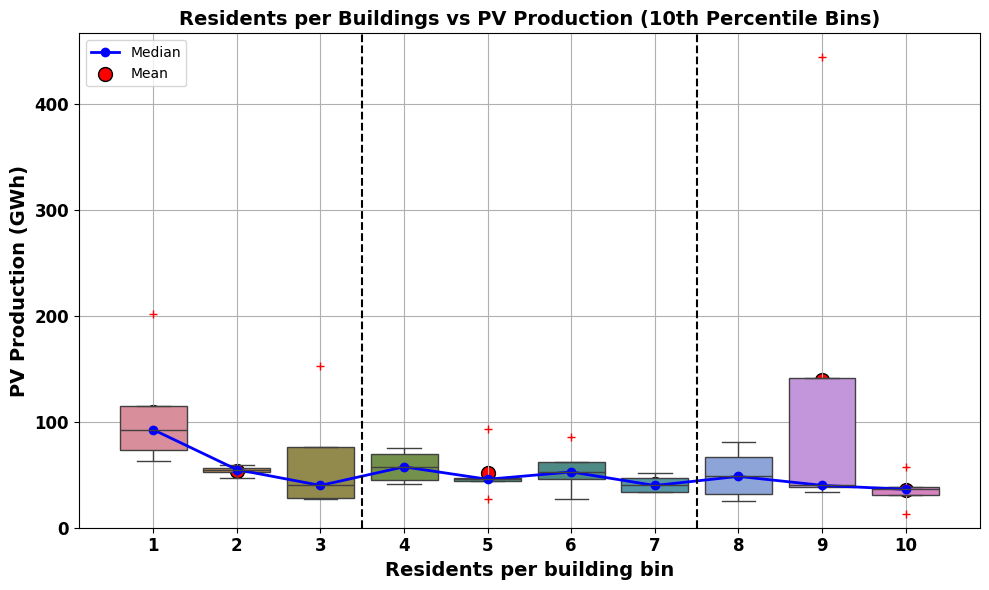

/tmp/ipython-input-1373756204.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-1373756204.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].median()
/tmp/ipython-input-1373756204.py:34: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].mean()


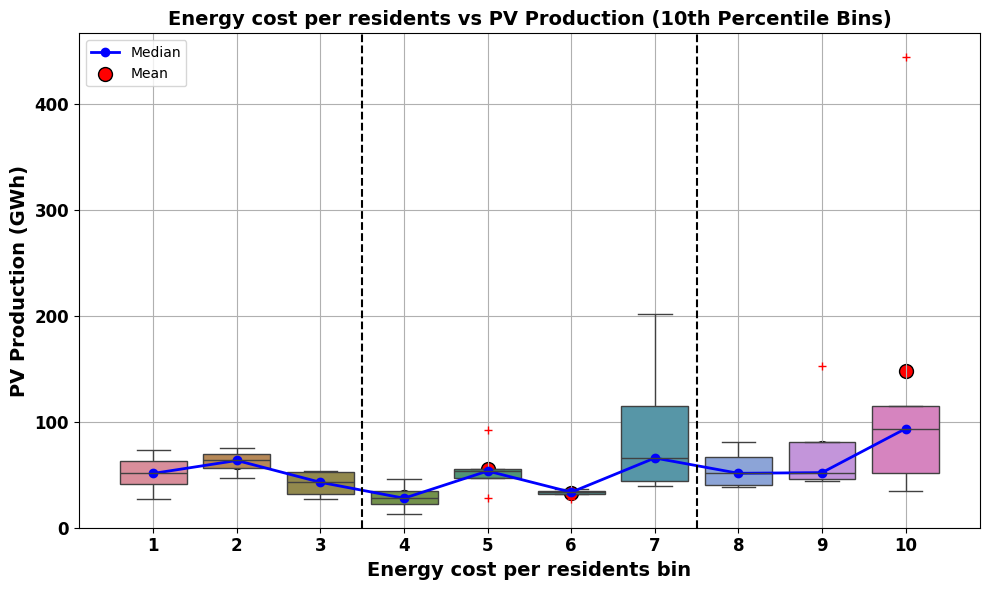

In [ ]:
# Step 5: Plot boxplots for each feature
plot_colored_boxplot_lined(df, 'Area_bin', 'Area vs PV Production (10th Percentile Bins)')
plot_colored_boxplot_lined(df, 'Population_bin', 'Population vs PV Production (10th Percentile Bins)')
plot_colored_boxplot_lined(df, 'Pop Dens_bin', 'Population Density vs PV Production (10th Percentile Bins)')
plot_colored_boxplot_lined(df, 'buildings_bin', 'Number of Buildings vs PV Production (10th Percentile Bins)')
plot_colored_boxplot_lined(df, 'Residents per building_bin', 'Residents per Buildings vs PV Production (10th Percentile Bins)')
plot_colored_boxplot_lined(df, 'Energy cost per residents_bin', 'Energy cost per residents vs PV Production (10th Percentile Bins)')


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm

# Define the custom colormap
cmap = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

# Define LMH colors from Wistia
wistia = cm.get_cmap('Wistia', 256)
lmh_cmap = {
    'Low': wistia(0.0),
    'Medium': wistia(0.5),
    'High': wistia(1.0)
}

def plot_colored_boxplot_lined(df, feature_bin, title):
    plt.figure(figsize=(10, 6))

    palette = cmap.colors[:len(df[feature_bin].unique())]

    # Create the boxplot
    sns.boxplot(
        x=feature_bin,
        y='PV Production Gwh – Only BBE',
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1
    )

    # Median and Mean values
    bin_medians = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].median()
    bin_means = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].mean()

    # Convert to lists
    median_vals = bin_medians.values
    mean_vals = bin_means.values
    x_vals = list(range(len(median_vals)))

    # Plot median diamonds
    plt.scatter(x_vals, median_vals, marker='D', color='black', label='Median', zorder=5)

    # Colored segments (Low = 0–2, Medium = 3–6, High = 7–9)
    def draw_segments(indices, color):
        for i in range(indices[0], indices[-1]):
            plt.plot([i, i + 1], [median_vals[i], median_vals[i + 1]], color=color, linewidth=2.5)

    draw_segments([0, 1, 2], lmh_cmap['Low'])
    draw_segments([3, 4, 5, 6], lmh_cmap['Medium'])
    draw_segmentsUsaully([7, 8, 9], lmh_cmap['High'])

    # Plot mean points
    plt.scatter(x_vals, mean_vals, color='red', s=100, edgecolors='black', label='Mean', zorder=5)

    # Styling
    plt.title(title, fontsize=14, fontweight='bold')
    plt.xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    plt.ylabel('PV Production (GWh)', fontsize=14, fontweight='bold')

    plt.xticks(
        ticks=x_vals,
        labels=[str(i + 1) for i in x_vals],
        fontsize=12, fontweight='bold'
    )
    plt.yticks(fontsize=12, fontweight='bold')

    # Y-axis limit
    y_max = df['PV Production Gwh – Only BBE'].max()
    plt.ylim(0, y_max * 1.05)

    # Vertical markers
    plt.axvline(x=2.5, color='black', linestyle='--')
    plt.axvline(x=6.5, color='black', linestyle='--')

    plt.grid(True)
    plt.legend(loc='upper left')
    plt.tight_layout()
    plt.show()


/tmp/ipython-input-1586419254.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  wistia = cm.get_cmap('Wistia', 256)


/tmp/ipython-input-1586419254.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-1586419254.py:36: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].median()
/tmp/ipython-input-1586419254.py:37: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].mean()


NameError: name 'draw_segmentsUsaully' is not defined

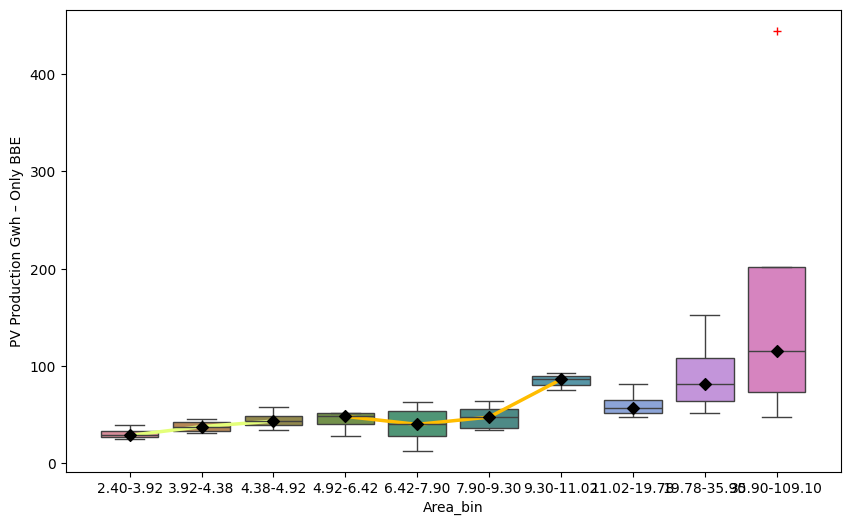

In [ ]:
plot_colored_boxplot_lined(df, 'Area_bin', 'Area vs PV Production (10th Percentile Bins)')

/tmp/ipython-input-3574946357.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  wistia = cm.get_cmap('Wistia', 256)
/tmp/ipython-input-3574946357.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3574946357.py:36: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].median()
/tmp/ipython-input-3574946357.py:37: FutureWarning: The default of observed=False is deprecated and will be change

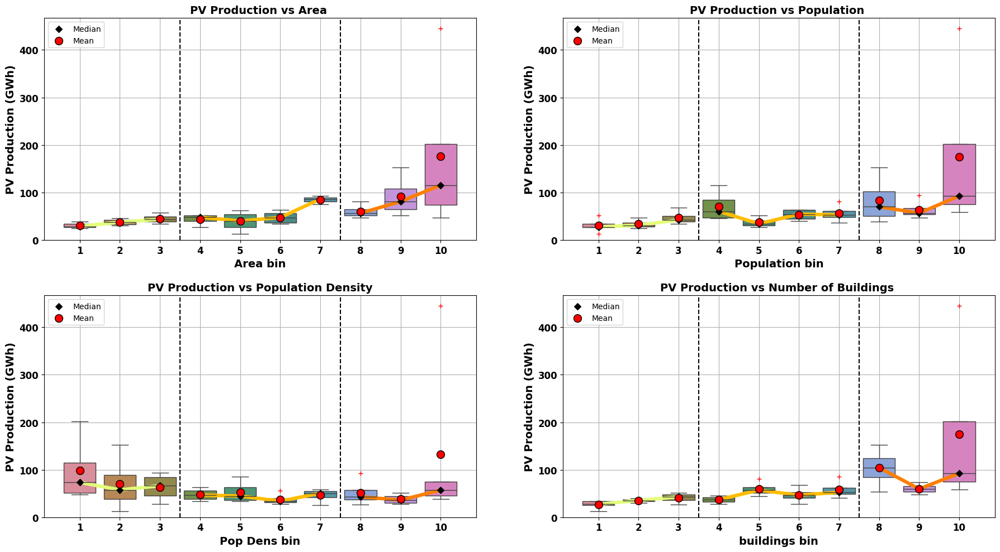

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm

# Define colormap
cmap = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

# Wistia LMH colors
wistia = cm.get_cmap('Wistia', 256)
lmh_cmap = {
    'Low': wistia(0.0),
    'Medium': wistia(0.5),
    'High': wistia(1.0)
}

# Updated function to accept subplot axis
def plot_colored_boxplot_lined_panel(df, feature_bin, title, ax):
    palette = cmap.colors[:len(df[feature_bin].unique())]

    # Boxplot
    sns.boxplot(
        x=feature_bin,
        y='PV Production Gwh – Only BBE',
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    # Medians & means
    bin_medians = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].median()
    bin_means = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].mean()

    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    # Median diamonds
    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)

    # Colored lines for LMH
    def draw_segments(indices, color):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color=color, linewidth=4.5)

    draw_segments([0, 1, 2], lmh_cmap['Low'])
    draw_segments([3, 4, 5, 6], lmh_cmap['Medium'])
    draw_segments([7, 8, 9], lmh_cmap['High'])

    # Mean points
    ax.scatter(x_vals, mean_vals, color='red', s=100, edgecolors='black', label='Mean', zorder=5)

    # Styling
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel('PV Production (GWh)', fontsize=14, fontweight='bold')

    ax.set_xticks(x_vals)
    ax.set_xticklabels([str(i + 1) for i in x_vals], fontsize=12, fontweight='bold')
    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    y_max = df['PV Production Gwh – Only BBE'].max()
    ax.set_ylim(0, y_max * 1.05)

    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')

    ax.grid(True)
    ax.legend(loc='upper left')

# === Panel Plot ===
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

# Plot
plot_colored_boxplot_lined_panel(df, 'Area_bin', 'PV Production vs Area ', axes[0, 0])
plot_colored_boxplot_lined_panel(df, 'Population_bin', 'PV Production vs Population ', axes[0, 1])
plot_colored_boxplot_lined_panel(df, 'Pop Dens_bin', 'PV Production vs Population Density', axes[1, 0])
plot_colored_boxplot_lined_panel(df, 'buildings_bin', 'PV Production vs Number of Buildings ', axes[1, 1])

plt.tight_layout()
plt.subplots_adjust(hspace=0.25, wspace=0.2)
plt.show()


In [ ]:
df['Adequacy_Index'] = df['Adequacy']*100

In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'PCPP Index', 'CPP Index',
       'Adequacy_Index', 'Area_bin', 'Population_bin', 'Pop Dens_bin',
       'buildings_bin', 'Residents per building_bin',
       'Energy cost per residents_bin'],
      dtype='object')

/tmp/ipython-input-3329862422.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3329862422.py:28: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['Adequacy_Index'].median()
/tmp/ipython-input-3329862422.py:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['Adequacy_Index'].mean()
/tmp/ipython-input-3329862422.py:17: FutureWarning: 

Passing `palette` without assigning

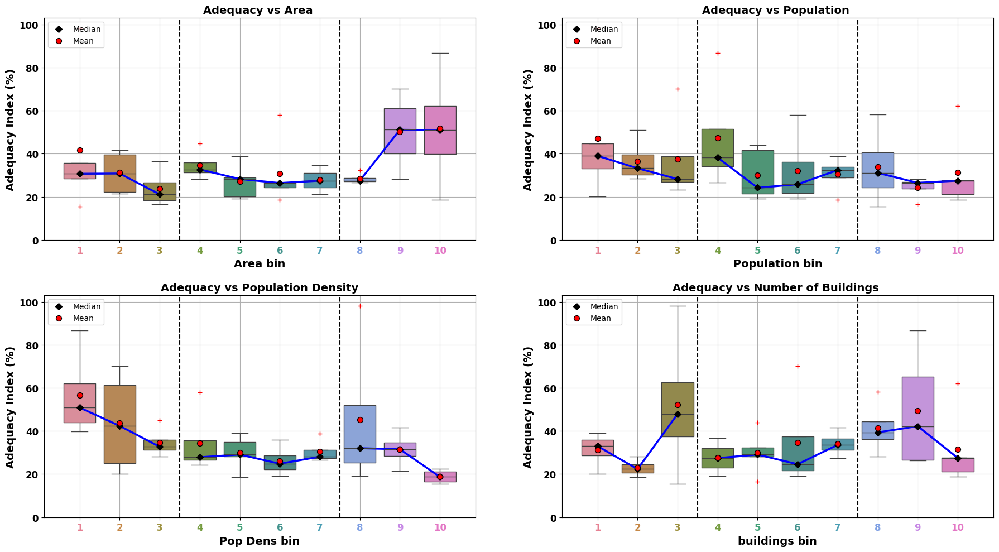

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm

# Define colormap
cmap = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

# Updated function
def plot_colored_boxplot_lined_panel(df, feature_bin, title, ax):
    palette = cmap.colors[:len(df[feature_bin].unique())]

    # Boxplot
    sns.boxplot(
        x=feature_bin,
        y='Adequacy_Index',
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    # Medians & means
    bin_medians = df.groupby(feature_bin)['Adequacy_Index'].median()
    bin_means = df.groupby(feature_bin)['Adequacy_Index'].mean()

    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    # Median diamonds
    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)

    # Blue lines for LMH
    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    draw_segments([0, 1, 2])       # Low
    draw_segments([3, 4, 5, 6])    # Medium
    draw_segments([7, 8, 9])       # High

    # Mean points
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    # Styling
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel('Adequacy Index (%)', fontsize=14, fontweight='bold')

    # Colored xticks
    tick_labels = [str(i + 1) for i in x_vals]
    ax.set_xticks(x_vals)
    ax.set_xticklabels(tick_labels, fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        label.set_color(palette[i])

    # Bold Y ticks
    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    # Limits and grid
    y_max = df['Adequacy_Index'].max()
    ax.set_ylim(0, y_max * 1.05)
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')

    ax.grid(True)
    ax.legend(loc='upper left')


# === Panel Plot ===
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

plot_colored_boxplot_lined_panel(df, 'Area_bin', 'Adequacy vs Area ', axes[0, 0])
plot_colored_boxplot_lined_panel(df, 'Population_bin', 'Adequacy vs Population ', axes[0, 1])
plot_colored_boxplot_lined_panel(df, 'Pop Dens_bin', 'Adequacy vs Population Density', axes[1, 0])
plot_colored_boxplot_lined_panel(df, 'buildings_bin', 'Adequacy vs Number of Buildings ', axes[1, 1])

plt.tight_layout()
plt.subplots_adjust(hspace=0.25, wspace=0.2)
plt.show()


In [ ]:
# Specify the path to your .xlsx file
file_path = '/content/drive/MyDrive/Athens.xlsx'

# Load the data from the specific sheet ('final') into a DataFrame
df = pd.read_excel(file_path, sheet_name='Final')

# Display the first few rows of the data
df.head()

,NAME,Περιφερειακή ενότητα,KWD_YPES,buildings,Area,Pop Dens,PV Production Gwh – Only BBE,BBE SC1_100 – Consumption GWh,Adequacy,Population,Residents per building,Energy consuption per resident Mwh,Energy consumption per household Mwh 4 residents,Consumption Mwh per building,Energy cost per residents,Average,annual income per household
0,Dafni – Imittos,Κεντρική Αττική,9189,6040,2.4,14119.166670,28.438429,92.682110,0.306838,33886,5.610265,2.735115,10.940460,15.344720,272.007195,Average,32114
1,Agia Varbara,Δυτική Αττική,9179,4908,2.4,11149.583330,26.721555,27.255805,0.980399,26759,5.452119,1.018566,4.074264,5.553342,101.296378,Average,28262
2,Nea Smyrni,Νότια Αττική,9200,5895,3.5,20815.142860,38.941916,253.013508,0.153912,72853,12.358439,3.472932,13.891728,42.920018,345.383078,Average,31011
3,Filadelphia,Κεντρική Αττική,9193,3824,3.7,9448.108108,25.052255,87.689008,0.285694,34958,9.141736,2.508410,10.033641,22.931226,249.461407,Average,31634
4,Vrilissia,Βόρεια Αττική,9169,3595,3.9,8312.051282,33.345475,93.125557,0.358070,32417,9.017246,2.872738,11.490953,25.904188,285.693824,Average,29857


In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.cm as cm

# --- Load shapefile ---
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"  # Update this
gdf = gpd.read_file(shapefile_path).to_crs(epsg=4326)

In [ ]:
gdf.head()

,fid,NAME,KWD_YPES,geometry
0,8.0,Ilion,9182,"POLYGON ((23.68392 38.06429, 23.68763 38.06131..."
1,12.0,Agia Varbara,9179,"POLYGON ((23.64394 37.99855, 23.64396 37.99856..."
2,13.0,Agia Paraskevi,9167,"POLYGON ((23.84009 38.0241, 23.84021 38.02408,..."
3,15.0,Agios Dimitrios,9194,"POLYGON ((23.7413 37.94727, 23.74202 37.94095,..."
4,18.0,Agioi Anargyroi – Kamatero,9180,"POLYGON ((23.70441 38.06693, 23.71248 38.06623..."


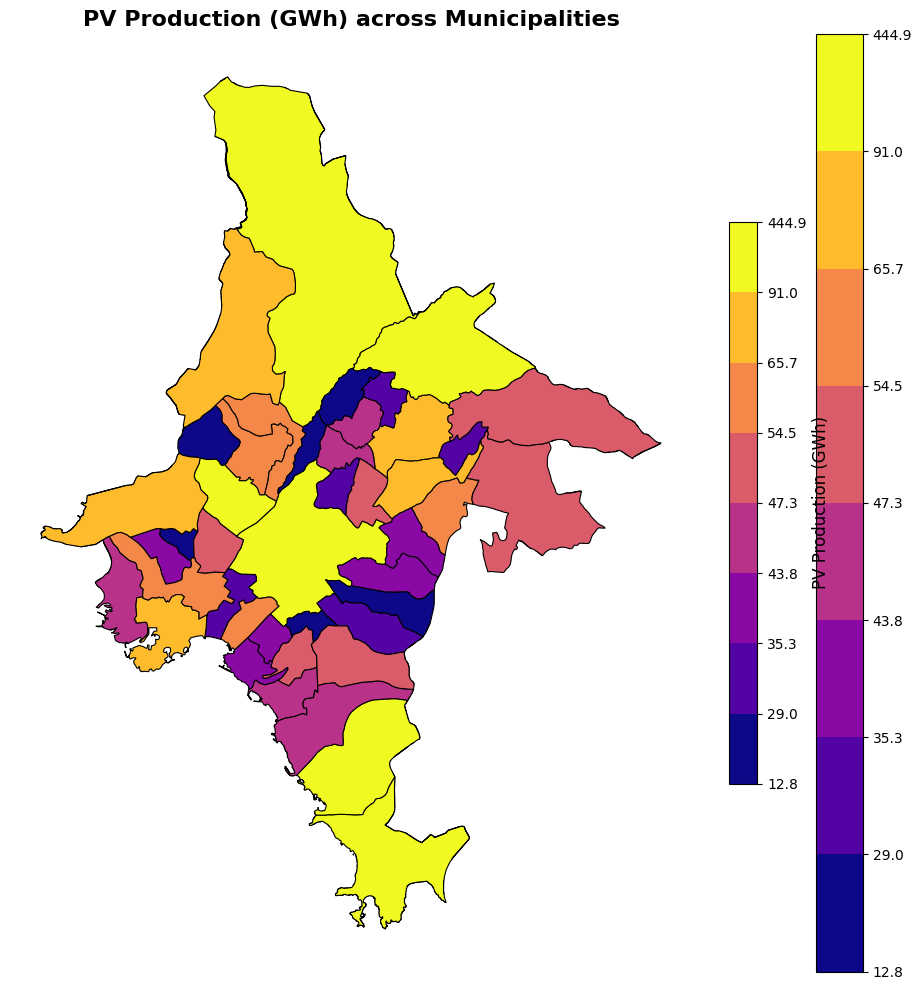

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import BoundaryNorm
import matplotlib.cm as cm

# === 1. Load shapefile ===
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"
gdf = gpd.read_file(shapefile_path).to_crs(epsg=4326)

# Ensure 'KWD_YPES' is of type int
gdf['KWD_YPES'] = gdf['KWD_YPES'].astype(int)

# === 2. Load data from Excel ===
df_path = "/content/drive/MyDrive/Athens.xlsx"
df = pd.read_excel(df_path, sheet_name="Final")

# Ensure 'KWD_YPES' is int for merging
df['KWD_YPES'] = df['KWD_YPES'].astype(int)

# === 3. Merge GeoDataFrame and DataFrame ===
merged = gdf.merge(df, on="KWD_YPES", how="left")

# === 4. Plot: PV Production across municipalities ===
fig, ax = plt.subplots(1, 1, figsize=(12, 10))

# Choose variable
col = "PV Production Gwh – Only BBE"

# Plot using plasma colormap with quantile bins
num_bins = 8
vmin = merged[col].min()
vmax = merged[col].max()
bounds = list(merged[col].quantile(q=np.linspace(0, 1, num_bins + 1)).values)
norm = BoundaryNorm(bounds, ncolors=256)

# Plot
merged.plot(
    column=col,
    cmap="plasma",
    linewidth=0.8,
    edgecolor="black",
    legend=True,
    norm=norm,
    ax=ax
)

# Titles and labels
ax.set_title("PV Production (GWh) across Municipalities", fontsize=16, fontweight='bold')
ax.axis("off")

# Add colorbar manually for better control
sm = plt.cm.ScalarMappable(cmap="plasma", norm=norm)
sm._A = []  # Dummy to prevent error
cbar = fig.colorbar(sm, ax=ax, fraction=0.03, pad=0.04)
cbar.set_label('PV Production (GWh)', fontsize=12)

plt.tight_layout()
plt.show()


/tmp/ipython-input-3181117012.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  plasma = cm.get_cmap("YlOrRd", len(bin_edges) - 1)  # discrete plasma shades


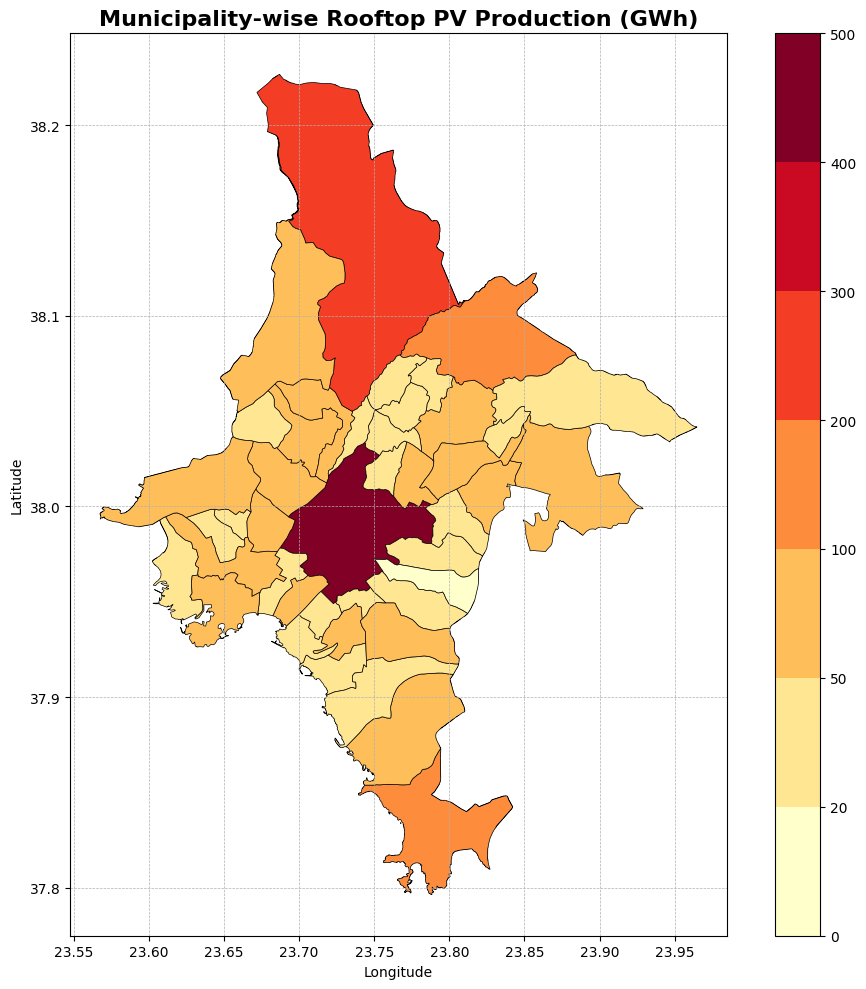

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.cm as cm

# --- Load shapefile ---
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"
gdf = gpd.read_file(shapefile_path).to_crs(epsg=4326)

# --- Load Excel data ---
excel_path = "/content/drive/MyDrive/Athens.xlsx"
df = pd.read_excel(excel_path, sheet_name='Final')

# --- Convert merge keys to same dtype ---
gdf["KWD_YPES"] = gdf["KWD_YPES"].astype(str)
df["KWD_YPES"] = df["KWD_YPES"].astype(str)

# --- Merge shapefile with PV data ---
gdf = gdf.merge(df[["KWD_YPES", "PV Production Gwh – Only BBE"]], on="KWD_YPES", how="left")

# --- Define discrete bins for PV Production (GWh) ---
bin_edges = [0, 20, 50, 100, 200, 300, 400, 500]  # you can customize
gdf["pv_bin"] = pd.cut(gdf["PV Production Gwh – Only BBE"], bins=bin_edges, labels=False)

# --- Create discrete plasma colormap ---
plasma = cm.get_cmap("YlOrRd", len(bin_edges) - 1)  # discrete plasma shades
cmap = ListedColormap([plasma(i) for i in range(plasma.N)])
norm = BoundaryNorm(bin_edges, cmap.N)

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 10))
gdf.plot(
    column="PV Production Gwh – Only BBE",
    cmap=cmap,
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    norm=norm,
    ax=ax,
)

# --- Aesthetics ---
plt.title("Municipality-wise Rooftop PV Production (GWh)", fontsize=16, fontweight="bold")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True, linestyle='--', linewidth=0.5)
plt.tight_layout()

plt.show()


In [ ]:
df.head()

,NAME,Περιφερειακή ενότητα,KWD_YPES,buildings,Area,Pop Dens,PV Production Gwh – Only BBE,BBE SC1_100 – Consumption GWh,Adequacy,Population,...,annual income per household,PCPP Index,CPP Index,Adequacy_Index,Area_bin,Population_bin,Pop Dens_bin,buildings_bin,Residents per building_bin,Energy cost per residents_bin
0,Dafni – Imittos,Κεντρική Αττική,9189,6040,2.4,14119.166670,28.438429,92.682110,0.306838,33886,...,32114,0.000839,0.002735,30.683838,2.40-3.92,31281.80-37230.40,14111.76-14906.10,5910.60-6492.60,5.34-5.91,250.22-272.01
1,Agia Varbara,Δυτική Αττική,9179,4908,2.4,11149.583330,26.721555,27.255805,0.980399,26759,...,28262,0.000999,0.001019,98.039870,2.40-3.92,26269.00-31281.80,10467.49-14111.76,4650.60-5910.60,5.34-5.91,101.30-195.42
2,Nea Smyrni,Νότια Αττική,9200,5895,3.5,20815.142860,38.941916,253.013508,0.153912,72853,...,31011,0.000535,0.003473,15.391240,2.40-3.92,72239.20-81243.20,14906.10-20815.14,4650.60-5910.60,11.82-15.38,321.13-349.60
3,Filadelphia,Κεντρική Αττική,9193,3824,3.7,9448.108108,25.052255,87.689008,0.285694,34958,...,31634,0.000717,0.002508,28.569436,2.40-3.92,31281.80-37230.40,9074.15-10467.49,2214.00-4042.80,9.03-9.44,238.83-250.22
4,Vrilissia,Βόρεια Αττική,9169,3595,3.9,8312.051282,33.345475,93.125557,0.358070,32417,...,29857,0.001029,0.002873,35.807008,2.40-3.92,31281.80-37230.40,8220.47-9074.15,2214.00-4042.80,7.66-9.03,272.01-288.38


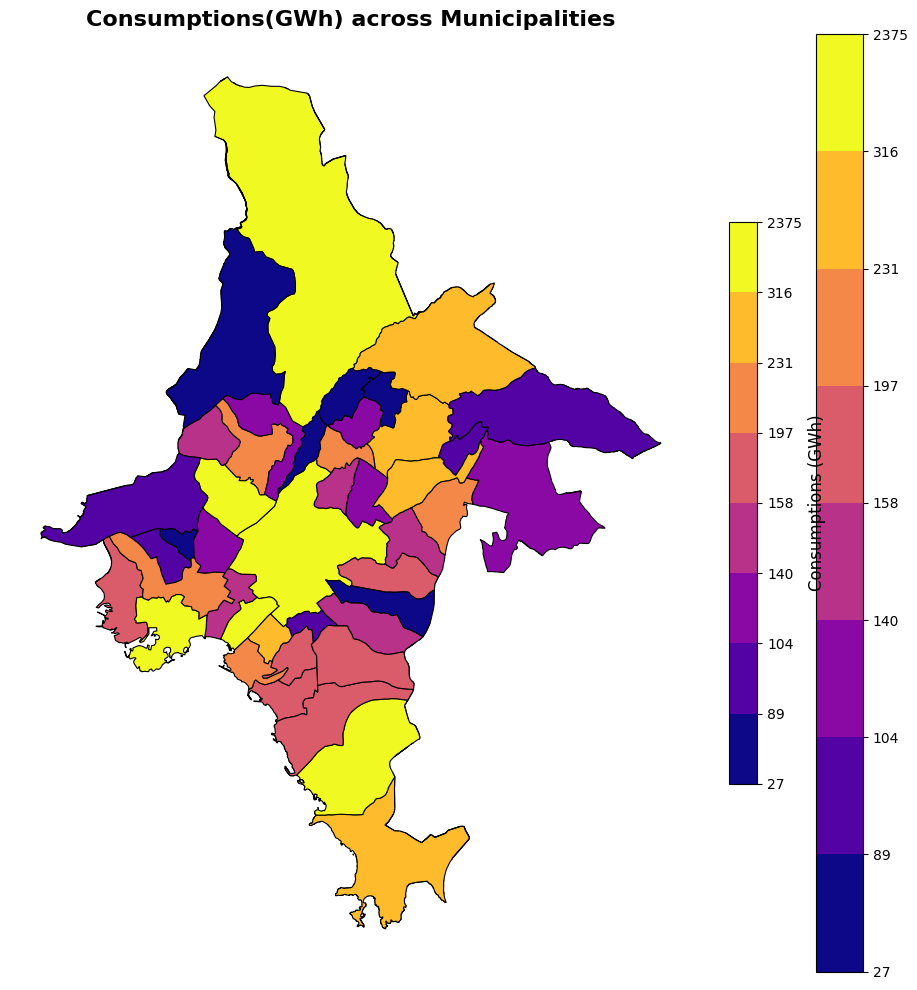

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import BoundaryNorm
import matplotlib.cm as cm

# === 1. Load shapefile ===
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"
gdf = gpd.read_file(shapefile_path).to_crs(epsg=4326)

# Ensure 'KWD_YPES' is of type int
gdf['KWD_YPES'] = gdf['KWD_YPES'].astype(int)

# === 2. Load data from Excel ===
df_path = "/content/drive/MyDrive/Athens.xlsx"
df = pd.read_excel(df_path, sheet_name="Final")

# Ensure 'KWD_YPES' is int for merging
df['KWD_YPES'] = df['KWD_YPES'].astype(int)

# === 3. Merge GeoDataFrame and DataFrame ===
merged = gdf.merge(df, on="KWD_YPES", how="left")

# === 4. Plot: PV Production across municipalities ===
fig, ax = plt.subplots(1, 1, figsize=(12, 10))

# Choose variable
col = "BBE SC1_100 – Consumption GWh"

# Plot using plasma colormap with quantile bins
num_bins = 8
vmin = merged[col].min()
vmax = merged[col].max()
bounds = list(merged[col].quantile(q=np.linspace(0, 1, num_bins + 1)).values)
norm = BoundaryNorm(bounds, ncolors=256)

# Plot
merged.plot(
    column=col,
    cmap="plasma",
    linewidth=0.8,
    edgecolor="black",
    legend=True,
    norm=norm,
    ax=ax
)

# Titles and labels
ax.set_title("Consumptions(GWh) across Municipalities", fontsize=16, fontweight='bold')
ax.axis("off")

# Add colorbar manually for better control
sm = plt.cm.ScalarMappable(cmap="plasma", norm=norm)
sm._A = []  # Dummy to prevent error
cbar = fig.colorbar(sm, ax=ax, fraction=0.03, pad=0.04)
cbar.set_label('Consumptions (GWh)', fontsize=12)

plt.tight_layout()
plt.show()


/tmp/ipython-input-2619493543.py:33: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  plasma = cm.get_cmap("plasma", n_bins)


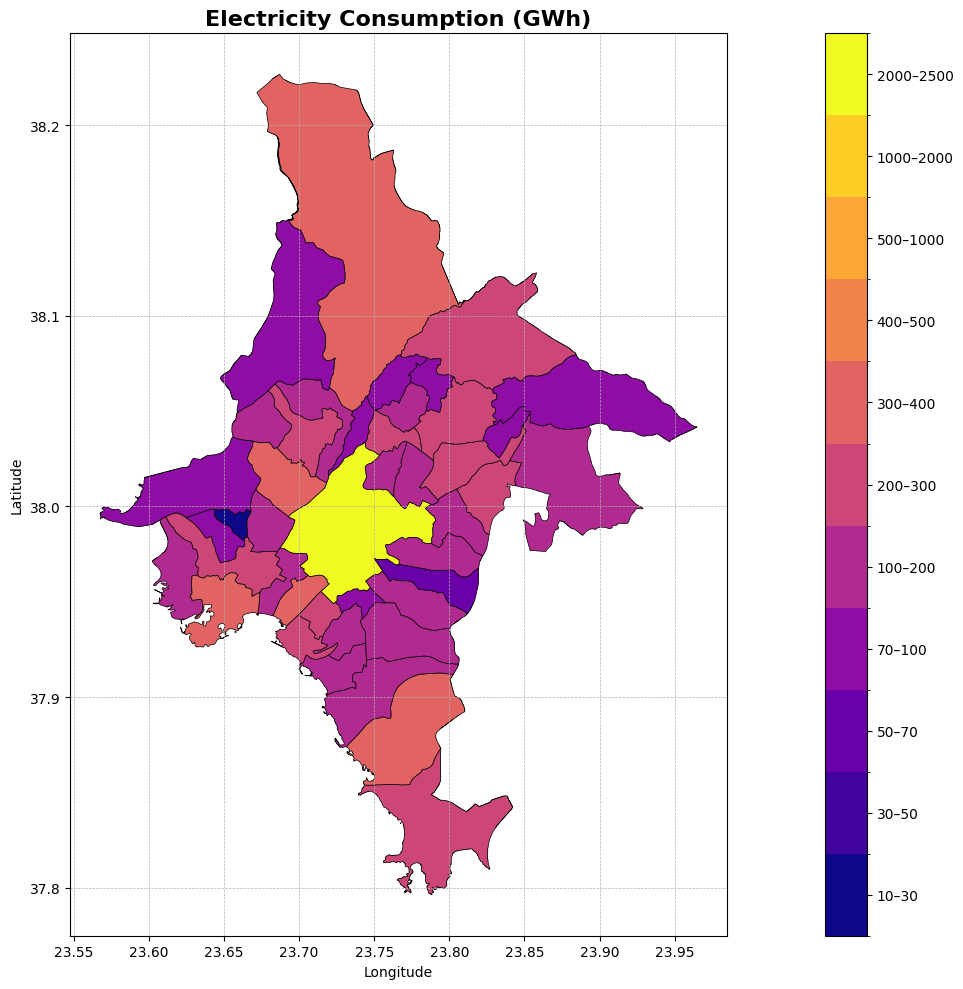

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.cm as cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colorbar as cbar
import numpy as np

# --- Load shapefile ---
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"
gdf = gpd.read_file(shapefile_path).to_crs(epsg=4326)

# --- Load Excel data ---
excel_path = "/content/drive/MyDrive/Athens.xlsx"
df = pd.read_excel(excel_path, sheet_name='Final')

# --- Convert merge keys to same dtype ---
gdf["KWD_YPES"] = gdf["KWD_YPES"].astype(str)
df["KWD_YPES"] = df["KWD_YPES"].astype(str)

# --- Merge ---
gdf = gdf.merge(df[["KWD_YPES", "BBE SC1_100 – Consumption GWh"]], on="KWD_YPES", how="left")

# --- Define custom (uneven) bin edges ---
bin_edges = [10, 30, 50, 70, 100, 200, 300, 400, 500, 1000, 2000, 2500]
n_bins = len(bin_edges) - 1

# --- Assign bin index to each municipality ---
gdf["consumption_bin"] = pd.cut(gdf["BBE SC1_100 – Consumption GWh"], bins=bin_edges, labels=False)

# --- Create a colormap with discrete colors ---
plasma = cm.get_cmap("plasma", n_bins)
cmap = ListedColormap([plasma(i) for i in range(n_bins)])
norm = BoundaryNorm(np.arange(n_bins + 1), n_bins)

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 10))

gdf.plot(
    column="consumption_bin",
    cmap=cmap,
    linewidth=0.5,
    edgecolor="black",
    norm=norm,
    ax=ax,
)

# --- Create custom colorbar with uniform bins but custom labels ---
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

cb = cbar.ColorbarBase(
    cax,
    cmap=cmap,
    norm=norm,
    boundaries=np.arange(n_bins + 1),
    ticks=np.arange(n_bins) + 0.5,  # center ticks
    spacing="uniform",
    orientation="vertical"
)

# Set bin labels (as ranges)
bin_labels = [f"{bin_edges[i]}–{bin_edges[i+1]}" for i in range(n_bins)]
cb.ax.set_yticklabels(bin_labels)
#cb.set_label("Electricity Consumption (GWh)", fontsize=12, weight="bold")
cb.ax.tick_params(labelsize=10)

# --- Aesthetics ---
ax.set_title("Electricity Consumption (GWh)", fontsize=16, fontweight="bold")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.grid(True, linestyle="--", linewidth=0.5)

plt.tight_layout()
plt.show()


In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household'],
      dtype='object')

In [ ]:
df["Adequacy"]

,Adequacy
0,0.306838
1,0.980399
2,0.153912
3,0.285694
4,0.358070
5,0.214007
6,0.390152
7,0.225735
8,0.417247
9,0.232637


/tmp/ipython-input-1203422352.py:43: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap("YlGn", n_bins)


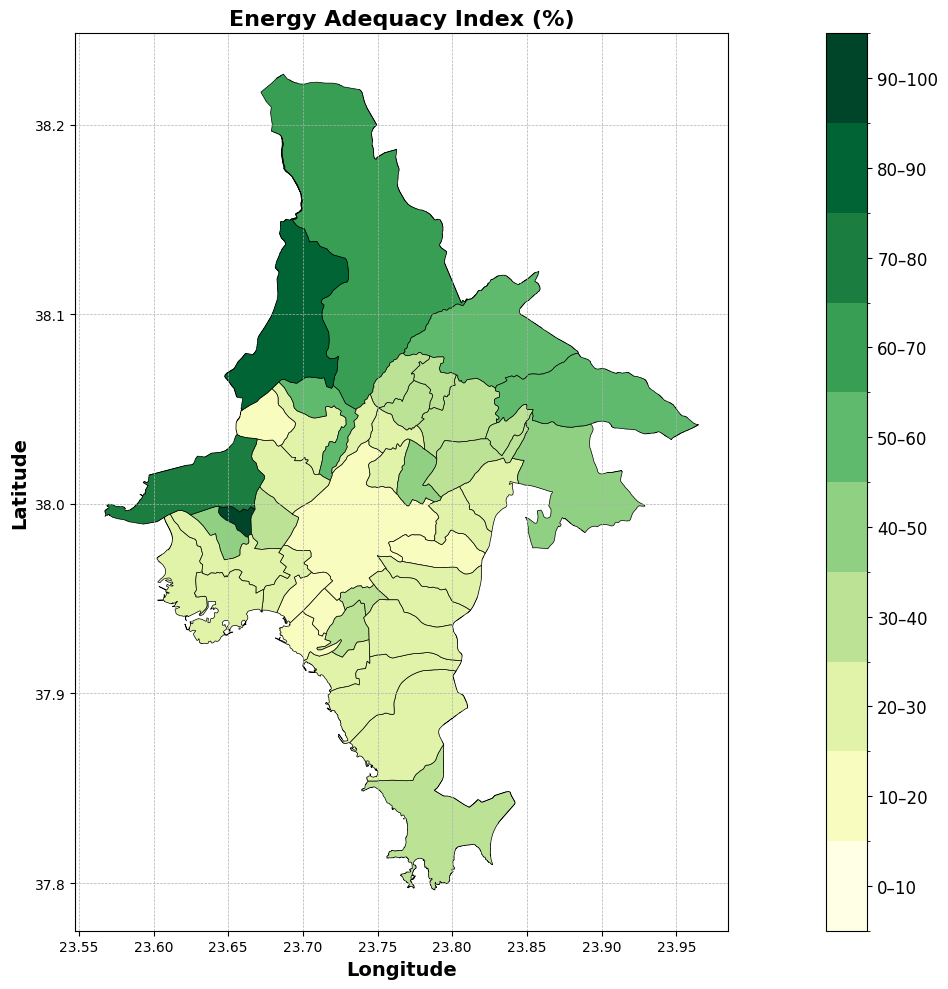

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib import cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colorbar as cbar
import numpy as np

# ================================
# Load and Prepare Data
# ================================

# --- Paths ---
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"
excel_path = "/content/drive/MyDrive/Athens.xlsx"

# --- Load shapefile and Excel ---
gdf = gpd.read_file(shapefile_path).to_crs(epsg=4326)
df = pd.read_excel(excel_path, sheet_name='Final')

# --- Ensure merge keys are strings ---
gdf["KWD_YPES"] = gdf["KWD_YPES"].astype(str)
df["KWD_YPES"] = df["KWD_YPES"].astype(str)

# --- Merge Adequacy column ---

gdf = gdf.merge(df[["KWD_YPES", "Adequacy"]], on="KWD_YPES", how="left")
gdf["Adequacy"] = gdf["Adequacy"].fillna(0) * 100  # Convert to percentage

# ================================
# Define Bin Settings and Colormap
# ================================

# --- Adequacy from 0 to 100 with 10 gaps ---
bin_edges = list(range(0, 110, 10))  # [0, 10, 20, ..., 100]
n_bins = len(bin_edges) - 1

# --- Assign bin index for plotting ---
gdf["adequacy_bin"] = pd.cut(gdf["Adequacy"], bins=bin_edges, labels=False)

# --- Colormap (e.g., "YlGn") ---
colormap = cm.get_cmap("YlGn", n_bins)
cmap = ListedColormap([colormap(i) for i in range(n_bins)])
norm = BoundaryNorm(np.arange(n_bins + 1), n_bins)

# ================================
# Plot
# ================================

fig, ax = plt.subplots(figsize=(10, 10))

gdf.plot(
    column="adequacy_bin",
    cmap=cmap,
    linewidth=0.5,
    edgecolor="black",
    norm=norm,
    ax=ax,
)

# --- Custom colorbar ---
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

cb = cbar.ColorbarBase(
    cax,
    cmap=cmap,
    norm=norm,
    boundaries=np.arange(n_bins + 1),
    ticks=np.arange(n_bins) + 0.5,
    spacing="uniform",
    orientation="vertical"
)

# --- Bin labels for colorbar ---
bin_labels = [f"{bin_edges[i]}–{bin_edges[i+1]}" for i in range(n_bins)]
cb.ax.set_yticklabels(bin_labels)
cb.ax.tick_params(labelsize=12)
#cb.set_label("Adequacy (%)", fontsize=12, weight="bold")

# ================================
# Aesthetics
# ================================

ax.set_title("Energy Adequacy Index (%)", fontsize=16, fontweight="bold")
ax.set_xlabel("Longitude", fontsize=14, fontweight="bold")
ax.set_ylabel("Latitude", fontsize=14, fontweight="bold")
ax.grid(True, linestyle="--", linewidth=0.5)

plt.tight_layout()
plt.show()


/tmp/ipython-input-3418029639.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  plasma = cm.get_cmap("plasma", len(bin_edges) - 1)


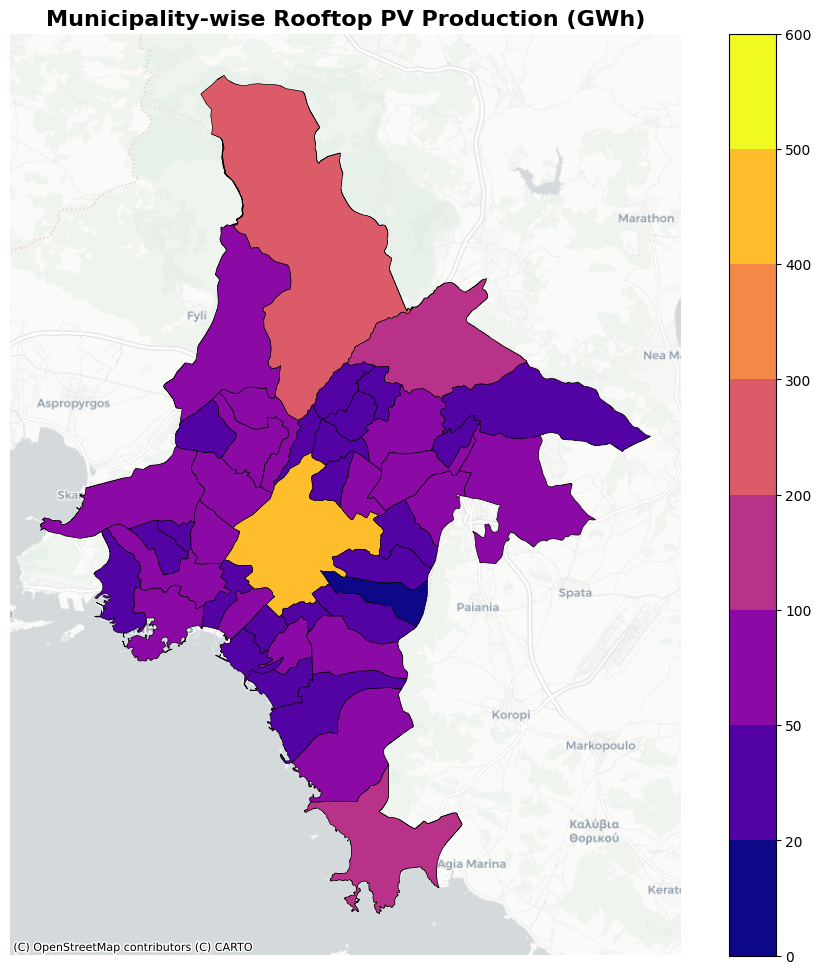

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.cm as cm
import contextily as cx

# --- Load shapefile ---
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"
gdf = gpd.read_file(shapefile_path).to_crs(epsg=4326)

# --- Load Excel data ---
excel_path = "/content/drive/MyDrive/Athens.xlsx"
df = pd.read_excel(excel_path, sheet_name='Final')

# --- Convert merge keys to same dtype ---
gdf["KWD_YPES"] = gdf["KWD_YPES"].astype(str)
df["KWD_YPES"] = df["KWD_YPES"].astype(str)

# --- Merge shapefile with PV data ---
gdf = gdf.merge(df[["KWD_YPES", "PV Production Gwh – Only BBE"]], on="KWD_YPES", how="left")

# --- Define discrete bins for PV Production (GWh) ---
bin_edges = [0, 20, 50, 100, 200, 300, 400, 500, 600]
gdf["pv_bin"] = pd.cut(gdf["PV Production Gwh – Only BBE"], bins=bin_edges, labels=False)

# --- Create discrete plasma colormap ---
plasma = cm.get_cmap("plasma", len(bin_edges) - 1)
cmap = ListedColormap([plasma(i) for i in range(plasma.N)])
norm = BoundaryNorm(bin_edges, cmap.N)

# --- Reproject for contextily basemap (Web Mercator: EPSG 3857) ---
gdf = gdf.to_crs(epsg=3857)

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 10))
gdf.plot(
    column="PV Production Gwh – Only BBE",
    cmap=cmap,
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    norm=norm,
    ax=ax,
)

# --- Add basemap ---
cx.add_basemap(ax, source=cx.providers.CartoDB.Positron, zoom=11)

# --- Aesthetics ---
ax.set_title("Municipality-wise Rooftop PV Production (GWh)", fontsize=16, fontweight="bold")
ax.set_axis_off()
plt.tight_layout()
plt.show()


/tmp/ipython-input-2472175167.py:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


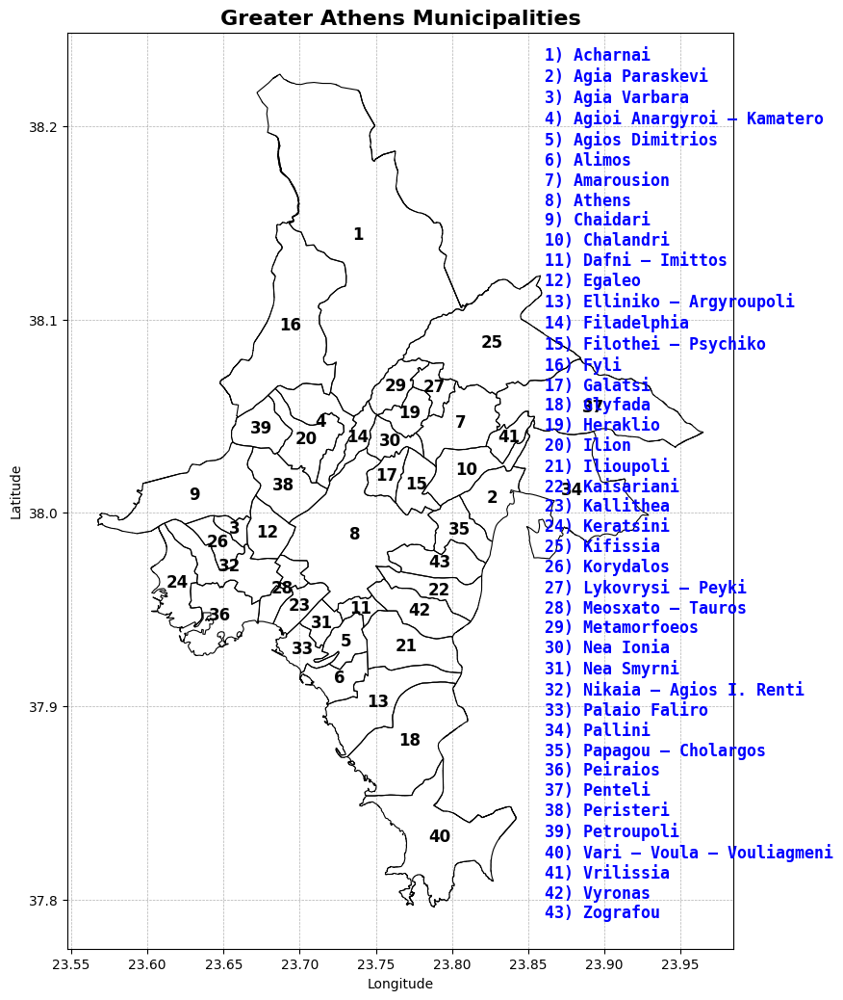

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

# --- Load shapefile ---
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"
gdf = gpd.read_file(shapefile_path).to_crs(epsg=4326)

# --- Sort by municipality name alphabetically ---
gdf = gdf.sort_values("NAME").reset_index(drop=True)

# --- Add Serial Number column based on NAME ---
gdf["Serial"] = gdf.index + 1  # 1-based indexing

# --- Plot the map with serial numbers ---
fig, ax = plt.subplots(figsize=(10, 10))
gdf.boundary.plot(ax=ax, linewidth=0.8, color='black')

# --- Add serial numbers at centroid ---
for _, row in gdf.iterrows():
    x, y = row.geometry.centroid.coords[0]
    ax.text(x, y, str(row["Serial"]), fontsize=12, ha="center", va="center", weight='bold')

# --- Create side legend with serial + municipality name ---
legend_labels = [f"{row['Serial']}) {row['NAME']}" for _, row in gdf.iterrows()]
legend_text = "\n".join(legend_labels)

# Add second axis for legend
fig.subplots_adjust(right=0.65)
ax_legend = fig.add_axes([0.68, 0.17, 0.3, 0.8])
ax_legend.axis("off")
ax_legend.text(0, 1, legend_text, va="top",  fontsize=12, fontweight="bold", color= 'blue', family="monospace")

# --- Aesthetics ---
ax.set_title("Greater Athens Municipalities", fontsize=16, fontweight='bold')
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.grid(True, linestyle="--", linewidth=0.5)

plt.tight_layout()
plt.show()


In [ ]:
# path to greek shapefile: /content/drive/MyDrive/Greece_shapefile/gr_1km.shp

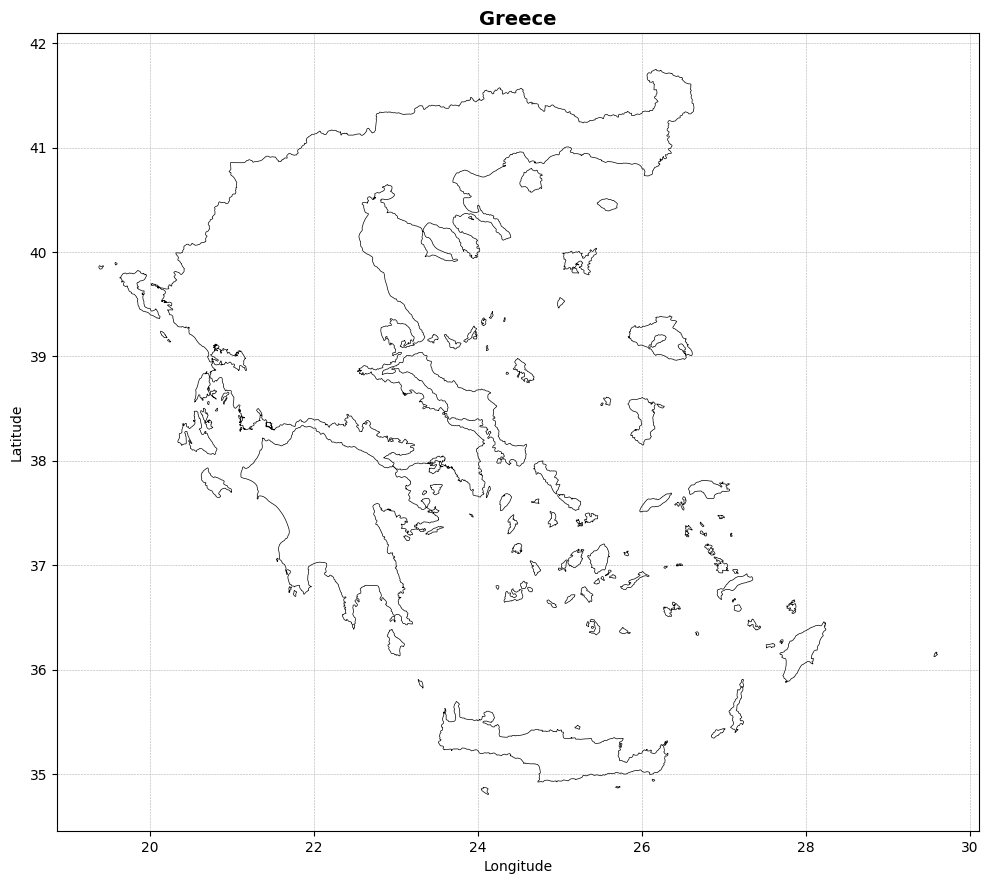

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

# --- Load Greece shapefile ---
shapefile_path = "/content/drive/MyDrive/Greece_shapefile/greece_Greece_Country_Boundary.shp"
greece_gdf = gpd.read_file(shapefile_path)

# --- Reproject to WGS84 if not already ---
greece_gdf = greece_gdf.to_crs(epsg=4326)

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 10))
greece_gdf.boundary.plot(ax=ax, color="black", linewidth=0.5)

# --- Aesthetics ---
ax.set_title("Greece", fontsize=14, fontweight="bold")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.grid(True, linestyle="--", linewidth=0.4)

plt.tight_layout()
plt.show()


/tmp/ipython-input-3407462483.py:26: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend(loc="lower right")


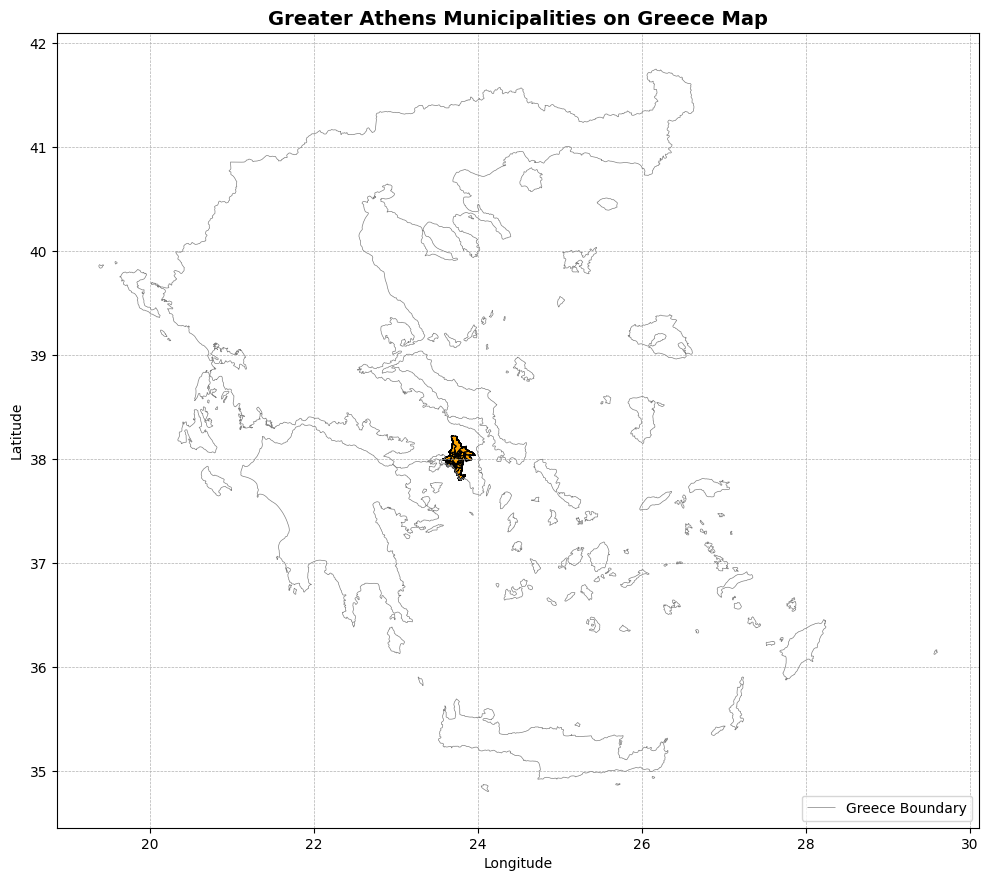

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

# --- File paths ---
greece_path = "/content/drive/MyDrive/Greece_shapefile/greece_Greece_Country_Boundary.shp"
athens_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"

# --- Load shapefiles ---
greece = gpd.read_file(greece_path).to_crs(epsg=4326)
athens = gpd.read_file(athens_path).to_crs(epsg=4326)

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 10))

# Plot Greece background (as boundary only)
greece.boundary.plot(ax=ax, color="gray", linewidth=0.5, label="Greece Boundary")

# Plot Athens municipalities (filled)
athens.plot(ax=ax, color="orange", edgecolor="black", linewidth=0.8, label="Athens Municipalities")

# --- Aesthetics ---
ax.set_title("Greater Athens Municipalities on Greece Map", fontsize=14, fontweight='bold')
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.grid(True, linestyle="--", linewidth=0.5)
ax.legend(loc="lower right")

plt.tight_layout()
plt.show()


In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import FancyArrowPatch

attica_path = "/content/drive/MyDrive/Greece_shapefile/greece_Region_level_2.shp"
gdf = gpd.read_file(attica_path).to_crs(epsg=4326)

gdf.head()

,shape2,shapeiso,shapeid,shapegroup,shapetype,gid,shape1,shape0,geometry
0,Anatolikis Makedonias kai Thr*,None,26713481B84884565940454,GRC,ADM2,1,Macedonia-Thrace,greece,"MULTIPOLYGON (((23.86775 40.77873, 23.87308 40..."
1,Kentrikis Makedonias,None,26713481B13719921321351,GRC,ADM2,2,Macedonia-Thrace,greece,"MULTIPOLYGON (((23.62406 41.37654, 23.62752 41..."
2,Dytikis Makedonias,None,26713481B79624114853188,GRC,ADM2,3,Epirus-Western Macedonia,greece,"POLYGON ((21.7872 40.93112, 21.79782 40.92451,..."
3,Ipeiroy,None,26713481B784345685192,GRC,ADM2,4,Epirus-Western Macedonia,greece,"POLYGON ((20.77509 40.35025, 20.79035 40.34136..."
4,Thessalias,None,26713481B23289270995723,GRC,ADM2,5,Thessalia-Central Greece,greece,"MULTIPOLYGON (((22.11521 40.18995, 22.12334 40..."


In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import FancyArrowPatch

attica_path = "/content/drive/MyDrive/Greece_shapefile/greece_Region_level_2.shp"
gdff = gpd.read_file(attica_path).to_crs(epsg=4326)

gdff.head()

,shape2,shapeiso,shapeid,shapegroup,shapetype,gid,shape1,shape0,geometry
0,Anatolikis Makedonias kai Thr*,None,26713481B84884565940454,GRC,ADM2,1,Macedonia-Thrace,greece,"MULTIPOLYGON (((23.86775 40.77873, 23.87308 40..."
1,Kentrikis Makedonias,None,26713481B13719921321351,GRC,ADM2,2,Macedonia-Thrace,greece,"MULTIPOLYGON (((23.62406 41.37654, 23.62752 41..."
2,Dytikis Makedonias,None,26713481B79624114853188,GRC,ADM2,3,Epirus-Western Macedonia,greece,"POLYGON ((21.7872 40.93112, 21.79782 40.92451,..."
3,Ipeiroy,None,26713481B784345685192,GRC,ADM2,4,Epirus-Western Macedonia,greece,"POLYGON ((20.77509 40.35025, 20.79035 40.34136..."
4,Thessalias,None,26713481B23289270995723,GRC,ADM2,5,Thessalia-Central Greece,greece,"MULTIPOLYGON (((22.11521 40.18995, 22.12334 40..."


/tmp/ipython-input-3562837120.py:54: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


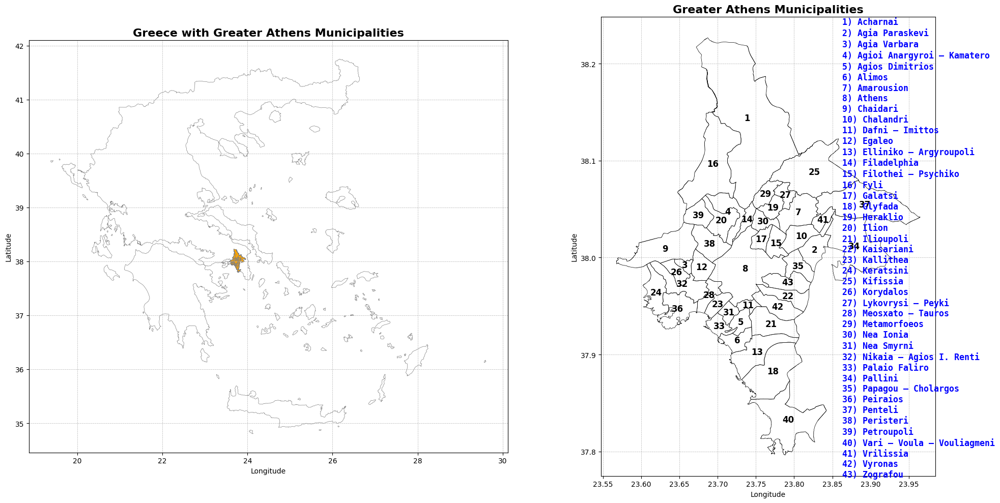

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import FancyArrowPatch

# --- Load shapefiles ---
greece_path = "/content/drive/MyDrive/Greece_shapefile/greece_Greece_Country_Boundary.shp"
athens_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"
attica_path = "/content/drive/MyDrive/Greece_shapefile/greece_Region_level_2.shp"

greece = gpd.read_file(greece_path).to_crs(epsg=4326)
gdf = gpd.read_file(athens_path).to_crs(epsg=4326)


# --- Sort municipalities alphabetically and add serial numbers ---
gdf = gdf.sort_values("NAME").reset_index(drop=True)
gdf["Serial"] = gdf.index + 1Usaully


# --- Create panel plot ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

# --- Left: Greece map with Athens highlighted ---
greece.boundary.plot(ax=ax1, color="gray", linewidth=0.5)
gdf.plot(ax=ax1, color="orange", edgecolor="gray", linewidth=0.5)

ax1.set_title("Greece with Greater Athens Municipalities", fontsize=16, fontweight='bold')
ax1.set_xlabel("Longitude")
ax1.set_ylabel("Latitude")
ax1.grid(True, linestyle="--", linewidth=0.5)


# --- Right: Detailed Athens map with serials ---
gdf.boundary.plot(ax=ax2, color="black", linewidth=0.5)

# Add serial number text
for _, row in gdf.iterrows():
    x, y = row.geometry.centroid.coords[0]
    ax2.text(x, y, str(row["Serial"]), fontsize=12, ha="center", va="center", weight='bold')

# Side legend with names
legend_labels = [f"{row['Serial']}) {row['NAME']}" for _, row in gdf.iterrows()]
legend_text = "\n".join(legend_labels)
fig.subplots_adjust(right=0.82)
ax_legend = fig.add_axes([0.83, 0.21, 0.15, 0.75])
ax_legend.axis("off")
ax_legend.text(0, 1, legend_text, va="top", fontsize=12, fontweight="bold", color="blue", family="monospace")

# Aesthetics
ax2.set_title("Greater Athens Municipalities", fontsize=16, fontweight='bold')
ax2.set_xlabel("Longitude")
ax2.set_ylabel("Latitude")
ax2.grid(True, linestyle="--", linewidth=0.5)

plt.tight_layout()
plt.show()


/tmp/ipython-input-4143394984.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-4143394984.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-4143394984.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-4143394984.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


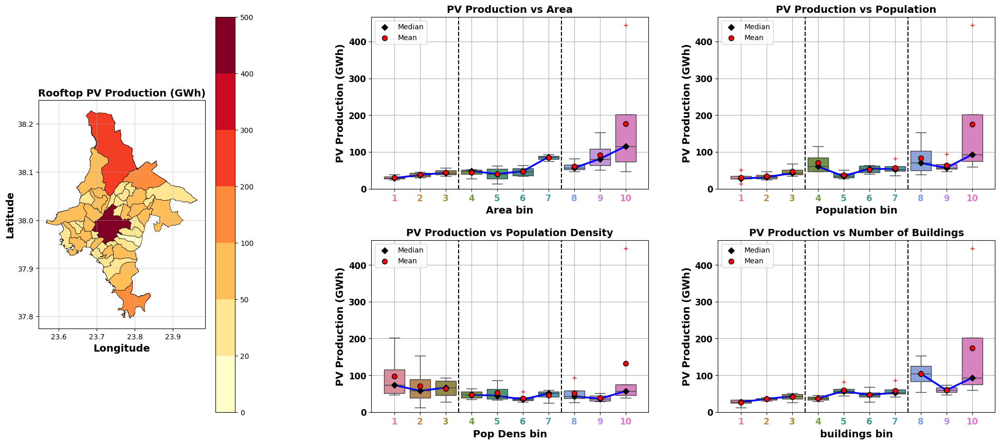

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib import colormaps

# ================================
# Load and Prepare Data
# ================================

# --- Paths ---
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"
excel_path = "/content/drive/MyDrive/Athens.xlsx"

# --- Load shapefile ---
gdf = gpd.read_file(shapefile_path).to_crs(epsg=4326)

# --- Load Excel data ---
df = pd.read_excel(excel_path, sheet_name='Final')

# --- Ensure merge keys are strings ---
gdf["KWD_YPES"] = gdf["KWD_YPES"].astype(str)
df["KWD_YPES"] = df["KWD_YPES"].astype(str)

# --- Merge PV production info ---
gdf = gdf.merge(df[["KWD_YPES", "PV Production Gwh – Only BBE"]], on="KWD_YPES", how="left")

# --- Add binned columns for boxplots ---
num_bins = 10
df['Area_bin'] = pd.qcut(df['Area'], q=num_bins, labels=False)
df['Population_bin'] = pd.qcut(df['Population'], q=num_bins, labels=False)
df['Pop Dens_bin'] = pd.qcut(df['Pop Dens'], q=num_bins, labels=False)
df['buildings_bin'] = pd.qcut(df['buildings'], q=num_bins, labels=False)

# ================================
# Define Figure 2: Boxplot Function
# ================================

cmap_box = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

def plot_colored_boxplot_lined_panel(df, feature_bin, title, ax):
    palette = cmap_box.colors[:len(df[feature_bin].unique())]
    sns.boxplot(
        x=feature_bin,
        y='PV Production Gwh – Only BBE',
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    bin_medians = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].median()
    bin_means = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].mean()
    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    draw_segments([0, 1, 2])
    draw_segments([3, 4, 5, 6])
    draw_segments([7, 8, 9])

    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel('PV Production (GWh)', fontsize=14, fontweight='bold')
    ax.set_xticks(x_vals)
    ax.set_xticklabels([str(i + 1) for i in x_vals], fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        label.set_color(palette[i])

    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    ax.set_ylim(0, df['PV Production Gwh – Only BBE'].max() * 1.05)
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')
    ax.grid(True)
    ax.legend(loc='upper left')

# ================================
# Combine Figure 1 (Map) + Figure 2 (Boxplots)
# ================================

# --- Colormap for Figure 1 ---
bin_edges = [0, 20, 50, 100, 200, 300, 400, 500]
gdf["pv_bin"] = pd.cut(gdf["PV Production Gwh – Only BBE"], bins=bin_edges, labels=False)
plasma = colormaps.get_cmap("YlOrRd").resampled(len(bin_edges) - 1)
cmap_map = ListedColormap([plasma(i) for i in range(plasma.N)])
norm = BoundaryNorm(bin_edges, cmap_map.N)

# --- Create layout: 1 row, 2 columns (map on left, boxplots on right) ---
fig = plt.figure(figsize=(24, 10))
gs = fig.add_gridspec(1, 2, width_ratios=[1, 3], wspace=0.3)

# --- Left: Map ---
ax0 = fig.add_subplot(gs[0])
gdf.plot(
    column="PV Production Gwh – Only BBE",
    cmap=cmap_map,
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    norm=norm,
    ax=ax0,
)
ax0.set_title("Rooftop PV Production (GWh)", fontsize=14, fontweight="bold")
ax0.set_xlabel("Longitude",fontsize=14, fontweight="bold")
ax0.set_ylabel("Latitude",fontsize=14, fontweight="bold")
ax0.grid(True, linestyle='--', linewidth=0.5)

# --- Right: Panel of 4 boxplots ---
gs_right = gs[1].subgridspec(2, 2, hspace=0.3, wspace=0.25)
ax1 = fig.add_subplot(gs_right[0, 0])
ax2 = fig.add_subplot(gs_right[0, 1])
ax3 = fig.add_subplot(gs_right[1, 0])
ax4 = fig.add_subplot(gs_right[1, 1])

plot_colored_boxplot_lined_panel(df, 'Area_bin', 'PV Production vs Area', ax1)
plot_colored_boxplot_lined_panel(df, 'Population_bin', 'PV Production vs Population', ax2)
plot_colored_boxplot_lined_panel(df, 'Pop Dens_bin', 'PV Production vs Population Density', ax3)
plot_colored_boxplot_lined_panel(df, 'buildings_bin', 'PV Production vs Number of Buildings', ax4)

#plt.suptitle("Figure 2: PV Production (GWh) by Urban Features (Binned)", fontsize=16, fontweight='bold')
plt.show()


/tmp/ipython-input-4143394984.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-4143394984.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-4143394984.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-4143394984.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


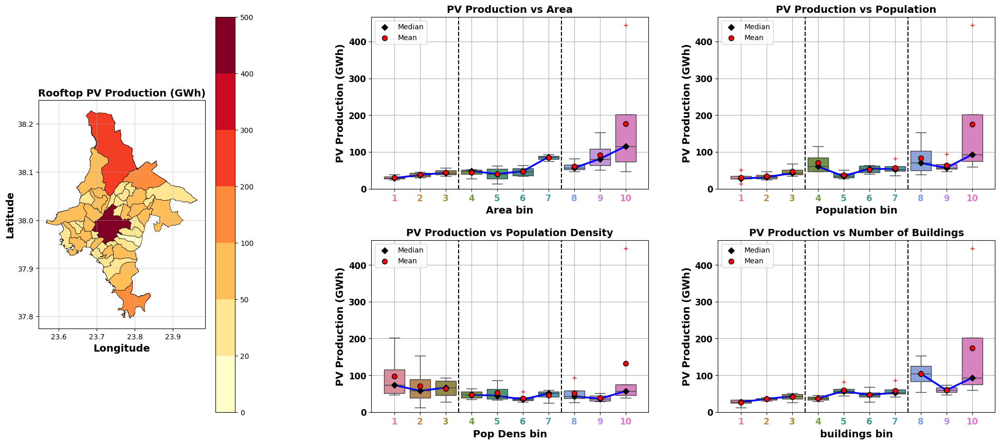

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib import colormaps

# ================================
# Load and Prepare Data
# ================================

# --- Paths ---
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"
excel_path = "/content/drive/MyDrive/Athens.xlsx"

# --- Load shapefile ---
gdf = gpd.read_file(shapefile_path).to_crs(epsg=4326)

# --- Load Excel data ---
df = pd.read_excel(excel_path, sheet_name='Final')

# --- Ensure merge keys are strings ---
gdf["KWD_YPES"] = gdf["KWD_YPES"].astype(str)
df["KWD_YPES"] = df["KWD_YPES"].astype(str)

# --- Merge PV production info ---
gdf = gdf.merge(df[["KWD_YPES", "PV Production Gwh – Only BBE"]], on="KWD_YPES", how="left")

# --- Add binned columns for boxplots ---
num_bins = 10
df['Area_bin'] = pd.qcut(df['Area'], q=num_bins, labels=False)
df['Population_bin'] = pd.qcut(df['Population'], q=num_bins, labels=False)
df['Pop Dens_bin'] = pd.qcut(df['Pop Dens'], q=num_bins, labels=False)
df['buildings_bin'] = pd.qcut(df['buildings'], q=num_bins, labels=False)

# ================================
# Define Figure 2: Boxplot Function
# ================================

cmap_box = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

def plot_colored_boxplot_lined_panel(df, feature_bin, title, ax):
    palette = cmap_box.colors[:len(df[feature_bin].unique())]
    sns.boxplot(
        x=feature_bin,
        y='PV Production Gwh – Only BBE',
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    bin_medians = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].median()
    bin_means = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].mean()
    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    draw_segments([0, 1, 2])
    draw_segments([3, 4, 5, 6])
    draw_segments([7, 8, 9])

    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel('PV Production (GWh)', fontsize=14, fontweight='bold')
    ax.set_xticks(x_vals)
    ax.set_xticklabels([str(i + 1) for i in x_vals], fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        label.set_color(palette[i])

    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    ax.set_ylim(0, df['PV Production Gwh – Only BBE'].max() * 1.05)
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')
    ax.grid(True)
    ax.legend(loc='upper left')

# ================================
# Combine Figure 1 (Map) + Figure 2 (Boxplots)
# ================================

# --- Colormap for Figure 1 ---
bin_edges = [0, 20, 50, 100, 200, 300, 400, 500]
gdf["pv_bin"] = pd.cut(gdf["PV Production Gwh – Only BBE"], bins=bin_edges, labels=False)
plasma = colormaps.get_cmap("YlOrRd").resampled(len(bin_edges) - 1)
cmap_map = ListedColormap([plasma(i) for i in range(plasma.N)])
norm = BoundaryNorm(bin_edges, cmap_map.N)

# --- Create layout: 1 row, 2 columns (map on left, boxplots on right) ---
fig = plt.figure(figsize=(24, 10))
gs = fig.add_gridspec(1, 2, width_ratios=[1, 3], wspace=0.3)

# --- Left: Map ---
ax0 = fig.add_subplot(gs[0])
gdf.plot(
    column="PV Production Gwh – Only BBE",
    cmap=cmap_map,
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    norm=norm,
    ax=ax0,
)
ax0.set_title("Rooftop PV Production (GWh)", fontsize=14, fontweight="bold")
ax0.set_xlabel("Longitude",fontsize=14, fontweight="bold")
ax0.set_ylabel("Latitude",fontsize=14, fontweight="bold")
ax0.grid(True, linestyle='--', linewidth=0.5)

# --- Right: Panel of 4 boxplots ---
gs_right = gs[1].subgridspec(2, 2, hspace=0.3, wspace=0.25)
ax1 = fig.add_subplot(gs_right[0, 0])
ax2 = fig.add_subplot(gs_right[0, 1])
ax3 = fig.add_subplot(gs_right[1, 0])
ax4 = fig.add_subplot(gs_right[1, 1])

plot_colored_boxplot_lined_panel(df, 'Area_bin', 'PV Production vs Area', ax1)
plot_colored_boxplot_lined_panel(df, 'Population_bin', 'PV Production vs Population', ax2)
plot_colored_boxplot_lined_panel(df, 'Pop Dens_bin', 'PV Production vs Population Density', ax3)
plot_colored_boxplot_lined_panel(df, 'buildings_bin', 'PV Production vs Number of Buildings', ax4)

#plt.suptitle("Figure 2: PV Production (GWh) by Urban Features (Binned)", fontsize=16, fontweight='bold')
plt.show()


/tmp/ipython-input-41126140.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-41126140.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-41126140.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-41126140.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


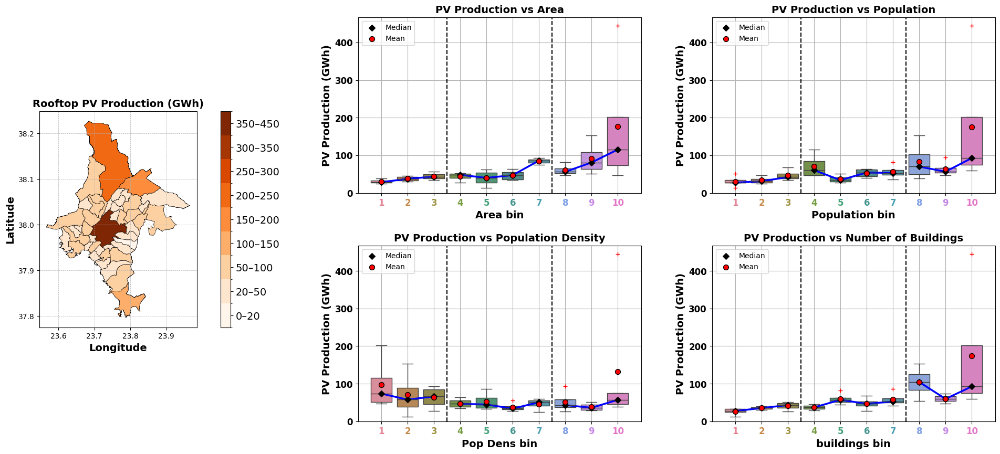

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib import colormaps
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colorbar as cbar
import numpy as np

# ================================
# Load and Prepare Data
# ================================

# --- Paths ---
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"
excel_path = "/content/drive/MyDrive/Athens.xlsx"

# --- Load shapefile ---
gdf = gpd.read_file(shapefile_path).to_crs(epsg=4326)

# --- Load Excel data ---
df = pd.read_excel(excel_path, sheet_name='Final')

# --- Ensure merge keys are strings ---
gdf["KWD_YPES"] = gdf["KWD_YPES"].astype(str)
df["KWD_YPES"] = df["KWD_YPES"].astype(str)

# --- Merge PV info ---
gdf = gdf.merge(df[["KWD_YPES", "PV Production Gwh – Only BBE"]], on="KWD_YPES", how="left")
gdf["PV Production Gwh – Only BBE"] = gdf["PV Production Gwh – Only BBE"].fillna(0)

# --- Bin edges for map ---
bin_edges = [0, 20, 50, 100, 150, 200, 250, 300, 350, 450]
n_bins = len(bin_edges) - 1
gdf["pv_bin"] = pd.cut(gdf["PV Production Gwh – Only BBE"], bins=bin_edges, labels=False)

# --- Colormap for map ---
ylorrd = colormaps.get_cmap("Oranges").resampled(n_bins)
cmap_map = ListedColormap([ylorrd(i) for i in range(ylorrd.N)])
norm = BoundaryNorm(np.arange(n_bins + 1), n_bins)

# --- Add binned columns for boxplots ---
num_bins = 10
df['Area_bin'] = pd.qcut(df['Area'], q=num_bins, labels=False)
df['Population_bin'] = pd.qcut(df['Population'], q=num_bins, labels=False)
df['Pop Dens_bin'] = pd.qcut(df['Pop Dens'], q=num_bins, labels=False)
df['buildings_bin'] = pd.qcut(df['buildings'], q=num_bins, labels=False)

# ================================
# Define Boxplot Function
# ================================

cmap_box = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

def plot_colored_boxplot_lined_panel(df, feature_bin, title, ax):
    palette = cmap_box.colors[:len(df[feature_bin].unique())]
    sns.boxplot(
        x=feature_bin,
        y='PV Production Gwh – Only BBE',
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    bin_medians = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].median()
    bin_means = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].mean()
    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    draw_segments([0, 1, 2])
    draw_segments([3, 4, 5, 6])
    draw_segments([7, 8, 9])

    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel('PV Production (GWh)', fontsize=14, fontweight='bold')
    ax.set_xticks(x_vals)
    ax.set_xticklabels([str(i + 1) for i in x_vals], fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        label.set_color(palette[i])

    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    ax.set_ylim(0, df['PV Production Gwh – Only BBE'].max() * 1.05)
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')
    ax.grid(True)
    ax.legend(loc='upper left')

# ================================
# Combine Map + Boxplots
# ================================

fig = plt.figure(figsize=(24, 10))
gs = fig.add_gridspec(1, 2, width_ratios=[1, 3], wspace=0.3)

# --- Left: Map ---
ax0 = fig.add_subplot(gs[0])
gdf.plot(
    column="pv_bin",
    cmap=cmap_map,
    linewidth=0.5,
    edgecolor="black",
    norm=norm,
    ax=ax0,
)

# Custom colorbar
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cb = cbar.ColorbarBase(
    cax,
    cmap=cmap_map,
    norm=norm,
    boundaries=np.arange(n_bins + 1),
    ticks=np.arange(n_bins) + 0.5,
    spacing="uniform",
    orientation="vertical"
)
cb.ax.set_yticklabels([f"{bin_edges[i]}–{bin_edges[i+1]}" for i in range(n_bins)])
cb.ax.tick_params(labelsize=14)

ax0.set_title("Rooftop PV Production (GWh)", fontsize=14, fontweight="bold")
ax0.set_xlabel("Longitude", fontsize=14, fontweight="bold")
ax0.set_ylabel("Latitude", fontsize=14, fontweight="bold")
ax0.grid(True, linestyle='--', linewidth=0.5)

# --- Right: 2x2 Panel of Boxplots ---
gs_right = gs[1].subgridspec(2, 2, hspace=0.3, wspace=0.25)
ax1 = fig.add_subplot(gs_right[0, 0])
ax2 = fig.add_subplot(gs_right[0, 1])
ax3 = fig.add_subplot(gs_right[1, 0])
ax4 = fig.add_subplot(gs_right[1, 1])

plot_colored_boxplot_lined_panel(df, 'Area_bin', 'PV Production vs Area', ax1)
plot_colored_boxplot_lined_panel(df, 'Population_bin', 'PV Production vs Population', ax2)
plot_colored_boxplot_lined_panel(df, 'Pop Dens_bin', 'PV Production vs Population Density', ax3)
plot_colored_boxplot_lined_panel(df, 'buildings_bin', 'PV Production vs Number of Buildings', ax4)

plt.show()


/tmp/ipython-input-41126140.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-41126140.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-41126140.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-41126140.py:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


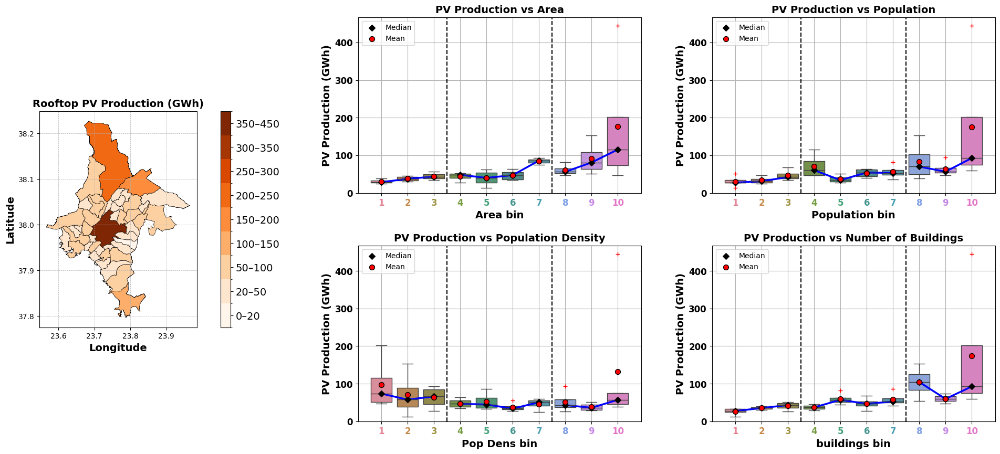

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib import colormaps
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colorbar as cbar
import numpy as np

# ================================
# Load and Prepare Data
# ================================

# --- Paths ---
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"
excel_path = "/content/drive/MyDrive/Athens.xlsx"

# --- Load shapefile ---
gdf = gpd.read_file(shapefile_path).to_crs(epsg=4326)

# --- Load Excel data ---
df = pd.read_excel(excel_path, sheet_name='Final')

# --- Ensure merge keys are strings ---
gdf["KWD_YPES"] = gdf["KWD_YPES"].astype(str)
df["KWD_YPES"] = df["KWD_YPES"].astype(str)

# --- Merge PV info ---
gdf = gdf.merge(df[["KWD_YPES", "PV Production Gwh – Only BBE"]], on="KWD_YPES", how="left")
gdf["PV Production Gwh – Only BBE"] = gdf["PV Production Gwh – Only BBE"].fillna(0)

# --- Bin edges for map ---
bin_edges = [0, 20, 50, 100, 150, 200, 250, 300, 350, 450]
n_bins = len(bin_edges) - 1
gdf["pv_bin"] = pd.cut(gdf["PV Production Gwh – Only BBE"], bins=bin_edges, labels=False)

# --- Colormap for map ---
ylorrd = colormaps.get_cmap("Oranges").resampled(n_bins)
cmap_map = ListedColormap([ylorrd(i) for i in range(ylorrd.N)])
norm = BoundaryNorm(np.arange(n_bins + 1), n_bins)

# --- Add binned columns for boxplots ---
num_bins = 10
df['Area_bin'] = pd.qcut(df['Area'], q=num_bins, labels=False)
df['Population_bin'] = pd.qcut(df['Population'], q=num_bins, labels=False)
df['Pop Dens_bin'] = pd.qcut(df['Pop Dens'], q=num_bins, labels=False)
df['buildings_bin'] = pd.qcut(df['buildings'], q=num_bins, labels=False)

# ================================
# Define Boxplot Function
# ================================

cmap_box = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

def plot_colored_boxplot_lined_panel(df, feature_bin, title, ax):
    palette = cmap_box.colors[:len(df[feature_bin].unique())]
    sns.boxplot(
        x=feature_bin,
        y='PV Production Gwh – Only BBE',
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    bin_medians = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].median()
    bin_means = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].mean()
    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    draw_segments([0, 1, 2])
    draw_segments([3, 4, 5, 6])
    draw_segments([7, 8, 9])

    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel('PV Production (GWh)', fontsize=14, fontweight='bold')
    ax.set_xticks(x_vals)
    ax.set_xticklabels([str(i + 1) for i in x_vals], fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        label.set_color(palette[i])

    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    ax.set_ylim(0, df['PV Production Gwh – Only BBE'].max() * 1.05)
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')
    ax.grid(True)
    ax.legend(loc='upper left')

# ================================
# Combine Map + Boxplots
# ================================

fig = plt.figure(figsize=(24, 10))
gs = fig.add_gridspec(1, 2, width_ratios=[1, 3], wspace=0.3)

# --- Left: Map ---
ax0 = fig.add_subplot(gs[0])
gdf.plot(
    column="pv_bin",
    cmap=cmap_map,
    linewidth=0.5,
    edgecolor="black",
    norm=norm,
    ax=ax0,
)

# Custom colorbar
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cb = cbar.ColorbarBase(
    cax,
    cmap=cmap_map,
    norm=norm,
    boundaries=np.arange(n_bins + 1),
    ticks=np.arange(n_bins) + 0.5,
    spacing="uniform",
    orientation="vertical"
)
cb.ax.set_yticklabels([f"{bin_edges[i]}–{bin_edges[i+1]}" for i in range(n_bins)])
cb.ax.tick_params(labelsize=14)

ax0.set_title("Rooftop PV Production (GWh)", fontsize=14, fontweight="bold")
ax0.set_xlabel("Longitude", fontsize=14, fontweight="bold")
ax0.set_ylabel("Latitude", fontsize=14, fontweight="bold")
ax0.grid(True, linestyle='--', linewidth=0.5)

# --- Right: 2x2 Panel of Boxplots ---
gs_right = gs[1].subgridspec(2, 2, hspace=0.3, wspace=0.25)
ax1 = fig.add_subplot(gs_right[0, 0])
ax2 = fig.add_subplot(gs_right[0, 1])
ax3 = fig.add_subplot(gs_right[1, 0])
ax4 = fig.add_subplot(gs_right[1, 1])

plot_colored_boxplot_lined_panel(df, 'Area_bin', 'PV Production vs Area', ax1)
plot_colored_boxplot_lined_panel(df, 'Population_bin', 'PV Production vs Population', ax2)
plot_colored_boxplot_lined_panel(df, 'Pop Dens_bin', 'PV Production vs Population Density', ax3)
plot_colored_boxplot_lined_panel(df, 'buildings_bin', 'PV Production vs Number of Buildings', ax4)

plt.show()


/tmp/ipython-input-2517210646.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-2517210646.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-2517210646.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-2517210646.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-2517210646.py:308: UserWarning: This figu

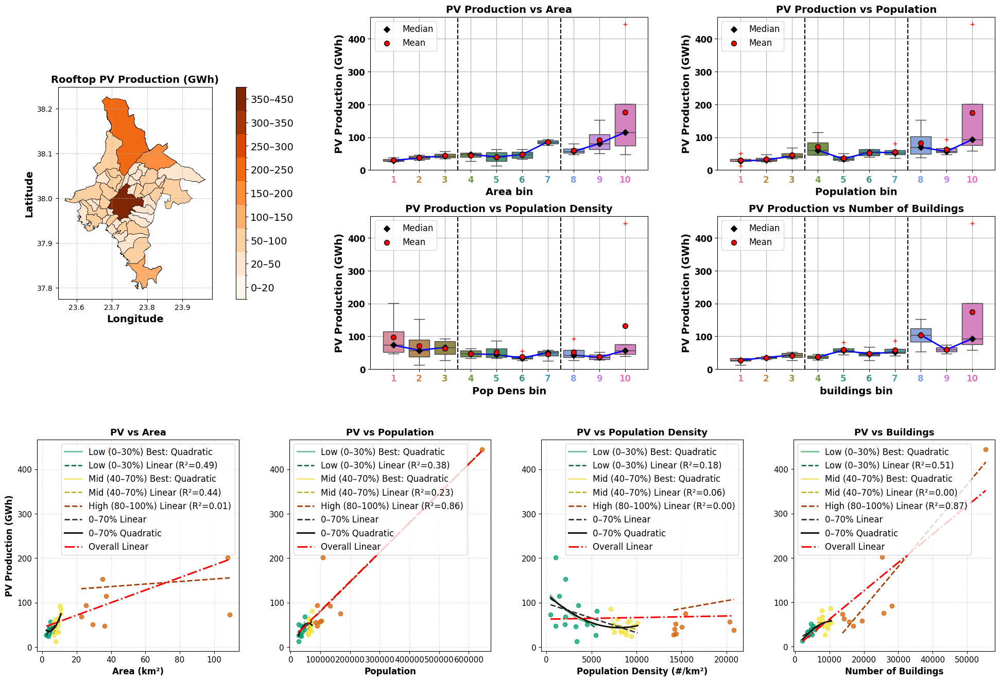

In [ ]:
# ================================
# Imports
# ================================
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib import colormaps
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colorbar as cbar

# ================================
# Load and Prepare Data
# ================================
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"
excel_path     = "/content/drive/MyDrive/Athens.xlsx"

# --- Shapefile ---
gdf = gpd.read_file(shapefile_path).to_crs(epsg=4326)

# --- Excel ---
df = pd.read_excel(excel_path, sheet_name='Final')

# --- Merge key types ---
gdf["KWD_YPES"] = gdf["KWD_YPES"].astype(str)
df["KWD_YPES"]  = df["KWD_YPES"].astype(str)

# --- Merge PV info for map ---
y_col_map = "PV Production Gwh – Only BBE"
gdf = gdf.merge(df[["KWD_YPES", y_col_map]], on="KWD_YPES", how="left")
gdf[y_col_map] = gdf[y_col_map].fillna(0)

# --- Bins for map ---
bin_edges = [0, 20, 50, 100, 150, 200, 250, 300, 350, 450]
n_bins = len(bin_edges) - 1
gdf["pv_bin"] = pd.cut(gdf[y_col_map], bins=bin_edges, labels=False)

# --- Colormap for map ---
ylorrd = colormaps.get_cmap("Oranges").resampled(n_bins)
cmap_map = ListedColormap([ylorrd(i) for i in range(ylorrd.N)])
norm = BoundaryNorm(np.arange(n_bins + 1), n_bins)

# --- Add binned columns for boxplots ---
num_bins = 10
df['Area_bin']       = pd.qcut(df['Area'], q=num_bins, labels=False)
df['Population_bin'] = pd.qcut(df['Population'], q=num_bins, labels=False)
df['Pop Dens_bin']   = pd.qcut(df['Pop Dens'], q=num_bins, labels=False)
df['buildings_bin']  = pd.qcut(df['buildings'], q=num_bins, labels=False)

# ================================
# Boxplot helper
# ================================
cmap_box = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

def plot_colored_boxplot_lined_panel(df_local, feature_bin, title, ax):
    palette = cmap_box.colors[:len(df_local[feature_bin].dropna().unique())]
    sns.boxplot(
        x=feature_bin,
        y=y_col_map,
        data=df_local,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    # medians/means per bin
    bin_medians = df_local.groupby(feature_bin)[y_col_map].median()
    bin_means   = df_local.groupby(feature_bin)[y_col_map].mean()
    x_vals      = list(range(len(bin_medians)))
    med_vals    = bin_medians.values
    mean_vals   = bin_means.values

    # connect segments groups 1–3, 4–7, 8–10
    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.0)

    if len(x_vals) >= 3:
        draw_segments([0, 1, 2])
    if len(x_vals) >= 7:
        draw_segments([3, 4, 5, 6])
    if len(x_vals) >= 10:
        draw_segments([7, 8, 9])

    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel('PV Production (GWh)', fontsize=14, fontweight='bold')
    ax.set_xticks(x_vals)
    ax.set_xticklabels([str(i + 1) for i in x_vals], fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        if i < len(palette):
            label.set_color(palette[i])

    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    ymax = df_local[y_col_map].max() if df_local[y_col_map].notna().any() else 0
    ax.set_ylim(0, ymax * 1.05 if ymax > 0 else 1)
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')
    ax.grid(True)
    ax.legend(loc='upper left', fontsize=12)

# ================================
# Regression panel helper (bottom row)
# ================================
SCATTER_COLORS = {
    'Low (0–30%)':  '#009e73',  # green
    'Mid (40–70%)': '#f0e442',  # yellow
    'High (80–100%)': '#d55e00' # red
}
LINE_COLORS_BEST = {
    'Low (0–30%)':  '#70c19a',
    'Mid (40–70%)': '#f7e77b'
}
LINE_COLORS_LIN = {
    'Low (0–30%)':  '#005f43',
    'Mid (40–70%)': '#bcae12',
    'High (80–100%)': '#a73a00'
}

def compute_r2(y_true, y_hat):
    ss_res = np.sum((y_true - y_hat)**2)
    ss_tot = np.sum((y_true - np.mean(y_true))**2)
    return 1 - ss_res / ss_tot if ss_tot > 0 else np.nan

def plot_regression_panel(ax, df_local, x_col, y_col, x_label, title, legend_fontsize=12):
    data = df_local[[x_col, y_col]].apply(pd.to_numeric, errors='coerce').dropna()
    if data.empty or len(data) < 3:
        ax.set_title(f"{title}\n(Not enough data)")
        return

    x = data[x_col].to_numpy()
    y = data[y_col].to_numpy()

    # Percentiles per x var
    p30, p40, p70, p80 = np.percentile(x, [30, 40, 70, 80])

    groups = {
        'Low (0–30%)':     (x <= p30),
        'Mid (40–70%)':    (x > p40) & (x <= p70),
        'High (80–100%)':  (x > p80)
    }

    # Per-group fits
    for label, mask in groups.items():
        xg, yg = x[mask], y[mask]
        if len(xg) < 3:
            continue

        # Linear fit
        p_lin = np.polyfit(xg, yg, 1)
        y_lin = np.polyval(p_lin, xg)
        r2_lin = compute_r2(yg, y_lin)

        order = np.argsort(xg)
        ax.scatter(xg, yg, color=SCATTER_COLORS[label], alpha=0.75, s=36)

        if "High" not in label:
            # Try best fit (linear/log/exp/quad)
            forms = {'Linear': r2_lin}

            if np.all(xg > 0):
                p = np.polyfit(np.log(xg), yg, 1)
                forms['Logarithmic'] = compute_r2(yg, np.polyval(p, np.log(xg)))

            if np.all(yg > 0):
                p = np.polyfit(xg, np.log(yg), 1)
                forms['Exponential'] = compute_r2(yg, np.exp(np.polyval(p, xg)))

            p = np.polyfit(xg, yg, 2)
            forms['Quadratic'] = compute_r2(yg, np.polyval(p, xg))

            best_form = max(forms, key=forms.get)

            # compute y_best
            if best_form == 'Linear':
                y_best = y_lin
            elif best_form == 'Logarithmic':
                p = np.polyfit(np.log(xg), yg, 1)
                y_best = np.polyval(p, np.log(xg))
            elif best_form == 'Exponential':
                p = np.polyfit(xg, np.log(yg), 1)
                y_best = np.exp(np.polyval(p, xg))
            else:
                p = np.polyfit(xg, yg, 2)
                y_best = np.polyval(p, xg)

            ax.plot(xg[order], y_best[order],
                    color=LINE_COLORS_BEST[label], linewidth=2.0,
                    label=f"{label} Best: {best_form}")
            ax.plot(xg[order], y_lin[order],
                    color=LINE_COLORS_LIN[label], linestyle='--', linewidth=1.8,
                    label=f"{label} Linear (R²={r2_lin:.2f})")
        else:
            # High group: linear only
            ax.plot(xg[order], y_lin[order],
                    color=LINE_COLORS_LIN[label], linestyle='--', linewidth=2.0,
                    label=f"{label} Linear (R²={r2_lin:.2f})")

    # 0–70% combined lines
    mask_0_70 = (x <= p70)
    x_70, y_70 = x[mask_0_70], y[mask_0_70]
    if len(x_70) >= 3:
        p_lin_70 = np.polyfit(x_70, y_70, 1)
        p_quad_70 = np.polyfit(x_70, y_70, 2)
        ord70 = np.argsort(x_70)
        ax.plot(x_70[ord70], np.polyval(p_lin_70, x_70[ord70]),
                color='#333333', linestyle='--', linewidth=2.0,
                label="0–70% Linear")
        ax.plot(x_70[ord70], np.polyval(p_quad_70, x_70[ord70]),
                color='#111111', linestyle='-', linewidth=2.2,
                label="0–70% Quadratic")

    # Overall linear (0–100%)
    p_all = np.polyfit(x, y, 1)
    ord_all = np.argsort(x)
    ax.plot(x[ord_all], np.polyval(p_all, x[ord_all]),
            color='red', linestyle='-.', linewidth=2.2,
            label="Overall Linear")

    # Aesthetics
    ax.set_xlabel(x_label, fontsize=12, fontweight='bold')
    ax.grid(True, linestyle='--', alpha=0.35)
    ax.tick_params(axis='both', labelsize=11)
    ax.set_title(title, fontsize=13, fontweight='bold')
    ax.legend(frameon=True, fontsize=12)

# ================================
# Build the combined figure
# ================================
fig = plt.figure(figsize=(24, 16))
outer_gs = fig.add_gridspec(2, 1, height_ratios=[2.0, 1.2], hspace=0.25)

# ---- Top row: spatial + 2x2 boxplots
top_gs = outer_gs[0].subgridspec(1, 2, width_ratios=[1, 3], wspace=0.3)

# Map
ax0 = fig.add_subplot(top_gs[0, 0])
gdf.plot(
    column="pv_bin",
    cmap=cmap_map,
    linewidth=0.5,
    edgecolor="black",
    norm=norm,
    ax=ax0,
)

# Colorbar
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cb = cbar.ColorbarBase(
    cax,
    cmap=cmap_map,
    norm=norm,
    boundaries=np.arange(n_bins + 1),
    ticks=np.arange(n_bins) + 0.5,
    spacing="uniform",
    orientation="vertical"
)
cb.ax.set_yticklabels([f"{bin_edges[i]}–{bin_edges[i+1]}" for i in range(n_bins)])
cb.ax.tick_params(labelsize=14)

ax0.set_title("Rooftop PV Production (GWh)", fontsize=14, fontweight="bold")
ax0.set_xlabel("Longitude", fontsize=14, fontweight="bold")
ax0.set_ylabel("Latitude", fontsize=14, fontweight="bold")
ax0.grid(True, linestyle='--', linewidth=0.5)

# 2x2 boxplots
right_gs = top_gs[0, 1].subgridspec(2, 2, hspace=0.3, wspace=0.25)
ax1 = fig.add_subplot(right_gs[0, 0])
ax2 = fig.add_subplot(right_gs[0, 1])
ax3 = fig.add_subplot(right_gs[1, 0])
ax4 = fig.add_subplot(right_gs[1, 1])

plot_colored_boxplot_lined_panel(df, 'Area_bin',       'PV Production vs Area',               ax1)
plot_colored_boxplot_lined_panel(df, 'Population_bin', 'PV Production vs Population',         ax2)
plot_colored_boxplot_lined_panel(df, 'Pop Dens_bin',   'PV Production vs Population Density', ax3)
plot_colored_boxplot_lined_panel(df, 'buildings_bin',  'PV Production vs Number of Buildings',ax4)

# ---- Bottom row: 1x4 regression panel
bottom_gs = outer_gs[1].subgridspec(1, 4, wspace=0.25)
axes = [fig.add_subplot(bottom_gs[0, i]) for i in range(4)]

X_SPECS = [
    ('Area', 'Area (km²)', 'PV vs Area'),
    ('Population', 'Population', 'PV vs Population'),
    ('Pop Dens', 'Population Density (#/km²)', 'PV vs Population Density'),
    ('buildings', 'Number of Buildings', 'PV vs Buildings'),
]

for axR, (x_col, x_label, title) in zip(axes, X_SPECS):
    plot_regression_panel(axR, df, x_col, y_col_map, x_label, title, legend_fontsize=12)

# Shared Y label for bottom row
axes[0].set_ylabel('PV Production (GWh)', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()


/tmp/ipython-input-3098992016.py:63: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3098992016.py:63: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3098992016.py:63: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3098992016.py:63: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3098992016.py:321: UserWarning: This figu

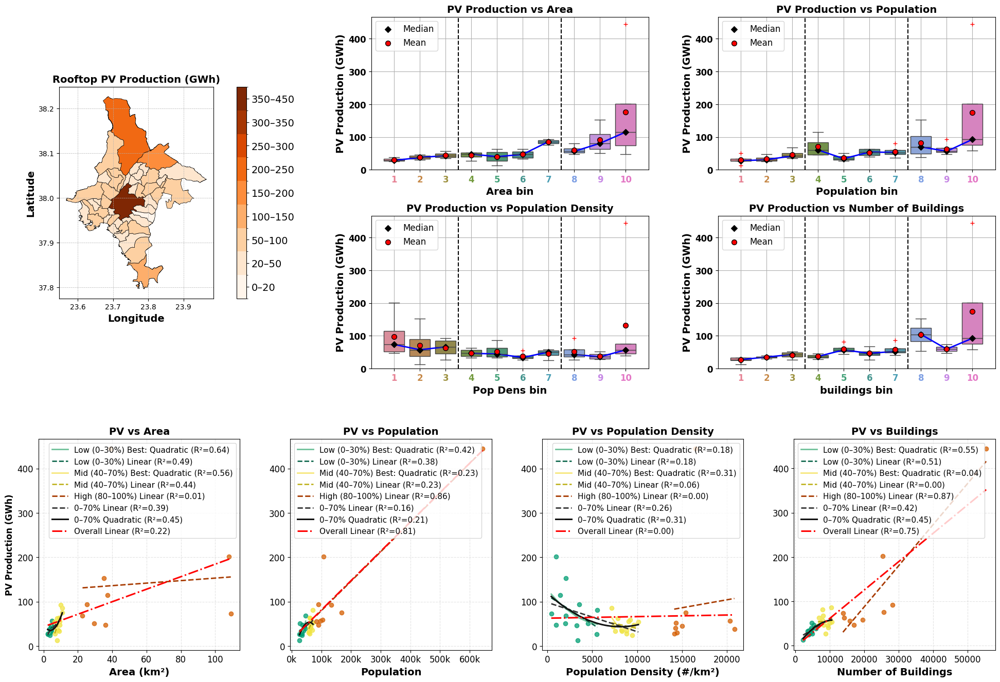

In [ ]:
# ================================
# Imports
# ================================
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib import colormaps
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colorbar as cbar
from matplotlib.ticker import MultipleLocator, FuncFormatter

# ================================
# Load and Prepare Data
# ================================
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"
excel_path     = "/content/drive/MyDrive/Athens.xlsx"

# --- Shapefile ---
gdf = gpd.read_file(shapefile_path).to_crs(epsg=4326)

# --- Excel ---
df = pd.read_excel(excel_path, sheet_name='Final')

# --- Merge key types ---
gdf["KWD_YPES"] = gdf["KWD_YPES"].astype(str)
df["KWD_YPES"]  = df["KWD_YPES"].astype(str)

# --- Merge PV info for map ---
y_col_map = "PV Production Gwh – Only BBE"
gdf = gdf.merge(df[["KWD_YPES", y_col_map]], on="KWD_YPES", how="left")
gdf[y_col_map] = gdf[y_col_map].fillna(0)

# --- Bins for map ---
bin_edges = [0, 20, 50, 100, 150, 200, 250, 300, 350, 450]
n_bins = len(bin_edges) - 1
gdf["pv_bin"] = pd.cut(gdf[y_col_map], bins=bin_edges, labels=False)

# --- Colormap for map ---
ylorrd = colormaps.get_cmap("Oranges").resampled(n_bins)
cmap_map = ListedColormap([ylorrd(i) for i in range(ylorrd.N)])
norm = BoundaryNorm(np.arange(n_bins + 1), n_bins)

# --- Add binned columns for boxplots ---
num_bins = 10
df['Area_bin']       = pd.qcut(df['Area'], q=num_bins, labels=False)
df['Population_bin'] = pd.qcut(df['Population'], q=num_bins, labels=False)
df['Pop Dens_bin']   = pd.qcut(df['Pop Dens'], q=num_bins, labels=False)
df['buildings_bin']  = pd.qcut(df['buildings'], q=num_bins, labels=False)

# ================================
# Boxplot helper
# ================================
cmap_box = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

def plot_colored_boxplot_lined_panel(df_local, feature_bin, title, ax):
    palette = cmap_box.colors[:len(df_local[feature_bin].dropna().unique())]
    sns.boxplot(
        x=feature_bin,
        y=y_col_map,
        data=df_local,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    # medians/means per bin
    bin_medians = df_local.groupby(feature_bin)[y_col_map].median()
    bin_means   = df_local.groupby(feature_bin)[y_col_map].mean()
    x_vals      = list(range(len(bin_medians)))
    med_vals    = bin_medians.values
    mean_vals   = bin_means.values

    # connect segments: 1–3, 4–7, 8–10
    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.0)

    if len(x_vals) >= 3:  draw_segments([0, 1, 2])
    if len(x_vals) >= 7:  draw_segments([3, 4, 5, 6])
    if len(x_vals) >= 10: draw_segments([7, 8, 9])

    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel('PV Production (GWh)', fontsize=14, fontweight='bold')
    ax.set_xticks(x_vals)
    ax.set_xticklabels([str(i + 1) for i in x_vals], fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        if i < len(palette):
            label.set_color(palette[i])

    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    ymax = df_local[y_col_map].max() if df_local[y_col_map].notna().any() else 0
    ax.set_ylim(0, ymax * 1.05 if ymax > 0 else 1)
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')
    ax.grid(True)
    ax.legend(loc='upper left', fontsize=12)

# ================================
# Regression panel helper (bottom row)
# ================================
SCATTER_COLORS = {
    'Low (0–30%)':  '#009e73',
    'Mid (40–70%)': '#f0e442',
    'High (80–100%)': '#d55e00'
}
LINE_COLORS_BEST = {
    'Low (0–30%)':  '#70c19a',
    'Mid (40–70%)': '#f7e77b'
}
LINE_COLORS_LIN = {
    'Low (0–30%)':  '#005f43',
    'Mid (40–70%)': '#bcae12',
    'High (80–100%)': '#a73a00'
}

def compute_r2(y_true, y_hat):
    ss_res = np.sum((y_true - y_hat)**2)
    ss_tot = np.sum((y_true - np.mean(y_true))**2)
    return 1 - ss_res / ss_tot if ss_tot > 0 else np.nan

def plot_regression_panel(ax, df_local, x_col, y_col, x_label, title, legend_fontsize=12):
    data = df_local[[x_col, y_col]].apply(pd.to_numeric, errors='coerce').dropna()
    if data.empty or len(data) < 3:
        ax.set_title(f"{title}\n(Not enough data)")
        return

    x = data[x_col].to_numpy()
    y = data[y_col].to_numpy()

    # Percentiles per x var
    p30, p40, p70, p80 = np.percentile(x, [30, 40, 70, 80])

    groups = {
        'Low (0–30%)':     (x <= p30),
        'Mid (40–70%)':    (x > p40) & (x <= p70),
        'High (80–100%)':  (x > p80)
    }

    # Per-group fits
    for label, mask in groups.items():
        xg, yg = x[mask], y[mask]
        if len(xg) < 3:
            continue

        # Linear fit
        p_lin = np.polyfit(xg, yg, 1)
        y_lin = np.polyval(p_lin, xg)
        r2_lin = compute_r2(yg, y_lin)
        order = np.argsort(xg)

        ax.scatter(xg, yg, color=SCATTER_COLORS[label], alpha=0.75, s=36)

        if "High" not in label:
            # Try best fit (linear/log/exp/quad) and compute R²
            forms = {'Linear': r2_lin}

            y_best = y_lin
            best_form = 'Linear'
            best_r2 = r2_lin

            if np.all(xg > 0):
                p_log = np.polyfit(np.log(xg), yg, 1)
                y_log = np.polyval(p_log, np.log(xg))
                forms['Logarithmic'] = compute_r2(yg, y_log)

            if np.all(yg > 0):
                p_exp = np.polyfit(xg, np.log(yg), 1)
                y_exp = np.exp(np.polyval(p_exp, xg))
                forms['Exponential'] = compute_r2(yg, y_exp)

            p_quad = np.polyfit(xg, yg, 2)
            y_quad = np.polyval(p_quad, xg)
            forms['Quadratic'] = compute_r2(yg, y_quad)

            best_form = max(forms, key=forms.get)
            best_r2 = forms[best_form]
            if best_form == 'Logarithmic':
                y_best = y_log
            elif best_form == 'Exponential':
                y_best = y_exp
            elif best_form == 'Quadratic':
                y_best = y_quad

            ax.plot(xg[order], y_best[order],
                    color=LINE_COLORS_BEST[label], linewidth=2.0,
                    label=f"{label} Best: {best_form} (R²={best_r2:.2f})")
            ax.plot(xg[order], y_lin[order],
                    color=LINE_COLORS_LIN[label], linestyle='--', linewidth=1.8,
                    label=f"{label} Linear (R²={r2_lin:.2f})")
        else:
            # High group: linear only
            ax.plot(xg[order], y_lin[order],
                    color=LINE_COLORS_LIN[label], linestyle='--', linewidth=2.0,
                    label=f"{label} Linear (R²={r2_lin:.2f})")

    # 0–70% combined lines (with R²)
    mask_0_70 = (x <= p70)
    x_70, y_70 = x[mask_0_70], y[mask_0_70]
    if len(x_70) >= 3:
        p_lin_70  = np.polyfit(x_70, y_70, 1)
        y_lin_70  = np.polyval(p_lin_70, x_70)
        r2_lin_70 = compute_r2(y_70, y_lin_70)

        p_quad_70  = np.polyfit(x_70, y_70, 2)
        y_quad_70  = np.polyval(p_quad_70, x_70)
        r2_quad_70 = compute_r2(y_70, y_quad_70)

        ord70 = np.argsort(x_70)
        ax.plot(x_70[ord70], y_lin_70[ord70],
                color='#333333', linestyle='--', linewidth=2.0,
                label=f"0–70% Linear (R²={r2_lin_70:.2f})")
        ax.plot(x_70[ord70], y_quad_70[ord70],
                color='#111111', linestyle='-', linewidth=2.2,
                label=f"0–70% Quadratic (R²={r2_quad_70:.2f})")

    # Overall linear (0–100%) with R²
    p_all  = np.polyfit(x, y, 1)
    y_all  = np.polyval(p_all, x)
    r2_all = compute_r2(y, y_all)
    ord_all = np.argsort(x)
    ax.plot(x[ord_all], y_all[ord_all],
            color='red', linestyle='-.', linewidth=2.2,
            label=f"Overall Linear (R²={r2_all:.2f})")

    # Aesthetics
    ax.set_xlabel(x_label, fontsize=14, fontweight='bold')
    ax.grid(True, linestyle='--', alpha=0.35)
    ax.tick_params(axis='both', labelsize=12)
    ax.set_title(title, fontsize=14, fontweight='bold')

    # Population ticks every 100k with 'k' labels
    if x_col == 'Population':
        ax.xaxis.set_major_locator(MultipleLocator(100_000))
        ax.xaxis.set_major_formatter(FuncFormatter(lambda v, pos: f'{int(round(v/1000))}k'))

    ax.legend(frameon=True, fontsize=11)

# ================================
# Build the combined figure
# ================================
fig = plt.figure(figsize=(24, 16))
outer_gs = fig.add_gridspec(2, 1, height_ratios=[2.0, 1.2], hspace=0.25)

# ---- Top row: spatial + 2x2 boxplots
top_gs = outer_gs[0].subgridspec(1, 2, width_ratios=[1, 3], wspace=0.3)

# Map
ax0 = fig.add_subplot(top_gs[0, 0])
gdf.plot(
    column="pv_bin",
    cmap=cmap_map,
    linewidth=0.5,
    edgecolor="black",
    norm=norm,
    ax=ax0,
)

# Colorbar
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cb = cbar.ColorbarBase(
    cax,
    cmap=cmap_map,
    norm=norm,
    boundaries=np.arange(n_bins + 1),
    ticks=np.arange(n_bins) + 0.5,
    spacing="uniform",
    orientation="vertical"
)
cb.ax.set_yticklabels([f"{bin_edges[i]}–{bin_edges[i+1]}" for i in range(n_bins)])
cb.ax.tick_params(labelsize=14)

ax0.set_title("Rooftop PV Production (GWh)", fontsize=14, fontweight="bold")
ax0.set_xlabel("Longitude", fontsize=14, fontweight="bold")
ax0.set_ylabel("Latitude", fontsize=14, fontweight="bold")
ax0.grid(True, linestyle='--', linewidth=0.5)

# 2x2 boxplots
right_gs = top_gs[0, 1].subgridspec(2, 2, hspace=0.3, wspace=0.25)
ax1 = fig.add_subplot(right_gs[0, 0])
ax2 = fig.add_subplot(right_gs[0, 1])
ax3 = fig.add_subplot(right_gs[1, 0])
ax4 = fig.add_subplot(right_gs[1, 1])

plot_colored_boxplot_lined_panel(df, 'Area_bin',       'PV Production vs Area',               ax1)
plot_colored_boxplot_lined_panel(df, 'Population_bin', 'PV Production vs Population',         ax2)
plot_colored_boxplot_lined_panel(df, 'Pop Dens_bin',   'PV Production vs Population Density', ax3)
plot_colored_boxplot_lined_panel(df, 'buildings_bin',  'PV Production vs Number of Buildings',ax4)

# ---- Bottom row: 1x4 regression panel
bottom_gs = outer_gs[1].subgridspec(1, 4, wspace=0.25)
axes = [fig.add_subplot(bottom_gs[0, i]) for i in range(4)]

X_SPECS = [
    ('Area', 'Area (km²)', 'PV vs Area'),
    ('Population', 'Population', 'PV vs Population'),
    ('Pop Dens', 'Population Density (#/km²)', 'PV vs Population Density'),
    ('buildings', 'Number of Buildings', 'PV vs Buildings'),
]

for axR, (x_col, x_label, title) in zip(axes, X_SPECS):
    plot_regression_panel(axR, df, x_col, y_col_map, x_label, title, legend_fontsize=12)

# Shared Y label for bottom row
axes[0].set_ylabel('PV Production (GWh)', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()


/tmp/ipython-input-2526338625.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-2526338625.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-2526338625.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-2526338625.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-2526338625.py:342: UserWarning: This figu

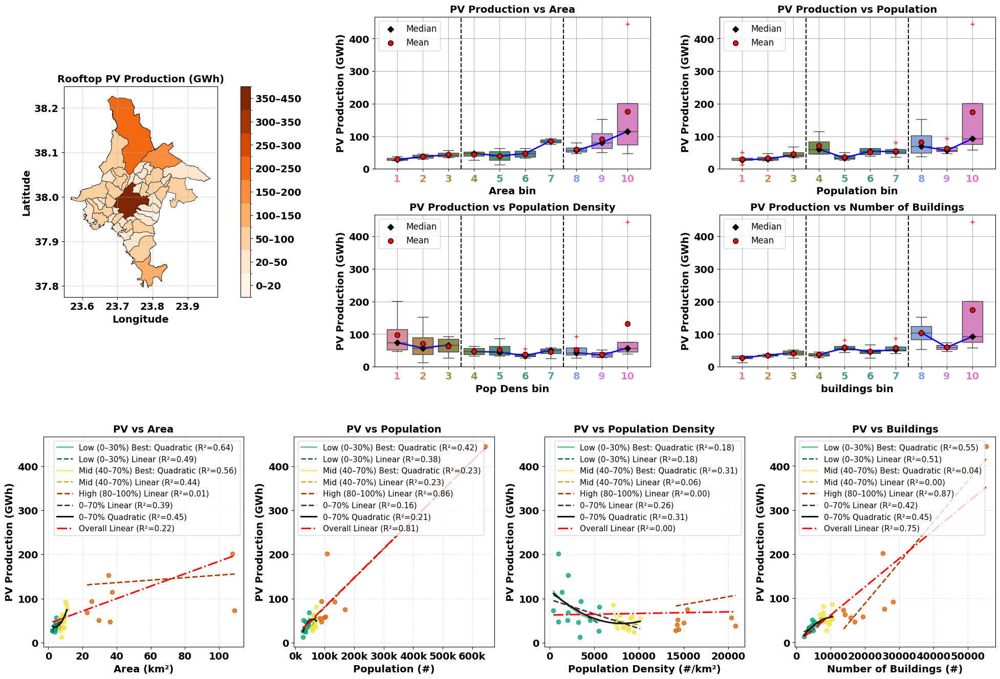

In [ ]:
# ================================
# Imports
# ================================
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib import colormaps
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colorbar as cbar
from matplotlib.ticker import MultipleLocator, FuncFormatter

# ================================
# Load and Prepare Data
# ================================
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"
excel_path     = "/content/drive/MyDrive/Athens.xlsx"

# --- Shapefile ---
gdf = gpd.read_file(shapefile_path).to_crs(epsg=4326)

# --- Excel ---
df = pd.read_excel(excel_path, sheet_name='Final')

# --- Merge key types ---
gdf["KWD_YPES"] = gdf["KWD_YPES"].astype(str)
df["KWD_YPES"]  = df["KWD_YPES"].astype(str)

# --- Merge PV info for map ---
y_col_map = "PV Production Gwh – Only BBE"
gdf = gdf.merge(df[["KWD_YPES", y_col_map]], on="KWD_YPES", how="left")
gdf[y_col_map] = gdf[y_col_map].fillna(0)

# --- Bins for map ---
bin_edges = [0, 20, 50, 100, 150, 200, 250, 300, 350, 450]
n_bins = len(bin_edges) - 1
gdf["pv_bin"] = pd.cut(gdf[y_col_map], bins=bin_edges, labels=False)

# --- Colormap for map ---
ylorrd = colormaps.get_cmap("Oranges").resampled(n_bins)
cmap_map = ListedColormap([ylorrd(i) for i in range(ylorrd.N)])
norm = BoundaryNorm(np.arange(n_bins + 1), n_bins)

# --- Add binned columns for boxplots ---
num_bins = 10
df['Area_bin']       = pd.qcut(df['Area'], q=num_bins, labels=False)
df['Population_bin'] = pd.qcut(df['Population'], q=num_bins, labels=False)
df['Pop Dens_bin']   = pd.qcut(df['Pop Dens'], q=num_bins, labels=False)
df['buildings_bin']  = pd.qcut(df['buildings'], q=num_bins, labels=False)

# ================================
# Helper: make x/y ticks bold 14pt
# ================================
def _bold_ticks(ax, size=14):
    ax.tick_params(axis='both', labelsize=size)
    for t in ax.get_xticklabels() + ax.get_yticklabels():
        t.set_fontweight('bold')

# ================================
# Boxplot helper
# ================================
cmap_box = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

def plot_colored_boxplot_lined_panel(df_local, feature_bin, title, ax):
    palette = cmap_box.colors[:len(df_local[feature_bin].dropna().unique())]
    sns.boxplot(
        x=feature_bin,
        y=y_col_map,
        data=df_local,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    # medians/means per bin
    bin_medians = df_local.groupby(feature_bin)[y_col_map].median()
    bin_means   = df_local.groupby(feature_bin)[y_col_map].mean()
    x_vals      = list(range(len(bin_medians)))
    med_vals    = bin_medians.values
    mean_vals   = bin_means.values

    # connect segments: 1–3, 4–7, 8–10
    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.0)

    if len(x_vals) >= 3:  draw_segments([0, 1, 2])
    if len(x_vals) >= 7:  draw_segments([3, 4, 5, 6])
    if len(x_vals) >= 10: draw_segments([7, 8, 9])

    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel('PV Production (GWh)', fontsize=14, fontweight='bold')
    ax.set_xticks(x_vals)
    ax.set_xticklabels([str(i + 1) for i in x_vals], fontsize=14, fontweight='bold')

    # color bin labels
    for i, label in enumerate(ax.get_xticklabels()):
        if i < len(palette):
            label.set_color(palette[i])

    # ensure y ticks are bold 14
    _bold_ticks(ax, size=14)

    ymax = df_local[y_col_map].max() if df_local[y_col_map].notna().any() else 0
    ax.set_ylim(0, ymax * 1.05 if ymax > 0 else 1)
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')
    ax.grid(True)
    ax.legend(loc='upper left', fontsize=12)

# ================================
# Regression panel helper (bottom row)
# ================================
SCATTER_COLORS = {
    'Low (0–30%)':  '#009e73',
    'Mid (40–70%)': '#f0e442',
    'High (80–100%)': '#d55e00'
}
LINE_COLORS_BEST = {
    'Low (0–30%)':  '#70c19a',
    'Mid (40–70%)': '#f7e77b'
}
LINE_COLORS_LIN = {
    'Low (0–30%)':  '#005f43',
    'Mid (40–70%)': '#bcae12',
    'High (80–100%)': '#a73a00'
}

def compute_r2(y_true, y_hat):
    ss_res = np.sum((y_true - y_hat)**2)
    ss_tot = np.sum((y_true - np.mean(y_true))**2)
    return 1 - ss_res / ss_tot if ss_tot > 0 else np.nan

def plot_regression_panel(ax, df_local, x_col, y_col, x_label, title, legend_fontsize=12):
    data = df_local[[x_col, y_col]].apply(pd.to_numeric, errors='coerce').dropna()
    if data.empty or len(data) < 3:
        ax.set_title(f"{title}\n(Not enough data)", fontsize=14, fontweight='bold')
        ax.set_xlabel(x_label, fontsize=14, fontweight='bold')
        ax.set_ylabel('PV Production (GWh)', fontsize=14, fontweight='bold')
        _bold_ticks(ax, size=14)
        ax.grid(True, linestyle='--', alpha=0.35)
        return

    x = data[x_col].to_numpy()
    y = data[y_col].to_numpy()

    # Percentiles per x var
    p30, p40, p70, p80 = np.percentile(x, [30, 40, 70, 80])

    groups = {
        'Low (0–30%)':     (x <= p30),
        'Mid (40–70%)':    (x > p40) & (x <= p70),
        'High (80–100%)':  (x > p80)
    }

    # Per-group fits
    for label, mask in groups.items():
        xg, yg = x[mask], y[mask]
        if len(xg) < 3:
            continue

        # Linear fit
        p_lin = np.polyfit(xg, yg, 1)
        y_lin = np.polyval(p_lin, xg)
        r2_lin = compute_r2(yg, y_lin)
        order = np.argsort(xg)

        ax.scatter(xg, yg, color=SCATTER_COLORS[label], alpha=0.75, s=36)

        if "High" not in label:
            # Try best fit (linear/log/exp/quad) and compute R²
            forms = {'Linear': r2_lin}

            y_best = y_lin
            best_form = 'Linear'
            best_r2 = r2_lin

            if np.all(xg > 0):
                p_log = np.polyfit(np.log(xg), yg, 1)
                y_log = np.polyval(p_log, np.log(xg))
                forms['Logarithmic'] = compute_r2(yg, y_log)

            if np.all(yg > 0):
                p_exp = np.polyfit(xg, np.log(yg), 1)
                y_exp = np.exp(np.polyval(p_exp, xg))
                forms['Exponential'] = compute_r2(yg, y_exp)

            p_quad = np.polyfit(xg, yg, 2)
            y_quad = np.polyval(p_quad, xg)
            forms['Quadratic'] = compute_r2(yg, y_quad)

            best_form = max(forms, key=forms.get)
            best_r2 = forms[best_form]
            if best_form == 'Logarithmic':
                y_best = y_log
            elif best_form == 'Exponential':
                y_best = y_exp
            elif best_form == 'Quadratic':
                y_best = y_quad

            ax.plot(xg[order], y_best[order],
                    color=LINE_COLORS_BEST[label], linewidth=2.0,
                    label=f"{label} Best: {best_form} (R²={best_r2:.2f})")
            ax.plot(xg[order], y_lin[order],
                    color=LINE_COLORS_LIN[label], linestyle='--', linewidth=1.8,
                    label=f"{label} Linear (R²={r2_lin:.2f})")
        else:
            # High group: linear only
            ax.plot(xg[order], y_lin[order],
                    color=LINE_COLORS_LIN[label], linestyle='--', linewidth=2.0,
                    label=f"{label} Linear (R²={r2_lin:.2f})")

    # 0–70% combined lines (with R²)
    mask_0_70 = (x <= p70)
    x_70, y_70 = x[mask_0_70], y[mask_0_70]
    if len(x_70) >= 3:
        p_lin_70  = np.polyfit(x_70, y_70, 1)
        y_lin_70  = np.polyval(p_lin_70, x_70)
        r2_lin_70 = compute_r2(y_70, y_lin_70)

        p_quad_70  = np.polyfit(x_70, y_70, 2)
        y_quad_70  = np.polyval(p_quad_70, x_70)
        r2_quad_70 = compute_r2(y_70, y_quad_70)

        ord70 = np.argsort(x_70)
        ax.plot(x_70[ord70], y_lin_70[ord70],
                color='#333333', linestyle='--', linewidth=2.0,
                label=f"0–70% Linear (R²={r2_lin_70:.2f})")
        ax.plot(x_70[ord70], y_quad_70[ord70],
                color='#111111', linestyle='-', linewidth=2.2,
                label=f"0–70% Quadratic (R²={r2_quad_70:.2f})")

    # Overall linear (0–100%) with R²
    p_all  = np.polyfit(x, y, 1)
    y_all  = np.polyval(p_all, x)
    r2_all = compute_r2(y, y_all)
    ord_all = np.argsort(x)
    ax.plot(x[ord_all], y_all[ord_all],
            color='red', linestyle='-.', linewidth=2.2,
            label=f"Overall Linear (R²={r2_all:.2f})")

    # Aesthetics
    ax.set_xlabel(x_label, fontsize=14, fontweight='bold')
    ax.set_ylabel('PV Production (GWh)', fontsize=14, fontweight='bold')
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.grid(True, linestyle='--', alpha=0.35)

    # >>> ensure bold 14pt ticks on every regression axis
    _bold_ticks(ax, size=14)

    # Population ticks every 100k with 'k' labels
    if x_col == 'Population':
        ax.xaxis.set_major_locator(MultipleLocator(100_000))
        ax.xaxis.set_major_formatter(FuncFormatter(lambda v, pos: f'{int(round(v/1000))}k'))

    ax.legend(frameon=True, fontsize=11)

# ================================
# Build the combined figure
# ================================
fig = plt.figure(figsize=(24, 16))
outer_gs = fig.add_gridspec(2, 1, height_ratios=[2.0, 1.2], hspace=0.25)

# ---- Top row: spatial + 2x2 boxplots
top_gs = outer_gs[0].subgridspec(1, 2, width_ratios=[1, 3], wspace=0.3)

# Map
ax0 = fig.add_subplot(top_gs[0, 0])
gdf.plot(
    column="pv_bin",
    cmap=cmap_map,
    linewidth=0.5,
    edgecolor="black",
    norm=norm,
    ax=ax0,
)

# Colorbar
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cb = cbar.ColorbarBase(
    cax,
    cmap=cmap_map,
    norm=norm,
    boundaries=np.arange(n_bins + 1),
    ticks=np.arange(n_bins) + 0.5,
    spacing="uniform",
    orientation="vertical"
)
cb.ax.set_yticklabels([f"{bin_edges[i]}–{bin_edges[i+1]}" for i in range(n_bins)])
cb.ax.tick_params(labelsize=14)
# Make colorbar ticks bold too (optional)
for t in cb.ax.get_yticklabels():
    t.set_fontweight('bold')

ax0.set_title("Rooftop PV Production (GWh)", fontsize=14, fontweight="bold")
ax0.set_xlabel("Longitude", fontsize=14, fontweight="bold")
ax0.set_ylabel("Latitude", fontsize=14, fontweight="bold")
ax0.grid(True, linestyle='--', linewidth=0.5)
# >>> bold 14pt ticks on the map
_bold_ticks(ax0, size=14)

# 2x2 boxplots
right_gs = top_gs[0, 1].subgridspec(2, 2, hspace=0.3, wspace=0.25)
ax1 = fig.add_subplot(right_gs[0, 0])
ax2 = fig.add_subplot(right_gs[0, 1])
ax3 = fig.add_subplot(right_gs[1, 0])
ax4 = fig.add_subplot(right_gs[1, 1])

plot_colored_boxplot_lined_panel(df, 'Area_bin',       'PV Production vs Area',               ax1)
plot_colored_boxplot_lined_panel(df, 'Population_bin', 'PV Production vs Population',         ax2)
plot_colored_boxplot_lined_panel(df, 'Pop Dens_bin',   'PV Production vs Population Density', ax3)
plot_colored_boxplot_lined_panel(df, 'buildings_bin',  'PV Production vs Number of Buildings',ax4)

# ---- Bottom row: 1x4 regression panel
bottom_gs = outer_gs[1].subgridspec(1, 4, wspace=0.25)
axes = [fig.add_subplot(bottom_gs[0, i]) for i in range(4)]

X_SPECS = [
    ('Area', 'Area (km²)', 'PV vs Area'),
    ('Population', 'Population (#)', 'PV vs Population'),
    ('Pop Dens', 'Population Density (#/km²)', 'PV vs Population Density'),
    ('buildings', 'Number of Buildings (#)', 'PV vs Buildings'),
]

for axR, (x_col, x_label, title) in zip(axes, X_SPECS):
    plot_regression_panel(axR, df, x_col, y_col_map, x_label, title, legend_fontsize=12)

# Shared Y label for bottom row
axes[0].set_ylabel('PV Production (GWh)', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()


/tmp/ipython-input-169028270.py:60: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-169028270.py:60: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-169028270.py:60: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-169028270.py:60: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


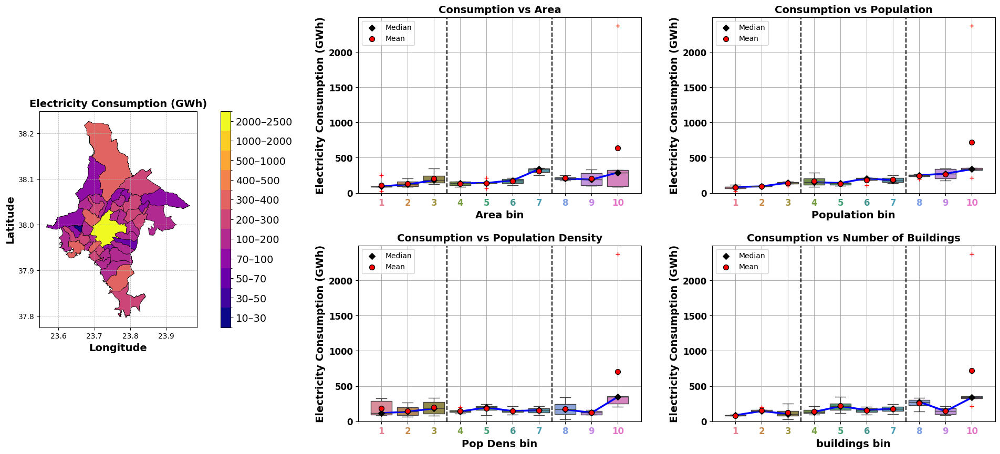

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib import colormaps
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colorbar as cbar
import numpy as np

# ================================
# Load and Prepare Data
# ================================

# --- Paths ---
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"
excel_path = "/content/drive/MyDrive/Athens.xlsx"

# --- Load shapefile ---
gdf = gpd.read_file(shapefile_path).to_crs(epsg=4326)

# --- Load Excel data ---
df = pd.read_excel(excel_path, sheet_name='Final')

# --- Ensure merge keys are strings ---
gdf["KWD_YPES"] = gdf["KWD_YPES"].astype(str)
df["KWD_YPES"] = df["KWD_YPES"].astype(str)

# --- Merge Consumption info ---
gdf = gdf.merge(df[["KWD_YPES", "BBE SC1_100 – Consumption GWh"]], on="KWD_YPES", how="left")

# --- Bin edges for map ---
bin_edges = [10, 30, 50, 70, 100, 200, 300, 400, 500, 1000, 2000, 2500]
n_bins = len(bin_edges) - 1
gdf["consumption_bin"] = pd.cut(gdf["BBE SC1_100 – Consumption GWh"], bins=bin_edges, labels=False)

# --- Colormap for map ---
plasma = colormaps.get_cmap("plasma").resampled(n_bins)
cmap_map = ListedColormap([plasma(i) for i in range(plasma.N)])
norm = BoundaryNorm(np.arange(n_bins + 1), n_bins)

# --- Add binned columns for boxplots ---
num_bins = 10
df['Area_bin'] = pd.qcut(df['Area'], q=num_bins, labels=False)
df['Population_bin'] = pd.qcut(df['Population'], q=num_bins, labels=False)
df['Pop Dens_bin'] = pd.qcut(df['Pop Dens'], q=num_bins, labels=False)
df['buildings_bin'] = pd.qcut(df['buildings'], q=num_bins, labels=False)

# ================================
# Define Boxplot Function
# ================================

cmap_box = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

def plot_colored_boxplot_lined_panel(df, feature_bin, title, ax):
    palette = cmap_box.colors[:len(df[feature_bin].unique())]
    sns.boxplot(
        x=feature_bin,
        y='BBE SC1_100 – Consumption GWh',
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    bin_medians = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].median()
    bin_means = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].mean()
    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    draw_segments([0, 1, 2])
    draw_segments([3, 4, 5, 6])
    draw_segments([7, 8, 9])

    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel('Electricity Consumption (GWh)', fontsize=14, fontweight='bold')
    ax.set_xticks(x_vals)
    ax.set_xticklabels([str(i + 1) for i in x_vals], fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        label.set_color(palette[i])

    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    ax.set_ylim(0, df['BBE SC1_100 – Consumption GWh'].max() * 1.05)
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')
    ax.grid(True)
    ax.legend(loc='upper left')

# ================================
# Combine Map + Boxplots
# ================================

fig = plt.figure(figsize=(24, 10))
gs = fig.add_gridspec(1, 2, width_ratios=[1, 3], wspace=0.3)

# --- Left: Map ---
ax0 = fig.add_subplot(gs[0])
gdf.plot(
    column="consumption_bin",
    cmap=cmap_map,
    linewidth=0.5,
    edgecolor="black",
    norm=norm,
    ax=ax0,
)

# Custom colorbar
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cb = cbar.ColorbarBase(
    cax,
    cmap=cmap_map,
    norm=norm,
    boundaries=np.arange(n_bins + 1),
    ticks=np.arange(n_bins) + 0.5,
    spacing="uniform",
    orientation="vertical"
)
cb.ax.set_yticklabels([f"{bin_edges[i]}–{bin_edges[i+1]}" for i in range(n_bins)])
cb.ax.tick_params(labelsize=14)
#cb.set_label("Electricity Consumption (GWh)", fontsize=12, weight="bold")

ax0.set_title("Electricity Consumption (GWh)", fontsize=14, fontweight="bold")
ax0.set_xlabel("Longitude", fontsize=14,fontweight="bold")
ax0.set_ylabel("Latitude",fontsize=14,fontweight="bold")
ax0.grid(True, linestyle='--', linewidth=0.5)

# --- Right: 2x2 Panel of Boxplots ---
gs_right = gs[1].subgridspec(2, 2, hspace=0.3, wspace=0.25)
ax1 = fig.add_subplot(gs_right[0, 0])
ax2 = fig.add_subplot(gs_right[0, 1])
ax3 = fig.add_subplot(gs_right[1, 0])
ax4 = fig.add_subplot(gs_right[1, 1])

plot_colored_boxplot_lined_panel(df, 'Area_bin', 'Consumption vs Area', ax1)
plot_colored_boxplot_lined_panel(df, 'Population_bin', 'Consumption vs Population', ax2)
plot_colored_boxplot_lined_panel(df, 'Pop Dens_bin', 'Consumption vs Population Density', ax3)
plot_colored_boxplot_lined_panel(df, 'buildings_bin', 'Consumption vs Number of Buildings', ax4)

plt.show()


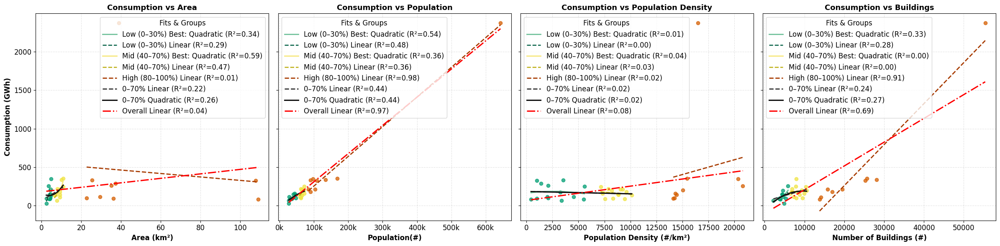

📊 R² summaries per subplot:

— Area —
  Low (0–30%): Linear R²=0.292, Best=Quadratic (R²=0.336)
  Mid (40–70%): Linear R²=0.474, Best=Quadratic (R²=0.593)
  High (80–100%): Linear R²=0.011
  0–70% aggregate: Linear R²=0.224, Quadratic R²=0.256
  Overall Linear (0–100%): R²=0.037

— Population —
  Low (0–30%): Linear R²=0.480, Best=Quadratic (R²=0.537)
  Mid (40–70%): Linear R²=0.359, Best=Quadratic (R²=0.365)
  High (80–100%): Linear R²=0.985
  0–70% aggregate: Linear R²=0.438, Quadratic R²=0.442
  Overall Linear (0–100%): R²=0.969

— Pop Dens —
  Low (0–30%): Linear R²=0.003, Best=Quadratic (R²=0.012)
  Mid (40–70%): Linear R²=0.033, Best=Quadratic (R²=0.040)
  High (80–100%): Linear R²=0.019
  0–70% aggregate: Linear R²=0.015, Quadratic R²=0.015
  Overall Linear (0–100%): R²=0.078

— buildings —
  Low (0–30%): Linear R²=0.285, Best=Quadratic (R²=0.333)
  Mid (40–70%): Linear R²=0.000, Best=Quadratic (R²=0.003)
  High (80–100%): Linear R²=0.914
  0–70% aggregate: Linear R²=0.240, Quad

In [ ]:
# ================================
# BELOW PANEL: 1×4 regression with Population ticks at 100k
# ================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator, FuncFormatter  # <-- added

# ==== CONFIG ====
Y_COL = 'BBE SC1_100 – Consumption GWh'
Y_LABEL = 'Consumption (GWh)'
X_SPECS = [
    ('Area', 'Area (km²)', 'Consumption vs Area'),
    ('Population', 'Population(#)', 'Consumption vs Population'),
    ('Pop Dens', 'Population Density (#/km²)', 'Consumption vs Population Density'),
    ('buildings', 'Number of Buildings (#)', 'Consumption vs Buildings'),
]

# Scatter colors (percentile bands)
SCATTER_COLORS = {
    'Low (0–30%)':  '#009e73',   # green
    'Mid (40–70%)': '#f0e442',   # yellow
    'High (80–100%)': '#d55e00'  # red
}

# Line colors
LINE_COLORS_BEST = {
    'Low (0–30%)':  '#70c19a',
    'Mid (40–70%)': '#f7e77b'
}
LINE_COLORS_LIN = {
    'Low (0–30%)':  '#005f43',
    'Mid (40–70%)': '#bcae12',
    'High (80–100%)': '#a73a00'
}

def compute_r2(y_true, y_hat):
    ss_res = np.sum((y_true - y_hat)**2)
    ss_tot = np.sum((y_true - np.mean(y_true))**2)
    return 1 - ss_res / ss_tot if ss_tot > 0 else np.nan

def plot_one(ax, df, x_col, y_col, x_label, title, legend_fontsize=12):
    # Prepare data
    data = df[[x_col, y_col]].apply(pd.to_numeric, errors='coerce').dropna()
    x = data[x_col].to_numpy()
    y = data[y_col].to_numpy()
    if len(x) < 3:
        ax.set_title(f"{title}\n(Not enough data)")
        return {}

    # Percentiles
    p30, p40, p70, p80 = np.percentile(x, [30, 40, 70, 80])

    # Groups
    groups = {
        'Low (0–30%)': (x <= p30),
        'Mid (40–70%)': (x > p40) & (x <= p70),
        'High (80–100%)': (x > p80)
    }

    results = {}

    # --- Plot per-group points and fits ---
    for label, mask in groups.items():
        xg, yg = x[mask], y[mask]
        if len(xg) < 3:
            continue

        # Linear fit
        p_lin = np.polyfit(xg, yg, 1)
        y_lin = np.polyval(p_lin, xg)
        r2_lin = compute_r2(yg, y_lin)

        if "High" not in label:
            # Test best fit among linear, log, exp, quadratic
            forms = {'Linear': r2_lin}

            if np.all(xg > 0):
                p = np.polyfit(np.log(xg), yg, 1)
                forms['Logarithmic'] = compute_r2(yg, np.polyval(p, np.log(xg)))

            if np.all(yg > 0):
                p = np.polyfit(xg, np.log(yg), 1)
                forms['Exponential'] = compute_r2(yg, np.exp(np.polyval(p, xg)))

            p = np.polyfit(xg, yg, 2)
            forms['Quadratic'] = compute_r2(yg, np.polyval(p, xg))

            best_form = max(forms, key=forms.get)
            best_r2 = forms[best_form]
            results[label] = {'Linear': r2_lin, 'Best': (best_form, best_r2)}

            # Compute best-fit
            if best_form == 'Linear':
                y_best = y_lin
            elif best_form == 'Logarithmic':
                p = np.polyfit(np.log(xg), yg, 1)
                y_best = np.polyval(p, np.log(xg))
            elif best_form == 'Exponential':
                p = np.polyfit(xg, np.log(yg), 1)
                y_best = np.exp(np.polyval(p, xg))
            else:
                y_best = np.polyval(np.polyfit(xg, yg, 2), xg)

            # Scatter + lines
            order = np.argsort(xg)
            ax.scatter(xg, yg, color=SCATTER_COLORS[label], alpha=0.75, s=36)
            ax.plot(xg[order], y_best[order],
                    color=LINE_COLORS_BEST[label], linewidth=2.0,
                    label=f"{label} Best: {best_form} (R²={best_r2:.2f})")
            ax.plot(xg[order], y_lin[order],
                    color=LINE_COLORS_LIN[label], linestyle='--', linewidth=1.8,
                    label=f"{label} Linear (R²={r2_lin:.2f})")
        else:
            # High group: linear only
            order = np.argsort(xg)
            ax.scatter(xg, yg, color=SCATTER_COLORS[label], alpha=0.75, s=36)
            ax.plot(xg[order], y_lin[order],
                    color=LINE_COLORS_LIN[label], linestyle='--', linewidth=2.0,
                    label=f"{label} Linear (R²={r2_lin:.2f})")
            results[label] = {'Linear': r2_lin}

    # --- 0–70% combined fits ---
    mask_0_70 = (x <= p70)
    x_70, y_70 = x[mask_0_70], y[mask_0_70]
    if len(x_70) >= 3:
        p_lin_70 = np.polyfit(x_70, y_70, 1)
        r2_lin_70 = compute_r2(y_70, np.polyval(p_lin_70, x_70))

        p_quad_70 = np.polyfit(x_70, y_70, 2)
        r2_quad_70 = compute_r2(y_70, np.polyval(p_quad_70, x_70))

        order_70 = np.argsort(x_70)
        ax.plot(x_70[order_70], np.polyval(p_lin_70, x_70[order_70]),
                color='#333333', linestyle='--', linewidth=2.0,
                label=f"0–70% Linear (R²={r2_lin_70:.2f})")
        ax.plot(x_70[order_70], np.polyval(p_quad_70, x_70[order_70]),
                color='#111111', linestyle='-', linewidth=2.2,
                label=f"0–70% Quadratic (R²={r2_quad_70:.2f})")

    # --- Overall (0–100%) linear fit ---
    p_all = np.polyfit(x, y, 1)
    y_all = np.polyval(p_all, x)
    r2_all = compute_r2(y, y_all)
    order_all = np.argsort(x)
    ax.plot(x[order_all], y_all[order_all],
            color='red', linestyle='-.', linewidth=2.2,
            label=f"Overall Linear (R²={r2_all:.2f})")

    # --- Aesthetics ---
    ax.set_xlabel(x_label, fontsize=12, fontweight='bold')
    ax.set_title(title, fontsize=13, fontweight='bold')
    ax.grid(True, linestyle='--', alpha=0.35)
    ax.tick_params(axis='both', labelsize=12)

    # >>> Population ticks every 100k with 'k' labels <<<
    if x_col == 'Population':
        ax.xaxis.set_major_locator(MultipleLocator(100_000))
        ax.xaxis.set_major_formatter(FuncFormatter(lambda v, pos: f'{int(round(v/1000))}k'))

    ax.legend(title='Fits & Groups', frameon=True, fontsize=12, title_fontsize=12)

    results['_overall'] = r2_all
    if len(x_70) >= 3:
        results['_0_70'] = {'Linear': r2_lin_70, 'Quadratic': r2_quad_70}
    return results

# ==== CREATE 1×4 PANEL ====
fig, axes = plt.subplots(1, 4, figsize=(24, 6), sharey=True)
summaries = {}

for ax, (x_col, x_label, title) in zip(axes, X_SPECS):
    summaries[x_col] = plot_one(ax, df, x_col, Y_COL, x_label, title)

# Shared Y label
axes[0].set_ylabel(Y_LABEL, fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()

# ==== Console summaries ====
print("📊 R² summaries per subplot:")
for xname, res in summaries.items():
    print(f"\n— {xname} —")
    for k, v in res.items():
        if k in ('_overall', '_0_70'):
            continue
        if 'Best' in v:
            print(f"  {k}: Linear R²={v['Linear']:.3f}, Best={v['Best'][0]} (R²={v['Best'][1]:.3f})")
        else:
            print(f"  {k}: Linear R²={v['Linear']:.3f}")
    if '_0_70' in res:
        print(f"  0–70% aggregate: Linear R²={res['_0_70']['Linear']:.3f}, Quadratic R²={res['_0_70']['Quadratic']:.3f}")
    if '_overall' in res:
        print(f"  Overall Linear (0–100%): R²={res['_overall']:.3f}")


/tmp/ipython-input-2092052980.py:67: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-2092052980.py:67: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-2092052980.py:67: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-2092052980.py:67: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-2092052980.py:325: UserWarning: This figu

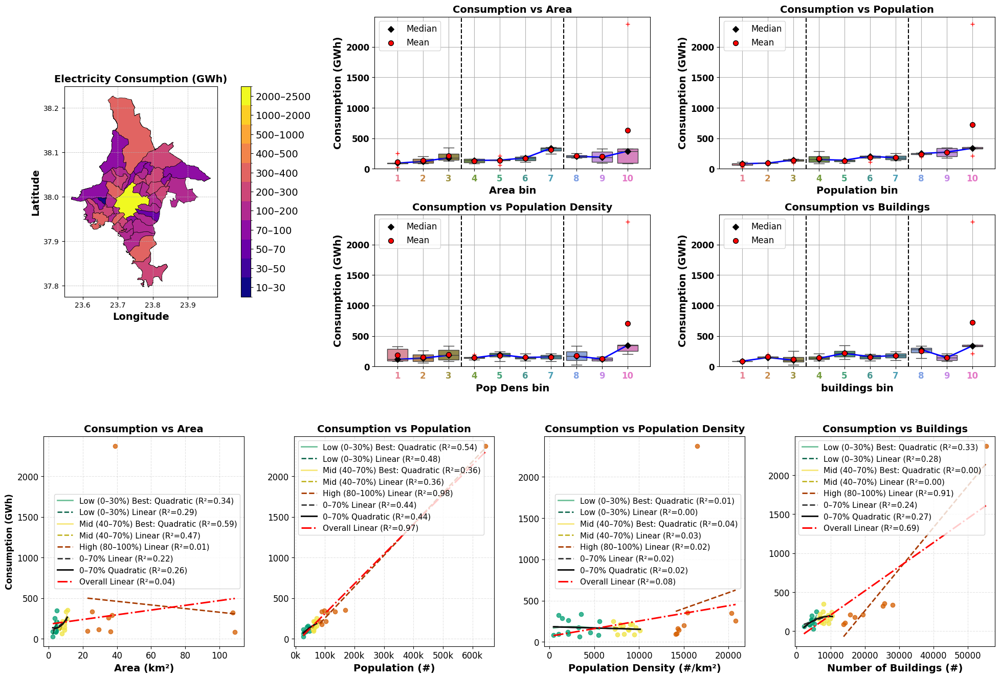

In [ ]:
# ================================
# Imports
# ================================
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib import colormaps
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colorbar as cbar
from matplotlib.ticker import MultipleLocator, FuncFormatter

# ================================
# Load and Prepare Data
# ================================
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"
excel_path     = "/content/drive/MyDrive/Athens.xlsx"

# --- Shapefile ---
gdf = gpd.read_file(shapefile_path).to_crs(epsg=4326)

# --- Excel ---
df = pd.read_excel(excel_path, sheet_name='Final')

# --- Merge key types ---
gdf["KWD_YPES"] = gdf["KWD_YPES"].astype(str)
df["KWD_YPES"]  = df["KWD_YPES"].astype(str)

# ================================
# What we're plotting
# ================================
Y_COL   = "BBE SC1_100 – Consumption GWh"
Y_LABEL = "Consumption (GWh)"

# --- Merge Consumption info for map ---
gdf = gdf.merge(df[["KWD_YPES", Y_COL]], on="KWD_YPES", how="left")
gdf[Y_COL] = gdf[Y_COL].fillna(0)

# --- Bins & colormap for map ---
bin_edges = [10, 30, 50, 70, 100, 200, 300, 400, 500, 1000, 2000, 2500]
n_bins = len(bin_edges) - 1
gdf["consumption_bin"] = pd.cut(gdf[Y_COL], bins=bin_edges, labels=False)

plasma = colormaps.get_cmap("plasma").resampled(n_bins)
cmap_map = ListedColormap([plasma(i) for i in range(plasma.N)])
norm = BoundaryNorm(np.arange(n_bins + 1), n_bins)

# --- Add binned columns for boxplots ---
num_bins = 10
df['Area_bin']       = pd.qcut(df['Area'], q=num_bins, labels=False)
df['Population_bin'] = pd.qcut(df['Population'], q=num_bins, labels=False)
df['Pop Dens_bin']   = pd.qcut(df['Pop Dens'], q=num_bins, labels=False)
df['buildings_bin']  = pd.qcut(df['buildings'], q=num_bins, labels=False)

# ================================
# Boxplot helper
# ================================
cmap_box = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

def plot_colored_boxplot_lined_panel(df_local, feature_bin, title, ax):
    palette = cmap_box.colors[:len(df_local[feature_bin].dropna().unique())]
    sns.boxplot(
        x=feature_bin,
        y=Y_COL,
        data=df_local,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    # medians/means per bin
    bin_medians = df_local.groupby(feature_bin)[Y_COL].median()
    bin_means   = df_local.groupby(feature_bin)[Y_COL].mean()
    x_vals      = list(range(len(bin_medians)))
    med_vals    = bin_medians.values
    mean_vals   = bin_means.values

    # connect segments: 1–3, 4–7, 8–10
    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.0)

    if len(x_vals) >= 3:  draw_segments([0, 1, 2])
    if len(x_vals) >= 7:  draw_segments([3, 4, 5, 6])
    if len(x_vals) >= 10: draw_segments([7, 8, 9])

    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel(Y_LABEL, fontsize=14, fontweight='bold')
    ax.set_xticks(x_vals)
    ax.set_xticklabels([str(i + 1) for i in x_vals], fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        if i < len(palette):
            label.set_color(palette[i])

    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    ymax = df_local[Y_COL].max() if df_local[Y_COL].notna().any() else 0
    ax.set_ylim(0, ymax * 1.05 if ymax > 0 else 1)
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')
    ax.grid(True)
    ax.legend(loc='upper left', fontsize=12)

# ================================
# Regression panel helper (bottom row)
# ================================
SCATTER_COLORS = {
    'Low (0–30%)':  '#009e73',
    'Mid (40–70%)': '#f0e442',
    'High (80–100%)': '#d55e00'
}
LINE_COLORS_BEST = {
    'Low (0–30%)':  '#70c19a',
    'Mid (40–70%)': '#f7e77b'
}
LINE_COLORS_LIN = {
    'Low (0–30%)':  '#005f43',
    'Mid (40–70%)': '#bcae12',
    'High (80–100%)': '#a73a00'
}

def compute_r2(y_true, y_hat):
    ss_res = np.sum((y_true - y_hat)**2)
    ss_tot = np.sum((y_true - np.mean(y_true))**2)
    return 1 - ss_res / ss_tot if ss_tot > 0 else np.nan

def plot_regression_panel(ax, df_local, x_col, x_label, title, legend_fontsize=12):
    data = df_local[[x_col, Y_COL]].apply(pd.to_numeric, errors='coerce').dropna()
    if data.empty or len(data) < 3:
        ax.set_title(f"{title}\n(Not enough data)")
        return

    x = data[x_col].to_numpy()
    y = data[Y_COL].to_numpy()

    # Percentiles per x var
    p30, p40, p70, p80 = np.percentile(x, [30, 40, 70, 80])

    groups = {
        'Low (0–30%)':     (x <= p30),
        'Mid (40–70%)':    (x > p40) & (x <= p70),
        'High (80–100%)':  (x > p80)
    }

    # Per-group fits
    for label, mask in groups.items():
        xg, yg = x[mask], y[mask]
        if len(xg) < 3:
            continue

        # Linear fit
        p_lin = np.polyfit(xg, yg, 1)
        y_lin = np.polyval(p_lin, xg)
        r2_lin = compute_r2(yg, y_lin)
        order = np.argsort(xg)

        ax.scatter(xg, yg, color=SCATTER_COLORS[label], alpha=0.75, s=36)

        if "High" not in label:
            # Best among linear, log, exp, quadratic (with R²)
            forms = {'Linear': r2_lin}

            y_best = y_lin
            best_form = 'Linear'
            best_r2 = r2_lin

            if np.all(xg > 0):
                p_log = np.polyfit(np.log(xg), yg, 1)
                y_log = np.polyval(p_log, np.log(xg))
                forms['Logarithmic'] = compute_r2(yg, y_log)

            if np.all(yg > 0):
                p_exp = np.polyfit(xg, np.log(yg), 1)
                y_exp = np.exp(np.polyval(p_exp, xg))
                forms['Exponential'] = compute_r2(yg, y_exp)

            p_quad = np.polyfit(xg, yg, 2)
            y_quad = np.polyval(p_quad, xg)
            forms['Quadratic'] = compute_r2(yg, y_quad)

            best_form = max(forms, key=forms.get)
            best_r2 = forms[best_form]
            if best_form == 'Logarithmic':
                y_best = y_log
            elif best_form == 'Exponential':
                y_best = y_exp
            elif best_form == 'Quadratic':
                y_best = y_quad

            ax.plot(xg[order], y_best[order],
                    color=LINE_COLORS_BEST[label], linewidth=2.0,
                    label=f"{label} Best: {best_form} (R²={best_r2:.2f})")
            ax.plot(xg[order], y_lin[order],
                    color=LINE_COLORS_LIN[label], linestyle='--', linewidth=1.8,
                    label=f"{label} Linear (R²={r2_lin:.2f})")
        else:
            # High group: linear only
            ax.plot(xg[order], y_lin[order],
                    color=LINE_COLORS_LIN[label], linestyle='--', linewidth=2.0,
                    label=f"{label} Linear (R²={r2_lin:.2f})")

    # 0–70% combined lines (with R²)
    mask_0_70 = (x <= p70)
    x_70, y_70 = x[mask_0_70], y[mask_0_70]
    if len(x_70) >= 3:
        p_lin_70  = np.polyfit(x_70, y_70, 1)
        y_lin_70  = np.polyval(p_lin_70, x_70)
        r2_lin_70 = compute_r2(y_70, y_lin_70)

        p_quad_70  = np.polyfit(x_70, y_70, 2)
        y_quad_70  = np.polyval(p_quad_70, x_70)
        r2_quad_70 = compute_r2(y_70, y_quad_70)

        ord70 = np.argsort(x_70)
        ax.plot(x_70[ord70], y_lin_70[ord70],
                color='#333333', linestyle='--', linewidth=2.0,
                label=f"0–70% Linear (R²={r2_lin_70:.2f})")
        ax.plot(x_70[ord70], y_quad_70[ord70],
                color='#111111', linestyle='-', linewidth=2.2,
                label=f"0–70% Quadratic (R²={r2_quad_70:.2f})")

    # Overall linear (0–100%) with R²
    p_all  = np.polyfit(x, y, 1)
    y_all  = np.polyval(p_all, x)
    r2_all = compute_r2(y, y_all)
    ord_all = np.argsort(x)
    ax.plot(x[ord_all], y_all[ord_all],
            color='red', linestyle='-.', linewidth=2.2,
            label=f"Overall Linear (R²={r2_all:.2f})")

    # Aesthetics
    ax.set_xlabel(x_label, fontsize=14, fontweight='bold')
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.grid(True, linestyle='--', alpha=0.35)
    ax.tick_params(axis='both', labelsize=12)

    # Population ticks every 100k with 'k' labels
    if x_col == 'Population':
        ax.xaxis.set_major_locator(MultipleLocator(100_000))
        ax.xaxis.set_major_formatter(FuncFormatter(lambda v, pos: f'{int(round(v/1000))}k'))

    ax.legend(frameon=True, fontsize=11)

# ================================
# Build ONE combined figure: Top (map+box) + Bottom (1×4 regression)
# ================================
fig = plt.figure(figsize=(24, 16))
outer_gs = fig.add_gridspec(2, 1, height_ratios=[2.0, 1.2], hspace=0.25)

# ---- Top row: spatial + 2x2 boxplots
top_gs = outer_gs[0].subgridspec(1, 2, width_ratios=[1, 3], wspace=0.3)

# Map
ax0 = fig.add_subplot(top_gs[0, 0])
gdf.plot(
    column="consumption_bin",
    cmap=cmap_map,
    linewidth=0.5,
    edgecolor="black",
    norm=norm,
    ax=ax0,
)

# Colorbar
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cb = cbar.ColorbarBase(
    cax,
    cmap=cmap_map,
    norm=norm,
    boundaries=np.arange(n_bins + 1),
    ticks=np.arange(n_bins) + 0.5,
    spacing="uniform",
    orientation="vertical"
)
cb.ax.set_yticklabels([f"{bin_edges[i]}–{bin_edges[i+1]}" for i in range(n_bins)])
cb.ax.tick_params(labelsize=14)

ax0.set_title("Electricity Consumption (GWh)", fontsize=14, fontweight="bold")
ax0.set_xlabel("Longitude", fontsize=14, fontweight="bold")
ax0.set_ylabel("Latitude", fontsize=14, fontweight="bold")
ax0.grid(True, linestyle='--', linewidth=0.5)

# 2×2 boxplots
right_gs = top_gs[0, 1].subgridspec(2, 2, hspace=0.3, wspace=0.25)
ax1 = fig.add_subplot(right_gs[0, 0])
ax2 = fig.add_subplot(right_gs[0, 1])
ax3 = fig.add_subplot(right_gs[1, 0])
ax4 = fig.add_subplot(right_gs[1, 1])

plot_colored_boxplot_lined_panel(df, 'Area_bin',       'Consumption vs Area',               ax1)
plot_colored_boxplot_lined_panel(df, 'Population_bin', 'Consumption vs Population',         ax2)
plot_colored_boxplot_lined_panel(df, 'Pop Dens_bin',   'Consumption vs Population Density', ax3)
plot_colored_boxplot_lined_panel(df, 'buildings_bin',  'Consumption vs Buildings',          ax4)

# ---- Bottom row: 1×4 regression panel
bottom_gs = outer_gs[1].subgridspec(1, 4, wspace=0.25)
axes = [fig.add_subplot(bottom_gs[0, i]) for i in range(4)]

X_SPECS = [
    ('Area', 'Area (km²)', 'Consumption vs Area'),
    ('Population', 'Population (#)', 'Consumption vs Population'),
    ('Pop Dens', 'Population Density (#/km²)', 'Consumption vs Population Density'),
    ('buildings', 'Number of Buildings (#)', 'Consumption vs Buildings'),
]

for axR, (x_col, x_label, title) in zip(axes, X_SPECS):
    plot_regression_panel(axR, df, x_col, x_label, title, legend_fontsize=12)

# Shared Y label for bottom row
axes[0].set_ylabel(Y_LABEL, fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()


/tmp/ipython-input-1079237953.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-1079237953.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-1079237953.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-1079237953.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-1079237953.py:345: UserWarning: This figu

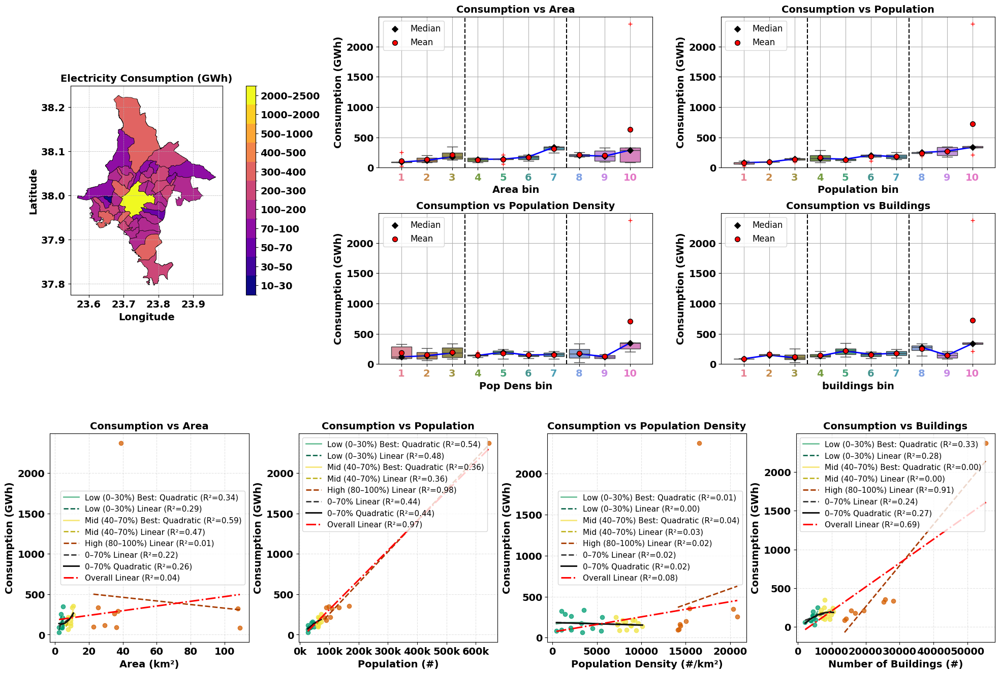

In [ ]:
# ================================
# Imports
# ================================
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib import colormaps
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colorbar as cbar
from matplotlib.ticker import MultipleLocator, FuncFormatter

# ================================
# Load and Prepare Data
# ================================
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"
excel_path     = "/content/drive/MyDrive/Athens.xlsx"

# --- Shapefile ---
gdf = gpd.read_file(shapefile_path).to_crs(epsg=4326)

# --- Excel ---
df = pd.read_excel(excel_path, sheet_name='Final')

# --- Merge key types ---
gdf["KWD_YPES"] = gdf["KWD_YPES"].astype(str)
df["KWD_YPES"]  = df["KWD_YPES"].astype(str)

# ================================
# What we're plotting
# ================================
Y_COL   = "BBE SC1_100 – Consumption GWh"
Y_LABEL = "Consumption (GWh)"

# --- Merge Consumption info for map ---
gdf = gdf.merge(df[["KWD_YPES", Y_COL]], on="KWD_YPES", how="left")
gdf[Y_COL] = gdf[Y_COL].fillna(0)

# --- Bins & colormap for map ---
bin_edges = [10, 30, 50, 70, 100, 200, 300, 400, 500, 1000, 2000, 2500]
n_bins = len(bin_edges) - 1
gdf["consumption_bin"] = pd.cut(gdf[Y_COL], bins=bin_edges, labels=False)

plasma = colormaps.get_cmap("plasma").resampled(n_bins)
cmap_map = ListedColormap([plasma(i) for i in range(plasma.N)])
norm = BoundaryNorm(np.arange(n_bins + 1), n_bins)

# --- Add binned columns for boxplots ---
num_bins = 10
df['Area_bin']       = pd.qcut(df['Area'], q=num_bins, labels=False)
df['Population_bin'] = pd.qcut(df['Population'], q=num_bins, labels=False)
df['Pop Dens_bin']   = pd.qcut(df['Pop Dens'], q=num_bins, labels=False)
df['buildings_bin']  = pd.qcut(df['buildings'], q=num_bins, labels=False)

# ================================
# Tick helper — make x/y ticks bold 14pt
# ================================
def _bold_ticks(ax, size=14):
    ax.tick_params(axis='both', labelsize=size)
    for t in ax.get_xticklabels() + ax.get_yticklabels():
        t.set_fontweight('bold')

# ================================
# Boxplot helper
# ================================
cmap_box = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

def plot_colored_boxplot_lined_panel(df_local, feature_bin, title, ax):
    palette = cmap_box.colors[:len(df_local[feature_bin].dropna().unique())]
    sns.boxplot(
        x=feature_bin,
        y=Y_COL,
        data=df_local,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    # medians/means per bin
    bin_medians = df_local.groupby(feature_bin)[Y_COL].median()
    bin_means   = df_local.groupby(feature_bin)[Y_COL].mean()
    x_vals      = list(range(len(bin_medians)))
    med_vals    = bin_medians.values
    mean_vals   = bin_means.values

    # connect segments: 1–3, 4–7, 8–10
    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.0)

    if len(x_vals) >= 3:  draw_segments([0, 1, 2])
    if len(x_vals) >= 7:  draw_segments([3, 4, 5, 6])
    if len(x_vals) >= 10: draw_segments([7, 8, 9])

    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel(Y_LABEL, fontsize=14, fontweight='bold')
    ax.set_xticks(x_vals)
    ax.set_xticklabels([str(i + 1) for i in x_vals], fontsize=14, fontweight='bold')

    # color bin labels
    for i, label in enumerate(ax.get_xticklabels()):
        if i < len(palette):
            label.set_color(palette[i])

    # y ticks bold 14
    _bold_ticks(ax, size=14)

    ymax = df_local[Y_COL].max() if df_local[Y_COL].notna().any() else 0
    ax.set_ylim(0, ymax * 1.05 if ymax > 0 else 1)
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')
    ax.grid(True)
    ax.legend(loc='upper left', fontsize=12)

# ================================
# Regression panel helper (bottom row)
# ================================
SCATTER_COLORS = {
    'Low (0–30%)':  '#009e73',
    'Mid (40–70%)': '#f0e442',
    'High (80–100%)': '#d55e00'
}
LINE_COLORS_BEST = {
    'Low (0–30%)':  '#70c19a',
    'Mid (40–70%)': '#f7e77b'
}
LINE_COLORS_LIN = {
    'Low (0–30%)':  '#005f43',
    'Mid (40–70%)': '#bcae12',
    'High (80–100%)': '#a73a00'
}

def compute_r2(y_true, y_hat):
    ss_res = np.sum((y_true - y_hat)**2)
    ss_tot = np.sum((y_true - np.mean(y_true))**2)
    return 1 - ss_res / ss_tot if ss_tot > 0 else np.nan

def plot_regression_panel(ax, df_local, x_col, x_label, title, legend_fontsize=12):
    data = df_local[[x_col, Y_COL]].apply(pd.to_numeric, errors='coerce').dropna()
    if data.empty or len(data) < 3:
        ax.set_title(f"{title}\n(Not enough data)", fontsize=14, fontweight='bold')
        ax.set_xlabel(x_label, fontsize=14, fontweight='bold')
        ax.set_ylabel(Y_LABEL, fontsize=14, fontweight='bold')
        _bold_ticks(ax, size=14)
        ax.grid(True, linestyle='--', alpha=0.35)
        return

    x = data[x_col].to_numpy()
    y = data[Y_COL].to_numpy()

    # Percentiles per x var
    p30, p40, p70, p80 = np.percentile(x, [30, 40, 70, 80])

    groups = {
        'Low (0–30%)':     (x <= p30),
        'Mid (40–70%)':    (x > p40) & (x <= p70),
        'High (80–100%)':  (x > p80)
    }

    # Per-group fits
    for label, mask in groups.items():
        xg, yg = x[mask], y[mask]
        if len(xg) < 3:
            continue

        # Linear fit
        p_lin = np.polyfit(xg, yg, 1)
        y_lin = np.polyval(p_lin, xg)
        r2_lin = compute_r2(yg, y_lin)
        order = np.argsort(xg)

        ax.scatter(xg, yg, color=SCATTER_COLORS[label], alpha=0.75, s=36)

        if "High" not in label:
            # Best among linear, log, exp, quadratic (with R²)
            forms = {'Linear': r2_lin}
            y_best = y_lin
            best_form = 'Linear'
            best_r2 = r2_lin

            if np.all(xg > 0):
                p_log = np.polyfit(np.log(xg), yg, 1)
                y_log = np.polyval(p_log, np.log(xg))
                forms['Logarithmic'] = compute_r2(yg, y_log)

            if np.all(yg > 0):
                p_exp = np.polyfit(xg, np.log(yg), 1)
                y_exp = np.exp(np.polyval(p_exp, xg))
                forms['Exponential'] = compute_r2(yg, y_exp)

            p_quad = np.polyfit(xg, yg, 2)
            y_quad = np.polyval(p_quad, xg)
            forms['Quadratic'] = compute_r2(yg, y_quad)

            best_form = max(forms, key=forms.get)
            best_r2 = forms[best_form]
            if best_form == 'Logarithmic':
                y_best = y_log
            elif best_form == 'Exponential':
                y_best = y_exp
            elif best_form == 'Quadratic':
                y_best = y_quad

            ax.plot(xg[order], y_best[order],
                    color=LINE_COLORS_BEST[label], linewidth=2.0,
                    label=f"{label} Best: {best_form} (R²={best_r2:.2f})")
            ax.plot(xg[order], y_lin[order],
                    color=LINE_COLORS_LIN[label], linestyle='--', linewidth=1.8,
                    label=f"{label} Linear (R²={r2_lin:.2f})")
        else:
            # High group: linear only
            ax.plot(xg[order], y_lin[order],
                    color=LINE_COLORS_LIN[label], linestyle='--', linewidth=2.0,
                    label=f"{label} Linear (R²={r2_lin:.2f})")

    # 0–70% combined lines (with R²)
    mask_0_70 = (x <= p70)
    x_70, y_70 = x[mask_0_70], y[mask_0_70]
    if len(x_70) >= 3:
        p_lin_70  = np.polyfit(x_70, y_70, 1)
        y_lin_70  = np.polyval(p_lin_70, x_70)
        r2_lin_70 = compute_r2(y_70, y_lin_70)

        p_quad_70  = np.polyfit(x_70, y_70, 2)
        y_quad_70  = np.polyval(p_quad_70, x_70)
        r2_quad_70 = compute_r2(y_70, y_quad_70)

        ord70 = np.argsort(x_70)
        ax.plot(x_70[ord70], y_lin_70[ord70],
                color='#333333', linestyle='--', linewidth=2.0,
                label=f"0–70% Linear (R²={r2_lin_70:.2f})")
        ax.plot(x_70[ord70], y_quad_70[ord70],
                color='#111111', linestyle='-', linewidth=2.2,
                label=f"0–70% Quadratic (R²={r2_quad_70:.2f})")

    # Overall linear (0–100%) with R²
    p_all  = np.polyfit(x, y, 1)
    y_all  = np.polyval(p_all, x)
    r2_all = compute_r2(y, y_all)
    ord_all = np.argsort(x)
    ax.plot(x[ord_all], y_all[ord_all],
            color='red', linestyle='-.', linewidth=2.2,
            label=f"Overall Linear (R²={r2_all:.2f})")

    # Aesthetics
    ax.set_xlabel(x_label, fontsize=14, fontweight='bold')
    ax.set_ylabel(Y_LABEL, fontsize=14, fontweight='bold')
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.grid(True, linestyle='--', alpha=0.35)

    # >>> ensure bold 14pt ticks on every regression axis
    _bold_ticks(ax, size=14)

    # Population ticks every 100k with 'k' labels
    if x_col == 'Population':
        ax.xaxis.set_major_locator(MultipleLocator(100_000))
        ax.xaxis.set_major_formatter(FuncFormatter(lambda v, pos: f'{int(round(v/1000))}k'))

    ax.legend(frameon=True, fontsize=11)

# ================================
# Build ONE combined figure: Top (map+box) + Bottom (1×4 regression)
# ================================
fig = plt.figure(figsize=(24, 16))
outer_gs = fig.add_gridspec(2, 1, height_ratios=[2.0, 1.2], hspace=0.25)

# ---- Top row: spatial + 2x2 boxplots
top_gs = outer_gs[0].subgridspec(1, 2, width_ratios=[1, 3], wspace=0.3)

# Map
ax0 = fig.add_subplot(top_gs[0, 0])
gdf.plot(
    column="consumption_bin",
    cmap=cmap_map,
    linewidth=0.5,
    edgecolor="black",
    norm=norm,
    ax=ax0,
)

# Colorbar
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cb = cbar.ColorbarBase(
    cax,
    cmap=cmap_map,
    norm=norm,
    boundaries=np.arange(n_bins + 1),
    ticks=np.arange(n_bins) + 0.5,
    spacing="uniform",
    orientation="vertical"
)
cb.ax.set_yticklabels([f"{bin_edges[i]}–{bin_edges[i+1]}" for i in range(n_bins)])
cb.ax.tick_params(labelsize=14)
# (Optional) make colorbar tick labels bold as well
for t in cb.ax.get_yticklabels():
    t.set_fontweight('bold')

ax0.set_title("Electricity Consumption (GWh)", fontsize=14, fontweight="bold")
ax0.set_xlabel("Longitude", fontsize=14, fontweight="bold")
ax0.set_ylabel("Latitude", fontsize=14, fontweight="bold")
ax0.grid(True, linestyle='--', linewidth=0.5)
# >>> bold 14pt ticks on the map
_bold_ticks(ax0, size=14)

# 2×2 boxplots
right_gs = top_gs[0, 1].subgridspec(2, 2, hspace=0.3, wspace=0.25)
ax1 = fig.add_subplot(right_gs[0, 0])
ax2 = fig.add_subplot(right_gs[0, 1])
ax3 = fig.add_subplot(right_gs[1, 0])
ax4 = fig.add_subplot(right_gs[1, 1])

plot_colored_boxplot_lined_panel(df, 'Area_bin',       'Consumption vs Area',               ax1)
plot_colored_boxplot_lined_panel(df, 'Population_bin', 'Consumption vs Population',         ax2)
plot_colored_boxplot_lined_panel(df, 'Pop Dens_bin',   'Consumption vs Population Density', ax3)
plot_colored_boxplot_lined_panel(df, 'buildings_bin',  'Consumption vs Buildings',          ax4)

# ---- Bottom row: 1×4 regression panel
bottom_gs = outer_gs[1].subgridspec(1, 4, wspace=0.25)
axes = [fig.add_subplot(bottom_gs[0, i]) for i in range(4)]

X_SPECS = [
    ('Area', 'Area (km²)', 'Consumption vs Area'),
    ('Population', 'Population (#)', 'Consumption vs Population'),
    ('Pop Dens', 'Population Density (#/km²)', 'Consumption vs Population Density'),
    ('buildings', 'Number of Buildings (#)', 'Consumption vs Buildings'),
]

for axR, (x_col, x_label, title) in zip(axes, X_SPECS):
    plot_regression_panel(axR, df, x_col, x_label, title, legend_fontsize=12)

# Shared Y label for bottom row
axes[0].set_ylabel(Y_LABEL, fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()


/tmp/ipython-input-2923797315.py:45: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap("YlGn", n_bins)
/tmp/ipython-input-2923797315.py:59: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-2923797315.py:59: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-2923797315.py:59: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxp

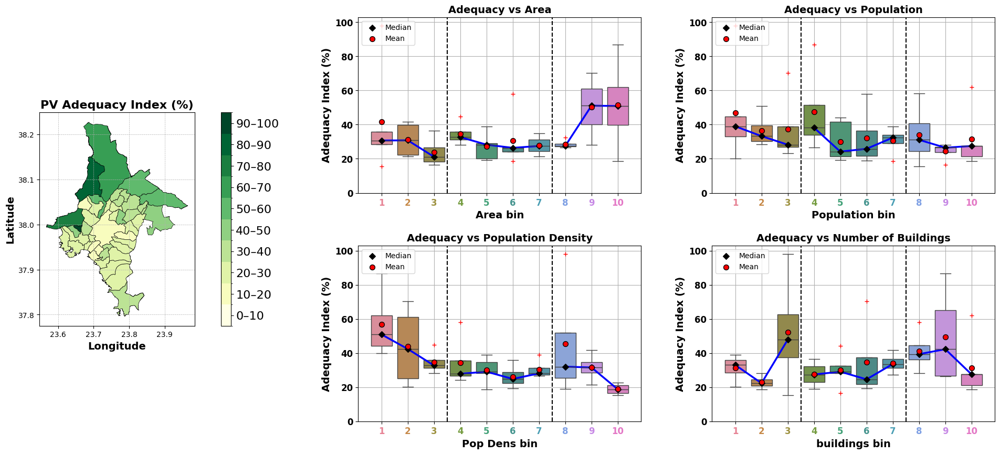

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib import cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colorbar as cbar
import numpy as np

# ================================
# Load and Prepare Data
# ================================

# --- Paths ---
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"
excel_path = "/content/drive/MyDrive/Athens.xlsx"

# --- Load shapefile and Excel ---
gdf = gpd.read_file(shapefile_path).to_crs(epsg=4326)
df = pd.read_excel(excel_path, sheet_name='Final')

# --- Ensure merge keys are strings ---
gdf["KWD_YPES"] = gdf["KWD_YPES"].astype(str)
df["KWD_YPES"] = df["KWD_YPES"].astype(str)

# --- Merge Adequacy column ---
gdf = gdf.merge(df[["KWD_YPES", "Adequacy"]], on="KWD_YPES", how="left")
gdf["Adequacy"] = gdf["Adequacy"].fillna(0) * 100
df["Adequacy_Index"] = df["Adequacy"].fillna(0) * 100

# --- Add binned columns for boxplots ---
num_bins = 10
df['Area_bin'] = pd.qcut(df['Area'], q=num_bins, labels=False)
df['Population_bin'] = pd.qcut(df['Population'], q=num_bins, labels=False)
df['Pop Dens_bin'] = pd.qcut(df['Pop Dens'], q=num_bins, labels=False)
df['buildings_bin'] = pd.qcut(df['buildings'], q=num_bins, labels=False)

# ================================
# Define Bin Settings and Colormap for Map
# ================================
bin_edges = list(range(0, 110, 10))
n_bins = len(bin_edges) - 1
gdf["adequacy_bin"] = pd.cut(gdf["Adequacy"], bins=bin_edges, labels=False)
colormap = cm.get_cmap("YlGn", n_bins)
cmap = ListedColormap([colormap(i) for i in range(n_bins)])
norm = BoundaryNorm(np.arange(n_bins + 1), n_bins)

# ================================
# Define Boxplot Function
# ================================
cmap_box = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

def plot_colored_boxplot_lined_panel(df, feature_bin, title, ax):
    palette = cmap_box.colors[:len(df[feature_bin].unique())]
    sns.boxplot(
        x=feature_bin,
        y='Adequacy_Index',
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )
    bin_medians = df.groupby(feature_bin)['Adequacy_Index'].median()
    bin_means = df.groupby(feature_bin)['Adequacy_Index'].mean()
    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    draw_segments([0, 1, 2])
    draw_segments([3, 4, 5, 6])
    draw_segments([7, 8, 9])

    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel('Adequacy Index (%)', fontsize=14, fontweight='bold')
    ax.set_xticks(x_vals)
    ax.set_xticklabels([str(i + 1) for i in x_vals], fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        label.set_color(palette[i])
    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')
    ax.set_ylim(0, df['Adequacy_Index'].max() * 1.05)
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')
    ax.grid(True)
    ax.legend(loc='upper left')

# ================================
# Composite Figure: Map + 2x2 Boxplots
# ================================
fig = plt.figure(figsize=(24, 10))
gs = fig.add_gridspec(1, 2, width_ratios=[1, 3], wspace=0.3)
#gs = fig.add_gridspec(2, 3, width_ratios=[1.2, 1, 1])

# --- Left: Map ---
ax0 = fig.add_subplot(gs[0])
gdf.plot(
    column="adequacy_bin",
    cmap=cmap,
    linewidth=0.5,
    edgecolor="black",
    norm=norm,
    ax=ax0,
)
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.1)
cb = cbar.ColorbarBase(
    cax,
    cmap=cmap,
    norm=norm,
    boundaries=np.arange(n_bins + 1),
    ticks=np.arange(n_bins) + 0.5,
    spacing="uniform",
    orientation="vertical"
)
cb.ax.set_yticklabels([f"{bin_edges[i]}–{bin_edges[i+1]}" for i in range(n_bins)])
cb.ax.tick_params(labelsize=16)

ax0.set_title("PV Adequacy Index (%)", fontsize=16, fontweight="bold")
ax0.set_xlabel("Longitude", fontsize=14, fontweight="bold")
ax0.set_ylabel("Latitude", fontsize=14, fontweight="bold")
ax0.grid(True, linestyle='--', linewiUsaullydth=0.5)

# --- Right: Panel of Boxplots ---
gs_right = gs[1].subgridspec(2, 2, hspace=0.3, wspace=0.25)
ax1 = fig.add_subplot(gs_right[0, 0])
ax2 = fig.add_subplot(gs_right[0, 1])
ax3 = fig.add_subplot(gs_right[1, 0])
ax4 = fig.add_subplot(gs_right[1, 1])

plot_colored_boxplot_lined_panel(df, 'Area_bin', 'Adequacy vs Area', ax1)
plot_colored_boxplot_lined_panel(df, 'Population_bin', 'Adequacy vs Population', ax2)
plot_colored_boxplot_lined_panel(df, 'Pop Dens_bin', 'Adequacy vs Population Density', ax3)
plot_colored_boxplot_lined_panel(df, 'buildings_bin', 'Adequacy vs Number of Buildings', ax4)

plt.tight_layout()
plt.show()


/tmp/ipython-input-3065986445.py:49: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ylgn = cm.get_cmap("YlGn", n_bins)
/tmp/ipython-input-3065986445.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3065986445.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3065986445.py:70: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(

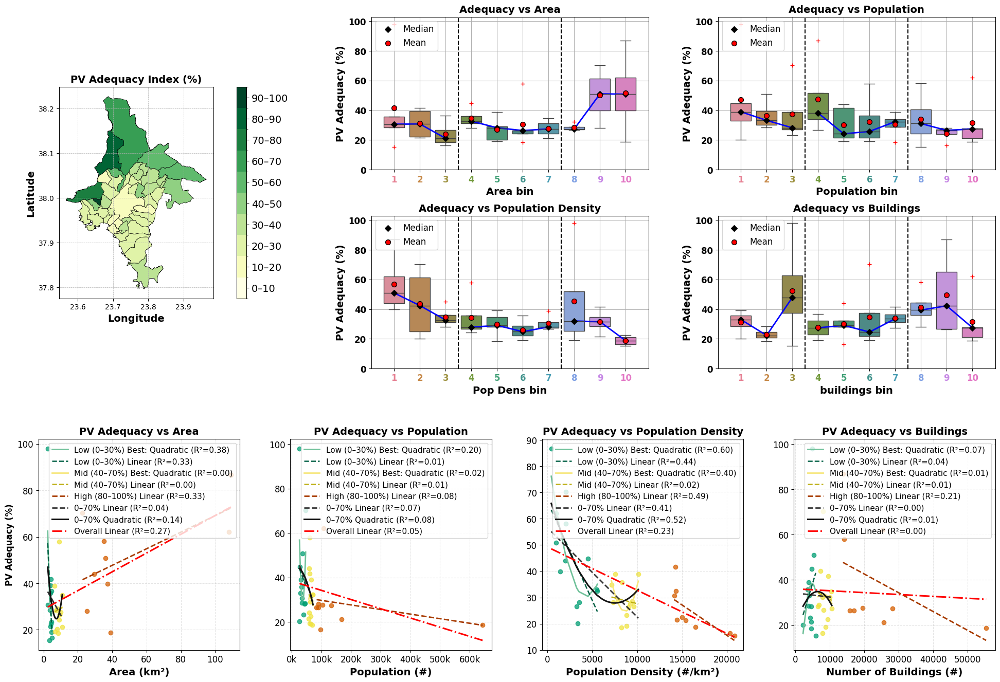

In [ ]:
# ================================
# Imports
# ================================
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib import colormaps, cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colorbar as cbar
from matplotlib.ticker import MultipleLocator, FuncFormatter

# ================================
# Load and Prepare Data
# ================================
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"
excel_path     = "/content/drive/MyDrive/Athens.xlsx"

# --- Shapefile ---
gdf = gpd.read_file(shapefile_path).to_crs(epsg=4326)

# --- Excel ---
df = pd.read_excel(excel_path, sheet_name='Final')

# --- Merge key types ---
gdf["KWD_YPES"] = gdf["KWD_YPES"].astype(str)
df["KWD_YPES"]  = df["KWD_YPES"].astype(str)

# ================================
# What we're plotting
# ================================
# Use percentage form everywhere
Y_COL    = "Adequacy_Index"        # in df
Y_LABEL  = "PV Adequacy (%)"
Y_MAP    = "Adequacy"              # in gdf after merge

# --- Merge Adequacy and scale to %
gdf = gdf.merge(df[["KWD_YPES", "Adequacy"]], on="KWD_YPES", how="left")
gdf[Y_MAP] = gdf["Adequacy"].fillna(0) * 100
df[Y_COL]  = df["Adequacy"].fillna(0) * 100

# --- Bins & colormap for map (0–100 by 10)
bin_edges = list(range(0, 110, 10))
n_bins = len(bin_edges) - 1
gdf["adequacy_bin"] = pd.cut(gdf[Y_MAP], bins=bin_edges, labels=False)

ylgn = cm.get_cmap("YlGn", n_bins)
cmap_map = ListedColormap([ylgn(i) for i in range(n_bins)])
norm = BoundaryNorm(np.arange(n_bins + 1), n_bins)

# --- Add binned columns for boxplots ---
num_bins = 10
df['Area_bin']       = pd.qcut(df['Area'], q=num_bins, labels=False)
df['Population_bin'] = pd.qcut(df['Population'], q=num_bins, labels=False)
df['Pop Dens_bin']   = pd.qcut(df['Pop Dens'], q=num_bins, labels=False)
df['buildings_bin']  = pd.qcut(df['buildings'], q=num_bins, labels=False)

# ================================
# Boxplot helper (top-right 2×2)
# ================================
cmap_box = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

def plot_colored_boxplot_lined_panel(df_local, feature_bin, title, ax):
    palette = cmap_box.colors[:len(df_local[feature_bin].dropna().unique())]
    sns.boxplot(
        x=feature_bin,
        y=Y_COL,
        data=df_local,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    # medians/means per bin
    bin_medians = df_local.groupby(feature_bin)[Y_COL].median()
    bin_means   = df_local.groupby(feature_bin)[Y_COL].mean()
    x_vals      = list(range(len(bin_medians)))
    med_vals    = bin_medians.values
    mean_vals   = bin_means.values

    # connect 1–3, 4–7, 8–10
    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.0)
    if len(x_vals) >= 3:  draw_segments([0, 1, 2])
    if len(x_vals) >= 7:  draw_segments([3, 4, 5, 6])
    if len(x_vals) >= 10: draw_segments([7, 8, 9])

    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel(Y_LABEL, fontsize=14, fontweight='bold')
    ax.set_xticks(x_vals)
    ax.set_xticklabels([str(i + 1) for i in x_vals], fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        if i < len(palette):
            label.set_color(palette[i])
    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')
    ymax = df_local[Y_COL].max() if df_local[Y_COL].notna().any() else 0
    ax.set_ylim(0, ymax * 1.05 if ymax > 0 else 1)
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')
    ax.grid(True)
    ax.legend(loc='upper left', fontsize=12)

# ================================
# Regression helpers (bottom row)
# ================================
SCATTER_COLORS = {
    'Low (0–30%)':  '#009e73',
    'Mid (40–70%)': '#f0e442',
    'High (80–100%)': '#d55e00'
}
LINE_COLORS_BEST = {
    'Low (0–30%)':  '#70c19a',
    'Mid (40–70%)': '#f7e77b'
}
LINE_COLORS_LIN = {
    'Low (0–30%)':  '#005f43',
    'Mid (40–70%)': '#bcae12',
    'High (80–100%)': '#a73a00'
}

def compute_r2(y_true, y_hat):
    ss_res = np.sum((y_true - y_hat)**2)
    ss_tot = np.sum((y_true - np.mean(y_true))**2)
    return 1 - ss_res / ss_tot if ss_tot > 0 else np.nan

def plot_regression_panel(ax, df_local, x_col, x_label, title, legend_fontsize=12):
    data = df_local[[x_col, Y_COL]].apply(pd.to_numeric, errors='coerce').dropna()
    if data.empty or len(data) < 3:
        ax.set_title(f"{title}\n(Not enough data)")
        return

    x = data[x_col].to_numpy()
    y = data[Y_COL].to_numpy()

    # Percentiles per x var
    p30, p40, p70, p80 = np.percentile(x, [30, 40, 70, 80])

    groups = {
        'Low (0–30%)':     (x <= p30),
        'Mid (40–70%)':    (x > p40) & (x <= p70),
        'High (80–100%)':  (x > p80)
    }

    # Per-group fits
    for label, mask in groups.items():
        xg, yg = x[mask], y[mask]
        if len(xg) < 3:
            continue

        # Linear fit
        p_lin = np.polyfit(xg, yg, 1)
        y_lin = np.polyval(p_lin, xg)
        r2_lin = compute_r2(yg, y_lin)
        order = np.argsort(xg)

        ax.scatter(xg, yg, color=SCATTER_COLORS[label], alpha=0.75, s=36)

        if "High" not in label:
            # Best among linear / log / exp / quadratic (with R²)
            forms = {'Linear': r2_lin}
            y_best = y_lin; best_form = 'Linear'; best_r2 = r2_lin

            if np.all(xg > 0):
                p_log = np.polyfit(np.log(xg), yg, 1)
                y_log = np.polyval(p_log, np.log(xg))
                forms['Logarithmic'] = compute_r2(yg, y_log)
            if np.all(yg > 0):
                p_exp = np.polyfit(xg, np.log(yg), 1)
                y_exp = np.exp(np.polyval(p_exp, xg))
                forms['Exponential'] = compute_r2(yg, y_exp)

            p_quad = np.polyfit(xg, yg, 2)
            y_quad = np.polyval(p_quad, xg)
            forms['Quadratic'] = compute_r2(yg, y_quad)

            best_form = max(forms, key=forms.get)
            best_r2 = forms[best_form]
            if best_form == 'Logarithmic': y_best = y_log
            elif best_form == 'Exponential': y_best = y_exp
            elif best_form == 'Quadratic':  y_best = y_quad

            ax.plot(xg[order], y_best[order],
                    color=LINE_COLORS_BEST[label], linewidth=2.0,
                    label=f"{label} Best: {best_form} (R²={best_r2:.2f})")
            ax.plot(xg[order], y_lin[order],
                    color=LINE_COLORS_LIN[label], linestyle='--', linewidth=1.8,
                    label=f"{label} Linear (R²={r2_lin:.2f})")
        else:
            # High group: linear only
            ax.plot(xg[order], y_lin[order],
                    color=LINE_COLORS_LIN[label], linestyle='--', linewidth=2.0,
                    label=f"{label} Linear (R²={r2_lin:.2f})")

    # 0–70% combined lines (with R²)
    mask_0_70 = (x <= p70)
    x_70, y_70 = x[mask_0_70], y[mask_0_70]
    if len(x_70) >= 3:
        p_lin_70  = np.polyfit(x_70, y_70, 1)
        y_lin_70  = np.polyval(p_lin_70, x_70)
        r2_lin_70 = compute_r2(y_70, y_lin_70)

        p_quad_70  = np.polyfit(x_70, y_70, 2)
        y_quad_70  = np.polyval(p_quad_70, x_70)
        r2_quad_70 = compute_r2(y_70, y_quad_70)

        ord70 = np.argsort(x_70)
        ax.plot(x_70[ord70], y_lin_70[ord70],
                color='#333333', linestyle='--', linewidth=2.0,
                label=f"0–70% Linear (R²={r2_lin_70:.2f})")
        ax.plot(x_70[ord70], y_quad_70[ord70],
                color='#111111', linestyle='-', linewidth=2.2,
                label=f"0–70% Quadratic (R²={r2_quad_70:.2f})")

    # Overall linear (0–100%) with R²
    p_all  = np.polyfit(x, y, 1)
    y_all  = np.polyval(p_all, x)
    r2_all = compute_r2(y, y_all)
    ord_all = np.argsort(x)
    ax.plot(x[ord_all], y_all[ord_all],
            color='red', linestyle='-.', linewidth=2.2,
            label=f"Overall Linear (R²={r2_all:.2f})")

    # Aesthetics
    ax.set_xlabel(x_label, fontsize=14, fontweight='bold')
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.grid(True, linestyle='--', alpha=0.35)
    ax.tick_params(axis='both', labelsize=12)

    # Population ticks every 100k with 'k' labels
    if x_col == 'Population':
        ax.xaxis.set_major_locator(MultipleLocator(100_000))
        ax.xaxis.set_major_formatter(FuncFormatter(lambda v, pos: f'{int(round(v/1000))}k'))

    ax.legend(frameon=True, fontsize=11)

# ================================
# Build ONE combined figure: Top (map+box) + Bottom (1×4 regression)
# ================================
fig = plt.figure(figsize=(24, 16))
outer_gs = fig.add_gridspec(2, 1, height_ratios=[2.0, 1.2], hspace=0.25)

# ---- Top row: spatial + 2×2 boxplots
top_gs = outer_gs[0].subgridspec(1, 2, width_ratios=[1, 3], wspace=0.3)

# Map
ax0 = fig.add_subplot(top_gs[0, 0])
gdf.plot(
    column="adequacy_bin",
    cmap=cmap_map,
    linewidth=0.5,
    edgecolor="black",
    norm=norm,
    ax=ax0,
)
# Colorbar
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cb = cbar.ColorbarBase(
    cax,
    cmap=cmap_map,
    norm=norm,
    boundaries=np.arange(n_bins + 1),
    ticks=np.arange(n_bins) + 0.5,
    spacing="uniform",
    orientation="vertical"
)
cb.ax.set_yticklabels([f"{bin_edges[i]}–{bin_edges[i+1]}" for i in range(n_bins)])
cb.ax.tick_params(labelsize=14)

ax0.set_title("PV Adequacy Index (%)", fontsize=14, fontweight="bold")
ax0.set_xlabel("Longitude", fontsize=14, fontweight="bold")
ax0.set_ylabel("Latitude", fontsize=14, fontweight="bold")
ax0.grid(True, linestyle='--', linewidth=0.5)

# 2×2 boxplots
right_gs = top_gs[0, 1].subgridspec(2, 2, hspace=0.3, wspace=0.25)
ax1 = fig.add_subplot(right_gs[0, 0])
ax2 = fig.add_subplot(right_gs[0, 1])
ax3 = fig.add_subplot(right_gs[1, 0])
ax4 = fig.add_subplot(right_gs[1, 1])

plot_colored_boxplot_lined_panel(df, 'Area_bin',       'Adequacy vs Area',               ax1)
plot_colored_boxplot_lined_panel(df, 'Population_bin', 'Adequacy vs Population',         ax2)
plot_colored_boxplot_lined_panel(df, 'Pop Dens_bin',   'Adequacy vs Population Density', ax3)
plot_colored_boxplot_lined_panel(df, 'buildings_bin',  'Adequacy vs Buildings',          ax4)

# ---- Bottom row: 1×4 regression panel
bottom_gs = outer_gs[1].subgridspec(1, 4, wspace=0.25)
axes = [fig.add_subplot(bottom_gs[0, i]) for i in range(4)]

X_SPECS = [
    ('Area', 'Area (km²)', 'PV Adequacy vs Area'),
    ('Population', 'Population (#)', 'PV Adequacy vs Population'),
    ('Pop Dens', 'Population Density (#/km²)', 'PV Adequacy vs Population Density'),
    ('buildings', 'Number of Buildings (#)', 'PV Adequacy vs Buildings'),
]

for axR, (x_col, x_label, title) in zip(axes, X_SPECS):
    plot_regression_panel(axR, df, x_col, x_label, title, legend_fontsize=12)

# Shared Y label for bottom row
axes[0].set_ylabel(Y_LABEL, fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()


/tmp/ipython-input-1295185097.py:49: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ylgn = cm.get_cmap("YlGn", n_bins)
/tmp/ipython-input-1295185097.py:76: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-1295185097.py:76: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-1295185097.py:76: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(

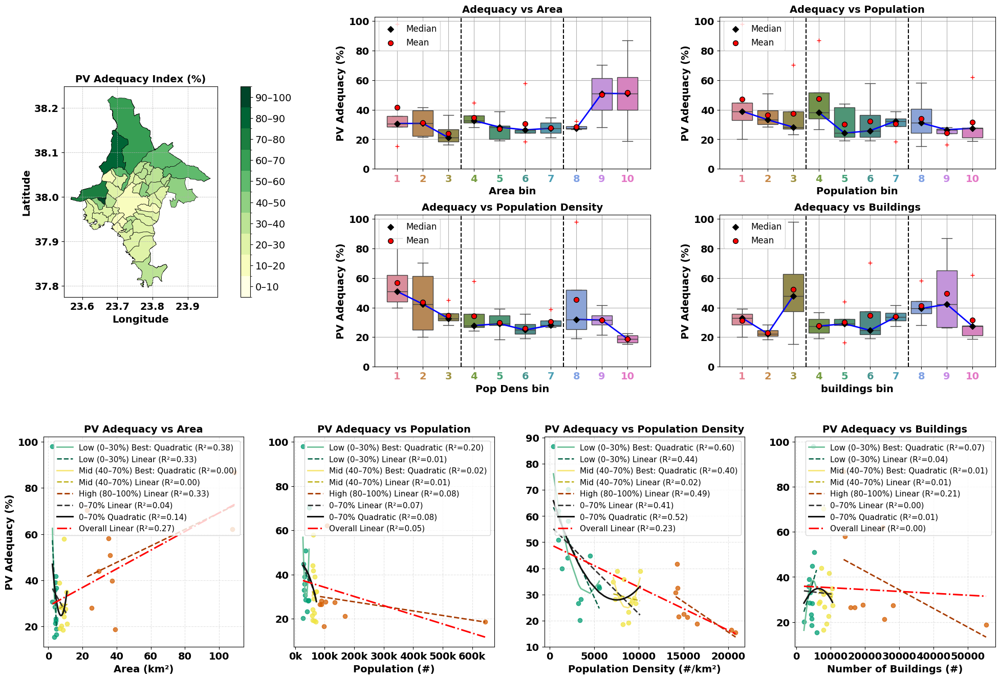

In [ ]:
# ================================
# Imports
# ================================
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib import colormaps, cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colorbar as cbar
from matplotlib.ticker import MultipleLocator, FuncFormatter

# ================================
# Load and Prepare Data
# ================================
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"
excel_path     = "/content/drive/MyDrive/Athens.xlsx"

# --- Shapefile ---
gdf = gpd.read_file(shapefile_path).to_crs(epsg=4326)

# --- Excel ---
df = pd.read_excel(excel_path, sheet_name='Final')

# --- Merge key types ---
gdf["KWD_YPES"] = gdf["KWD_YPES"].astype(str)
df["KWD_YPES"]  = df["KWD_YPES"].astype(str)

# ================================
# What we're plotting
# ================================
# Use percentage form everywhere
Y_COL    = "Adequacy_Index"        # in df
Y_LABEL  = "PV Adequacy (%)"
Y_MAP    = "Adequacy"              # in gdf after merge

# --- Merge Adequacy and scale to %
gdf = gdf.merge(df[["KWD_YPES", "Adequacy"]], on="KWD_YPES", how="left")
gdf[Y_MAP] = gdf["Adequacy"].fillna(0) * 100
df[Y_COL]  = df["Adequacy"].fillna(0) * 100

# --- Bins & colormap for map (0–100 by 10)
bin_edges = list(range(0, 110, 10))
n_bins = len(bin_edges) - 1
gdf["adequacy_bin"] = pd.cut(gdf[Y_MAP], bins=bin_edges, labels=False)

ylgn = cm.get_cmap("YlGn", n_bins)
cmap_map = ListedColormap([ylgn(i) for i in range(n_bins)])
norm = BoundaryNorm(np.arange(n_bins + 1), n_bins)

# --- Add binned columns for boxplots ---
num_bins = 10
df['Area_bin']       = pd.qcut(df['Area'], q=num_bins, labels=False)
df['Population_bin'] = pd.qcut(df['Population'], q=num_bins, labels=False)
df['Pop Dens_bin']   = pd.qcut(df['Pop Dens'], q=num_bins, labels=False)
df['buildings_bin']  = pd.qcut(df['buildings'], q=num_bins, labels=False)

# ================================
# Boxplot helper (top-right 2×2)
# ================================
cmap_box = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

def _bold_ticks(ax, size=14):
    """Make both x/y tick labels bold with given fontsize."""
    ax.tick_params(axis='both', labelsize=size)
    for t in ax.get_xticklabels() + ax.get_yticklabels():
        t.set_fontweight('bold')

def plot_colored_boxplot_lined_panel(df_local, feature_bin, title, ax):
    palette = cmap_box.colors[:len(df_local[feature_bin].dropna().unique())]
    sns.boxplot(
        x=feature_bin,
        y=Y_COL,
        data=df_local,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    # medians/means per bin
    bin_medians = df_local.groupby(feature_bin)[Y_COL].median()
    bin_means   = df_local.groupby(feature_bin)[Y_COL].mean()
    x_vals      = list(range(len(bin_medians)))
    med_vals    = bin_medians.values
    mean_vals   = bin_means.values

    # connect 1–3, 4–7, 8–10
    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.0)
    if len(x_vals) >= 3:  draw_segments([0, 1, 2])
    if len(x_vals) >= 7:  draw_segments([3, 4, 5, 6])
    if len(x_vals) >= 10: draw_segments([7, 8, 9])

    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel(Y_LABEL, fontsize=14, fontweight='bold')

    ax.set_xticks(x_vals)
    ax.set_xticklabels([str(i + 1) for i in x_vals], fontsize=14, fontweight='bold')
    # color by bin
    for i, label in enumerate(ax.get_xticklabels()):
        if i < len(palette):
            label.set_color(palette[i])

    # y ticks
    _bold_ticks(ax, size=14)

    ymax = df_local[Y_COL].max() if df_local[Y_COL].notna().any() else 0
    ax.set_ylim(0, ymax * 1.05 if ymax > 0 else 1)
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')
    ax.grid(True)
    ax.legend(loc='upper left', fontsize=12)

# ================================
# Regression helpers (bottom row)
# ================================
SCATTER_COLORS = {
    'Low (0–30%)':  '#009e73',
    'Mid (40–70%)': '#f0e442',
    'High (80–100%)': '#d55e00'
}
LINE_COLORS_BEST = {
    'Low (0–30%)':  '#70c19a',
    'Mid (40–70%)': '#f7e77b'
}
LINE_COLORS_LIN = {
    'Low (0–30%)':  '#005f43',
    'Mid (40–70%)': '#bcae12',
    'High (80–100%)': '#a73a00'
}

def compute_r2(y_true, y_hat):
    ss_res = np.sum((y_true - y_hat)**2)
    ss_tot = np.sum((y_true - np.mean(y_true))**2)
    return 1 - ss_res / ss_tot if ss_tot > 0 else np.nan

def plot_regression_panel(ax, df_local, x_col, x_label, title, legend_fontsize=12):
    data = df_local[[x_col, Y_COL]].apply(pd.to_numeric, errors='coerce').dropna()
    if data.empty or len(data) < 3:
        ax.set_title(f"{title}\n(Not enough data)", fontsize=14, fontweight='bold')
        ax.set_xlabel(x_label, fontsize=14, fontweight='bold')
        _bold_ticks(ax, size=14)
        ax.grid(True, linestyle='--', alpha=0.35)
        return

    x = data[x_col].to_numpy()
    y = data[Y_COL].to_numpy()

    # Percentiles per x var
    p30, p40, p70, p80 = np.percentile(x, [30, 40, 70, 80])

    groups = {
        'Low (0–30%)':     (x <= p30),
        'Mid (40–70%)':    (x > p40) & (x <= p70),
        'High (80–100%)':  (x > p80)
    }

    # Per-group fits
    for label, mask in groups.items():
        xg, yg = x[mask], y[mask]
        if len(xg) < 3:
            continue

        # Linear fit
        p_lin = np.polyfit(xg, yg, 1)
        y_lin = np.polyval(p_lin, xg)
        r2_lin = compute_r2(yg, y_lin)
        order = np.argsort(xg)

        ax.scatter(xg, yg, color=SCATTER_COLORS[label], alpha=0.75, s=36)

        if "High" not in label:
            # Best among linear / log / exp / quadratic (with R²)
            forms = {'Linear': r2_lin}
            y_best = y_lin; best_form = 'Linear'; best_r2 = r2_lin

            if np.all(xg > 0):
                p_log = np.polyfit(np.log(xg), yg, 1)
                y_log = np.polyval(p_log, np.log(xg))
                forms['Logarithmic'] = compute_r2(yg, y_log)
            if np.all(yg > 0):
                p_exp = np.polyfit(xg, np.log(yg), 1)
                y_exp = np.exp(np.polyval(p_exp, xg))
                forms['Exponential'] = compute_r2(yg, y_exp)

            p_quad = np.polyfit(xg, yg, 2)
            y_quad = np.polyval(p_quad, xg)
            forms['Quadratic'] = compute_r2(yg, y_quad)

            best_form = max(forms, key=forms.get)
            best_r2 = forms[best_form]
            if best_form == 'Logarithmic': y_best = y_log
            elif best_form == 'Exponential': y_best = y_exp
            elif best_form == 'Quadratic':  y_best = y_quad

            ax.plot(xg[order], y_best[order],
                    color=LINE_COLORS_BEST[label], linewidth=2.0,
                    label=f"{label} Best: {best_form} (R²={best_r2:.2f})")
            ax.plot(xg[order], y_lin[order],
                    color=LINE_COLORS_LIN[label], linestyle='--', linewidth=1.8,
                    label=f"{label} Linear (R²={r2_lin:.2f})")
        else:
            # High group: linear only
            ax.plot(xg[order], y_lin[order],
                    color=LINE_COLORS_LIN[label], linestyle='--', linewidth=2.0,
                    label=f"{label} Linear (R²={r2_lin:.2f})")

    # 0–70% combined lines (with R²)
    mask_0_70 = (x <= p70)
    x_70, y_70 = x[mask_0_70], y[mask_0_70]
    if len(x_70) >= 3:
        p_lin_70  = np.polyfit(x_70, y_70, 1)
        y_lin_70  = np.polyval(p_lin_70, x_70)
        r2_lin_70 = compute_r2(y_70, y_lin_70)

        p_quad_70  = np.polyfit(x_70, y_70, 2)
        y_quad_70  = np.polyval(p_quad_70, x_70)
        r2_quad_70 = compute_r2(y_70, y_quad_70)

        ord70 = np.argsort(x_70)
        ax.plot(x_70[ord70], y_lin_70[ord70],
                color='#333333', linestyle='--', linewidth=2.0,
                label=f"0–70% Linear (R²={r2_lin_70:.2f})")
        ax.plot(x_70[ord70], y_quad_70[ord70],
                color='#111111', linestyle='-', linewidth=2.2,
                label=f"0–70% Quadratic (R²={r2_quad_70:.2f})")

    # Overall linear (0–100%) with R²
    p_all  = np.polyfit(x, y, 1)
    y_all  = np.polyval(p_all, x)
    r2_all = compute_r2(y, y_all)
    ord_all = np.argsort(x)
    ax.plot(x[ord_all], y_all[ord_all],
            color='red', linestyle='-.', linewidth=2.2,
            label=f"Overall Linear (R²={r2_all:.2f})")

    # Aesthetics
    ax.set_xlabel(x_label, fontsize=14, fontweight='bold')
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.grid(True, linestyle='--', alpha=0.35)

    # >>> bold 14pt ticks everywhere in bottom panel <<<
    _bold_ticks(ax, size=14)

    # Population ticks every 100k with 'k' labels
    if x_col == 'Population':
        ax.xaxis.set_major_locator(MultipleLocator(100_000))
        ax.xaxis.set_major_formatter(FuncFormatter(lambda v, pos: f'{int(round(v/1000))}k'))

    ax.legend(frameon=True, fontsize=11)

# ================================
# Build ONE combined figure: Top (map+box) + Bottom (1×4 regression)
# ================================
fig = plt.figure(figsize=(24, 16))
outer_gs = fig.add_gridspec(2, 1, height_ratios=[2.0, 1.2], hspace=0.25)

# ---- Top row: spatial + 2×2 boxplots
top_gs = outer_gs[0].subgridspec(1, 2, width_ratios=[1, 3], wspace=0.3)

# Map
ax0 = fig.add_subplot(top_gs[0, 0])
gdf.plot(
    column="adequacy_bin",
    cmap=cmap_map,
    linewidth=0.5,
    edgecolor="black",
    norm=norm,
    ax=ax0,
)
# Colorbar
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.05)
cb = cbar.ColorbarBase(
    cax,
    cmap=cmap_map,
    norm=norm,
    boundaries=np.arange(n_bins + 1),
    ticks=np.arange(n_bins) + 0.5,
    spacing="uniform",
    orientation="vertical"
)
cb.ax.set_yticklabels([f"{bin_edges[i]}–{bin_edges[i+1]}" for i in range(n_bins)])
cb.ax.tick_params(labelsize=14)

ax0.set_title("PV Adequacy Index (%)", fontsize=14, fontweight="bold")
ax0.set_xlabel("Longitude", fontsize=14, fontweight="bold")
ax0.set_ylabel("Latitude", fontsize=14, fontweight="bold")
ax0.grid(True, linestyle='--', linewidth=0.5)

# >>> bold 14pt ticks on the map axes <<<
_bold_ticks(ax0, size=14)

# 2×2 boxplots
right_gs = top_gs[0, 1].subgridspec(2, 2, hspace=0.3, wspace=0.25)
ax1 = fig.add_subplot(right_gs[0, 0])
ax2 = fig.add_subplot(right_gs[0, 1])
ax3 = fig.add_subplot(right_gs[1, 0])
ax4 = fig.add_subplot(right_gs[1, 1])

plot_colored_boxplot_lined_panel(df, 'Area_bin',       'Adequacy vs Area',               ax1)
plot_colored_boxplot_lined_panel(df, 'Population_bin', 'Adequacy vs Population',         ax2)
plot_colored_boxplot_lined_panel(df, 'Pop Dens_bin',   'Adequacy vs Population Density', ax3)
plot_colored_boxplot_lined_panel(df, 'buildings_bin',  'Adequacy vs Buildings',          ax4)

# ---- Bottom row: 1×4 regression panel
bottom_gs = outer_gs[1].subgridspec(1, 4, wspace=0.25)
axes = [fig.add_subplot(bottom_gs[0, i]) for i in range(4)]

X_SPECS = [
    ('Area', 'Area (km²)', 'PV Adequacy vs Area'),
    ('Population', 'Population (#)', 'PV Adequacy vs Population'),
    ('Pop Dens', 'Population Density (#/km²)', 'PV Adequacy vs Population Density'),
    ('buildings', 'Number of Buildings (#)', 'PV Adequacy vs Buildings'),
]

for axR, (x_col, x_label, title) in zip(axes, X_SPECS):
    plot_regression_panel(axR, df, x_col, x_label, title, legend_fontsize=12)

# Shared Y label for bottom row
axes[0].set_ylabel(Y_LABEL, fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()


/tmp/ipython-input-1694470049.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-1694470049.py:28: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].median()
/tmp/ipython-input-1694470049.py:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].mean()
/tmp/ipython-input-1694470049.py:17: FutureWarning: 

Passi

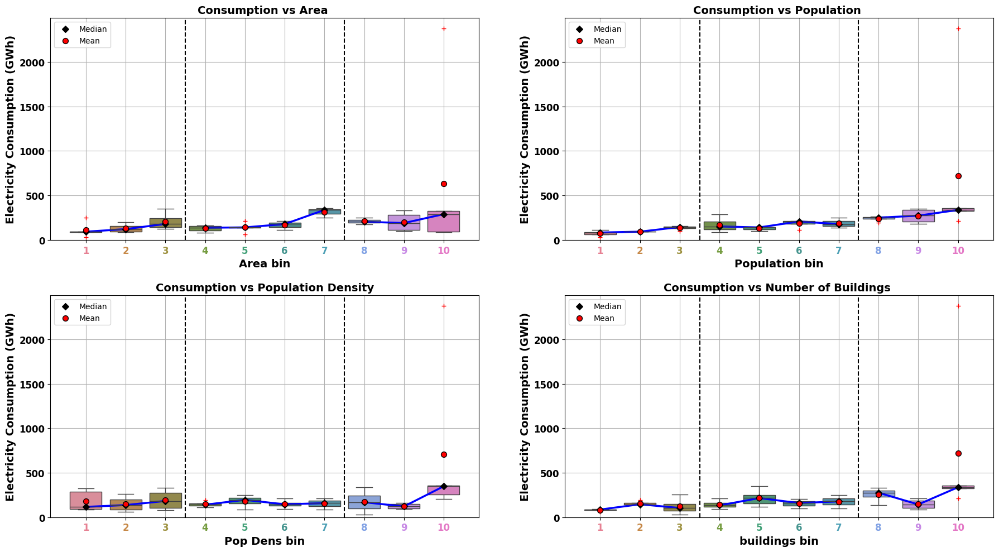

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm

# Define colormap
cmap = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

# Updated function
def plot_colored_boxplot_lined_panel(df, feature_bin, title, ax):
    palette = cmap.colors[:len(df[feature_bin].unique())]

    # Boxplot
    sns.boxplot(
        x=feature_bin,
        y='BBE SC1_100 – Consumption GWh',
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    # Medians & means
    bin_medians = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].median()
    bin_means = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].mean()

    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    # Median diamonds
    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)

    # Blue lines for LMH
    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    draw_segments([0, 1, 2])       # Low
    draw_segments([3, 4, 5, 6])    # Medium
    draw_segments([7, 8, 9])       # High

    # Mean points
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    # Styling
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel('Electricity Consumption (GWh)', fontsize=14, fontweight='bold')

    # Colored xticks
    tick_labels = [str(i + 1) for i in x_vals]
    ax.set_xticks(x_vals)
    ax.set_xticklabels(tick_labels, fontsize=12, fontweight='bold')
    for i,Usaully label in enumerate(ax.get_xticklabels()):
        label.set_color(palette[i])

    # Bold Y ticks
    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    # Limits and grid
    y_max = df['BBE SC1_100 – Consumption GWh'].max()
    ax.set_ylim(0, y_max * 1.05)
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')

    ax.grid(True)
    ax.legend(loc='upper left')


# === Panel Plot ===
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

plot_colored_boxplot_lined_panel(df, 'Area_bin', 'Consumption vs Area ', axes[0, 0])
plot_colored_boxplot_lined_panel(df, 'Population_bin', 'Consumption vs Population ', axes[0, 1])
plot_colored_boxplot_lined_panel(df, 'Pop Dens_bin', 'Consumption vs Population Density', axes[1, 0])
plot_colored_boxplot_lined_panel(df, 'buildings_bin', 'Consumption vs Number of Buildings ', axes[1, 1])

plt.tight_layout()
plt.subplots_adjust(hspace=0.25, wspace=0.2)
plt.show()


In [ ]:
# create few consistent indicators such energy consumptions per households (already present)
# energy cost per household (energy cost per resident * nos of resident per buildings)
# annual income per household (already present)

df['Energy cost per household'] = df['Energy cost per residents'] * df['Residents per building']


In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'Energy cost per household'],
      dtype='object')

In [ ]:
df = create_percentile_bins(df, 'Energy cost per household')
df = create_percentile_bins(df, 'annual income per household')
df= create_percentile_bins(df,'BBE SC1_100 – Consumption GWh')
df= create_percentile_bins(df,'PV Production Gwh – Only BBE')


In [ ]:
# Step 4: Calculate the Energy Poverty Index (EPI)
# Formula: EPI = (Energy Cost per Resident (eur) / Average Annual Income per Household (eur)) * 100
df['Energy Poverty Household'] = (df['Energy cost per household'] / df['annual income per household']) * 100


In [ ]:
df['Energy Poverty Threshold'] =df['annual income per household']*.10

In [ ]:
df[[ 'annual income per household', 'Energy cost per household','Energy Poverty Threshold', 'Energy Poverty Household']].head(10)


,annual income per household,Energy cost per household,Energy Poverty Threshold,Energy Poverty Household
0,32114,1526.032420,3211.4,4.751923
1,28262,552.279905,2826.2,1.954143
2,31011,4268.395828,3101.1,13.764135
3,31634,2280.510421,3163.4,7.209049
4,29857,2576.171538,2985.7,8.628367
5,31149,3157.199861,3114.9,10.135798
6,30193,2268.450907,3019.3,7.513168
7,32012,2158.172569,3201.2,6.741761
8,28557,1034.549681,2855.7,3.622753
9,31411,3391.263677,3141.1,10.796421


In [ ]:
# Filter rows where Energy Poverty Household > 10%
subset = df[df['Energy Poverty Household'] > 10]

# Extract municipality name and population
result = subset[['NAME', 'Population', 'Energy Poverty Household']]

# Sort by Energy Poverty Household (descending)
result_sorted = result.sort_values(by='Energy Poverty Household', ascending=False)

# Format output: "Municipality" - Population: XXXX (Energy Burden: XX.XX%)
formatted = '\n'.join(
    f'"{row.NAME}" - Population: {int(row.Population):,} (Energy Burden: {row["Energy Poverty Household"]:.2f}%)'
    for _, row in result_sorted.iterrows()
)

# Print
print(formatted)


"Kallithea" - Population: 97,616 (Energy Burden: 14.12%)
"Nea Smyrni" - Population: 72,853 (Energy Burden: 13.76%)
"Zografou" - Population: 69,874 (Energy Burden: 13.43%)
"Athens" - Population: 643,452 (Energy Burden: 13.09%)
"Palaio Faliro" - Population: 64,863 (Energy Burden: 12.09%)
"Meosxato – Tauros" - Population: 39,661 (Energy Burden: 10.80%)
"Amarousion" - Population: 71,830 (Energy Burden: 10.33%)
"Papagou – Cholargos" - Population: 45,266 (Energy Burden: 10.24%)
"Agia Paraskevi" - Population: 62,147 (Energy Burden: 10.22%)
"Galatsi" - Population: 57,709 (Energy Burden: 10.14%)


In [ ]:
total_population = df[df['Energy Poverty Household'] > 10]['Population'].sum()
print(f"Total population of municipalities with energy burden > 10%: {int(total_population):,}")


Total population of municipalities with energy burden > 10%: 1,225,271


In [ ]:
total_population_43_muni = df['Population'].sum()
print(f"Total population of 43 municipalities: {int(total_population_43_muni):,}")


Total population of 43 municipalities: 3,302,267


In [ ]:
pect_popu_energy_burden=total_population/total_population_43_muni*100
print(f"Total population energy burden of 43 municipalities: {pect_popu_energy_burden:,}")

Total population energy burden of 43 municipalities: 37.10393496346601


In [ ]:
total_building = df[df['Energy Poverty Household'] > 10]['buildings'].sum()
print(f"Total buidling of municipalities with energy burden > 10%: {int(total_building):,}")


total_building_43_muni = df['buildings'].sum()
print(f"Total building of 43 municipalities: {int(total_building_43_muni):,}")

pect_building_energy_burden=total_building/total_building_43_muni*100
print(f"Total building energy burden of 43 municipalities: {pect_building_energy_burden:,}")


Total buidling of municipalities with energy burden > 10%: 107,849
Total building of 43 municipalities: 457,547
Total building energy burden of 43 municipalities: 23.57113039753293


In [ ]:
total_area = df[df['Energy Poverty Household'] > 10]['Area'].sum()
print(f"Total buidling of municipalities with energy burden > 10%: {int(total_area):,}")


total_area_43_muni = df['Area'].sum()
print(f"Total building of 43 municipalities: {int(total_area_43_muni):,}")

pect_area_energy_burden=total_area/total_area_43_muni*100
print(f"Total building energy burden of 43 municipalities: {pect_area_energy_burden:,}")


Total buidling of municipalities with energy burden > 10%: 97
Total building of 43 municipalities: 681
Total building energy burden of 43 municipalities: 14.237487156905917


In [ ]:
df= create_percentile_bins(df,'Energy Poverty Threshold')

In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'Energy cost per household',
       'Energy cost per household_bin', 'annual income per household_bin',
       'BBE SC1_100 – Consumption GWh_bin', 'PV Production Gwh – Only BBE_bin',
       'Energy Poverty Household', 'Energy Poverty Threshold',
       'Energy Poverty Threshold_bin'],
      dtype='object')

In [ ]:
energy_cost_stats = df['Energy cost per household'].describe(percentiles=[0.05, 0.5, 0.95])

# Add standard deviation separately
energy_cost_stats['std'] = df['Energy cost per household'].std()

energy_cost_stats

,Energy cost per household
count,43.000000
mean,2184.789094
std,1025.967174
min,552.279905
5%,792.332374
50%,2143.418666
95%,4267.967647
max,4381.880965


In [ ]:
# Calculate mean energy cost
mean_cost = df['Energy cost per household'].mean()

# Filter municipalities above mean and sort descending
above_mean = df[df['Energy cost per household'] > mean_cost]
above_mean_sorted = above_mean.sort_values(by='Energy cost per household', ascending=False)

# Format the output
for _, row in above_mean_sorted.iterrows():
    print(f'"{row["NAME"]}" (€{row["Energy cost per household"]:.2f})')

# Count of municipalities above the mean
count_above_mean = above_mean.shape[0]
print(f'Count: {count_above_mean}')

"Kallithea" (€4381.88)
"Zografou" (€4277.10)
"Nea Smyrni" (€4268.40)
"Athens" (€4264.11)
"Palaio Faliro" (€3555.65)
"Meosxato – Tauros" (€3391.26)
"Amarousion" (€3176.72)
"Galatsi" (€3157.20)
"Agia Paraskevi" (€3121.38)
"Papagou – Cholargos" (€3028.82)
"Kaisariani" (€2853.31)
"Glyfada" (€2655.95)
"Vrilissia" (€2576.17)
"Vari – Voula – Vouliagmeni" (€2521.64)
"Filothei – Psychiko" (€2432.98)
"Alimos" (€2416.18)
"Chalandri" (€2363.30)
"Filadelphia" (€2280.51)
"Vyronas" (€2278.57)
"Lykovrysi – Peyki" (€2268.45)
Count: 20


In [ ]:
annual_income_stats = df['annual income per household'].describe(percentiles=[0.05, 0.5, 0.95])

# Add standard deviation separately
annual_income_stats['std'] = df['annual income per household'].std()

annual_income_stats

,annual income per household
count,43.000000
mean,30558.046512
std,1230.835217
min,27729.000000
5%,28266.800000
50%,30771.000000
95%,32103.800000
max,32585.000000


In [ ]:
# Calculate mean energy income
mean_income = df['annual income per household'].mean()

# Filter municipalities above mean and sort descending
above_mean_income = df[df['annual income per household'] > mean_income]
above_mean_sorted = above_mean.sort_values(by='annual income per household', ascending=False)

# Format the output
for _, row in above_mean_sorted.iterrows():
    print(f'"{row["NAME"]}" (€{row["annual income per household"]:.2f})')

# Count of municipalities above the mean
count_above_mean_income = above_mean_income.shape[0]
print(f'Count: {count_above_mean_income}')

"Athens" (€32585.00)
"Kaisariani" (€32260.00)
"Zografou" (€31842.00)
"Filadelphia" (€31634.00)
"Meosxato – Tauros" (€31411.00)
"Vyronas" (€31183.00)
"Galatsi" (€31149.00)
"Kallithea" (€31032.00)
"Nea Smyrni" (€31011.00)
"Amarousion" (€30745.00)
"Chalandri" (€30697.00)
"Agia Paraskevi" (€30530.00)
"Alimos" (€30351.00)
"Lykovrysi – Peyki" (€30193.00)
"Vrilissia" (€29857.00)
"Papagou – Cholargos" (€29592.00)
"Palaio Faliro" (€29407.00)
"Glyfada" (€29367.00)
"Filothei – Psychiko" (€29348.00)
"Vari – Voula – Vouliagmeni" (€27729.00)
Count: 24


In [ ]:
df["Energy Poverty Threshold_bin"]

,Energy Poverty Threshold_bin
0,3183.38-3258.50
1,2772.90-2871.52
2,3077.10-3113.70
3,3136.96-3167.72
4,2952.54-2988.10
5,3113.70-3136.96
6,2988.10-3033.70
7,3183.38-3258.50
8,2772.90-2871.52
9,3136.96-3167.72


In [ ]:
# Define the income range for 10th–20th percentile
income_min = 27729.00
income_max = 29881.40

# Filter rows where income falls in that range
subset = df[(df['annual income per household'] >= income_min) &
            (df['annual income per household'] < income_max)]

# Extract NAME and Energy Poverty Household
result = subset[['NAME', 'Energy Poverty Household']]

# Format for readability: "Municipality" (X.XX%)
formatted = ', '.join(f'"{row.NAME}" ({row["Energy Poverty Household"]:.2f}%)'
                      for _, row in result.iterrows())

# Print result
print(formatted)


"Agia Varbara" (1.95%), "Vrilissia" (8.63%), "Korydalos" (3.62%), "Palaio Faliro" (12.09%), "Filothei – Psychiko" (8.29%), "Papagou – Cholargos" (10.24%), "Keratsini" (3.53%), "Glyfada" (9.04%), "Kifissia" (6.80%), "Penteli" (5.89%), "Vari – Voula – Vouliagmeni" (9.09%), "Acharnai" (4.30%), "Fyli" (2.18%)


In [ ]:
# Define the income range for 10th–20th percentile
income_min = 27729.00
income_max = 29881.40

# Filter rows where income falls in that range
subset = df[(df['annual income per household'] >= income_min) &
            (df['annual income per household'] < income_max)]

# Extract NAME and Energy Poverty Household, and sort by Energy Poverty Household descending
result = subset[['NAME', 'Energy Poverty Household']].sort_values(
    by='Energy Poverty Household', ascending=False)

# Format for readability
formatted = ', '.join(f'"{row.NAME}" ({row["Energy Poverty Household"]:.2f}%)'
                      for _, row in result.iterrows())

# Print result
print(formatted)


"Palaio Faliro" (12.09%), "Papagou – Cholargos" (10.24%), "Vari – Voula – Vouliagmeni" (9.09%), "Glyfada" (9.04%), "Vrilissia" (8.63%), "Filothei – Psychiko" (8.29%), "Kifissia" (6.80%), "Penteli" (5.89%), "Acharnai" (4.30%), "Korydalos" (3.62%), "Keratsini" (3.53%), "Fyli" (2.18%), "Agia Varbara" (1.95%)


In [ ]:
# Define the income range for 10th–20th percentile
income_min = 29881.40
income_max = 31369.60

# Filter rows where income falls in that range
subset = df[(df['annual income per household'] >= income_min) &
            (df['annual income per household'] < income_max)]

# Extract NAME and Energy Poverty Household, and sort by Energy Poverty Household descending
result = subset[['NAME', 'Energy Poverty Household']].sort_values(
    by='Energy Poverty Household', ascending=False)

# Format for readability
formatted = ', '.join(f'"{row.NAME}" ({row["Energy Poverty Household"]:.2f}%)'
                      for _, row in result.iterrows())

# Print result
print(formatted)


"Kallithea" (14.12%), "Nea Smyrni" (13.76%), "Amarousion" (10.33%), "Agia Paraskevi" (10.22%), "Galatsi" (10.14%), "Alimos" (7.96%), "Chalandri" (7.70%), "Lykovrysi – Peyki" (7.51%), "Vyronas" (7.31%), "Elliniko – Argyroupoli" (6.97%), "Ilioupoli" (5.94%), "Peiraios" (4.53%), "Ilion" (4.28%), "Chaidari" (4.02%), "Nikaia – Agios I. Renti" (3.65%), "Egaleo" (3.27%), "Agioi Anargyroi – Kamatero" (2.45%)


In [ ]:
# Define the income range for 10th–20th percentile
income_min = 31833.80
income_max = 32585.00

# Filter rows where income falls in that range
subset = df[(df['annual income per household'] >= income_min) &
            (df['annual income per household'] < income_max)]

# Extract NAME and Energy Poverty Household, and sort by Energy Poverty Household descending
result = subset[['NAME', 'Energy Poverty Household']].sort_values(
    by='Energy Poverty Household', ascending=False)

# Format for readability
formatted = ', '.join(f'"{row.NAME}" ({row["Energy Poverty Household"]:.2f}%)'
                      for _, row in result.iterrows())

# Print result
print(formatted)


"Zografou" (13.43%), "Kaisariani" (8.84%), "Nea Ionia" (6.74%), "Dafni – Imittos" (4.75%)


/tmp/ipython-input-1258817885.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-1258817885.py:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)[y_var].median()
/tmp/ipython-input-1258817885.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)[y_var].mean()
/tmp/ipython-input-1258817885.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated a

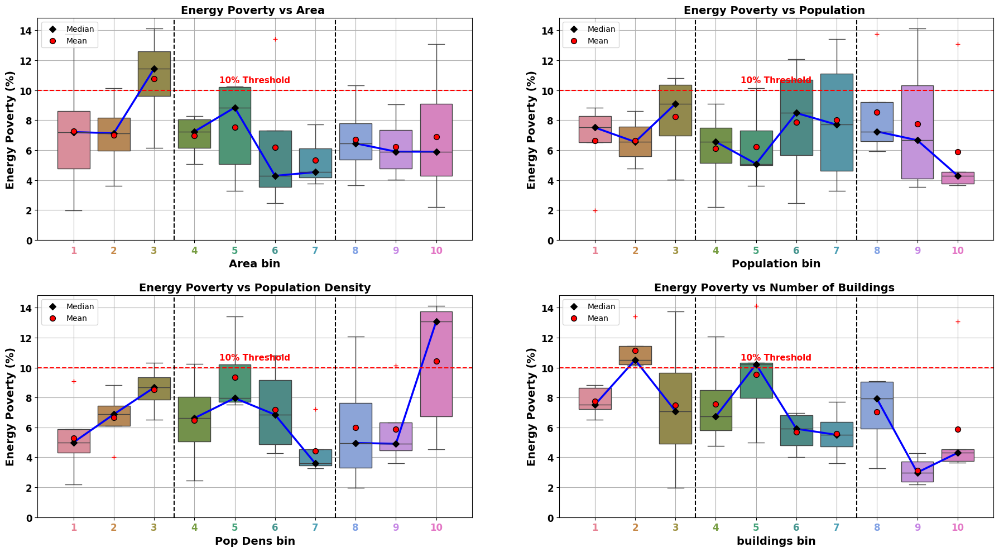

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm

# Define colormap
cmap = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

# Updated function
def plot_colored_boxplot_lined_panel(df, feature_bin, title, ax):
    y_var = 'Energy Poverty Household'
    palette = cmap.colors[:len(df[feature_bin].unique())]

    # Boxplot
    sns.boxplot(
        x=feature_bin,
        y=y_var,
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    # Medians & means
    bin_medians = df.groupby(feature_bin)[y_var].median()
    bin_means = df.groupby(feature_bin)[y_var].mean()

    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    # Median diamonds
    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)

    # Blue lines for LMH
    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    draw_segments([0, 1, 2])       # Low
    draw_segments([3, 4, 5, 6])    # Medium
    draw_segments([7, 8, 9])       # High

    # Mean points
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    # Styling
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel('Energy Poverty (%)', fontsize=14, fontweight='bold')

    # Colored xticks
    tick_labels = [str(i + 1) for i in x_vals]
    ax.set_xticks(x_vals)
    ax.set_xticklabels(tick_labels, fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        label.set_color(palette[i])

    # Bold Y ticks
    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    # Limits and grid
    y_max = max(df[y_var].max(), 12)
    ax.set_ylim(0, y_max * 1.05)

    # Threshold line
    ax.axhline(y=10, color='red', linestyle='--')
    ax.text((x_vals[0] + x_vals[-1]) / 2, 10.5, '10% Threshold', color='red',
        fontsize=11, fontweight='bold', ha='center')

    # Vertical separators
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')

    ax.grid(True)
    ax.legend(loc='upper left')


# === Panel Plot ===
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

plot_colored_boxplot_lined_panel(df, 'Area_bin', 'Energy Poverty vs Area ', axes[0, 0])
plot_colored_boxplot_lined_panel(df, 'Population_bin', 'Energy Poverty vs Population ', axes[0, 1])
plot_colored_boxplot_lined_panel(df, 'Pop Dens_bin', 'Energy Poverty vs Population Density', axes[1, 0])
plot_colored_boxplot_lined_panel(df, 'buildings_bin', 'Energy Poverty vs Number of Buildings ', axes[1, 1])

plt.tight_layout()
plt.subplots_adjust(hspace=0.25, wspace=0.2)
plt.show()


In [ ]:
df['Energy Poverty Household'].max()

14.120523862565399

In [ ]:
df['Energy Poverty Household'].min()

1.9541430363042178

In [ ]:
min_energy_burden_row = df.loc[df['Energy Poverty Household'].idxmin()]


In [ ]:
print("Municipality with the minimum  Consumption:")
print(f"- {min_energy_burden_row['NAME']} (Energy burden: {min_energy_burden_row['Energy Poverty Household']:.2f})")

Municipality with the minimum  Consumption:
- Agia Varbara (Energy burden: 1.95)


In [ ]:
max_energy_burden_row = df.loc[df['Energy Poverty Household'].idxmax()]
print(f"- {max_energy_burden_row['NAME']} (Energy burden: {max_energy_burden_row['Energy Poverty Household']:.2f})")


- Kallithea (Energy burden: 14.12)


In [ ]:
max_energy_burden_rows = df.loc[df['Energy Poverty Household'] > 10]

for _, row in max_energy_burden_rows.iterrows():
    print(f"- {row['NAME']} (Energy burden: {row['Energy Poverty Household']:.2f}%)")



- Nea Smyrni (Energy burden: 13.76%)
- Galatsi (Energy burden: 10.14%)
- Meosxato – Tauros (Energy burden: 10.80%)
- Palaio Faliro (Energy burden: 12.09%)
- Kallithea (Energy burden: 14.12%)
- Papagou – Cholargos (Energy burden: 10.24%)
- Agia Paraskevi (Energy burden: 10.22%)
- Zografou (Energy burden: 13.43%)
- Amarousion (Energy burden: 10.33%)
- Athens (Energy burden: 13.09%)


In [ ]:
municipalities = df.loc[df['Energy Poverty Household'] > 10, 'NAME']
formatted_names = ', '.join(f'"{name}"' for name in municipalities)
print(formatted_names)


"Nea Smyrni", "Galatsi", "Meosxato – Tauros", "Palaio Faliro", "Kallithea", "Papagou – Cholargos", "Agia Paraskevi", "Zografou", "Amarousion", "Athens"


In [ ]:
municipalities = df.loc[df['Energy Poverty Household'] > 10, ['NAME', 'Energy Poverty Household']]
formatted_names = ', '.join(f'"{row.NAME}" ({row["Energy Poverty Household"]:.2f}%)' for _, row in municipalities.iterrows())
print(formatted_names)


"Nea Smyrni" (13.76%), "Galatsi" (10.14%), "Meosxato – Tauros" (10.80%), "Palaio Faliro" (12.09%), "Kallithea" (14.12%), "Papagou – Cholargos" (10.24%), "Agia Paraskevi" (10.22%), "Zografou" (13.43%), "Amarousion" (10.33%), "Athens" (13.09%)


/tmp/ipython-input-731566205.py:59: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap("Reds", n_bins)
/tmp/ipython-input-731566205.py:80: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-731566205.py:80: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-731566205.py:80: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(

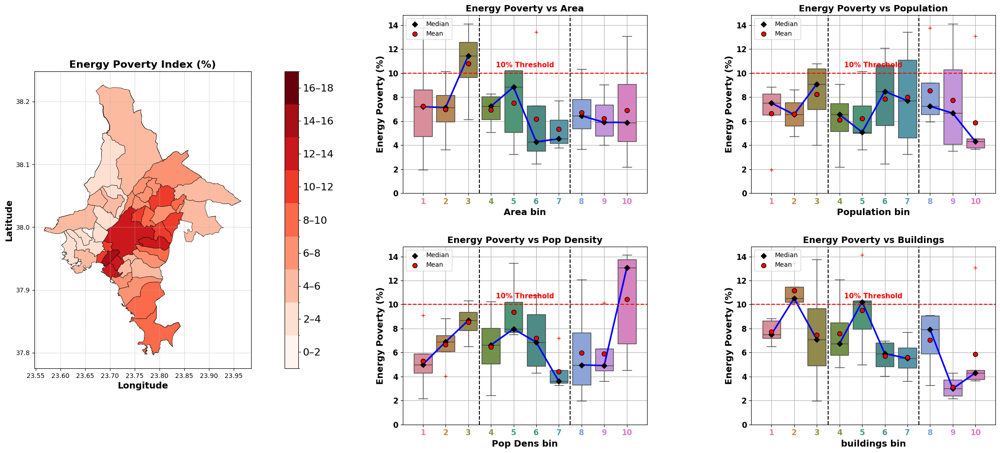

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib import cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colorbar as cbar
import numpy as np

# ================================
# Load and Prepare Data
# ================================

# --- File paths ---
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"
excel_path = "/content/drive/MyDrive/Athens.xlsx"

# --- Load shapefile and Excel ---
gdf = gpd.read_file(shapefile_path).to_crs(epsg=4326)
df = pd.read_excel(excel_path, sheet_name='Final')

# --- Harmonize merge key ---
gdf["KWD_YPES"] = gdf["KWD_YPES"].astype(str)
df["KWD_YPES"] = df["KWD_YPES"].astype(str)

# ================================
# Energy Poverty Calculation
# ================================

df['Energy cost per household'] = df['Energy cost per residents'] * df['Residents per building']
df['Energy Poverty Household'] = (df['Energy cost per household'] / df['annual income per household']) * 100

# ================================
# Binning for Boxplots
# ================================

num_bins = 10
df['Area_bin'] = pd.qcut(df['Area'], q=num_bins, labels=False)
df['Population_bin'] = pd.qcut(df['Population'], q=num_bins, labels=False)
df['Pop Dens_bin'] = pd.qcut(df['Pop Dens'], q=num_bins, labels=False)
df['buildings_bin'] = pd.qcut(df['buildings'], q=num_bins, labels=False)

# ================================
# Merge to GeoDataFrame
# ================================

gdf = gdf.merge(df[['KWD_YPES', 'Energy Poverty Household']], on='KWD_YPES', how='left')
gdf['Energy Poverty Household'] = gdf['Energy Poverty Household'].fillna(0)

# ================================
# Map Binning and Colormap
# ================================

bin_edges = list(range(0, 20, 2))  # 0–50% with 5% gaps
n_bins = len(bin_edges) - 1
gdf["poverty_bin"] = pd.cut(gdf["Energy Poverty Household"], bins=bin_edges, labels=False)

colormap = cm.get_cmap("Reds", n_bins)
cmap_map = ListedColormap([colormap(i) for i in range(n_bins)])
norm_map = BoundaryNorm(np.arange(n_bins + 1), n_bins)

# ================================
# Boxplot Colormap
# ================================

cmap_box = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

# ================================
# Boxplot Function
# ================================

def plot_colored_boxplot_lined_panel(df, feature_bin, title, ax):
    y_var = 'Energy Poverty Household'
    palette = cmap_box.colors[:len(df[feature_bin].unique())]

    sns.boxplot(
        x=feature_bin,
        y=y_var,
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    bin_medians = df.groupby(feature_bin)[y_var].median()
    bin_means = df.groupby(feature_bin)[y_var].mean()
    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    draw_segments([0, 1, 2])       # Low
    draw_segments([3, 4, 5, 6])    # Medium
    draw_segments([7, 8, 9])       # High

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel('Energy Poverty (%)', fontsize=14, fontweight='bold')
    ax.set_xticks(x_vals)
    ax.set_xticklabels([str(i + 1) for i in x_vals], fontsize=12, fontweight='bold')

    for i, label in enumerate(ax.get_xticklabels()):
        label.set_color(palette[i])

    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    ax.set_ylim(0, max(df[y_var].max(), 12) * 1.05)
    ax.axhline(y=10, color='red', linestyle='--')
    ax.text((x_vals[0] + x_vals[-1]) / 2, 10.5, '10% Threshold', color='red',
            fontsize=11, fontweight='bold', ha='center')
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')
    ax.grid(True)
    ax.legend(loc='upper left')

# ================================
# Composite Figure (Map + 4 Panels)
# ================================

fig = plt.figure(figsize=(22, 10))
gs = fig.add_gridspec(2, 3, width_ratios=[1.2, 1, 1])

# --- Spatial map (left side) ---
ax0 = fig.add_subplot(gs[:, 0])
gdf.plot(
    column="poverty_bin",
    cmap=cmap_map,
    linewidth=0.5,
    edgecolor="black",
    norm=norm_map,
    ax=ax0,
)
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.1)
cb = cbar.ColorbarBase(
    cax,
    cmap=cmap_map,
    norm=norm_map,
    boundaries=np.arange(n_bins + 1),
    ticks=np.arange(n_bins) + 0.5,
    spacing="uniform",
    orientation="vertical"
)
cb.ax.set_yticklabels([f"{bin_edges[i]}–{bin_edges[i+1]}" for i in range(n_bins)])
cb.ax.tick_params(labelsize=16)

ax0.set_title("Energy Poverty Index (%)", fontsize=16, fontweight="bold")
ax0.set_xlabel("Longitude", fontsize=14, fontweight="bold")
ax0.set_ylabel("Latitude", fontsize=14, fontweight="bold")
ax0.grid(True, linestyle="--", linewidth=0.5)

# --- Boxplots (right side) ---
plot_colored_boxplot_lined_panel(df, 'Area_bin', 'Energy Poverty vs Area', fig.add_subplot(gs[0, 1]))
plot_colored_boxplot_lined_panel(df, 'Population_bin', 'Energy Poverty vs Population', fig.add_subplot(gs[0, 2]))
plot_colored_boxplot_lined_panel(df, 'Pop Dens_bin', 'Energy Poverty vs Pop Density', fig.add_subplot(gs[1, 1]))
plot_colored_boxplot_lined_panel(df, 'buildings_bin', 'Energy Poverty vs Buildings', fig.add_subplot(gs[1, 2]))

plt.tight_layout()
plt.subplots_adjust(wspace=0.4, hspace=0.3)
plt.show()


In [ ]:
df['Energy Poverty Household'].max ()

14.120523862565399

/tmp/ipython-input-287114841.py:59: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap("Reds", n_bins)
/tmp/ipython-input-287114841.py:80: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-287114841.py:80: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-287114841.py:80: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(

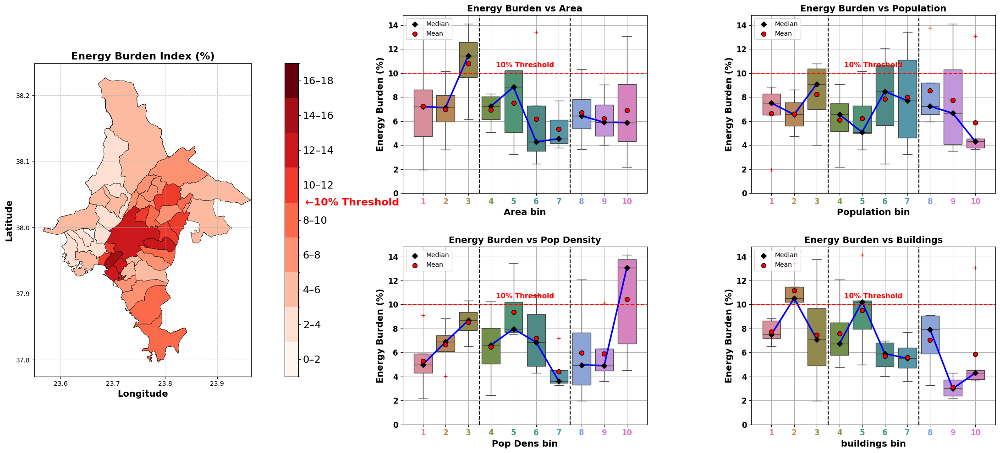

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib import cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colorbar as cbar
import numpy as np

# ================================
# Load and Prepare Data
# ================================

# --- File paths ---
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"
excel_path = "/content/drive/MyDrive/Athens.xlsx"

# --- Load shapefile and Excel ---
gdf = gpd.read_file(shapefile_path).to_crs(epsg=4326)
df = pd.read_excel(excel_path, sheet_name='Final')

# --- Harmonize merge key ---
gdf["KWD_YPES"] = gdf["KWD_YPES"].astype(str)
df["KWD_YPES"] = df["KWD_YPES"].astype(str)

# ================================
# Energy Poverty Calculation
# ================================

df['Energy cost per household'] = df['Energy cost per residents'] * df['Residents per building']
df['Energy Poverty Household'] = (df['Energy cost per household'] / df['annual income per household']) * 100

# ================================
# Binning for Boxplots
# ================================

num_bins = 10
df['Area_bin'] = pd.qcut(df['Area'], q=num_bins, labels=False)
df['Population_bin'] = pd.qcut(df['Population'], q=num_bins, labels=False)
df['Pop Dens_bin'] = pd.qcut(df['Pop Dens'], q=num_bins, labels=False)
df['buildings_bin'] = pd.qcut(df['buildings'], q=num_bins, labels=False)

# ================================
# Merge to GeoDataFrame
# ================================

gdf = gdf.merge(df[['KWD_YPES', 'Energy Poverty Household']], on='KWD_YPES', how='left')
gdf['Energy Poverty Household'] = gdf['Energy Poverty Household'].fillna(0)

# ================================
# Map Binning and Colormap
# ================================

bin_edges = list(range(0, 20, 2))  # 0–50% with 5% gaps
n_bins = len(bin_edges) - 1
gdf["poverty_bin"] = pd.cut(gdf["Energy Poverty Household"], bins=bin_edges, labels=False)

colormap = cm.get_cmap("Reds", n_bins)
cmap_map = ListedColormap([colormap(i) for i in range(n_bins)])
norm_map = BoundaryNorm(np.arange(n_bins + 1), n_bins)

# ================================
# Boxplot Colormap
# ================================

cmap_box = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

# ================================
# Boxplot Function
# ================================

def plot_colored_boxplot_lined_panel(df, feature_bin, title, ax):
    y_var = 'Energy Poverty Household'
    palette = cmap_box.colors[:len(df[feature_bin].unique())]

    sns.boxplot(
        x=feature_bin,
        y=y_var,
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    bin_medians = df.groupby(feature_bin)[y_var].median()
    bin_means = df.groupby(feature_bin)[y_var].mean()
    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    draw_segments([0, 1, 2])       # Low
    draw_segments([3, 4, 5, 6])    # Medium
    draw_segments([7, 8, 9])       # High

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel('Energy Burden (%)', fontsize=14, fontweight='bold')
    ax.set_xticks(x_vals)
    ax.set_xticklabels([str(i + 1) for i in x_vals], fontsize=12, fontweight='bold')

    for i, label in enumerate(ax.get_xticklabels()):
        label.set_color(palette[i])

    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    ax.set_ylim(0, max(df[y_var].max(), 12) * 1.05)
    ax.axhline(y=10, color='red', linestyle='--')
    ax.text((x_vals[0] + x_vals[-1]) / 2, 10.5, '10% Threshold', color='red',
            fontsize=11, fontweight='bold', ha='center')
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')
    ax.grid(True)
    ax.legend(loc='upper left')

# ================================
# Composite Figure (Map + 4 Panels)
# ================================

fig = plt.figure(figsize=(22, 10))
gs = fig.add_gridspec(2, 3, width_ratios=[1.2, 1, 1])

# --- Spatial map (left side) ---
ax0 = fig.add_subplot(gs[:, 0])
gdf.plot(
    column="poverty_bin",
    cmap=cmap_map,
    linewidth=0.5,
    edgecolor="black",
    norm=norm_map,
    ax=ax0,
)
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.1)
cb = cbar.ColorbarBase(
    cax,
    cmap=cmap_map,
    norm=norm_map,
    boundaries=np.arange(n_bins + 1),
    ticks=np.arange(n_bins) + 0.5,
    spacing="uniform",
    orientation="vertical"
)
cb.ax.set_yticklabels([f"{bin_edges[i]}–{bin_edges[i+1]}" for i in range(n_bins)])
cb.ax.tick_params(labelsize=16)

# Draw threshold line and label
threshold_val = 10
min_val = bin_edges[0]
max_val = bin_edges[-1]
normalized_y = (threshold_val - min_val) / (max_val - min_val)
cb.ax.axhline(y=normalized_y, color='none', linestyle='--', linewidth=2)
cb.ax.text(1.50, normalized_y, '←10% Threshold', color='red', fontsize=16,
           fontweight='bold', va='center', ha='left', transform=cb.ax.transAxes)


ax0.set_title("Energy Burden Index (%)", fontsize=16, fontweight="bold")
ax0.set_xlabel("Longitude", fontsize=14, fontweight="bold")
ax0.set_ylabel("Latitude", fontsize=14, fontweight="bold")
ax0.grid(True, linestyle="--", linewidth=0.5)
# Set longitude ticks manually
ax0.set_xticks(np.arange(23.6, 24.0, 0.1))
ax0.set_xlim(23.55, gdf.total_bounds[2])

# --- Boxplots (right side) ---
plot_colored_boxplot_lined_panel(df, 'Area_bin', 'Energy Burden vs Area', fig.add_subplot(gs[0, 1]))
plot_colored_boxplot_lined_panel(df, 'Population_bin', 'Energy Burden vs Population', fig.add_subplot(gs[0, 2]))
plot_colored_boxplot_lined_panel(df, 'Pop Dens_bin', 'Energy Burden vs Pop Density', fig.add_subplot(gs[1, 1]))
plot_colored_boxplot_lined_panel(df, 'buildings_bin', 'Energy Burden vs Buildings', fig.add_subplot(gs[1, 2]))

plt.tight_layout()
plt.subplots_adjust(wspace=0.4, hspace=0.3)
plt.show()


/tmp/ipython-input-3745731233.py:59: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap("Reds", n_bins)
/tmp/ipython-input-3745731233.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3745731233.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3745731233.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxp

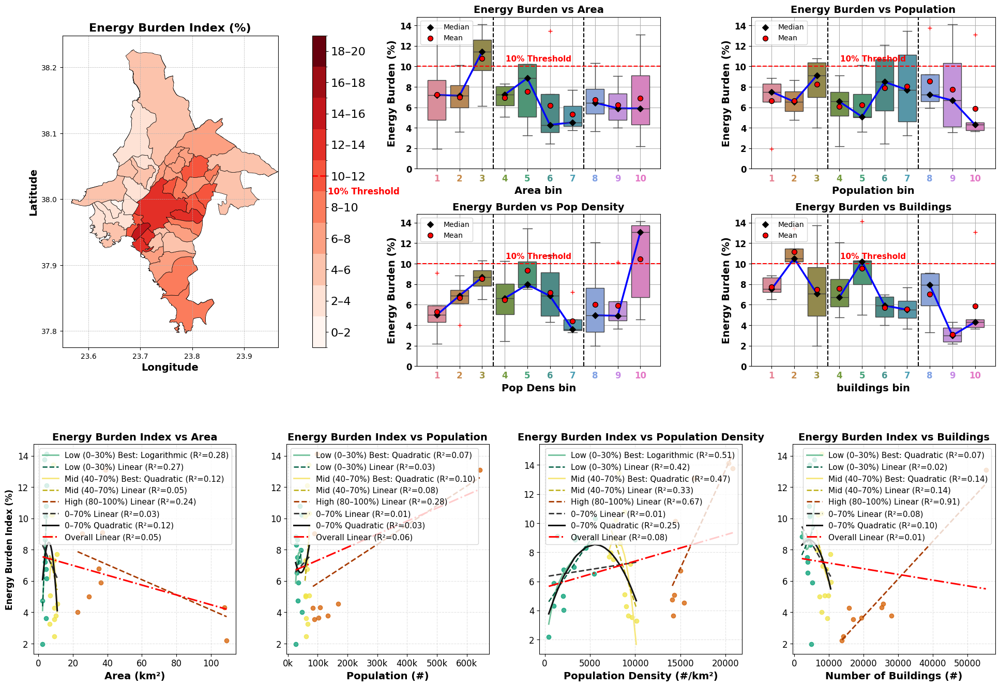

In [ ]:
# ================================
# Imports
# ================================
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib import cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colorbar as cbar
from matplotlib.ticker import MultipleLocator, FuncFormatter

# ================================
# Load and Prepare Data
# ================================
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"
excel_path     = "/content/drive/MyDrive/Athens.xlsx"

# --- Load shapefile and Excel ---
gdf = gpd.read_file(shapefile_path).to_crs(epsg=4326)
df  = pd.read_excel(excel_path, sheet_name='Final')

# --- Harmonize merge key ---
gdf["KWD_YPES"] = gdf["KWD_YPES"].astype(str)
df["KWD_YPES"]  = df["KWD_YPES"].astype(str)

# ================================
# Energy Poverty Calculation (Top & Bottom use this)
# ================================
df['Energy cost per household'] = df['Energy cost per residents'] * df['Residents per building']
df['Energy Poverty Household']  = (df['Energy cost per household'] / df['annual income per household']) * 100

# ================================
# Binning for Boxplots
# ================================
num_bins = 10
df['Area_bin']       = pd.qcut(df['Area'], q=num_bins, labels=False)
df['Population_bin'] = pd.qcut(df['Population'], q=num_bins, labels=False)
df['Pop Dens_bin']   = pd.qcut(df['Pop Dens'], q=num_bins, labels=False)
df['buildings_bin']  = pd.qcut(df['buildings'], q=num_bins, labels=False)

# ================================
# Merge to GeoDataFrame (for map)
# ================================
gdf = gdf.merge(df[['KWD_YPES', 'Energy Poverty Household']], on='KWD_YPES', how='left')
gdf['Energy Poverty Household'] = gdf['Energy Poverty Household'].fillna(0)

# ================================
# Map Binning and Colormap (Top panel)
# ================================
# Note: your comment mentioned 0–50 with 5% gaps, but your code used 0–20 with 2% gaps.
# Keeping your exact bins below:
bin_edges = list(range(0, 22, 2))  # 0–20% with 2% steps
n_bins    = len(bin_edges) - 1
gdf["poverty_bin"] = pd.cut(gdf["Energy Poverty Household"], bins=bin_edges, labels=False)

colormap = cm.get_cmap("Reds", n_bins)
cmap_map = ListedColormap([colormap(i) for i in range(n_bins)])
norm_map = BoundaryNorm(np.arange(n_bins + 1), n_bins)

# ================================
# Boxplot Colormap (Top panel)
# ================================
cmap_box = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

# ================================
# Boxplot Function (Top panel)
# ================================
def plot_colored_boxplot_lined_panel(df_local, feature_bin, title, ax):
    y_var = 'Energy Poverty Household'
    palette = cmap_box.colors[:len(df_local[feature_bin].dropna().unique())]

    sns.boxplot(
        x=feature_bin, y=y_var, data=df_local,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1, ax=ax
    )

    # Bin stats
    bin_medians = df_local.groupby(feature_bin)[y_var].median()
    bin_means   = df_local.groupby(feature_bin)[y_var].mean()
    x_vals      = list(range(len(bin_medians)))
    med_vals    = bin_medians.values
    mean_vals   = bin_means.values

    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    # Connect segments (1–3, 4–7, 8–10)
    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    if len(x_vals) >= 3:  draw_segments([0, 1, 2])     # Low
    if len(x_vals) >= 7:  draw_segments([3, 4, 5, 6])  # Medium
    if len(x_vals) >= 10: draw_segments([7, 8, 9])     # High

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel('Energy Burden (%)', fontsize=14, fontweight='bold')
    ax.set_xticks(x_vals)
    ax.set_xticklabels([str(i + 1) for i in x_vals], fontsize=12, fontweight='bold')

    # Color bin labels
    for i, label in enumerate(ax.get_xticklabels()):
        if i < len(palette):
            label.set_color(palette[i])

    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    # Y-limits + 10% threshold
    ax.set_ylim(0, max(df_local[y_var].max(), 12) * 1.05)
    ax.axhline(y=10, color='red', linestyle='--')
    ax.text((x_vals[0] + x_vals[-1]) / 2 if x_vals else 0.5, 10.5, '10% Threshold',
            color='red', fontsize=11, fontweight='bold', ha='center')
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')
    ax.grid(True)
    ax.legend(loc='upper left')

# ================================
# Regression helpers (Bottom panel)
# ================================
Y_COL   = 'Energy Poverty Household'
Y_LABEL = 'Energy Burden Index (%)'
SCATTER_COLORS = {
    'Low (0–30%)':  '#009e73',
    'Mid (40–70%)': '#f0e442',
    'High (80–100%)': '#d55e00'
}
LINE_COLORS_BEST = {
    'Low (0–30%)':  '#70c19a',
    'Mid (40–70%)': '#f7e77b'
}
LINE_COLORS_LIN = {
    'Low (0–30%)':  '#005f43',
    'Mid (40–70%)': '#bcae12',
    'High (80–100%)': '#a73a00'
}

def compute_r2(y_true, y_hat):
    ss_res = np.sum((y_true - y_hat)**2)
    ss_tot = np.sum((y_true - np.mean(y_true))**2)
    return 1 - ss_res / ss_tot if ss_tot > 0 else np.nan

def plot_regression_panel(ax, df_local, x_col, x_label, title, legend_fontsize=12):
    data = df_local[[x_col, Y_COL]].apply(pd.to_numeric, errors='coerce').dropna()
    if data.empty or len(data) < 3:
        ax.set_title(f"{title}\n(Not enough data)")
        return

    x = data[x_col].to_numpy()
    y = data[Y_COL].to_numpy()

    # Percentiles
    p30, p40, p70, p80 = np.percentile(x, [30, 40, 70, 80])
    groups = {
        'Low (0–30%)':    (x <= p30),
        'Mid (40–70%)':   (x > p40) & (x <= p70),
        'High (80–100%)': (x > p80)
    }

    # Plot groups and fits
    for label, mask in groups.items():
        xg, yg = x[mask], y[mask]
        if len(xg) < 3:
            continue

        # Linear
        p_lin = np.polyfit(xg, yg, 1)
        y_lin = np.polyval(p_lin, xg)
        r2_lin = compute_r2(yg, y_lin)
        order = np.argsort(xg)

        ax.scatter(xg, yg, color=SCATTER_COLORS[label], alpha=0.75, s=36)

        if "High" not in label:
            # Best of Linear/Log/Exp/Quadratic
            forms = {'Linear': r2_lin}
            y_best = y_lin; best_form = 'Linear'; best_r2 = r2_lin

            if np.all(xg > 0):
                p_log = np.polyfit(np.log(xg), yg, 1)
                y_log = np.polyval(p_log, np.log(xg))
                forms['Logarithmic'] = compute_r2(yg, y_log)
            if np.all(yg > 0):
                p_exp = np.polyfit(xg, np.log(yg), 1)
                y_exp = np.exp(np.polyval(p_exp, xg))
                forms['Exponential'] = compute_r2(yg, y_exp)

            p_quad = np.polyfit(xg, yg, 2)
            y_quad = np.polyval(p_quad, xg)
            forms['Quadratic'] = compute_r2(yg, y_quad)

            best_form = max(forms, key=forms.get)
            best_r2  = forms[best_form]
            if best_form == 'Logarithmic': y_best = y_log
            elif best_form == 'Exponential': y_best = y_exp
            elif best_form == 'Quadratic':  y_best = y_quad

            ax.plot(xg[order], y_best[order],
                    color=LINE_COLORS_BEST[label], linewidth=2.0,
                    label=f"{label} Best: {best_form} (R²={best_r2:.2f})")
            ax.plot(xg[order], y_lin[order],
                    color=LINE_COLORS_LIN[label], linestyle='--', linewidth=1.8,
                    label=f"{label} Linear (R²={r2_lin:.2f})")
        else:
            # High: linear only
            ax.plot(xg[order], y_lin[order],
                    color=LINE_COLORS_LIN[label], linestyle='--', linewidth=2.0,
                    label=f"{label} Linear (R²={r2_lin:.2f})")

    # 0–70% combined fits (with R²)
    mask_0_70 = (x <= p70)
    x_70, y_70 = x[mask_0_70], y[mask_0_70]
    if len(x_70) >= 3:
        p_lin_70  = np.polyfit(x_70, y_70, 1)
        y_lin_70  = np.polyval(p_lin_70, x_70)
        r2_lin_70 = compute_r2(y_70, y_lin_70)

        p_quad_70  = np.polyfit(x_70, y_70, 2)
        y_quad_70  = np.polyval(p_quad_70, x_70)
        r2_quad_70 = compute_r2(y_70, y_quad_70)

        ord70 = np.argsort(x_70)
        ax.plot(x_70[ord70], y_lin_70[ord70],
                color='#333333', linestyle='--', linewidth=2.0,
                label=f"0–70% Linear (R²={r2_lin_70:.2f})")
        ax.plot(x_70[ord70], y_quad_70[ord70],
                color='#111111', linestyle='-', linewidth=2.2,
                label=f"0–70% Quadratic (R²={r2_quad_70:.2f})")

    # Overall (0–100%) linear with R²
    p_all  = np.polyfit(x, y, 1)
    y_all  = np.polyval(p_all, x)
    r2_all = compute_r2(y, y_all)
    ord_all = np.argsort(x)
    ax.plot(x[ord_all], y_all[ord_all],
            color='red', linestyle='-.', linewidth=2.2,
            label=f"Overall Linear (R²={r2_all:.2f})")

    # Aesthetics
    ax.set_xlabel(x_label, fontsize=14, fontweight='bold')
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.grid(True, linestyle='--', alpha=0.35)
    ax.tick_params(axis='both', labelsize=12)

    # Population ticks every 100k, labeled as '100k'
    if x_col == 'Population':
        ax.xaxis.set_major_locator(MultipleLocator(100_000))
        ax.xaxis.set_major_formatter(FuncFormatter(lambda v, pos: f'{int(round(v/1000))}k'))

    ax.legend(frameon=True, fontsize=11)

# ================================
# Build ONE combined figure:
# Top = your updated panel, Bottom = regression 1×4
# ================================
fig = plt.figure(figsize=(24, 16))
outer_gs = fig.add_gridspec(2, 1, height_ratios=[2.0, 1.2], hspace=0.28)

# ---------- TOP PANEL (your layout) ----------
top_gs = outer_gs[0].subgridspec(2, 3, width_ratios=[1.2, 1, 1], wspace=0.35, hspace=0.3)

# Spatial map (left, whole height)
ax0 = fig.add_subplot(top_gs[:, 0])
gdf.plot(
    column="poverty_bin",
    cmap=cmap_map,
    linewidth=0.5,
    edgecolor="black",
    norm=norm_map,
    ax=ax0,
)

# Colorbar
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.1)
cb = cbar.ColorbarBase(
    cax,
    cmap=cmap_map,
    norm=norm_map,
    boundaries=np.arange(n_bins + 1),
    ticks=np.arange(n_bins) + 0.5,
    spacing="uniform",
    orientation="vertical"
)
cb.ax.set_yticklabels([f"{bin_edges[i]}–{bin_edges[i+1]}" for i in range(n_bins)])
cb.ax.tick_params(labelsize=16)

# Draw 10% threshold marker on colorbar at the right bin position
threshold_val = 10
# Find the continuous position within the BoundaryNorm scale:
# position y = bin_index + fraction_in_bin, where each bin is height 1.
if threshold_val <= bin_edges[0]:
    cb_y = 0.0 + 0.0
elif threshold_val >= bin_edges[-1]:
    cb_y = n_bins - 1e-6
else:
    # locate bin
    k = np.searchsorted(bin_edges, threshold_val, side='right') - 1
    k = max(0, min(k, n_bins - 1))
    f = (threshold_val - bin_edges[k]) / (bin_edges[k+1] - bin_edges[k] + 1e-12)
    cb_y = k + f
# Add a small horizontal line and label
cb.ax.hlines(cb_y + 0.5, xmin=0.0, xmax=1.0, colors='red', linestyles='--', linewidth=2, transform=cb.ax.get_yaxis_transform())
cb.ax.text(1.15, (cb_y + 0.5 - 0.5) / n_bins, '10% Threshold', color='red',
           fontsize=12, fontweight='bold', va='center', ha='left', transform=cb.ax.transAxes)

ax0.set_title("Energy Burden Index (%)", fontsize=16, fontweight="bold")
ax0.set_xlabel("Longitude", fontsize=14, fontweight="bold")
ax0.set_ylabel("Latitude",  fontsize=14, fontweight="bold")
ax0.grid(True, linestyle="--", linewidth=0.5)

# Optional: Set longitude ticks & limits similar to your snippet
try:
    ax0.set_xticks(np.arange(23.6, 24.0, 0.1))
    # keep right bound as dataset’s max lon
    ax0.set_xlim(23.55, gdf.total_bounds[2])
except Exception:
    pass

# Boxplots (right side, 2×2)
plot_colored_boxplot_lined_panel(df, 'Area_bin',       'Energy Burden vs Area',        fig.add_subplot(top_gs[0, 1]))
plot_colored_boxplot_lined_panel(df, 'Population_bin', 'Energy Burden vs Population',  fig.add_subplot(top_gs[0, 2]))
plot_colored_boxplot_lined_panel(df, 'Pop Dens_bin',   'Energy Burden vs Pop Density', fig.add_subplot(top_gs[1, 1]))
plot_colored_boxplot_lined_panel(df, 'buildings_bin',  'Energy Burden vs Buildings',   fig.add_subplot(top_gs[1, 2]))

# ---------- BOTTOM PANEL (regression 1×4) ----------
bottom_gs = outer_gs[1].subgridspec(1, 4, wspace=0.25)
axes = [fig.add_subplot(bottom_gs[0, i]) for i in range(4)]

X_SPECS = [
    ('Area', 'Area (km²)', 'Energy Burden Index vs Area'),
    ('Population', 'Population (#)', 'Energy Burden Index vs Population'),
    ('Pop Dens', 'Population Density (#/km²)', 'Energy Burden Index vs Population Density'),
    ('buildings', 'Number of Buildings (#)', 'Energy Burden Index vs Buildings'),
]

for axR, (x_col, x_label, title) in zip(axes, X_SPECS):
    plot_regression_panel(axR, df, x_col, x_label, title, legend_fontsize=12)

# Shared Y label for bottom row
axes[0].set_ylabel(Y_LABEL, fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()


/tmp/ipython-input-217801331.py:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap("Reds", n_bins)
/tmp/ipython-input-217801331.py:77: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-217801331.py:77: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-217801331.py:77: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(

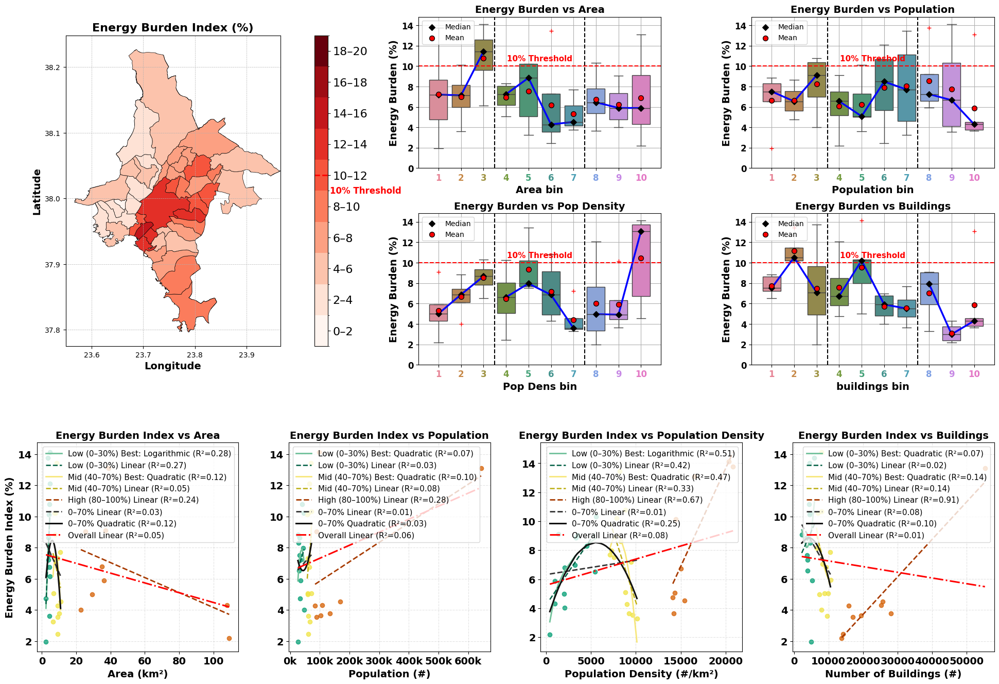

In [ ]:
# ================================
# Imports
# ================================
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib import cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colorbar as cbar
from matplotlib.ticker import MultipleLocator, FuncFormatter

# ================================
# Load and Prepare Data
# ================================
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"
excel_path     = "/content/drive/MyDrive/Athens.xlsx"

# --- Load shapefile and Excel ---
gdf = gpd.read_file(shapefile_path).to_crs(epsg=4326)
df  = pd.read_excel(excel_path, sheet_name='Final')

# --- Harmonize merge key ---
gdf["KWD_YPES"] = gdf["KWD_YPES"].astype(str)
df["KWD_YPES"]  = df["KWD_YPES"].astype(str)

# ================================
# Energy Poverty Calculation (Top & Bottom use this)
# ================================
df['Energy cost per household'] = df['Energy cost per residents'] * df['Residents per building']
df['Energy Poverty Household']  = (df['Energy cost per household'] / df['annual income per household']) * 100

# ================================
# Binning for Boxplots
# ================================
num_bins = 10
df['Area_bin']       = pd.qcut(df['Area'], q=num_bins, labels=False)
df['Population_bin'] = pd.qcut(df['Population'], q=num_bins, labels=False)
df['Pop Dens_bin']   = pd.qcut(df['Pop Dens'], q=num_bins, labels=False)
df['buildings_bin']  = pd.qcut(df['buildings'], q=num_bins, labels=False)

# ================================
# Merge to GeoDataFrame (for map)
# ================================
gdf = gdf.merge(df[['KWD_YPES', 'Energy Poverty Household']], on='KWD_YPES', how='left')
gdf['Energy Poverty Household'] = gdf['Energy Poverty Household'].fillna(0)

# ================================
# Map Binning and Colormap (Top panel)
# ================================
# Keeping your bins as provided: 0–20% with 2% steps
bin_edges = list(range(0, 22, 2))
n_bins    = len(bin_edges) - 1
gdf["poverty_bin"] = pd.cut(gdf["Energy Poverty Household"], bins=bin_edges, labels=False)

colormap = cm.get_cmap("Reds", n_bins)
cmap_map = ListedColormap([colormap(i) for i in range(n_bins)])
norm_map = BoundaryNorm(np.arange(n_bins + 1), n_bins)

# ================================
# Boxplot Colormap (Top panel)
# ================================
cmap_box = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

# ================================
# Boxplot Function (Top panel)
# ================================
def plot_colored_boxplot_lined_panel(df_local, feature_bin, title, ax):
    y_var = 'Energy Poverty Household'
    palette = cmap_box.colors[:len(df_local[feature_bin].dropna().unique())]

    sns.boxplot(
        x=feature_bin, y=y_var, data=df_local,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1, ax=ax
    )

    # Bin stats
    bin_medians = df_local.groupby(feature_bin)[y_var].median()
    bin_means   = df_local.groupby(feature_bin)[y_var].mean()
    x_vals      = list(range(len(bin_medians)))
    med_vals    = bin_medians.values
    mean_vals   = bin_means.values

    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    # Connect segments (1–3, 4–7, 8–10)
    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    if len(x_vals) >= 3:  draw_segments([0, 1, 2])     # Low
    if len(x_vals) >= 7:  draw_segments([3, 4, 5, 6])  # Medium
    if len(x_vals) >= 10: draw_segments([7, 8, 9])     # High

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel('Energy Burden (%)', fontsize=14, fontweight='bold')
    ax.set_xticks(x_vals)
    ax.set_xticklabels([str(i + 1) for i in x_vals], fontsize=12, fontweight='bold')

    # Color bin labels
    for i, label in enumerate(ax.get_xticklabels()):
        if i < len(palette):
            label.set_color(palette[i])

    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    # Y-limits + 10% threshold
    ax.set_ylim(0, max(df_local[y_var].max(), 12) * 1.05)
    ax.axhline(y=10, color='red', linestyle='--')
    ax.text((x_vals[0] + x_vals[-1]) / 2 if x_vals else 0.5, 10.5, '10% Threshold',
            color='red', fontsize=11, fontweight='bold', ha='center')
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')
    ax.grid(True)
    ax.legend(loc='upper left')

# ================================
# Regression helpers (Bottom panel)
# ================================
Y_COL   = 'Energy Poverty Household'
Y_LABEL = 'Energy Burden Index (%)'
SCATTER_COLORS = {
    'Low (0–30%)':  '#009e73',
    'Mid (40–70%)': '#f0e442',
    'High (80–100%)': '#d55e00'
}
LINE_COLORS_BEST = {
    'Low (0–30%)':  '#70c19a',
    'Mid (40–70%)': '#f7e77b'
}
LINE_COLORS_LIN = {
    'Low (0–30%)':  '#005f43',
    'Mid (40–70%)': '#bcae12',
    'High (80–100%)': '#a73a00'
}

def compute_r2(y_true, y_hat):
    ss_res = np.sum((y_true - y_hat)**2)
    ss_tot = np.sum((y_true - np.mean(y_true))**2)
    return 1 - ss_res / ss_tot if ss_tot > 0 else np.nan

def plot_regression_panel(ax, df_local, x_col, x_label, title, legend_fontsize=12):
    data = df_local[[x_col, Y_COL]].apply(pd.to_numeric, errors='coerce').dropna()
    if data.empty or len(data) < 3:
        ax.set_title(f"{title}\n(Not enough data)", fontsize=14, fontweight='bold')
        ax.set_xlabel(x_label, fontsize=14, fontweight='bold')
        ax.grid(True, linestyle='--', alpha=0.35)
        ax.tick_params(axis='both', labelsize=14)  # size 14
        # >>> bold ticks (fallback) <<<
        for t in ax.get_xticklabels() + ax.get_yticklabels():
            t.set_fontweight('bold')
        return

    x = data[x_col].to_numpy()
    y = data[Y_COL].to_numpy()

    # Percentiles
    p30, p40, p70, p80 = np.percentile(x, [30, 40, 70, 80])
    groups = {
        'Low (0–30%)':    (x <= p30),
        'Mid (40–70%)':   (x > p40) & (x <= p70),
        'High (80–100%)': (x > p80)
    }

    # Plot groups and fits
    for label, mask in groups.items():
        xg, yg = x[mask], y[mask]
        if len(xg) < 3:
            continue

        # Linear
        p_lin = np.polyfit(xg, yg, 1)
        y_lin = np.polyval(p_lin, xg)
        r2_lin = compute_r2(yg, y_lin)
        order = np.argsort(xg)

        ax.scatter(xg, yg, color=SCATTER_COLORS[label], alpha=0.75, s=36)

        if "High" not in label:
            # Best of Linear/Log/Exp/Quadratic
            forms = {'Linear': r2_lin}
            y_best = y_lin; best_form = 'Linear'; best_r2 = r2_lin

            if np.all(xg > 0):
                p_log = np.polyfit(np.log(xg), yg, 1)
                y_log = np.polyval(p_log, np.log(xg))
                forms['Logarithmic'] = compute_r2(yg, y_log)
            if np.all(yg > 0):
                p_exp = np.polyfit(xg, np.log(yg), 1)
                y_exp = np.exp(np.polyval(p_exp, xg))
                forms['Exponential'] = compute_r2(yg, y_exp)

            p_quad = np.polyfit(xg, yg, 2)
            y_quad = np.polyval(p_quad, xg)
            forms['Quadratic'] = compute_r2(yg, y_quad)

            best_form = max(forms, key=forms.get)
            best_r2  = forms[best_form]
            if best_form == 'Logarithmic': y_best = y_log
            elif best_form == 'Exponential': y_best = y_exp
            elif best_form == 'Quadratic':  y_best = y_quad

            ax.plot(xg[order], y_best[order],
                    color=LINE_COLORS_BEST[label], linewidth=2.0,
                    label=f"{label} Best: {best_form} (R²={best_r2:.2f})")
            ax.plot(xg[order], y_lin[order],
                    color=LINE_COLORS_LIN[label], linestyle='--', linewidth=1.8,
                    label=f"{label} Linear (R²={r2_lin:.2f})")
        else:
            # High: linear only
            ax.plot(xg[order], y_lin[order],
                    color=LINE_COLORS_LIN[label], linestyle='--', linewidth=2.0,
                    label=f"{label} Linear (R²={r2_lin:.2f})")

    # 0–70% combined fits (with R²)
    mask_0_70 = (x <= p70)
    x_70, y_70 = x[mask_0_70], y[mask_0_70]
    if len(x_70) >= 3:
        p_lin_70  = np.polyfit(x_70, y_70, 1)
        y_lin_70  = np.polyval(p_lin_70, x_70)
        r2_lin_70 = compute_r2(y_70, y_lin_70)

        p_quad_70  = np.polyfit(x_70, y_70, 2)
        y_quad_70  = np.polyval(p_quad_70, x_70)
        r2_quad_70 = compute_r2(y_70, y_quad_70)

        ord70 = np.argsort(x_70)
        ax.plot(x_70[ord70], y_lin_70[ord70],
                color='#333333', linestyle='--', linewidth=2.0,
                label=f"0–70% Linear (R²={r2_lin_70:.2f})")
        ax.plot(x_70[ord70], y_quad_70[ord70],
                color='#111111', linestyle='-', linewidth=2.2,
                label=f"0–70% Quadratic (R²={r2_quad_70:.2f})")

    # Overall (0–100%) linear with R²
    p_all  = np.polyfit(x, y, 1)
    y_all  = np.polyval(p_all, x)
    r2_all = compute_r2(y, y_all)
    ord_all = np.argsort(x)
    ax.plot(x[ord_all], y_all[ord_all],
            color='red', linestyle='-.', linewidth=2.2,
            label=f"Overall Linear (R²={r2_all:.2f})")

    # Aesthetics
    ax.set_xlabel(x_label, fontsize=14, fontweight='bold')
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.grid(True, linestyle='--', alpha=0.35)
    ax.tick_params(axis='both', labelsize=14)  # size 14
    # >>> bold x/y tick labels <<<
    for t in ax.get_xticklabels() + ax.get_yticklabels():
        t.set_fontweight('bold')

    # Population ticks every 100k, labeled as '100k'
    if x_col == 'Population':
        ax.xaxis.set_major_locator(MultipleLocator(100_000))
        ax.xaxis.set_major_formatter(FuncFormatter(lambda v, pos: f'{int(round(v/1000))}k'))

    ax.legend(frameon=True, fontsize=11)

# ================================
# Build ONE combined figure:
# Top = your updated panel, Bottom = regression 1×4
# ================================
fig = plt.figure(figsize=(24, 16))
outer_gs = fig.add_gridspec(2, 1, height_ratios=[2.0, 1.2], hspace=0.28)

# ---------- TOP PANEL (your layout) ----------
top_gs = outer_gs[0].subgridspec(2, 3, width_ratios=[1.2, 1, 1], wspace=0.35, hspace=0.3)

# Spatial map (left, whole height)
ax0 = fig.add_subplot(top_gs[:, 0])
gdf.plot(
    column="poverty_bin",
    cmap=cmap_map,
    linewidth=0.5,
    edgecolor="black",
    norm=norm_map,
    ax=ax0,
)

# Colorbar
divider = make_axes_locatable(ax0)
cax = divider.append_axes("right", size="5%", pad=0.1)
cb = cbar.ColorbarBase(
    cax,
    cmap=cmap_map,
    norm=norm_map,
    boundaries=np.arange(n_bins + 1),
    ticks=np.arange(n_bins) + 0.5,
    spacing="uniform",
    orientation="vertical"
)
cb.ax.set_yticklabels([f"{bin_edges[i]}–{bin_edges[i+1]}" for i in range(n_bins)])
cb.ax.tick_params(labelsize=16)

# Draw 10% threshold marker on colorbar
threshold_val = 10
if threshold_val <= bin_edges[0]:
    cb_y = 0.0
elif threshold_val >= bin_edges[-1]:
    cb_y = n_bins - 1e-6
else:
    k = np.searchsorted(bin_edges, threshold_val, side='right') - 1
    k = max(0, min(k, n_bins - 1))
    f = (threshold_val - bin_edges[k]) / (bin_edges[k+1] - bin_edges[k] + 1e-12)
    cb_y = k + f
cb.ax.hlines(cb_y + 0.5, xmin=0.0, xmax=1.0, colors='red', linestyles='--', linewidth=2, transform=cb.ax.get_yaxis_transform())
cb.ax.text(1.15, (cb_y + 0.5 - 0.5) / n_bins, '10% Threshold', color='red',
           fontsize=12, fontweight='bold', va='center', ha='left', transform=cb.ax.transAxes)

ax0.set_title("Energy Burden Index (%)", fontsize=16, fontweight="bold")
ax0.set_xlabel("Longitude", fontsize=14, fontweight="bold")
ax0.set_ylabel("Latitude",  fontsize=14, fontweight="bold")
ax0.grid(True, linestyle="--", linewidth=0.5)

# Optional: Set longitude ticks & limits similar to your snippet
try:
    ax0.set_xticks(np.arange(23.6, 24.0, 0.1))
    ax0.set_xlim(23.55, gdf.total_bounds[2])
except Exception:
    pass

# Boxplots (right side, 2×2)
plot_colored_boxplot_lined_panel(df, 'Area_bin',       'Energy Burden vs Area',        fig.add_subplot(top_gs[0, 1]))
plot_colored_boxplot_lined_panel(df, 'Population_bin', 'Energy Burden vs Population',  fig.add_subplot(top_gs[0, 2]))
plot_colored_boxplot_lined_panel(df, 'Pop Dens_bin',   'Energy Burden vs Pop Density', fig.add_subplot(top_gs[1, 1]))
plot_colored_boxplot_lined_panel(df, 'buildings_bin',  'Energy Burden vs Buildings',   fig.add_subplot(top_gs[1, 2]))

# ---------- BOTTOM PANEL (regression 1×4) ----------
bottom_gs = outer_gs[1].subgridspec(1, 4, wspace=0.25)
axes = [fig.add_subplot(bottom_gs[0, i]) for i in range(4)]

X_SPECS = [
    ('Area', 'Area (km²)', 'Energy Burden Index vs Area'),
    ('Population', 'Population (#)', 'Energy Burden Index vs Population'),
    ('Pop Dens', 'Population Density (#/km²)', 'Energy Burden Index vs Population Density'),
    ('buildings', 'Number of Buildings (#)', 'Energy Burden Index vs Buildings'),
]

for axR, (x_col, x_label, title) in zip(axes, X_SPECS):
    plot_regression_panel(axR, df, x_col, x_label, title, legend_fontsize=12)

# Shared Y label for bottom row
axes[0].set_ylabel(Y_LABEL, fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()


In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'PCPP Index', 'CPP Index',
       'Adequacy_Index', 'Area_bin', 'Population_bin', 'Pop Dens_bin',
       'buildings_bin', 'Residents per building_bin',
       'Energy cost per residents_bin', 'Energy cost per household',
       'Energy cost per household_bin', 'annual income per household_bin',
       'BBE SC1_100 – Consumption GWh_bin', 'PV Production Gwh – Only BBE_bin',
       'Energy Poverty Household', 'Energy Poverty Threshold'],
      dtype='object')

In [ ]:
# create few consistent indicators such energy consumptions per households (already present)
# energy cost per household (energy cost per resident * nos of resident per buildings)
# annual income per household (already present)

df['Energy cost per household'] = df['Energy cost per residents'] * df['Residents per building']


In [ ]:
df = create_percentile_bins(df, 'Residents per building')
df['Adequacy_Index'] = df['Adequacy']*100

In [ ]:
df['Household Consumptions']=df['BBE SC1_100 – Consumption GWh']/df['buildings']*1000

In [ ]:
df = create_percentile_bins(df, 'BBE SC1_100 – Consumption GWh')

In [ ]:
df = create_percentile_bins(df, 'Household Consumptions')

In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'Energy cost per household',
       'Energy cost per household_bin', 'annual income per household_bin',
       'BBE SC1_100 – Consumption GWh_bin', 'PV Production Gwh – Only BBE_bin',
       'Energy Poverty Household', 'Energy Poverty Threshold', 'Area_bin',
       'Population_bin', 'Pop Dens_bin', 'buildings_bin',
       'Residents per building_bin', 'Energy cost per residents_bin',
       'Adequacy_Index'],
      dtype='object')

/tmp/ipython-input-994233065.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-994233065.py:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)[y_var].median()
/tmp/ipython-input-994233065.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)[y_var].mean()
/tmp/ipython-input-994233065.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and w

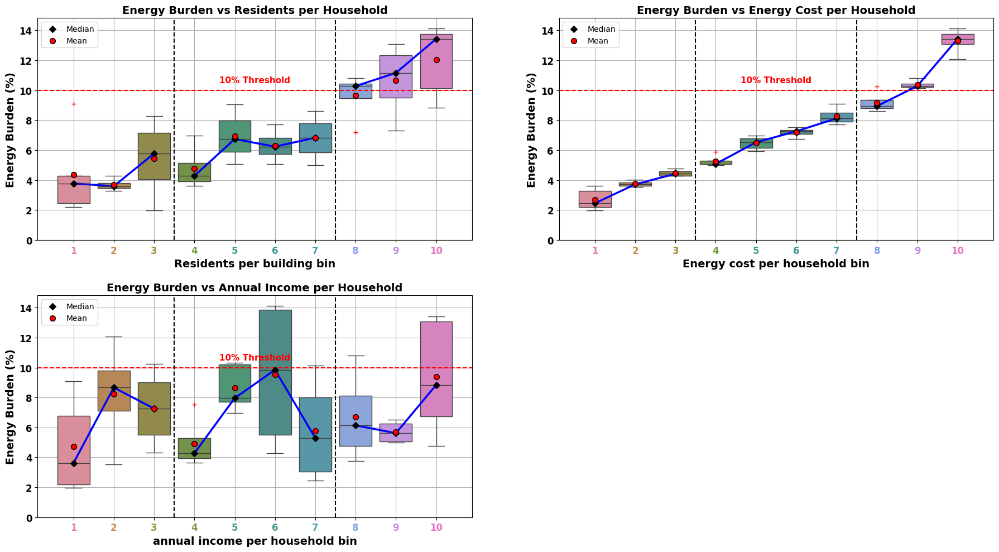

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm

# Define colormap
cmap = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

# Updated function
def plot_colored_boxplot_lined_panel(df, feature_bin, title, ax):
    y_var = 'Energy Poverty Household'
    palette = cmap.colors[:len(df[feature_bin].unique())]

    # Boxplot
    sns.boxplot(
        x=feature_bin,
        y=y_var,
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    # Medians & means
    bin_medians = df.groupby(feature_bin)[y_var].median()
    bin_means = df.groupby(feature_bin)[y_var].mean()

    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    # Median diamonds
    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)

    # Blue lines for LMH
    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    draw_segments([0, 1, 2])       # Low
    draw_segments([3, 4, 5, 6])    # Medium
    draw_segments([7, 8, 9])       # High

    # Mean points
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    # Styling
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel('Energy Burden (%)', fontsize=14, fontweight='bold')

    # Colored xticks
    tick_labels = [str(i + 1) for i in x_vals]
    ax.set_xticks(x_vals)
    ax.set_xticklabels(tick_labels, fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        label.set_color(palette[i])

    # Bold Y ticks
    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    # Limits and grid
    y_max = max(df[y_var].max(), 12)
    ax.set_ylim(0, y_max * 1.05)

    # Threshold line
    ax.axhline(y=10, color='red', linestyle='--')
    ax.text((x_vals[0] + x_vals[-1]) / 2, 10.5, '10% Threshold', color='red',
        fontsize=11, fontweight='bold', ha='center')

    # Vertical separators
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')

    ax.grid(True)
    ax.legend(loc='upper left')


# === Panel Plot ===
# === Panel Plot for Residents, Energy Cost, and Income ===
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

# Plot 1: Residents per building
plot_colored_boxplot_lined_panel(df, 'Residents per building_bin', 'Energy Burden vs Residents per Household', axes[0, 0])

# Plot 2: Energy cost per household
plot_colored_boxplot_lined_panel(df, 'Energy cost per household_bin', 'Energy Burden vs Energy Cost per Household', axes[0, 1])

# Plot 3: Annual income per household (centered)

plot_colored_boxplot_lined_panel(df, 'annual income per household_bin', 'Energy Burden vs Annual Income per Household', axes[1, 0])
axes[1, 1].axis('off')  # Leave left subplot blank
plt.tight_layout()
plt.subplots_adjust(hspace=0.25, wspace=0.2)
plt.show()


/tmp/ipython-input-288908484.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-288908484.py:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)[y_var].median()
/tmp/ipython-input-288908484.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)[y_var].mean()
/tmp/ipython-input-288908484.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and w

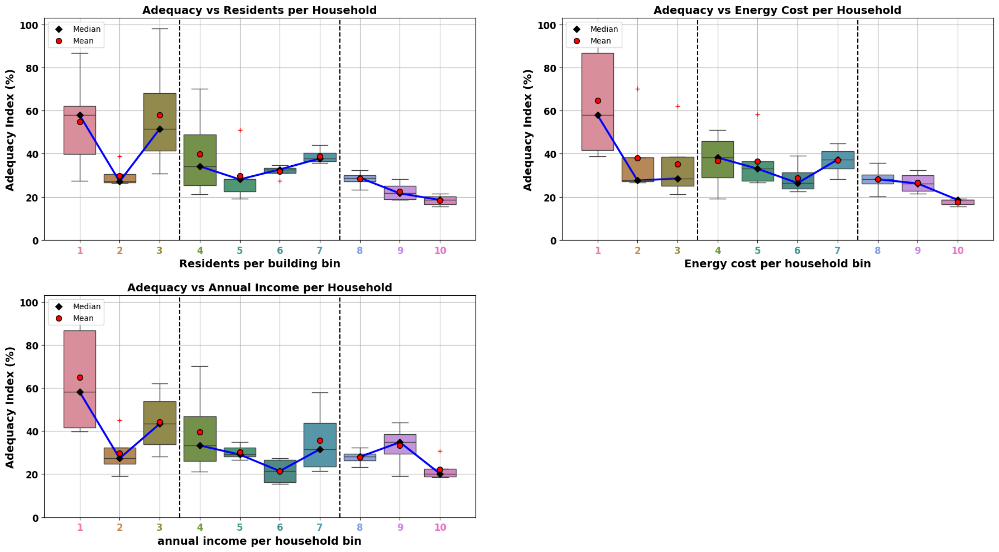

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm

# Define colormap
cmap = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

# Updated function
def plot_colored_boxplot_lined_panel(df, feature_bin, title, ax):
    y_var = 'Adequacy_Index'
    palette = cmap.colors[:len(df[feature_bin].unique())]

    # Boxplot
    sns.boxplot(
        x=feature_bin,
        y=y_var,
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    # Medians & means
    bin_medians = df.groupby(feature_bin)[y_var].median()
    bin_means = df.groupby(feature_bin)[y_var].mean()

    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    # Median diamonds
    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)

    # Blue lines for LMH
    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    draw_segments([0, 1, 2])       # Low
    draw_segments([3, 4, 5, 6])    # Medium
    draw_segments([7, 8, 9])       # High

    # Mean points
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    # Styling
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel('Adequacy Index (%)', fontsize=14, fontweight='bold')

    # Colored xticks
    tick_labels = [str(i + 1) for i in x_vals]
    ax.set_xticks(x_vals)
    ax.set_xticklabels(tick_labels, fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        label.set_color(palette[i])

    # Bold Y ticks
    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    # Limits and grid
    y_max = max(df[y_var].max(), 12)
    ax.set_ylim(0, y_max * 1.05)

    ## Threshold line
    #ax.axhline(y=10, color='red', linestyle='--')
    #ax.text((x_vals[0] + x_vals[-1]) / 2, 10.5, '10% Threshold', color='red',
        #fontsize=11, fontweight='bold', ha='center')

    # Vertical separators
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')

    ax.grid(True)
    ax.legend(loc='upper left')


# === Panel Plot ===
# === Panel Plot for Residents, Energy Cost, and Income ===
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

# Plot 1: Residents per building
plot_colored_boxplot_lined_panel(df, 'Residents per building_bin', 'Adequacy vs Residents per Household', axes[0, 0])

# Plot 2: Energy cost per household
plot_colored_boxplot_lined_panel(df, 'Energy cost per household_bin', 'Adequacy vs Energy Cost per Household', axes[0, 1])

# Plot 3: Annual income per household (centered)

plot_colored_boxplot_lined_panel(df, 'annual income per household_bin', 'Adequacy vs Annual Income per Household', axes[1, 0])
axes[1, 1].axis('off')  # Leave left subplot blank
plt.tight_layout()
plt.subplots_adjust(hspace=0.25, wspace=0.2)
plt.show()


/tmp/ipython-input-2328807264.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-2328807264.py:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)[y_var].median()
/tmp/ipython-input-2328807264.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)[y_var].mean()
/tmp/ipython-input-2328807264.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated a

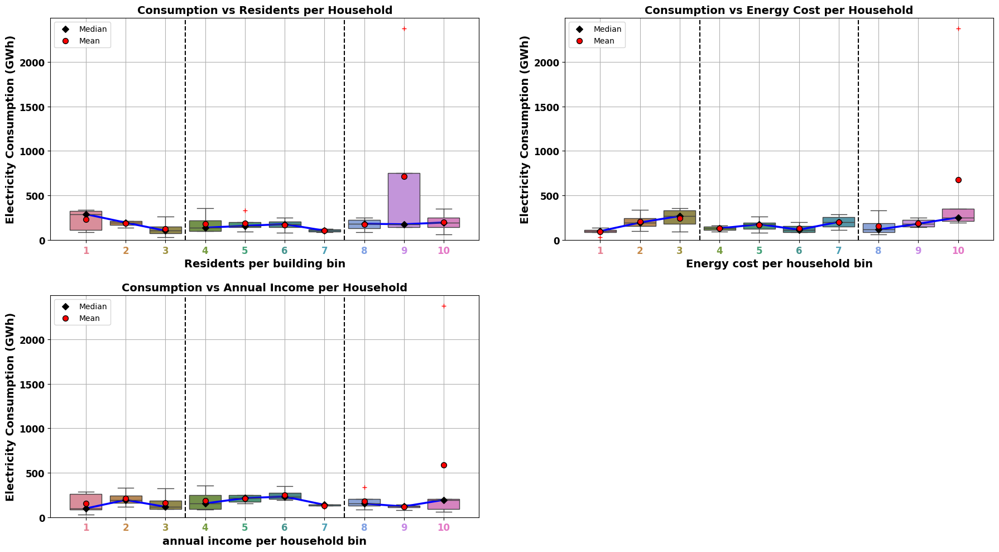

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm

# Define colormap
cmap = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

# Updated function
def plot_colored_boxplot_lined_panel(df, feature_bin, title, ax):
    y_var = 'BBE SC1_100 – Consumption GWh'
    palette = cmap.colors[:len(df[feature_bin].unique())]

    # Boxplot
    sns.boxplot(
        x=feature_bin,
        y=y_var,
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    # Medians & means
    bin_medians = df.groupby(feature_bin)[y_var].median()
    bin_means = df.groupby(feature_bin)[y_var].mean()

    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    # Median diamonds
    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)

    # Blue lines for LMH
    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    draw_segments([0, 1, 2])       # Low
    draw_segments([3, 4, 5, 6])    # Medium
    draw_segments([7, 8, 9])       # High

    # Mean points
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    # Styling
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel('Electricity Consumption (GWh)', fontsize=14, fontweight='bold')

    # Colored xticks
    tick_labels = [str(i + 1) for i in x_vals]
    ax.set_xticks(x_vals)
    ax.set_xticklabels(tick_labels, fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        label.set_color(palette[i])

    # Bold Y ticks
    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    # Limits and grid
    y_max = max(df[y_var].max(), 12)
    ax.set_ylim(0, y_max * 1.05)

    # Threshold line
    #ax.axhline(y=10, color='red', linestyle='--')
    #ax.text((x_vals[0] + x_vals[-1]) / 2, 10.5, '10% Threshold', color='red',
        #fontsize=11, fontweight='bold', ha='center')

    # Vertical separators
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')

    ax.grid(True)
    ax.legend(loc='upper left')


# === Panel Plot ===
# === Panel Plot for Residents, Energy Cost, and Income ===
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

# Plot 1: Residents per building
plot_colored_boxplot_lined_panel(df, 'Residents per building_bin', 'Consumption vs Residents per Household', axes[0, 0])

# Plot 2: Energy cost per household
plot_colored_boxplot_lined_panel(df, 'Energy cost per household_bin', 'Consumption vs Energy Cost per Household', axes[0, 1])

# Plot 3: Annual income per household (centered)

plot_colored_boxplot_lined_panel(df, 'annual income per household_bin', 'Consumption vs Annual Income per Household', axes[1, 0])
axes[1, 1].axis('off')  # Leave left subplot blank
plt.tight_layout()
plt.subplots_adjust(hspace=0.25, wspace=0.2)
plt.show()


/tmp/ipython-input-263878248.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-263878248.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)[y_var].median()
/tmp/ipython-input-263878248.py:27: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)[y_var].mean()
/tmp/ipython-input-263878248.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and w

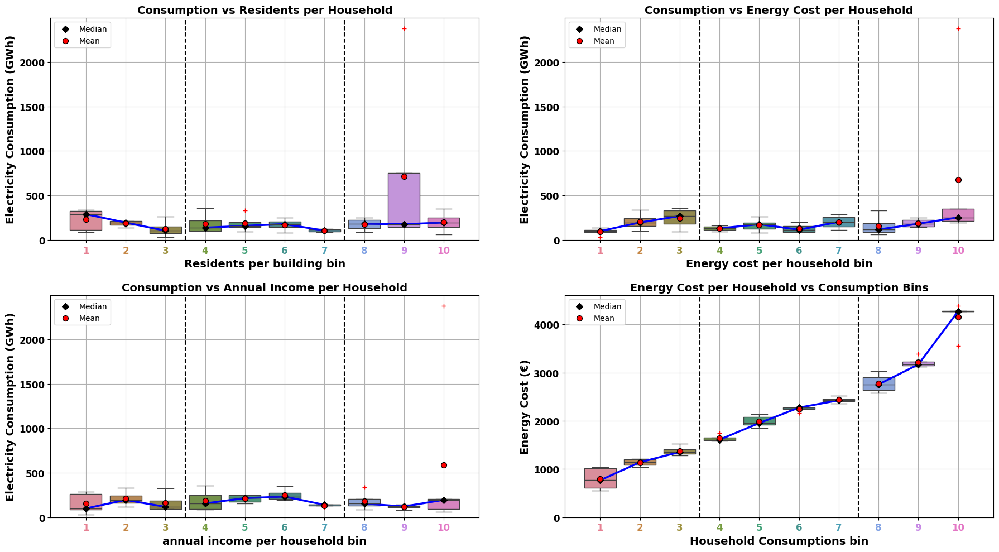

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm

# Define colormap
cmap = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

# === Boxplot Function ===
def plot_colored_boxplot_lined_panel(df, feature_bin, y_var, title, ylabel, ax):
    palette = cmap.colors[:len(df[feature_bin].unique())]

    sns.boxplot(
        x=feature_bin,
        y=y_var,
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    bin_medians = df.groupby(feature_bin)[y_var].median()
    bin_means = df.groupby(feature_bin)[y_var].mean()

    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    draw_segments([0, 1, 2])
    draw_segments([3, 4, 5, 6])
    draw_segments([7, 8, 9])

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel(ylabel, fontsize=14, fontweight='bold')

    ax.set_xticks(x_vals)
    ax.set_xticklabels([str(i + 1) for i in x_vals], fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        label.set_color(palette[i])

    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    y_max = max(df[y_var].max(), 12)
    ax.set_ylim(0, y_max * 1.05)

    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')
    ax.grid(True)
    ax.legend(loc='upper left')


# === Panel Plot ===
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

# Panel 1: Consumption vs Residents per Household
plot_colored_boxplot_lined_panel(
    df,
    feature_bin='Residents per building_bin',
    y_var='BBE SC1_100 – Consumption GWh',
    title='Consumption vs Residents per Household',
    ylabel='Electricity Consumption (GWh)',
    ax=axes[0, 0]
)

# Panel 2: Consumption vs Energy Cost per Household
plot_colored_boxplot_lined_panel(
    df,
    feature_bin='Energy cost per household_bin',
    y_var='BBE SC1_100 – Consumption GWh',
    title='Consumption vs Energy Cost per Household',
    ylabel='Electricity Consumption (GWh)',
    ax=axes[0, 1]
)

# Panel 3: Consumption vs Annual Income per Household
plot_colored_boxplot_lined_panel(
    df,
    feature_bin='annual income per household_bin',
    y_var='BBE SC1_100 – Consumption GWh',
    title='Consumption vs Annual Income per Household',
    ylabel='Electricity Consumption (GWh)',
    ax=axes[1, 0]
)

# Panel 4: Energy Cost per Household vs Consumption bins
plot_colored_boxplot_lined_panel(
    df,
    feature_bin='Household Consumptions_bin',
    y_var='Energy cost per household',
    title='Energy Cost per Household vs Consumption Bins',
    ylabel='Energy Cost (€)',
    ax=axes[1, 1]

)

plt.tight_layout()
plt.subplots_adjust(hspace=0.25, wspace=0.2)
plt.show()


In [ ]:
df = create_percentile_bins(df, 'Consumption Mwh per building')
df = create_percentile_bins(df, 'annual income per household')

In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'Energy cost per household',
       'Energy cost per household_bin', 'annual income per household_bin',
       'BBE SC1_100 – Consumption GWh_bin', 'PV Production Gwh – Only BBE_bin',
       'Energy Poverty Household', 'Energy Poverty Threshold', 'Area_bin',
       'Population_bin', 'Pop Dens_bin', 'buildings_bin',
       'Residents per building_bin', 'Energy cost per residents_bin',
       'Adequacy_Index', 'Consumption Mwh per building_bin'],
      dtype='object')

/tmp/ipython-input-2312822972.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-2312822972.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)[y_var].median()
/tmp/ipython-input-2312822972.py:27: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)[y_var].mean()
/tmp/ipython-input-2312822972.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated a

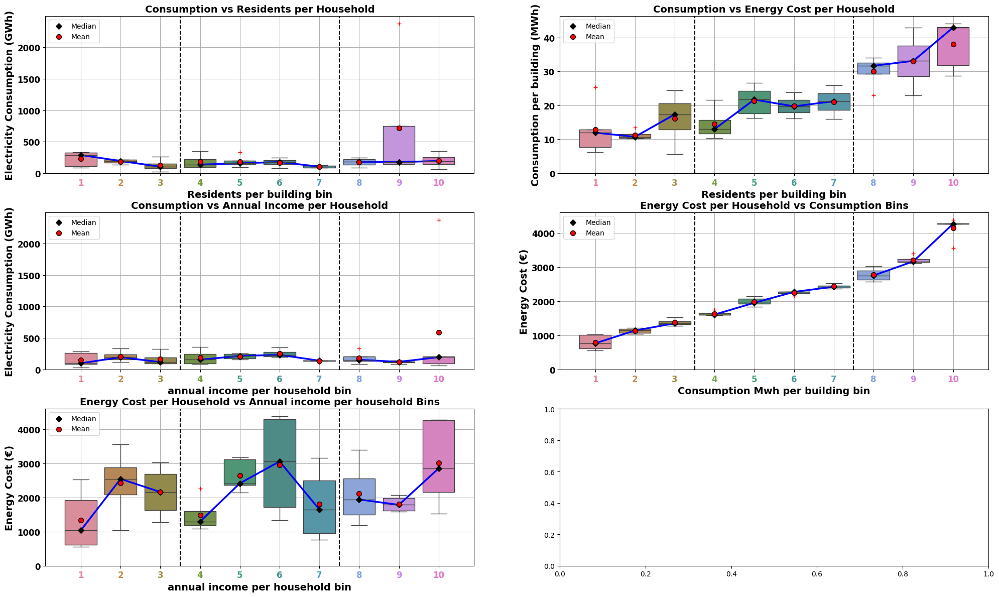

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm

# Define colormap
cmap = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

# === Boxplot Function ===
def plot_colored_boxplot_lined_panel(df, feature_bin, y_var, title, ylabel, ax):
    palette = cmap.colors[:len(df[feature_bin].unique())]

    sns.boxplot(
        x=feature_bin,
        y=y_var,
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    bin_medians = df.groupby(feature_bin)[y_var].median()
    bin_means = df.groupby(feature_bin)[y_var].mean()

    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    draw_segments([0, 1, 2])
    draw_segments([3, 4, 5, 6])
    draw_segments([7, 8, 9])

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel(ylabel, fontsize=14, fontweight='bold')

    ax.set_xticks(x_vals)
    ax.set_xticklabels([str(i + 1) for i in x_vals], fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        label.set_color(palette[i])

    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    y_max = max(df[y_var].max(), 12)
    ax.set_ylim(0, y_max * 1.05)

    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')
    ax.grid(True)
    ax.legend(loc='upper left')


# === Panel Plot ===
fig, axes = plt.subplots(3, 2, figsize=(20, 12))

# Panel 1: Consumption vs Residents per Household
plot_colored_boxplot_lined_panel(
    df,
    feature_bin='Residents per building_bin',
    y_var='BBE SC1_100 – Consumption GWh',
    title='Consumption vs Residents per Household',
    ylabel='Electricity Consumption (GWh)',
    ax=axes[0, 0]
)

# Panel 2: Consumption vs Energy Cost per Household
plot_colored_boxplot_lined_panel(
    df,
    feature_bin='Residents per building_bin',
    y_var='Consumption Mwh per building',
    title='Consumption vs Energy Cost per Household',
    ylabel='Consumption per building (MWh)',
    ax=axes[0, 1]
)

# Panel 3: Consumption vs Annual Income per Household
plot_colored_boxplot_lined_panel(
    df,
    feature_bin='annual income per household_bin',
    y_var='BBE SC1_100 – Consumption GWh',
    title='Consumption vs Annual Income per Household',
    ylabel='Electricity Consumption (GWh)',
    ax=axes[1, 0]
)

# Panel 4: Energy Cost per Household vs Consumption bins
plot_colored_boxplot_lined_panel(
    df,
    feature_bin='Consumption Mwh per building_bin',
    y_var='Energy cost per household',
    title='Energy Cost per Household vs Consumption Bins',
    ylabel='Energy Cost (€)',
    ax=axes[1, 1]

)

# Panel 5: Energy Cost per Household vs Consumption bins
plot_colored_boxplot_lined_panel(
    df,
    feature_bin='annual income per household_bin',
    y_var='Energy cost per household',
    title='Energy Cost per Household vs Annual income per household Bins',
    ylabel='Energy Cost (€)',
    ax=axes[2, 0]

)
plt.tight_layout()
plt.subplots_adjust(hspace=0.25, wspace=0.2)
plt.show()


/tmp/ipython-input-309064565.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-309064565.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)[y_var].median()
/tmp/ipython-input-309064565.py:27: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)[y_var].mean()
/tmp/ipython-input-309064565.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and w

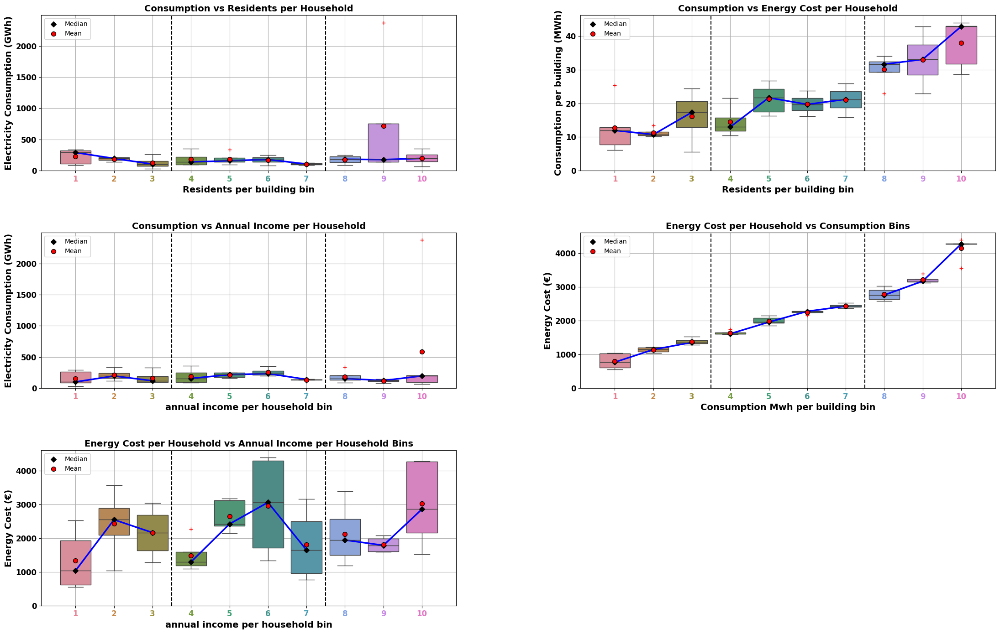

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm

# Define colormap
cmap = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

# === Boxplot Function ===
def plot_colored_boxplot_lined_panel(df, feature_bin, y_var, title, ylabel, ax):
    palette = cmap.colors[:len(df[feature_bin].unique())]

    sns.boxplot(
        x=feature_bin,
        y=y_var,
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    bin_medians = df.groupby(feature_bin)[y_var].median()
    bin_means = df.groupby(feature_bin)[y_var].mean()

    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    draw_segments([0, 1, 2])
    draw_segments([3, 4, 5, 6])
    draw_segments([7, 8, 9])

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel(ylabel, fontsize=14, fontweight='bold')

    ax.set_xticks(x_vals)
    ax.set_xticklabels([str(i + 1) for i in x_vals], fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        label.set_color(palette[i])

    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    y_max = max(df[y_var].max(), 12)
    ax.set_ylim(0, y_max * 1.05)

    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')
    ax.grid(True)
    ax.legend(loc='upper left')


# === Panel Plot ===
fig, axes = plt.subplots(3, 2, figsize=(22, 14))

# Unpack axes
(ax1, ax2), (ax3, ax4), (ax5, ax6) = axes

# Panel 1: Consumption vs Residents per Household
plot_colored_boxplot_lined_panel(
    df,
    feature_bin='Residents per building_bin',
    y_var='BBE SC1_100 – Consumption GWh',
    title='Consumption vs Residents per Household',
    ylabel='Electricity Consumption (GWh)',
    ax=ax1
)

# Panel 2: Consumption vs Energy Cost per Household
plot_colored_boxplot_lined_panel(
    df,
    feature_bin='Residents per building_bin',
    y_var='Consumption Mwh per building',
    title='Consumption vs Energy Cost per Household',
    ylabel='Consumption per building (MWh)',
    ax=ax2
)

# Panel 3: Consumption vs Annual Income per Household
plot_colored_boxplot_lined_panel(
    df,
    feature_bin='annual income per household_bin',
    y_var='BBE SC1_100 – Consumption GWh',
    title='Consumption vs Annual Income per Household',
    ylabel='Electricity Consumption (GWh)',
    ax=ax3
)

# Panel 4: Energy Cost per Household vs Consumption bins
plot_colored_boxplot_lined_panel(
    df,
    feature_bin='Consumption Mwh per building_bin',
    y_var='Energy cost per household',
    title='Energy Cost per Household vs Consumption Bins',
    ylabel='Energy Cost (€)',
    ax=ax4
)

# Panel 5: Energy Cost per Household vs Annual income
plot_colored_boxplot_lined_panel(
    df,
    feature_bin='annual income per household_bin',
    y_var='Energy cost per household',
    title='Energy Cost per Household vs Annual Income per Household Bins',
    ylabel='Energy Cost (€)',
    ax=ax5
)

# Remove the unused subplot (bottom right)
fig.delaxes(ax6)

plt.tight_layout()
plt.subplots_adjust(hspace=0.4, wspace=0.3)
plt.show()


In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'Energy cost per household',
       'Energy cost per household_bin', 'annual income per household_bin',
       'BBE SC1_100 – Consumption GWh_bin', 'PV Production Gwh – Only BBE_bin',
       'Energy Poverty Household', 'Energy Poverty Threshold', 'Area_bin',
       'Population_bin', 'Pop Dens_bin', 'buildings_bin',
       'Residents per building_bin', 'Energy cost per residents_bin',
       'Adequacy_Index', 'Consumption Mwh per building_bin'],
      dtype='object')

/tmp/ipython-input-1487307614.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-1487307614.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)[y_var].median()
/tmp/ipython-input-1487307614.py:27: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)[y_var].mean()
/tmp/ipython-input-1487307614.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated a

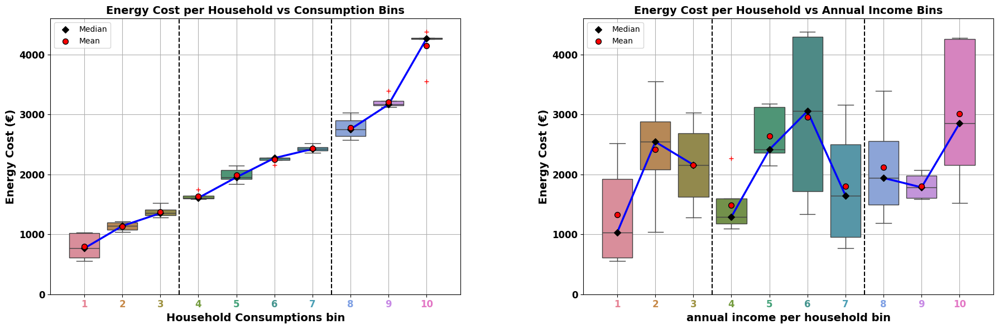

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm

# === Define custom colormap ===
cmap = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

# === Generalized boxplot function ===
def plot_colored_boxplot_lined_panel(df, feature_bin, y_var, title, ylabel, ax):
    palette = cmap.colors[:len(df[feature_bin].unique())]

    sns.boxplot(
        x=feature_bin,
        y=y_var,
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    bin_medians = df.groupby(feature_bin)[y_var].median()
    bin_means = df.groupby(feature_bin)[y_var].mean()

    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    draw_segments([0, 1, 2])       # Low
    draw_segments([3, 4, 5, 6])    # Medium
    draw_segments([7, 8, 9])       # High

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel(ylabel, fontsize=14, fontweight='bold')

    ax.set_xticks(x_vals)
    ax.set_xticklabels([str(i + 1) for i in x_vals], fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        label.set_color(palette[i])

    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    y_max = max(df[y_var].max(), 12)
    ax.set_ylim(0, y_max * 1.05)

    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')
    ax.grid(True)
    ax.legend(loc='upper left')


# === 1-row 2-column panel plot ===
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Panel 1: Energy Cost per Household vs Consumption Bins
plot_colored_boxplot_lined_panel(
    df,
    feature_bin='Household Consumptions_bin',
    y_var='Energy cost per household',
    title='Energy Cost per Household vs Consumption Bins',
    ylabel='Energy Cost (€)',
    ax=axes[0]
)

# Panel 2: Energy Cost per Household vs Annual Income Bins
plot_colored_boxplot_lined_panel(
    df,
    feature_bin='annual income per household_bin',
    y_var='Energy cost per household',
    title='Energy Cost per Household vs Annual Income Bins',
    ylabel='Energy Cost (€)',
    ax=axes[1]
)

plt.tight_layout()
plt.subplots_adjust(wspace=0.3)
plt.show()


/tmp/ipython-input-874883744.py:44: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_cost = cm.get_cmap("Purples", len(cost_bins)-1)
/tmp/ipython-input-874883744.py:45: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_income = cm.get_cmap("inferno", len(income_bins)-1)


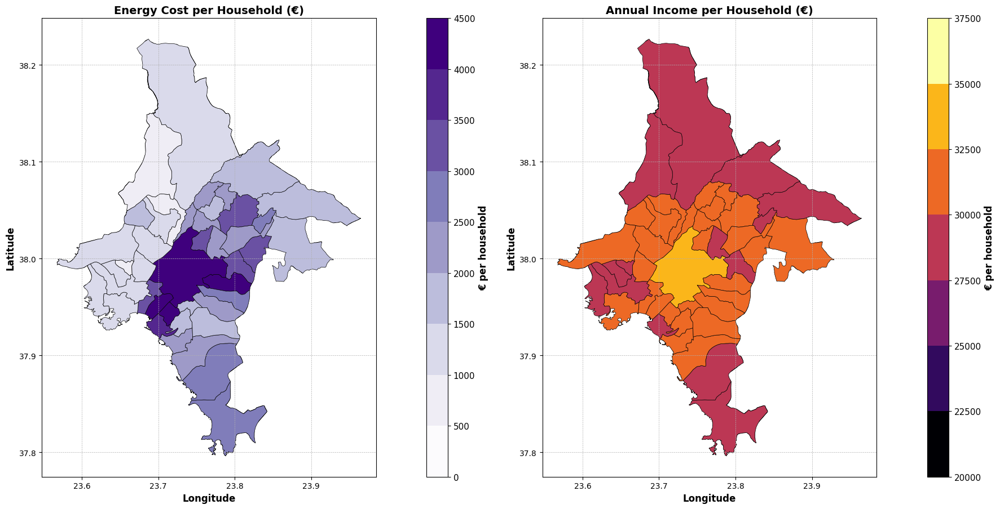

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import BoundaryNorm, ListedColormap
from matplotlib import cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colorbar as cbar
import numpy as np

# ================================
# Load and Prepare Data
# ================================

# File paths
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"
excel_path = "/content/drive/MyDrive/Athens.xlsx"

# Load data
gdf = gpd.read_file(shapefile_path).to_crs(epsg=4326)
df = pd.read_excel(excel_path, sheet_name='Final')

# Harmonize merge keys
gdf["KWD_YPES"] = gdf["KWD_YPES"].astype(str)
df["KWD_YPES"] = df["KWD_YPES"].astype(str)

# ================================
# Compute Indicators
# ================================
￼
df['Energy cost per household'] = df['Energy cost per residents'] * df['Residents per building']

# Merge indicators into GeoDataFrame
gdf = gdf.merge(df[['KWD_YPES', 'Energy cost per household', 'annual income per household']], on='KWD_YPES', how='left')

# ================================
# Plot Settings
# ================================

# Bin settings
cost_bins = np.arange(0, gdf['Energy cost per household'].max() + 500, 500)
income_bins = np.arange(20000, gdf['annual income per household'].max() + 5000, 2500)

# Color maps
cmap_cost = cm.get_cmap("Purples", len(cost_bins)-1)
cmap_income = cm.get_cmap("inferno", len(income_bins)-1)

# Norms
norm_cost = BoundaryNorm(cost_bins, cmap_cost.N)
norm_income = BoundaryNorm(income_bins, cmap_income.N)

# ================================
# Plot Composite Figure
# ================================

fig, axes = plt.subplots(1, 2, figsize=(18, 9))

# ---------- Plot 1: Energy Cost ----------
ax1 = axes[0]
gdf.plot(
    column="Energy cost per household",
    cmap=cmap_cost,
    norm=norm_cost,
    linewidth=0.5,
    edgecolor="black",
    ax=ax1
)
divider1 = make_axes_locatable(ax1)
cax1 = divider1.append_axes("right", size="5%", pad=0.1)
cb1 = cbar.ColorbarBase(cax1, cmap=cmap_cost, norm=norm_cost, orientation="vertical")
cb1.set_label("€ per household", fontsize=12, weight='bold')
cb1.ax.tick_params(labelsize=11)

ax1.set_title("Energy Cost per Household (€)", fontsize=14, weight='bold')
ax1.set_xlabel("Longitude", fontsize=12, weight='bold')
ax1.set_ylabel("Latitude", fontsize=12, weight='bold')
ax1.set_xticks(np.arange(23.6, 24.0, 0.1))
ax1.set_yticks(np.arange(37.8, 38.3, 0.1))
ax1.grid(True, linestyle='--', linewidth=0.5)

# ---------- Plot 2: Annual Income ----------
ax2 = axes[1]
gdf.plot(
    column="annual income per household",
    cmap=cmap_income,
    norm=norm_income,
    linewidth=0.5,
    edgecolor="black",
    ax=ax2
)
divider2 = make_axes_locatable(ax2)
cax2 = divider2.append_axes("right", size="5%", pad=0.1)
cb2 = cbar.ColorbarBase(cax2, cmap=cmap_income, norm=norm_income, orientation="vertical")
cb2.set_label("€ per household", fontsize=12, weight='bold')
cb2.ax.tick_params(labelsize=11)

ax2.set_title("Annual Income per Household (€)", fontsize=14, weight='bold')
ax2.set_xlabel("Longitude", fontsize=12, weight='bold')
ax2.set_ylabel("Latitude", fontsize=12, weight='bold')
ax2.set_xticks(np.arange(23.6, 24.0, 0.1))
ax2.set_yticks(np.arange(37.8, 38.3, 0.1))
ax2.grid(True, linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()


In [ ]:
max_value = df['Energy Security Index'].max()
min_value = df['Energy Security Index'].min()
mean_value = df['Energy Security Index'].mean()

print(f"Maximum: {max_value}")
print(f"Minimum: {min_value}")
print(f"Mean: {mean_value}")


Maximum: 98.03986968118235
Minimum: 15.39123975955174
Mean: 35.17369851857207


In [ ]:
max_value = df['Adequacy'].max()
min_value = df['Adequacy'].min()
mean_value = df['Adequacy'].mean()

print(f"Maximum: {max_value}")
print(f"Minimum: {min_value}")
print(f"Mean: {mean_value}")


Maximum: 0.9803986968
Minimum: 0.1539123976
Mean: 0.3517369851860465


In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'Energy Security Index',
       'Energy Efficiency Ratio', 'Energy Poverty Index', 'PCPP Index',
       'CPP Index', 'Area_bin', 'Population_bin', 'Pop Dens_bin',
       'buildings_bin', 'Residents per building_bin',
       'Energy cost per residents_bin', 'Energy cost per household',
       'Energy cost per household_bin', 'annual income per household_bin',
       'BBE SC1_100 – Consumption GWh_bin', 'PV Production Gwh – Only BBE_bin',
       'Energy Poverty Household', 'Energy Poverty Threshold'],
      dtype='object')

In [ ]:
max_value = df['Energy Poverty Household'].max()
min_value = df['Energy Poverty Household'].min()
mean_value = df['Energy Poverty Household'].mean()

print(f"Maximum: {max_value}")
print(f"Minimum: {min_value}")
print(f"Median: {mean_value}")


Maximum: 14.120523862565399
Minimum: 1.9541430363042178
Median: 7.123174959231592


In [ ]:
max_value = df['Adequacy'].max()
min_value = df['Adequacy'].min()
mean_value = df['Adequacy'].mean()

print(f"Maximum: {max_value}")
print(f"Minimum: {min_value}")
print(f"Median: {mean_value}")


Maximum: 0.9803986968
Minimum: 0.1539123976
Median: 0.3517369851860465


/tmp/ipython-input-48-1654896035.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-48-1654896035.py:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)[y_var].median()
/tmp/ipython-input-48-1654896035.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)[y_var].mean()
/tmp/ipython-input-48-1654896035.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is 

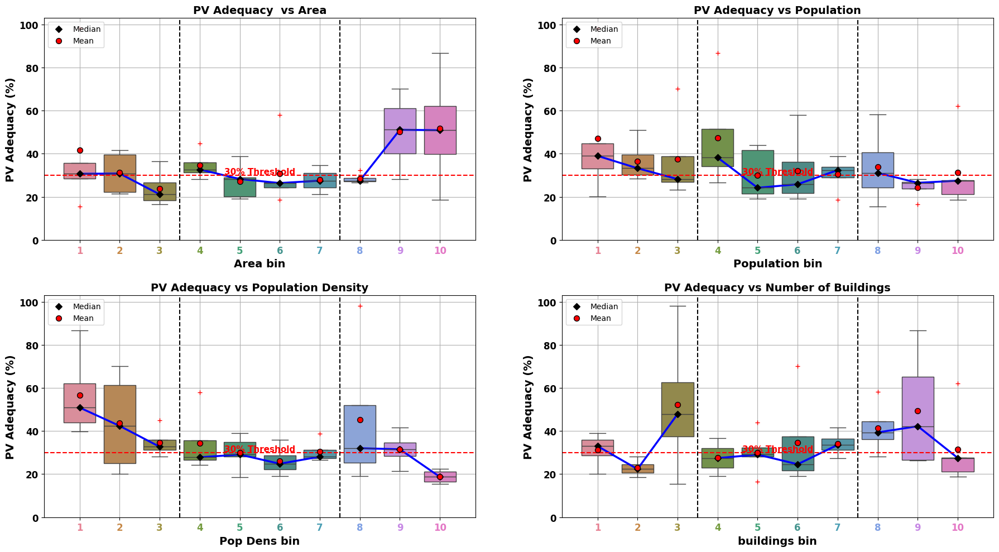

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm

# Define colormap
cmap = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

# Updated function
def plot_colored_boxplot_lined_panel(df, feature_bin, title, ax):
    y_var = 'Energy Security Index'
    palette = cmap.colors[:len(df[feature_bin].unique())]

    # Boxplot
    sns.boxplot(
        x=feature_bin,
        y=y_var,
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    # Medians & means
    bin_medians = df.groupby(feature_bin)[y_var].median()
    bin_means = df.groupby(feature_bin)[y_var].mean()

    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    # Median diamonds
    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)

    # Blue lines for LMH
    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    draw_segments([0, 1, 2])       # Low
    draw_segments([3, 4, 5, 6])    # Medium
    draw_segments([7, 8, 9])       # High

    # Mean points
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    # Styling
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel('PV Adequacy (%)', fontsize=14, fontweight='bold')

    # Colored xticks
    tick_labels = [str(i + 1) for i in x_vals]
    ax.set_xticks(x_vals)
    ax.set_xticklabels(tick_labels, fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        label.set_color(palette[i])

    # Bold Y ticks
    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    # Limits and grid
    y_max = max(df[y_var].max(), 35)
    ax.set_ylim(0, y_max * 1.05)

    # Threshold line
    ax.axhline(y=30, color='red', linestyle='--')
    ax.text((x_vals[0] + x_vals[-1]) / 2, 30.5, '30% Threshold', color='red',
        fontsize=11, fontweight='bold', ha='center')

    # Vertical separators
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')

    ax.grid(True)
    ax.legend(loc='upper left')


# === Panel Plot ===
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

plot_colored_boxplot_lined_panel(df, 'Area_bin', 'PV Adequacy  vs Area', axes[0, 0])
plot_colored_boxplot_lined_panel(df, 'Population_bin', 'PV Adequacy vs Population', axes[0, 1])
plot_colored_boxplot_lined_panel(df, 'Pop Dens_bin', 'PV Adequacy vs Population Density', axes[1, 0])
plot_colored_boxplot_lined_panel(df, 'buildings_bin', 'PV Adequacy vs Number of Buildings', axes[1, 1])

plt.tight_layout()
plt.subplots_adjust(hspace=0.25, wspace=0.2)
plt.show()


In [ ]:
df.head(5)

,NAME,Περιφερειακή ενότητα,KWD_YPES,buildings,Area,Pop Dens,PV Production Gwh – Only BBE,BBE SC1_100 – Consumption GWh,Adequacy,Population,...,buildings_bin,Residents per building_bin,Energy cost per residents_bin,Energy cost per household,Energy cost per household_bin,annual income per household_bin,BBE SC1_100 – Consumption GWh_bin,PV Production Gwh – Only BBE_bin,Energy Poverty Household,Energy Poverty Threshold
0,Dafni – Imittos,Κεντρική Αττική,9189,6040,2.4,14119.166670,28.438429,92.682110,0.306838,33886,...,5910.60-6492.60,5.34-5.91,250.22-272.01,1526.032420,1239.15-1562.20,31833.80-32585.00,86.70-94.66,27.59-33.83,4.751923,3211.4
1,Agia Varbara,Δυτική Αττική,9179,4908,2.4,11149.583330,26.721555,27.255805,0.980399,26759,...,4650.60-5910.60,5.34-5.91,101.30-195.42,552.279905,552.28-1035.99,27729.00-28715.20,27.26-86.70,12.84-27.59,1.954143,2826.2
2,Nea Smyrni,Νότια Αττική,9200,5895,3.5,20815.142860,38.941916,253.013508,0.153912,72853,...,4650.60-5910.60,11.82-15.38,321.13-349.60,4268.395828,3522.77-4381.88,30771.00-31137.00,252.25-331.84,33.83-39.46,13.764135,3101.1
3,Filadelphia,Κεντρική Αττική,9193,3824,3.7,9448.108108,25.052255,87.689008,0.285694,34958,...,2214.00-4042.80,9.03-9.44,238.83-250.22,2280.510421,2143.42-2297.07,31369.60-31677.20,86.70-94.66,12.84-27.59,7.209049,3163.4
4,Vrilissia,Βόρεια Αττική,9169,3595,3.9,8312.051282,33.345475,93.125557,0.358070,32417,...,2214.00-4042.80,7.66-9.03,272.01-288.38,2576.171538,2543.45-3084.36,29525.40-29881.00,86.70-94.66,27.59-33.83,8.628367,2985.7


In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'Energy cost per household',
       'Energy cost per household_bin', 'annual income per household_bin',
       'BBE SC1_100 – Consumption GWh_bin', 'PV Production Gwh – Only BBE_bin',
       'Energy Poverty Household', 'Energy Poverty Threshold', 'Area_bin',
       'Population_bin', 'Pop Dens_bin', 'buildings_bin',
       'Residents per building_bin', 'Energy cost per residents_bin',
       'Adequacy_Index'],
      dtype='object')

In [ ]:
# Assuming you have your DataFrame already loaded as df
stats = df['PV Production Gwh – Only BBE'].describe(percentiles=[0.01, 0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99])
print(stats)


count     43.000000
mean      65.896122
std       68.503683
min       12.840888
1%        17.969662
5%        26.783189
10%       27.589075
25%       35.325964
50%       47.271222
75%       65.723610
90%       93.419076
95%      148.863617
99%      342.805418
max      444.906707
Name: PV Production Gwh – Only BBE, dtype: float64


In [ ]:
# Assuming you have your DataFrame already loaded as df
stats = df['BBE SC1_100 – Consumption GWh'].describe(percentiles=[0.01, 0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99])
print(stats)


count      43.000000
mean      226.103503
std       346.014513
min        27.255805
1%         42.487451
5%         83.000752
10%        86.697612
25%       104.097212
50%       158.212133
75%       231.250344
90%       331.836004
95%       346.806527
99%      1526.386176
max      2375.083641
Name: BBE SC1_100 – Consumption GWh, dtype: float64


In [ ]:
# Assuming you have your DataFrame already loaded as df
stats = df['Adequacy_Index'].describe(percentiles=[0.01, 0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99])
print(stats)


count    43.000000
mean     35.173699
std      18.014197
min      15.391240
1%       15.829301
5%       18.562302
10%      19.053739
25%      23.720771
50%      28.569436
75%      39.422703
90%      58.112665
95%      69.414695
99%      93.305554
max      98.039870
Name: Adequacy_Index, dtype: float64


In [ ]:
# Filter municipalities with Adequacy_Index > 35
high_adequacy = df[df['Adequacy_Index'] > 35]

# Print the names
print("Municipalities with Adequacy_Index > 35:")
for name in high_adequacy['NAME']:
    print("-", name)


Municipalities with Adequacy_Index > 35:
- Agia Varbara
- Vrilissia
- Lykovrysi – Peyki
- Korydalos
- Heraklio
- Filothei – Psychiko
- Egaleo
- Agioi Anargyroi – Kamatero
- Chaidari
- Pallini
- Kifissia
- Penteli
- Vari – Voula – Vouliagmeni
- Acharnai
- Fyli


In [ ]:
# Get the row with the maximum Adequacy_Index
max_adequacy_row = df.loc[df['Adequacy_Index'].idxmax()]

# Print the name and value
print("Municipality with the maximum Adequacy Index:")
print(f"- {max_adequacy_row['NAME']} (Adequacy Index: {max_adequacy_row['Adequacy_Index']:.2f})")


Municipality with the maximum Adequacy Index:
- Agia Varbara (Adequacy Index: 98.04)


In [ ]:
# Get the row with the minimum Adequacy_Index
min_adequacy_row = df.loc[df['Adequacy_Index'].idxmin()]

# Print the name and value
print("Municipality with the minimum Adequacy Index:")
print(f"- {min_adequacy_row['NAME']} (Adequacy Index: {min_adequacy_row['Adequacy_Index']:.2f})")


Municipality with the minimum Adequacy Index:
- Nea Smyrni (Adequacy Index: 15.39)


In [ ]:
# Get the row with the maximum Adequacy_Index
max_adequacy_row = df.loc[df['BBE SC1_100 – Consumption GWh'].idxmax()]

# Print the name and value
print("Municipality with the maximum  Consumption:")
print(f"- {max_adequacy_row['NAME']} (Adequacy Index: {max_adequacy_row['Adequacy_Index']:.2f})")
print(f"- {max_adequacy_row['NAME']} (BBE SC1_100 – Consumption GWh: {max_adequacy_row['BBE SC1_100 – Consumption GWh']:.2f})")
print(f"- {max_adequacy_row['NAME']} (PV Production Gwh – Only BBE: {max_adequacy_row['PV Production Gwh – Only BBE']:.2f})")

Municipality with the maximum  Consumption:
- Athens (Adequacy Index: 18.73)
- Athens (BBE SC1_100 – Consumption GWh: 2375.08)
- Athens (PV Production Gwh – Only BBE: 444.91)


In [ ]:
# Get the row with the minimum Adequacy_Index
min_adequacy_row = df.loc[df['BBE SC1_100 – Consumption GWh'].idxmin()]

# Print the name and value
print("Municipality with the minimum  Consumption:")
print(f"- {min_adequacy_row['NAME']} (Adequacy Index: {min_adequacy_row['Adequacy_Index']:.2f})")
print(f"- {min_adequacy_row['NAME']} (BBE SC1_100 – Consumption GWh: {min_adequacy_row['BBE SC1_100 – Consumption GWh']:.2f})")
print(f"- {min_adequacy_row['NAME']} (PV Production Gwh – Only BBE: {min_adequacy_row['PV Production Gwh – Only BBE']:.2f})")

Municipality with the minimum  Consumption:
- Agia Varbara (Adequacy Index: 98.04)
- Agia Varbara (BBE SC1_100 – Consumption GWh: 27.26)
- Agia Varbara (PV Production Gwh – Only BBE: 26.72)


In [ ]:
def analyze_bins(df, feature_bin, name_column='NAME'):
    """
    Extracts municipality names and counts from each bin in the specified bin column.

    Args:
    - df: Pandas DataFrame
    - feature_bin: Column containing bin labels (e.g., 'Area_bin')
    - name_column: Column containing municipality names (default: 'NAME')

    Returns:
    - A new DataFrame with municipality names and counts for each bin
    """
    # Ensure the columns exist
    if feature_bin not in df.columns or name_column not in df.columns:
        raise KeyError(f"Columns '{feature_bin}' or '{name_column}' do not exist in the DataFrame.")

    # Group by the bin column and aggregate municipality names and counts
    bin_analysis = (
        df.groupby(feature_bin)
        .agg({
            name_column: lambda x: list(x),  # List all municipalities in the bin
            feature_bin: 'size'             # Count the number of rows in each bin
        })
        .rename(columns={feature_bin: 'Count', name_column: 'Municipalities'})
        .sort_index()  # Ensure bins are in the correct order
    )

    return bin_analysis



In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'PCPP Index', 'CPP Index',
       'Adequacy_Index', 'Area_bin', 'Population_bin', 'Pop Dens_bin',
       'buildings_bin', 'Residents per building_bin',
       'Energy cost per residents_bin', 'Energy cost per household',
       'Energy cost per household_bin', 'annual income per household_bin',
       'BBE SC1_100 – Consumption GWh_bin', 'PV Production Gwh – Only BBE_bin',
       'Energy Poverty Household', 'Energy Poverty Threshold',
       'Household Consumptions', 'Household Consumptions_bin'],
      dtype='object')

In [ ]:
BBE_bin_analysis = analyze_bins(df, 'BBE SC1_100 – Consumption GWh_bin')
# Display the analysis
print(BBE_bin_analysis)

                                                                      Municipalities  \
BBE SC1_100 – Consumption GWh_bin                                                      
27.26-86.70                        [Agia Varbara, Lykovrysi – Peyki, Metamorfoeos...   
86.70-94.66                        [Dafni – Imittos, Filadelphia, Vrilissia, Pent...   
94.66-115.79                       [Korydalos, Filothei – Psychiko, Agioi Anargyr...   
115.79-140.79                                   [Heraklio, Egaleo, Vyronas, Pallini]   
140.79-158.21                      [Galatsi, Meosxato – Tauros, Alimos, Petroupol...   
158.21-195.44                      [Agios Dimitrios, Zografou, Keratsini, Ellinik...   
195.44-212.47                           [Nea Ionia, Palaio Faliro, Ilion, Ilioupoli]   
212.47-252.25                      [Agia Paraskevi, Chalandri, Nikaia – Agios I. ...   
252.25-331.84                      [Nea Smyrni, Kifissia, Vari – Voula – Vouliagm...   
331.84-2375.08                  

<ipython-input-40-4853c16c56a7>:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(feature_bin)


In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'PCPP Index', 'CPP Index',
       'Adequacy_Index', 'Energy cost per household', 'Area_bin',
       'Population_bin', 'Pop Dens_bin', 'buildings_bin',
       'Residents per building_bin', 'Energy cost per residents_bin',
       'Energy cost per household_bin', 'annual income per household_bin',
       'BBE SC1_100 – Consumption GWh_bin', 'PV Production Gwh – Only BBE_bin',
       'Energy Poverty Household', 'Energy Poverty Threshold'],
      dtype='object')

In [ ]:
df=create_percentile_bins(df, 'Energy Poverty Household')
df.columns


Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'PCPP Index', 'CPP Index',
       'Adequacy_Index', 'Area_bin', 'Population_bin', 'Pop Dens_bin',
       'buildings_bin', 'Residents per building_bin',
       'Energy cost per residents_bin', 'Energy cost per household',
       'Energy cost per household_bin', 'annual income per household_bin',
       'BBE SC1_100 – Consumption GWh_bin', 'PV Production Gwh – Only BBE_bin',
       'Energy Poverty Household', 'Energy Poverty Threshold',
       'Household Consumptions', 'Household Consumptions_bin',
       'Energy Poverty Household_bin'],
      dtype='object')

In [ ]:
BBE_bin_analysis = analyze_bins(df, 'Energy Poverty Household_bin')
# Display the analysis
print(BBE_bin_analysis)
# Save it as CSV
BBE_bin_analysis.to_csv('/content/drive/MyDrive/Energy_burden_index_bin_analysis.csv', index=True)

                                                                 Municipalities  \
Energy Poverty Household_bin                                                      
1.95-3.55                     [Agia Varbara, Egaleo, Agioi Anargyroi – Kamat...   
3.55-4.12                     [Korydalos, Peristeri, Nikaia – Agios I. Renti...   
4.12-4.90                          [Dafni – Imittos, Ilion, Peiraios, Acharnai]   
4.90-5.93                       [Agios Dimitrios, Petroupoli, Pallini, Penteli]   
5.93-6.80                     [Nea Ionia, Heraklio, Metamorfoeos, Ilioupoli,...   
6.80-7.55                     [Filadelphia, Lykovrysi – Peyki, Vyronas, Elli...   
7.55-8.71                     [Vrilissia, Alimos, Filothei – Psychiko, Chala...   
8.71-10.19                    [Galatsi, Kaisariani, Glyfada, Vari – Voula – ...   
10.19-11.83                   [Meosxato – Tauros, Papagou – Cholargos, Agia ...   
11.83-14.12                   [Nea Smyrni, Palaio Faliro, Kallithea, Zografo...   

   

/tmp/ipython-input-2851481340.py:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(feature_bin)


In [ ]:
df = create_percentile_bins(df, 'Adequacy_Index')
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'PCPP Index', 'CPP Index',
       'Adequacy_Index', 'Energy cost per household', 'Area_bin',
       'Population_bin', 'Pop Dens_bin', 'buildings_bin',
       'Residents per building_bin', 'Energy cost per residents_bin',
       'Energy cost per household_bin', 'annual income per household_bin',
       'BBE SC1_100 – Consumption GWh_bin', 'PV Production Gwh – Only BBE_bin',
       'Energy Poverty Household', 'Energy Poverty Threshold',
       'Adequacy_Index_bin'],
      dtype='object')

In [ ]:
BBE_bin_analysis = analyze_bins(df, 'Adequacy_Index_bin')
# Display the analysis
print(BBE_bin_analysis)
# Save it as CSV
BBE_bin_analysis.to_csv('/content/drive/MyDrive/Adequacy_index_bin_analysis.csv', index=True)

                                                       Municipalities  Count
Adequacy_Index_bin                                                          
15.39-19.05         [Nea Smyrni, Palaio Faliro, Kallithea, Zografo...      5
19.05-21.87               [Galatsi, Petroupoli, Kaisariani, Peiraios]      4
21.87-26.49            [Nea Ionia, Meosxato – Tauros, Vyronas, Ilion]      4
26.49-27.59         [Keratsini, Peristeri, Ilioupoli, Elliniko – A...      4
27.59-28.57         [Filadelphia, Alimos, Papagou – Cholargos, Nik...      5
28.57-32.51         [Dafni – Imittos, Agios Dimitrios, Agia Parask...      4
32.51-37.49            [Vrilissia, Heraklio, Metamorfoeos, Chalandri]      4
37.49-43.12         [Lykovrysi – Peyki, Korydalos, Egaleo, Vari – ...      4
43.12-58.11         [Filothei – Psychiko, Agioi Anargyroi – Kamate...      4
58.11-98.04         [Agia Varbara, Chaidari, Kifissia, Acharnai, F...      5


/tmp/ipython-input-2851481340.py:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(feature_bin)


In [ ]:
# Save it as CSV
BBE_bin_analysis.to_csv('/content/drive/MyDrive/BBE_bin_analysis.csv', index=True)

In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'Energy Security Index',
       'Energy Efficiency Ratio', 'Energy Poverty Index', 'PCPP Index',
       'CPP Index', 'Area_bin', 'Population_bin', 'Pop Dens_bin',
       'buildings_bin', 'Residents per building_bin',
       'Energy cost per residents_bin', 'Energy cost per household',
       'Energy cost per household_bin', 'annual income per household_bin',
       'BBE SC1_100 – Consumption GWh_bin', 'PV Production Gwh – Only BBE_bin',
       'Energy Poverty Household', 'Energy Poverty Threshold'],
      dtype='object')

In [ ]:
PV_bin_analysis = analyze_bins(df, 'PV Production Gwh – Only BBE_bin')
# Display the analysis
print(PV_bin_analysis)
# Save it as CSV
PV_bin_analysis.to_csv('/content/drive/MyDrive/PV_bin_analysis.csv', index=True)

<ipython-input-40-4853c16c56a7>:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(feature_bin)


                                                                     Municipalities  \
PV Production Gwh – Only BBE_bin                                                      
12.84-27.59                       [Agia Varbara, Filadelphia, Metamorfoeos, Petr...   
27.59-33.83                       [Dafni – Imittos, Vrilissia, Galatsi, Lykovrys...   
33.83-39.46                       [Nea Smyrni, Meosxato – Tauros, Zografou, Vyro...   
39.46-45.55                       [Korydalos, Palaio Faliro, Alimos, Papagou – C...   
45.55-47.27                       [Nea Ionia, Heraklio, Keratsini, Elliniko – Ar...   
47.27-53.68                       [Agios Dimitrios, Filothei – Psychiko, Ilioupo...   
53.68-60.43                       [Kallithea, Egaleo, Ilion, Nikaia – Agios I. R...   
60.43-74.58                       [Agia Paraskevi, Agioi Anargyroi – Kamatero, C...   
74.58-93.42                            [Peristeri, Chalandri, Peiraios, Amarousion]   
93.42-444.91                      [Glyfada,

<ipython-input-46-c8071bd3d80d>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
<ipython-input-46-c8071bd3d80d>:28: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].median()
<ipython-input-46-c8071bd3d80d>:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].mean()
<ipython-input-46-c8071bd3d80d>:17: FutureWarning: 

Passing `

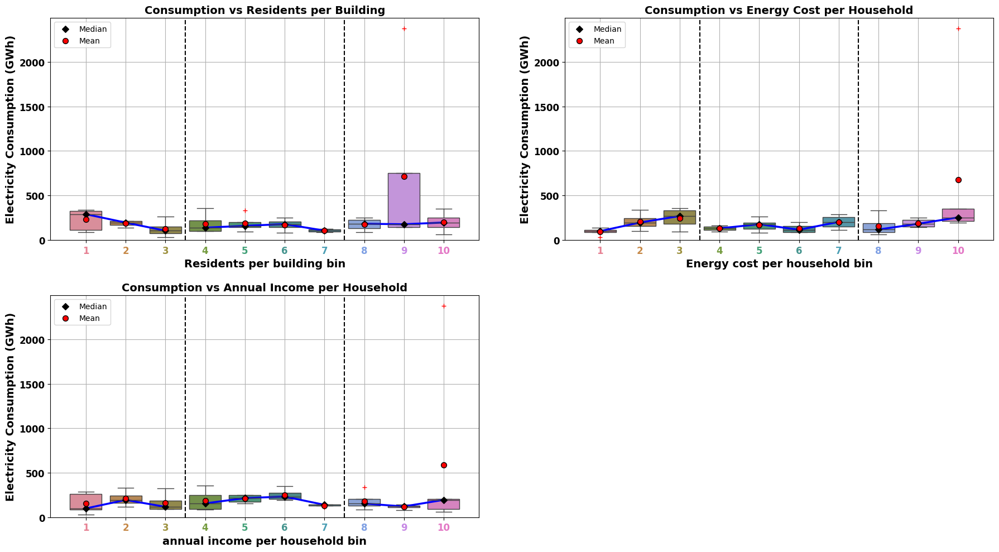

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm

# Define colormap
cmap = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

# Updated function
def plot_colored_boxplot_lined_panel(df, feature_bin, title, ax):
    palette = cmap.colors[:len(df[feature_bin].unique())]

    # Boxplot
    sns.boxplot(
        x=feature_bin,
        y='BBE SC1_100 – Consumption GWh',
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    # Medians & means
    bin_medians = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].median()
    bin_means = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].mean()

    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    # Median diamonds
    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)

    # Blue lines for LMH
    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    draw_segments([0, 1, 2])       # Low
    draw_segments([3, 4, 5, 6])    # Medium
    draw_segments([7, 8, 9])       # High

    # Mean points
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    # Styling
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel('Electricity Consumption (GWh)', fontsize=14, fontweight='bold')

    # Colored xticks
    tick_labels = [str(i + 1) for i in x_vals]
    ax.set_xticks(x_vals)
    ax.set_xticklabels(tick_labels, fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        label.set_color(palette[i])

    # Bold Y ticks
    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    # Limits and grid
    y_max = df['BBE SC1_100 – Consumption GWh'].max()
    ax.set_ylim(0, y_max * 1.05)
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')

    ax.grid(True)
    ax.legend(loc='upper left')



# === Panel Plot for Residents, Energy Cost, and Income ===
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

# Plot 1: Residents per building
plot_colored_boxplot_lined_panel(df, 'Residents per building_bin', 'Consumption vs Residents per Building', axes[0, 0])

# Plot 2: Energy cost per household
plot_colored_boxplot_lined_panel(df, 'Energy cost per household_bin', 'Consumption vs Energy Cost per Household', axes[0, 1])

# Plot 3: Annual income per household (centered)

plot_colored_boxplot_lined_panel(df, 'annual income per household_bin', 'Consumption vs Annual Income per Household', axes[1, 0])
axes[1, 1].axis('off')  # Leave left subplot blank
plt.tight_layout()
plt.subplots_adjust(hspace=0.25, wspace=0.2)
plt.show()


**Using Annual income per household bin**

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm

# Define colormap
cmap = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

# Generalized function for any y and x
def plot_colored_boxplot_income(df, feature_bin, y_col, title, ax):
    palette = cmap.colors[:len(df[feature_bin].unique())]

    # Boxplot
    sns.boxplot(
        x=feature_bin,
        y=y_col,
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    # Medians & means
    bin_medians = df.groupby(feature_bin)[y_col].median()
    bin_means = df.groupby(feature_bin)[y_col].mean()

    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    # Median diamonds
    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)

    # Blue lines for LMH
    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    draw_segments([0, 1, 2])       # Low
    draw_segments([3, 4, 5, 6])    # Medium
    draw_segments([7, 8, 9])       # High

    # Mean points
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    # Styling
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel(y_col.replace('_', ' '), fontsize=14, fontweight='bold')

    # Colored xticks
    tick_labels = [str(i + 1) for i in x_vals]
    ax.set_xticks(x_vals)
    ax.set_xticklabels(tick_labels, fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        label.set_color(palette[i])

    # Bold Y ticks
    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    # Limits and grid
    y_max = df[y_col].max()
    ax.set_ylim(0, y_max * 1.05)
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')

    ax.grid(True)
    ax.legend(loc='upper left')


In [ ]:
df.columns


Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'Energy Security Index',
       'Energy Efficiency Ratio', 'Energy Poverty Index', 'PCPP Index',
       'CPP Index', 'Area_bin', 'Population_bin', 'Pop Dens_bin',
       'buildings_bin', 'Residents per building_bin',
       'Energy cost per residents_bin', 'Energy cost per household',
       'Energy cost per household_bin', 'annual income per household_bin',
       'BBE SC1_100 – Consumption GWh_bin', 'PV Production Gwh – Only BBE_bin',
       'Energy Poverty Household', 'Energy Poverty Threshold'],
      dtype='object')

<ipython-input-47-8efc3fdd4936>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
<ipython-input-47-8efc3fdd4936>:28: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)[y_col].median()
<ipython-input-47-8efc3fdd4936>:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)[y_col].mean()


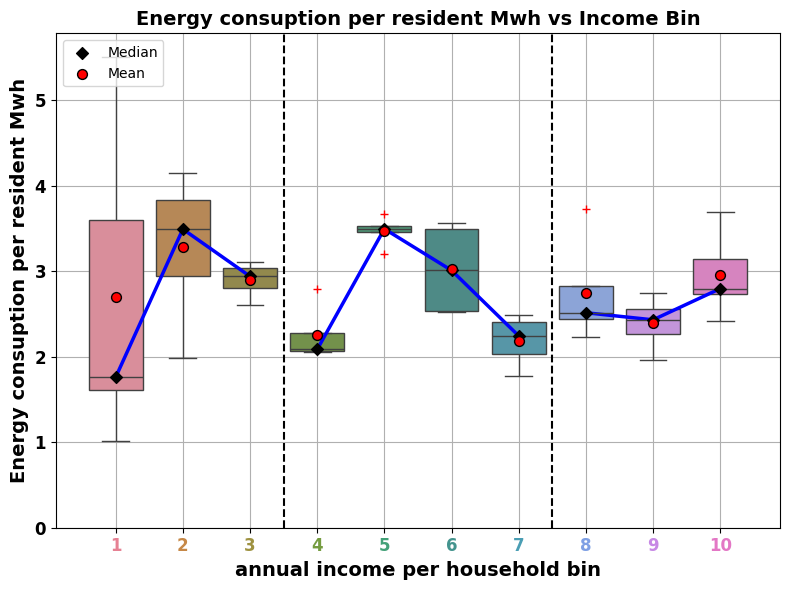

In [ ]:
fig, ax = plt.subplots(figsize=(8, 6))
plot_colored_boxplot_income(
    df,
    feature_bin='annual income per household_bin',
    y_col='Energy consuption per resident Mwh',
    title='Energy consuption per resident Mwh vs Income Bin',
    ax=ax
)
plt.tight_layout()
plt.show()

<ipython-input-47-8efc3fdd4936>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
<ipython-input-47-8efc3fdd4936>:28: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)[y_col].median()
<ipython-input-47-8efc3fdd4936>:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)[y_col].mean()


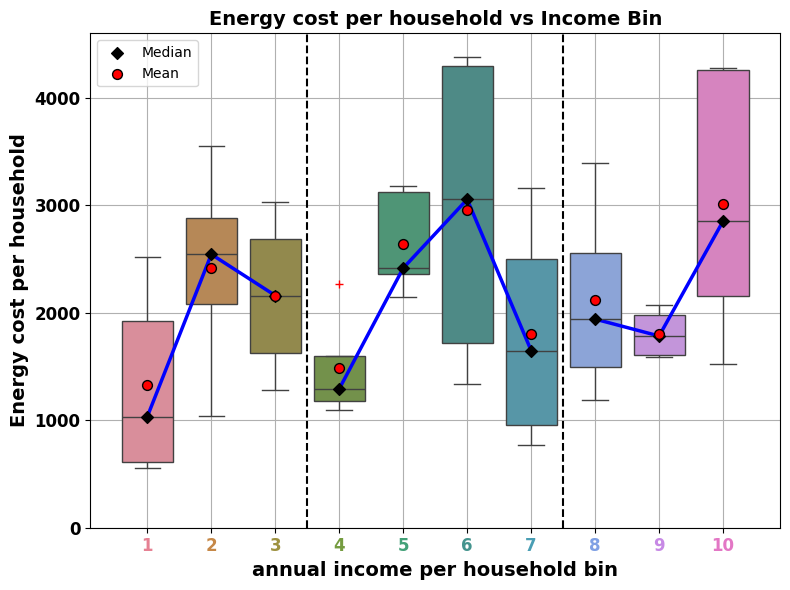

In [ ]:
fig, ax = plt.subplots(figsize=(8, 6))
plot_colored_boxplot_income(
    df,
    feature_bin='annual income per household_bin',
    y_col='Energy cost per household',
    title='Energy cost per household vs Income Bin',
    ax=ax
)
plt.tight_layout()
plt.show()


<ipython-input-47-8efc3fdd4936>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
<ipython-input-47-8efc3fdd4936>:28: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)[y_col].median()
<ipython-input-47-8efc3fdd4936>:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)[y_col].mean()


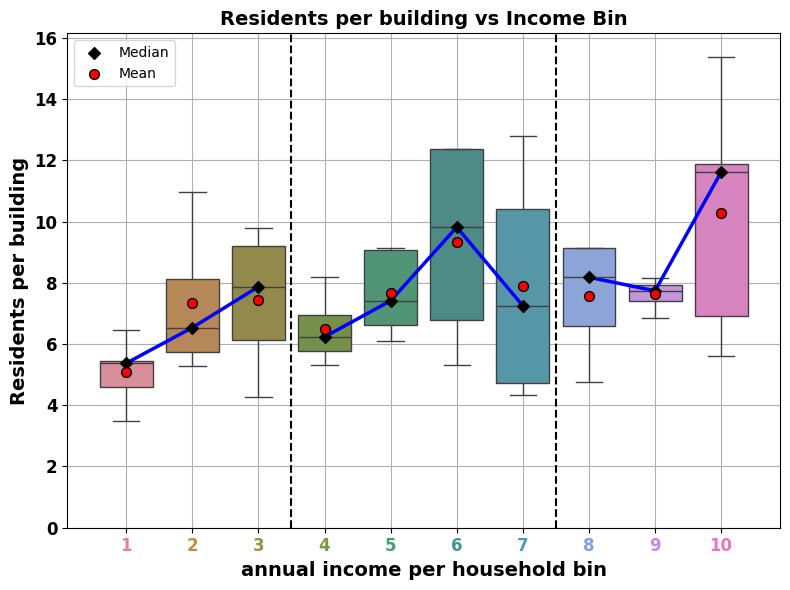

In [ ]:

fig, ax = plt.subplots(figsize=(8, 6))
plot_colored_boxplot_income(
    df,
    feature_bin='annual income per household_bin',
    y_col='Residents per building',
    title='Residents per building vs Income Bin',
    ax=ax
)
plt.tight_layout()
plt.show()



In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'Energy Security Index',
       'Energy Efficiency Ratio', 'Energy Poverty Index', 'PCPP Index',
       'CPP Index', 'Area_bin', 'Population_bin', 'Pop Dens_bin',
       'buildings_bin', 'Residents per building_bin',
       'Energy cost per residents_bin', 'Energy cost per household',
       'Energy cost per household_bin', 'annual income per household_bin',
       'BBE SC1_100 – Consumption GWh_bin', 'PV Production Gwh – Only BBE_bin',
       'Energy Poverty Household', 'Energy Poverty Threshold'],
      dtype='object')

<ipython-input-47-8efc3fdd4936>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
<ipython-input-47-8efc3fdd4936>:28: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)[y_col].median()
<ipython-input-47-8efc3fdd4936>:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)[y_col].mean()


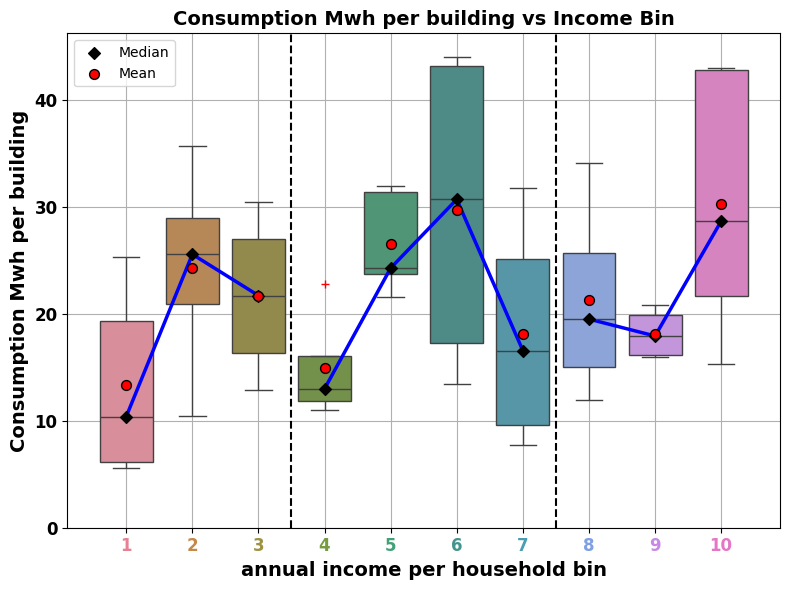

In [ ]:

fig, ax = plt.subplots(figsize=(8, 6))
plot_colored_boxplot_income(
    df,
    feature_bin='annual income per household_bin',
    y_col='Consumption Mwh per building',
    title='Consumption Mwh per building vs Income Bin',
    ax=ax
)
plt.tight_layout()
plt.show()



In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap

# Define the custom colormap
cmap = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

def plot_colored_boxplot_consumption(df, feature_bin, title):
    """
    Plots a colorful boxplot for energy consumption,
    connects the medians with a line,
    overlays the means as red circles with black edges,
    and shows outliers as red '+' symbols.
    """
    plt.figure(figsize=(10, 6))

    # Use fixed colormap
    palette = cmap.colors[:len(df[feature_bin].unique())]

    # Plot the boxplot with outliers as red '+'
    sns.boxplot(
        x=feature_bin,
        y='BBE SC1_100 – Consumption GWh',
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1
    )

    # Compute statistics
    bin_medians = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].median()
    bin_means = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].mean()

    # Median line
    plt.plot(
        bin_medians.index,
        bin_medians.values,
        marker='o',
        color='blue',
        label='Median',
        linestyle='-',
        linewidth=2
    )

    # Mean scatter
    plt.scatter(
        bin_means.index,
        bin_means.values,
        color='red',
        s=100,
        label='Mean',
        edgecolors='black'
    )

    # Styling
    plt.title(title, fontsize=14, fontweight='bold', loc='left')
    plt.xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    plt.ylabel('Consumption (GWh)', fontsize=14, fontweight='bold')

    # Numeric x-ticks
    plt.xticks(
        ticks=range(len(bin_medians.index)),
        labels=[str(i + 1) for i in range(len(bin_medians.index))],
        fontsize=12,
        fontweight='bold'
    )
    plt.yticks(fontsize=12, fontweight='bold')

    # Y-axis limit
    y_max = df['BBE SC1_100 – Consumption GWh'].max()
    plt.ylim(0, y_max * 1.05)

    # Vertical separators
    plt.axvline(x=2.5, color='black', linestyle='--')
    plt.axvline(x=6.5, color='black', linestyle='--')

    plt.grid(True)
    plt.legend(loc='upper left')
    plt.tight_layout()
    plt.show()


<ipython-input-54-e99ac8a5c372>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
<ipython-input-54-e99ac8a5c372>:34: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].median()
<ipython-input-54-e99ac8a5c372>:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].mean()


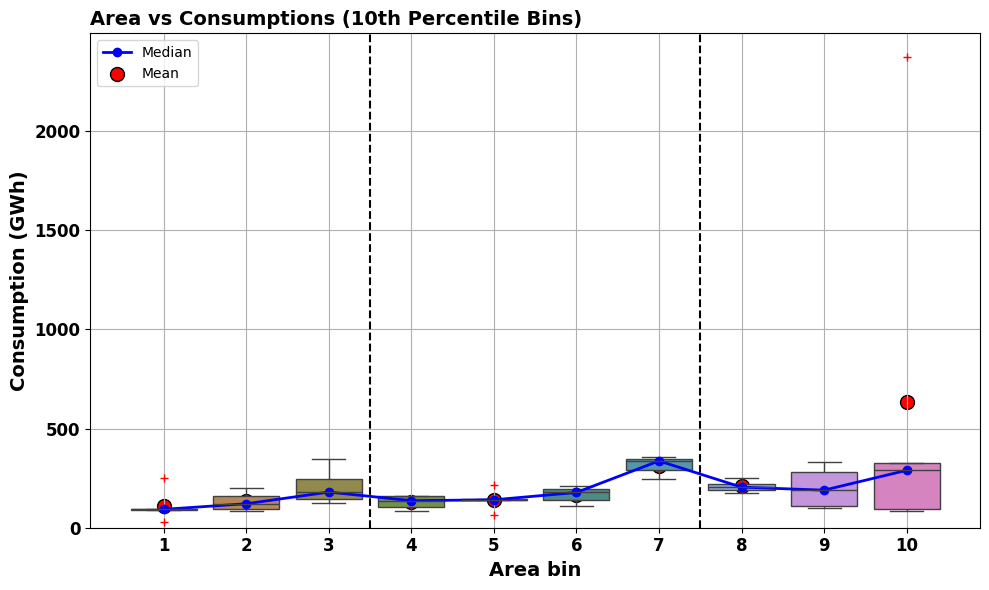

<ipython-input-54-e99ac8a5c372>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
<ipython-input-54-e99ac8a5c372>:34: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].median()
<ipython-input-54-e99ac8a5c372>:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].mean()


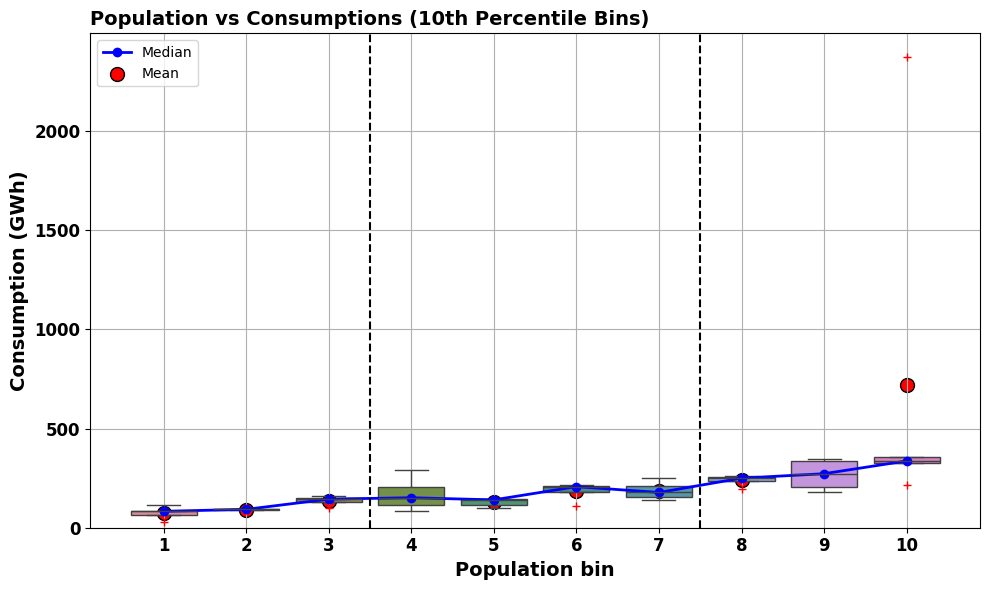

<ipython-input-54-e99ac8a5c372>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
<ipython-input-54-e99ac8a5c372>:34: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].median()
<ipython-input-54-e99ac8a5c372>:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].mean()


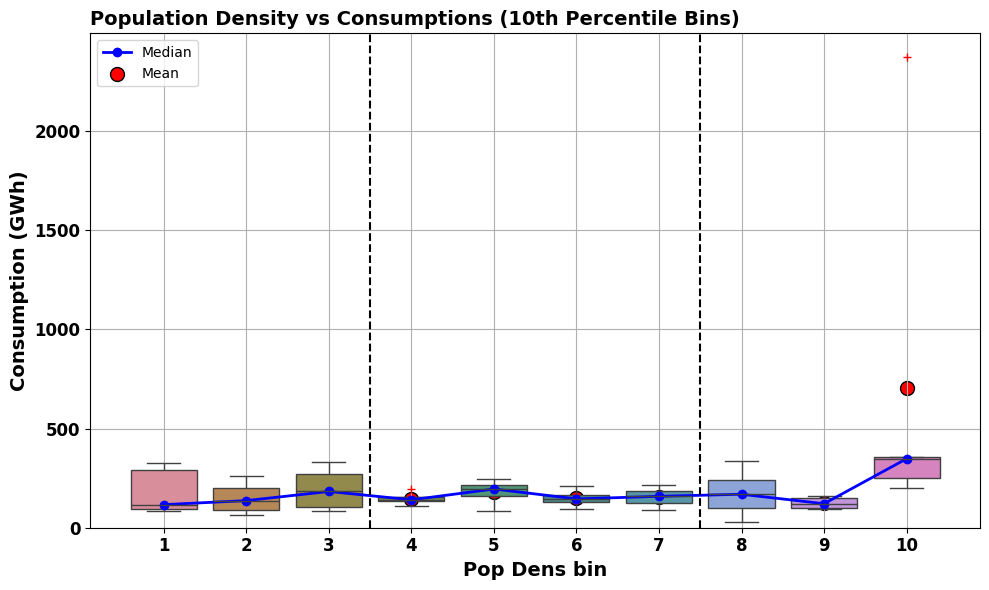

<ipython-input-54-e99ac8a5c372>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
<ipython-input-54-e99ac8a5c372>:34: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].median()
<ipython-input-54-e99ac8a5c372>:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].mean()


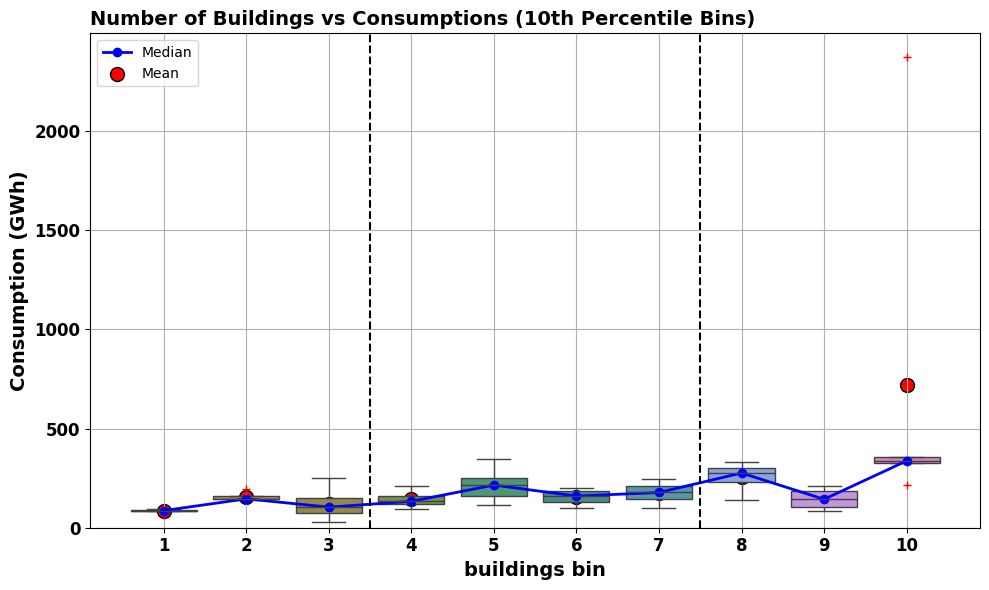

<ipython-input-54-e99ac8a5c372>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
<ipython-input-54-e99ac8a5c372>:34: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].median()
<ipython-input-54-e99ac8a5c372>:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].mean()


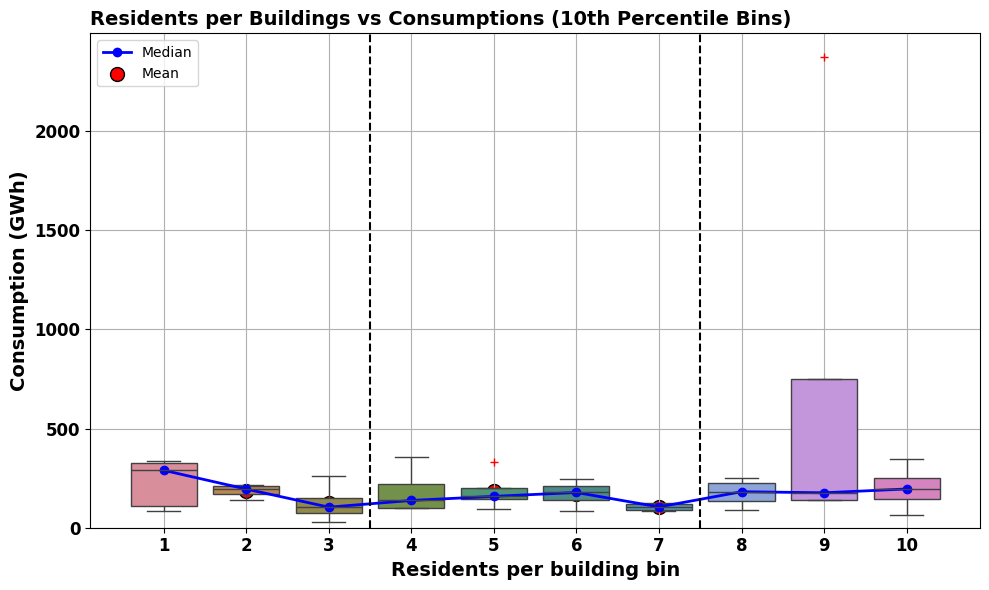

<ipython-input-54-e99ac8a5c372>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
<ipython-input-54-e99ac8a5c372>:34: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].median()
<ipython-input-54-e99ac8a5c372>:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].mean()


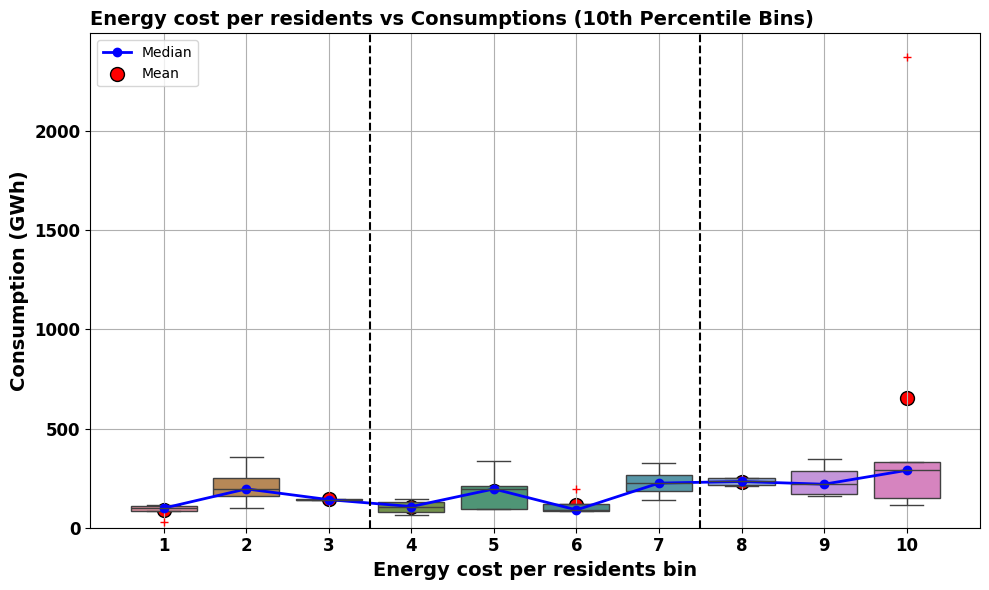

In [ ]:
# Step 5: Plot boxplots for each feature
plot_colored_boxplot_consumption(df, 'Area_bin', 'Area vs Consumptions (10th Percentile Bins)')
plot_colored_boxplot_consumption(df, 'Population_bin', 'Population vs Consumptions (10th Percentile Bins)')
plot_colored_boxplot_consumption(df, 'Pop Dens_bin', 'Population Density vs Consumptions (10th Percentile Bins)')
plot_colored_boxplot_consumption(df, 'buildings_bin', 'Number of Buildings vs Consumptions (10th Percentile Bins)')
plot_colored_boxplot_consumption(df, 'Residents per building_bin', 'Residents per Buildings vs Consumptions (10th Percentile Bins)')
plot_colored_boxplot_consumption(df, 'Energy cost per residents_bin', 'Energy cost per residents vs Consumptions (10th Percentile Bins)')


In [ ]:
def plot_colored_boxplot_consumption_with_break(df, feature_bin, title):
    import matplotlib.pyplot as plt
    import seaborn as sns
    from matplotlib.colors import ListedColormap

    # Define custom colormap
    cmap = ListedColormap([
        "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
        "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
    ])

    palette = cmap.colors[:len(df[feature_bin].unique())]

    # Calculate medians and means
    bin_medians = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].median()
    bin_means = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].mean()

    # Create subplot with broken axis
    fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(10, 7), gridspec_kw={'height_ratios': [1, 3]})

    # Plot both axes
    sns.boxplot(x=feature_bin, y='BBE SC1_100 – Consumption GWh', data=df, ax=ax1,
                palette=palette, flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'), linewidth=1)

    sns.boxplot(x=feature_bin, y='BBE SC1_100 – Consumption GWh', data=df, ax=ax2,
                palette=palette, flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'), linewidth=1)

    # Set y-axis limits with break above 1500
    ax1.set_ylim(1500, df['BBE SC1_100 – Consumption GWh'].max() * 1.05)
    ax2.set_ylim(0, 1200)

    # Hide overlapping spines
    ax1.spines['bottom'].set_visible(False)
    ax2.spines['top'].set_visible(False)
    ax1.tick_params(labeltop=False)
    ax2.tick_params(labelbottom=True)

    # Add diagonal lines to indicate break
    kwargs = dict(marker=[(-1, -1), (1, 1)], markersize=12, linestyle='none',
                  color='k', mec='k', mew=1, clip_on=False)
    ax1.plot([.5, len(bin_medians) - 0.5], [0, 0], transform=ax1.transAxes, **kwargs)
    ax2.plot([.5, len(bin_medians) - 0.5], [1, 1], transform=ax2.transAxes, **kwargs)

    # Plot median and mean on ax2 (main plot)
    ax2.plot(bin_medians.index, bin_medians.values, marker='o', color='blue', label='Median', linewidth=2)
    ax2.scatter(bin_means.index, bin_means.values, color='red', s=100, label='Mean', edgecolors='black')

    # Labels and styling
    ax1.set_ylabel('Consumption (GWh)', fontsize=14, fontweight='bold')
    ax2.set_ylabel('Consumption (GWh)', fontsize=14, fontweight='bold')
    ax2.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax2.set_xticklabels([str(i + 1) for i in range(len(bin_medians))], fontsize=12, fontweight='bold')
    ax1.set_title(title, fontsize=14, fontweight='bold', loc='left')

    ax2.axvline(x=2.5, color='black', linestyle='--')
    ax2.axvline(x=6.5, color='black', linestyle='--')
    ax2.grid(True)
    ax2.legend(loc='upper left')

    plt.tight_layout()
    plt.show()


<ipython-input-56-34b6a0864af8>:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].median()
<ipython-input-56-34b6a0864af8>:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].mean()
<ipython-input-56-34b6a0864af8>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=feature_bin, y='BBE SC1_100 – Consumption GWh', data=df, ax=a

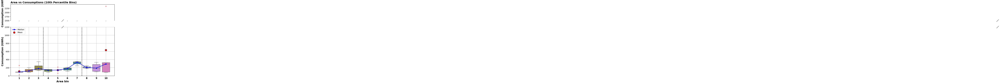

<ipython-input-56-34b6a0864af8>:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].median()
<ipython-input-56-34b6a0864af8>:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].mean()
<ipython-input-56-34b6a0864af8>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=feature_bin, y='BBE SC1_100 – Consumption GWh', data=df, ax=a

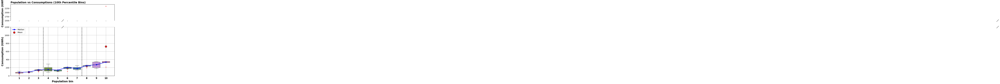

<ipython-input-56-34b6a0864af8>:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].median()
<ipython-input-56-34b6a0864af8>:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].mean()
<ipython-input-56-34b6a0864af8>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=feature_bin, y='BBE SC1_100 – Consumption GWh', data=df, ax=a

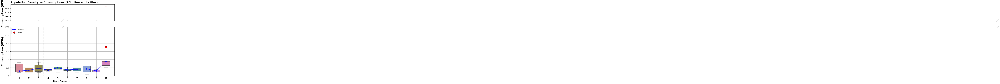

<ipython-input-56-34b6a0864af8>:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].median()
<ipython-input-56-34b6a0864af8>:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].mean()
<ipython-input-56-34b6a0864af8>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=feature_bin, y='BBE SC1_100 – Consumption GWh', data=df, ax=a

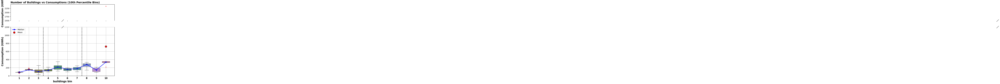

<ipython-input-56-34b6a0864af8>:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].median()
<ipython-input-56-34b6a0864af8>:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].mean()
<ipython-input-56-34b6a0864af8>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=feature_bin, y='BBE SC1_100 – Consumption GWh', data=df, ax=a

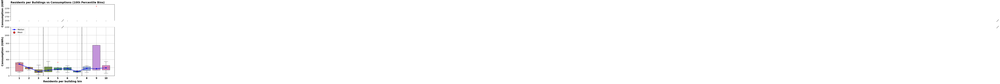

<ipython-input-56-34b6a0864af8>:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].median()
<ipython-input-56-34b6a0864af8>:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['BBE SC1_100 – Consumption GWh'].mean()
<ipython-input-56-34b6a0864af8>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=feature_bin, y='BBE SC1_100 – Consumption GWh', data=df, ax=a

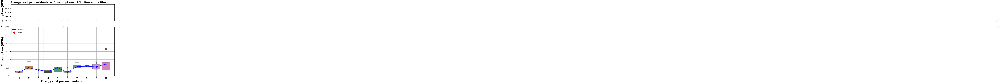

In [ ]:
# Step 5: Plot boxplots for each feature
plot_colored_boxplot_consumption_with_break(df, 'Area_bin', 'Area vs Consumptions (10th Percentile Bins)')
plot_colored_boxplot_consumption_with_break(df, 'Population_bin', 'Population vs Consumptions (10th Percentile Bins)')
plot_colored_boxplot_consumption_with_break(df, 'Pop Dens_bin', 'Population Density vs Consumptions (10th Percentile Bins)')
plot_colored_boxplot_consumption_with_break(df, 'buildings_bin', 'Number of Buildings vs Consumptions (10th Percentile Bins)')
plot_colored_boxplot_consumption_with_break(df, 'Residents per building_bin', 'Residents per Buildings vs Consumptions (10th Percentile Bins)')
plot_colored_boxplot_consumption_with_break(df, 'Energy cost per residents_bin', 'Energy cost per residents vs Consumptions (10th Percentile Bins)')


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_colored_boxplot(df, feature_bin, title):
    """
    Plots a colorful boxplot, connects the medians with a line,
    and overlays the means as red circles with black edges.

    Args:
    - df: Pandas DataFrame
    - feature_bin: Column containing bin labels
    - title: Title for the plot

    Returns:
    - A boxplot with colorful bins, median line, and mean markers.
    """
    plt.figure(figsize=(10, 6))

    # Step 1: Create a colorful boxplot
    palette = sns.color_palette("husl", len(df[feature_bin].unique()))  # Use a colorful palette
    sns.boxplot(
        x=feature_bin,
        y='PV Production Gwh – Only BBE',
        data=df,
        showfliers=False,
        palette=palette
    )

    # Step 2: Calculate the mean and median for each bin
    bin_medians = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].median()
    bin_means = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].mean()

    # Step 3: Add a line to connect the medians
    plt.plot(
        bin_medians.index,
        bin_medians.values,
        marker='o',
        color='blue',
        label='Median',
        linestyle='-',
        linewidth=2
    )

    # Step 4: Overlay the means as red circles with black edges
    plt.scatter(
        bin_means.index,
        bin_means.values,
        color='red',
        s=100,
        label='Mean',
        edgecolors='black'
    )

    # Step 5: Add title, labels, and legend
    plt.title(title)
    plt.xlabel(feature_bin)
    plt.ylabel('PV Production GWh – Only BBE')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


<ipython-input-58-7e54616b5955>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
<ipython-input-58-7e54616b5955>:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].median()
<ipython-input-58-7e54616b5955>:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].mean()


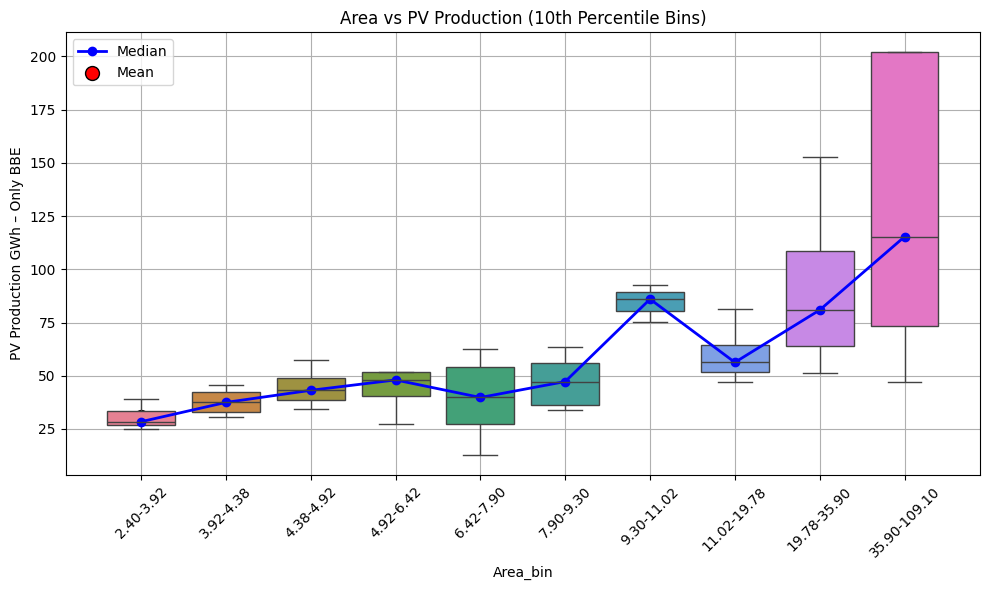

<ipython-input-58-7e54616b5955>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
<ipython-input-58-7e54616b5955>:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].median()
<ipython-input-58-7e54616b5955>:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].mean()


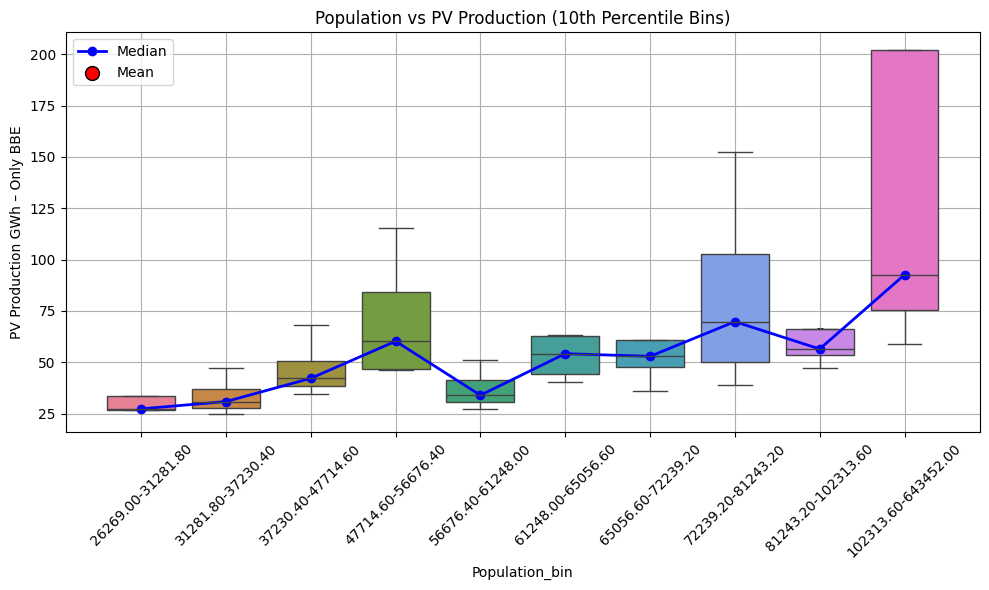

<ipython-input-58-7e54616b5955>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
<ipython-input-58-7e54616b5955>:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].median()
<ipython-input-58-7e54616b5955>:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].mean()


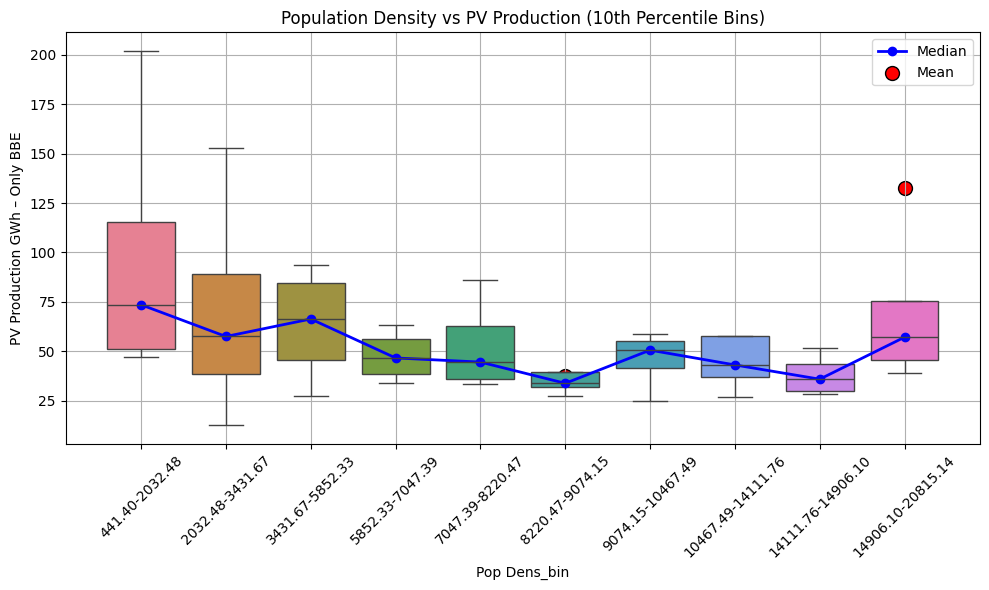

<ipython-input-58-7e54616b5955>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
<ipython-input-58-7e54616b5955>:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].median()
<ipython-input-58-7e54616b5955>:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].mean()


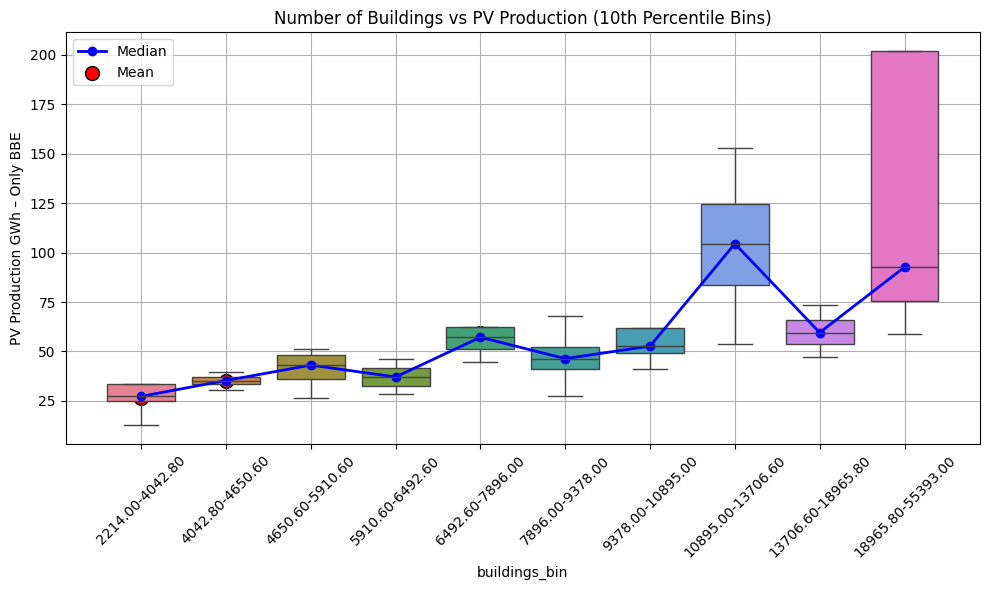

<ipython-input-58-7e54616b5955>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
<ipython-input-58-7e54616b5955>:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].median()
<ipython-input-58-7e54616b5955>:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['PV Production Gwh – Only BBE'].mean()


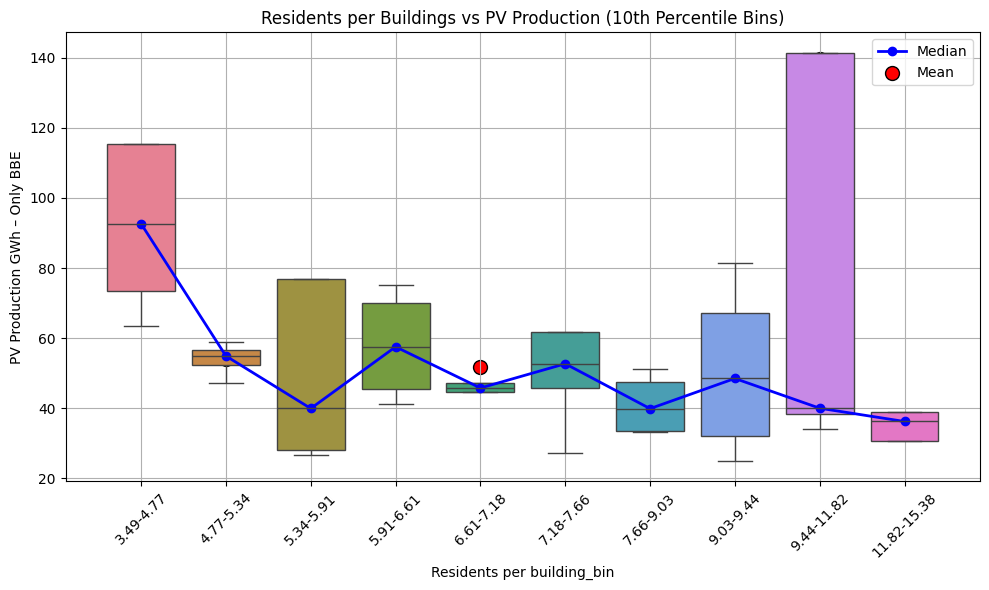

In [ ]:
# Step 5: Plot boxplots for each feature
plot_colored_boxplot(df, 'Area_bin', 'Area vs PV Production (10th Percentile Bins)')
plot_colored_boxplot(df, 'Population_bin', 'Population vs PV Production (10th Percentile Bins)')
plot_colored_boxplot(df, 'Pop Dens_bin', 'Population Density vs PV Production (10th Percentile Bins)')
plot_colored_boxplot(df, 'buildings_bin', 'Number of Buildings vs PV Production (10th Percentile Bins)')
plot_colored_boxplot(df, 'Residents per building_bin', 'Residents per Buildings vs PV Production (10th Percentile Bins)')

In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'Energy Security Index',
       'Energy Efficiency Ratio', 'Energy Poverty Index', 'PCPP Index',
       'CPP Index', 'Area_bin', 'Population_bin', 'Pop Dens_bin',
       'buildings_bin', 'Residents per building_bin',
       'Energy cost per residents_bin', 'Energy cost per household',
       'Energy cost per household_bin', 'annual income per household_bin',
       'BBE SC1_100 – Consumption GWh_bin', 'PV Production Gwh – Only BBE_bin',
       'Energy Poverty Household', 'Energy Poverty Threshold'],
      dtype='object')

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_boxplot_buildings(df, feature_bin, title):
    """
    Plots a colorful boxplot, connects the medians with a line,
    and overlays the means as red circles with black edges.

    Args:
    - df: Pandas DataFrame
    - feature_bin: Column containing bin labels
    - title: Title for the plot

    Returns:
    - A boxplot with colorful bins, median line, and mean markers.
    """
    plt.figure(figsize=(10, 6))

    # Step 1: Create a colorful boxplot
    palette = sns.color_palette("husl", len(df[feature_bin].unique()))  # Use a colorful palette
    sns.boxplot(
        x=feature_bin,
        y='buildings',
        data=df,
        showfliers=False,
        palette=palette
    )

    # Step 2: Calculate the mean and median for each bin
    bin_medians = df.groupby(feature_bin)['buildings'].median()
    bin_means = df.groupby(feature_bin)['buildings'].mean()

    # Step 3: Add a line to connect the medians
    plt.plot(
        bin_medians.index,
        bin_medians.values,
        marker='o',
        color='blue',
        label='Median',
        linestyle='-',
        linewidth=2
    )

    # Step 4: Overlay the means as red circles with black edges
    plt.scatter(
        bin_means.index,
        bin_means.values,
        color='red',
        s=100,
        label='Mean',
        edgecolors='black'
    )

    # Step 5: Add title, labels, and legend
    plt.title(title)
    plt.xlabel(feature_bin)
    plt.ylabel('# Buildings')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'Energy cost per household',
       'Energy cost per household_bin', 'annual income per household_bin',
       'BBE SC1_100 – Consumption GWh_bin', 'PV Production Gwh – Only BBE_bin',
       'Energy Poverty Household', 'Energy Poverty Threshold', 'Area_bin',
       'Population_bin', 'Pop Dens_bin', 'buildings_bin',
       'Residents per building_bin', 'Energy cost per residents_bin',
       'Adequacy_Index'],
      dtype='object')

/tmp/ipython-input-1730071393.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-1730071393.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['buildings'].median()
/tmp/ipython-input-1730071393.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['buildings'].mean()


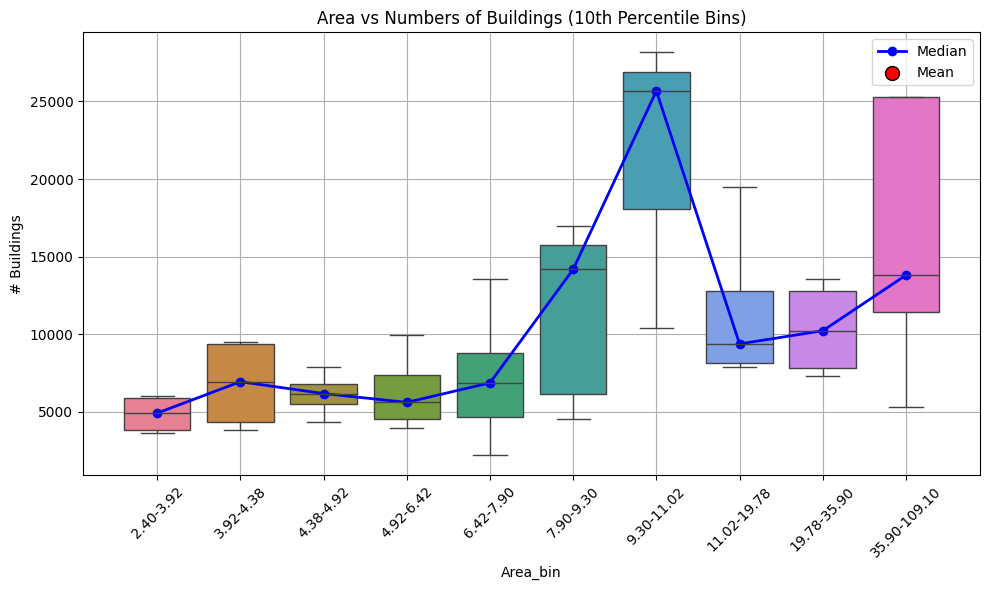

/tmp/ipython-input-1730071393.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-1730071393.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['buildings'].median()
/tmp/ipython-input-1730071393.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['buildings'].mean()


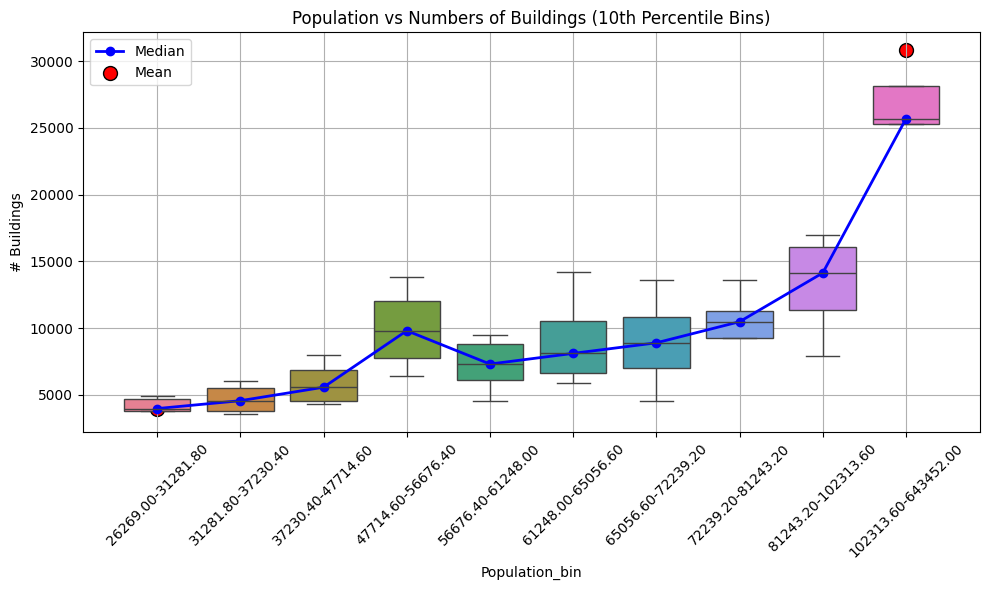

/tmp/ipython-input-1730071393.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-1730071393.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['buildings'].median()
/tmp/ipython-input-1730071393.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['buildings'].mean()


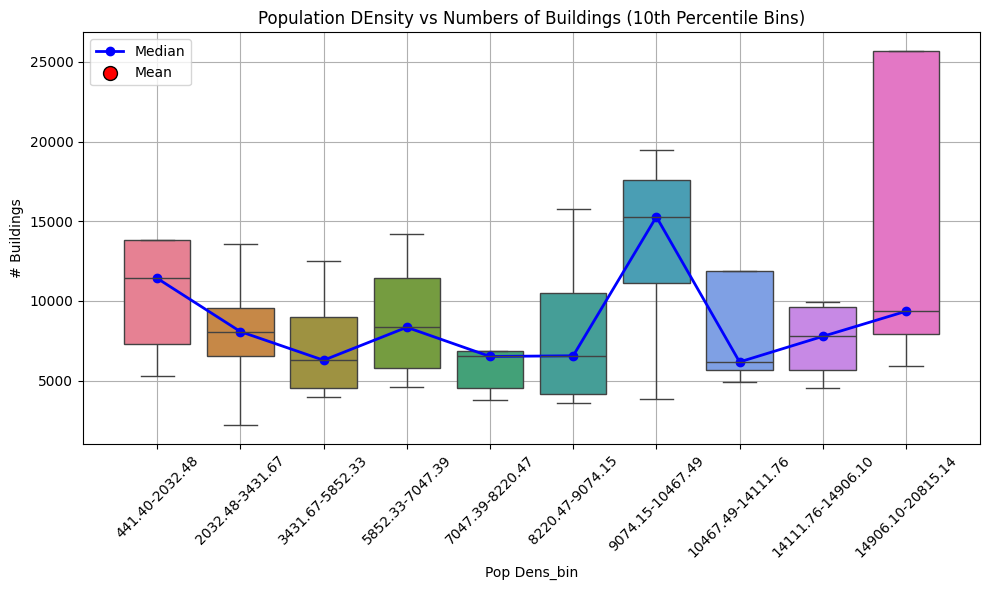

/tmp/ipython-input-1730071393.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-1730071393.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['buildings'].median()
/tmp/ipython-input-1730071393.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['buildings'].mean()


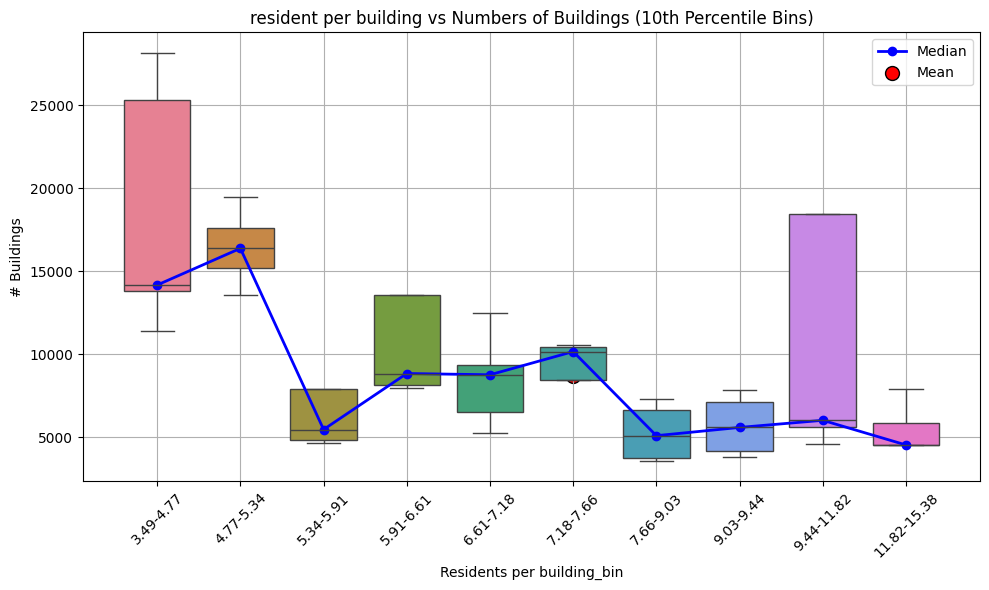

In [ ]:
# Step 5: Plot boxplots for each feature

plot_boxplot_buildings(df, 'Area_bin', 'Area vs Numbers of Buildings (10th Percentile Bins)')
plot_boxplot_buildings(df, 'Population_bin', 'Population vs Numbers of Buildings (10th Percentile Bins)')
plot_boxplot_buildings(df, 'Pop Dens_bin', 'Population DEnsity vs Numbers of Buildings (10th Percentile Bins)')
plot_boxplot_buildings(df, 'Residents per building_bin', 'resident per building vs Numbers of Buildings (10th Percentile Bins)')

In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'Energy cost per household',
       'Energy cost per household_bin', 'annual income per household_bin',
       'BBE SC1_100 – Consumption GWh_bin', 'PV Production Gwh – Only BBE_bin',
       'Energy Poverty Household', 'Energy Poverty Threshold', 'Area_bin',
       'Population_bin', 'Pop Dens_bin', 'buildings_bin',
       'Residents per building_bin', 'Energy cost per residents_bin',
       'Adequacy_Index'],
      dtype='object')

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_boxplot_buildings(df, feature_bin, title):
    """
    Plots a colorful boxplot, connects the medians with a line,
    and overlays the means as red circles with black edges.

    Args:
    - df: Pandas DataFrame
    - feature_bin: Column containing bin labels
    - title: Title for the plot

    Returns:
    - A boxplot with colorful bins, median line, and mean markers.
    """
    plt.figure(figsize=(10, 6))

    # Step 1: Create a colorful boxplot
    palette = sns.color_palette("husl", len(df[feature_bin].unique()))  # Use a colorful palette
    sns.boxplot(
        x=feature_bin,
        y='buildings',
        data=df,
        showfliers=False,
        palette=palette
    )

    # Step 2: Calculate the mean and median for each bin
    bin_medians = df.groupby(feature_bin)['buildings'].median()
    bin_means = df.groupby(feature_bin)['buildings'].mean()

    # Step 3: Add a line to connect the medians
    plt.plot(
        bin_medians.index,
        bin_medians.values,
        marker='o',
        color='blue',
        label='Median',
        linestyle='-',
        linewidth=2
    )

    # Step 4: Overlay the means as red circles with black edges
    plt.scatter(
        bin_means.index,
        bin_means.values,
        color='red',
        s=100,
        label='Mean',
        edgecolors='black'
    )

    # Step 5: Add title, labels, and legend
    plt.title(title)
    plt.xlabel(feature_bin)
    plt.ylabel('# Buildings')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


/tmp/ipython-input-3448025330.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3448025330.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['Population'].median()
/tmp/ipython-input-3448025330.py:27: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['Population'].mean()


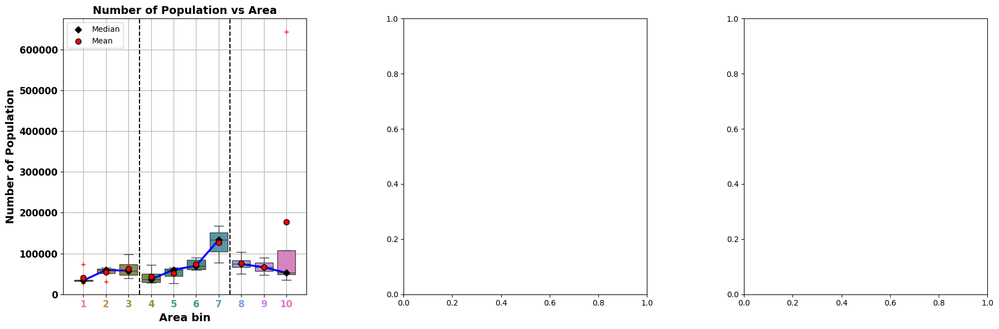

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec

# Define colormap
cmap = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

# Function definition
def plot_colored_boxplot_lined_panel(df, feature_bin, title, ax):
    palette = cmap.colors[:len(df[feature_bin].unique())]
    sns.boxplot(
        x=feature_bin,
        y='Population',
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    bin_medians = df.groupby(feature_bin)['Population'].median()
    bin_means = df.groupby(feature_bin)['Population'].mean()
    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    # Median diamonds
    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)

    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    draw_segments([0, 1, 2])       # Low
    draw_segments([3, 4, 5, 6])    # Medium
    draw_segments([7, 8, 9])       # High

    # Mean points
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel('Number of Population', fontsize=14, fontweight='bold')

    tick_labels = [str(i + 1) for i in x_vals]
    ax.set_xticks(x_vals)
    ax.set_xticklabels(tick_labels, fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        label.set_color(palette[i])

    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    y_max = df['Population'].max()
    ax.set_ylim(0, y_max * 1.05)
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')
    ax.grid(True)
    ax.legend(loc='upper left')

# === Create a custom layout ===
fig = plt.figure(figsize=(18, 6))
gs = gridspec.GridSpec(1, 3, figure=fig)

# Top row
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])

# Bottom row: place the 3rd plot in the middle column
ax3 = fig.add_subplot(gs[0, 2])

# Plot
plot_colored_boxplot_lined_panel(df, 'Area_bin', 'Number of Population vs Area', ax1)

plt.tight_layout()
plt.subplots_adjust(hspace=0.45, wspace=0.4)
plt.show()


/tmp/ipython-input-400943045.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-400943045.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['Pop Dens'].median()
/tmp/ipython-input-400943045.py:27: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['Pop Dens'].mean()


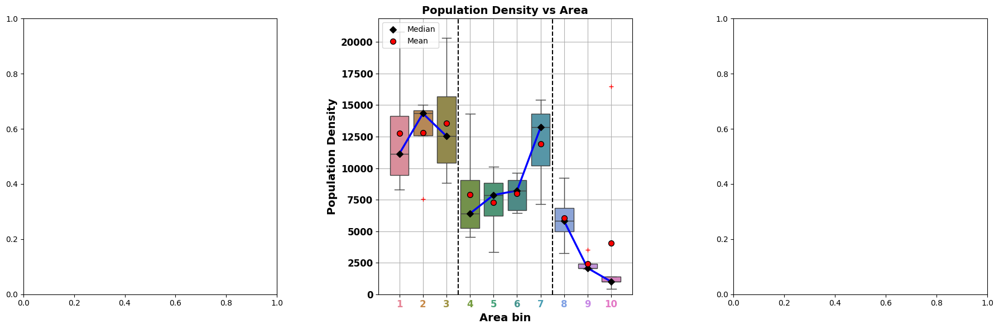

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec

# Define colormap
cmap = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

# Function definition
def plot_colored_boxplot_lined_panel(df, feature_bin, title, ax):
    palette = cmap.colors[:len(df[feature_bin].unique())]
    sns.boxplot(
        x=feature_bin,
        y='Pop Dens',
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    bin_medians = df.groupby(feature_bin)['Pop Dens'].median()
    bin_means = df.groupby(feature_bin)['Pop Dens'].mean()
    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    # Median diamonds
    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)

    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    draw_segments([0, 1, 2])       # Low
    draw_segments([3, 4, 5, 6])    # Medium
    draw_segments([7, 8, 9])       # High

    # Mean points
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel('Population Density', fontsize=14, fontweight='bold')

    tick_labels = [str(i + 1) for i in x_vals]
    ax.set_xticks(x_vals)
    ax.set_xticklabels(tick_labels, fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        label.set_color(palette[i])

    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    y_max = df['Pop Dens'].max()
    ax.set_ylim(0, y_max * 1.05)
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')
    ax.grid(True)
    ax.legend(loc='upper left')

# === Create a custom layout ===
fig = plt.figure(figsize=(18, 6))
gs = gridspec.GridSpec(1, 3, figure=fig)

# Top row
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])

# Bottom row: place the 3rd plot in the middle column
ax3 = fig.add_subplot(gs[0, 2])

# Plot
plot_colored_boxplot_lined_panel(df, 'Area_bin', 'Population Density vs Area', ax2)

plt.tight_layout()
plt.subplots_adjust(hspace=0.45, wspace=0.4)
plt.show()


/tmp/ipython-input-2286455576.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-2286455576.py:27: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)[y_var].median()
/tmp/ipython-input-2286455576.py:28: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)[y_var].mean()
/tmp/ipython-input-2286455576.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated a

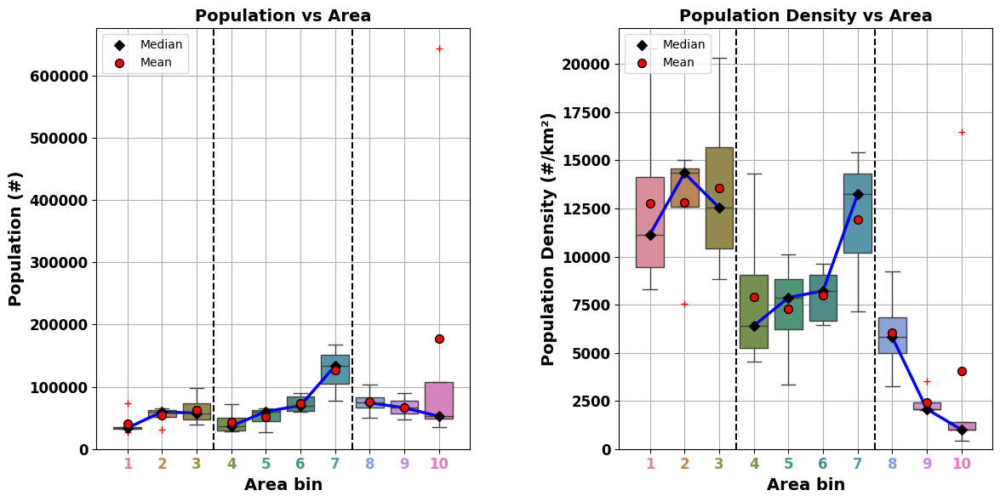

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec

# Define colormap
cmap = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

# Updated function accepting y-axis variable
def plot_colored_boxplot_lined_panel(df, feature_bin, y_var, title, y_label, ax):
    palette = cmap.colors[:len(df[feature_bin].unique())]

    sns.boxplot(
        x=feature_bin,
        y=y_var,
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    bin_medians = df.groupby(feature_bin)[y_var].median()
    bin_means = df.groupby(feature_bin)[y_var].mean()
    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    # Median diamonds
    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)

    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    draw_segments([0, 1, 2])       # Low
    draw_segments([3, 4, 5, 6])    # Medium
    draw_segments([7, 8, 9])       # High

    # Mean points
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel(y_label, fontsize=14, fontweight='bold')

    tick_labels = [str(i + 1) for i in x_vals]
    ax.set_xticks(x_vals)
    ax.set_xticklabels(tick_labels, fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        label.set_color(palette[i])

    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    y_max = df[y_var].max()
    ax.set_ylim(0, y_max * 1.05)
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')
    ax.grid(True)
    ax.legend(loc='upper left')

# === Create the figure ===
fig = plt.figure(figsize=(18, 6))
gs = gridspec.GridSpec(1, 3, figure=fig)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])

# Plot 1: Number of Population vs Area
plot_colored_boxplot_lined_panel(
    df, feature_bin='Area_bin', y_var='Population',
    title='Population vs Area', y_label='Population (#)', ax=ax1
)

# Plot 2: Population Density vs Area
plot_colored_boxplot_lined_panel(
    df, feature_bin='Area_bin', y_var='Pop Dens',
    title='Population Density vs Area', y_label='Population Density (#/km²)', ax=ax2
)

plt.tight_layout()
plt.subplots_adjust(hspace=0.45, wspace=0.4)
plt.show()


In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'Energy cost per household',
       'Energy cost per household_bin', 'annual income per household_bin',
       'BBE SC1_100 – Consumption GWh_bin', 'PV Production Gwh – Only BBE_bin',
       'Energy Poverty Household', 'Energy Poverty Threshold'],
      dtype='object')

In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'Energy cost per household',
       'Energy cost per household_bin', 'annual income per household_bin',
       'BBE SC1_100 – Consumption GWh_bin', 'PV Production Gwh – Only BBE_bin',
       'Energy Poverty Household', 'Energy Poverty Threshold', 'Area_bin',
       'Population_bin', 'Pop Dens_bin', 'buildings_bin',
       'Residents per building_bin', 'Energy cost per residents_bin',
       'Adequacy_Index'],
      dtype='object')

/tmp/ipython-input-1261958912.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-1261958912.py:27: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)[y_var].median()
/tmp/ipython-input-1261958912.py:28: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)[y_var].mean()
/tmp/ipython-input-1261958912.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated a

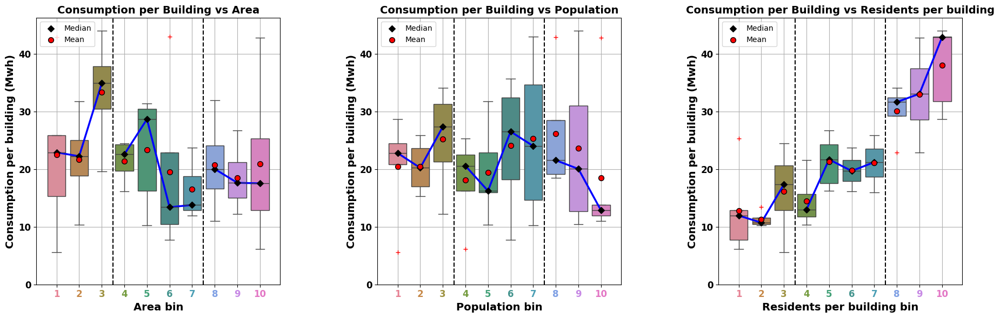

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec

# Define colormap
cmap = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

# Updated function accepting y-axis variable
def plot_colored_boxplot_lined_panel(df, feature_bin, y_var, title, y_label, ax):
    palette = cmap.colors[:len(df[feature_bin].unique())]

    sns.boxplot(
        x=feature_bin,
        y=y_var,
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    bin_medians = df.groupby(feature_bin)[y_var].median()
    bin_means = df.groupby(feature_bin)[y_var].mean()
    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    # Median diamonds
    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)

    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    draw_segments([0, 1, 2])       # Low
    draw_segments([3, 4, 5, 6])    # Medium
    draw_segments([7, 8, 9])       # High

    # Mean points
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel(y_label, fontsize=14, fontweight='bold')

    tick_labels = [str(i + 1) for i in x_vals]
    ax.set_xticks(x_vals)
    ax.set_xticklabels(tick_labels, fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        label.set_color(palette[i])

    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    y_max = df[y_var].max()
    ax.set_ylim(0, y_max * 1.05)
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')
    ax.grid(True)
    ax.legend(loc='upper left')

# === Create the figure ===
fig = plt.figure(figsize=(18, 6))
gs = gridspec.GridSpec(1, 3, figure=fig)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])

# Plot 1: Number of Population vs Area
plot_colored_boxplot_lined_panel(
    df, feature_bin='Area_bin', y_var='Consumption Mwh per building',
    title='Consumption per Building vs Area', y_label='Consumption per building (Mwh)', ax=ax1
)

# Plot 2: Population  vs Area
plot_colored_boxplot_lined_panel(
    df, feature_bin='Population_bin', y_var='Consumption Mwh per building',
    title='Consumption per Building vs Population', y_label='Consumption per building (Mwh)', ax=ax2
)
# Plot 3: Population Density vs Area
plot_colored_boxplot_lined_panel(
    df, feature_bin='Residents per building_bin', y_var='Consumption Mwh per building',
    title='Consumption per Building vs Residents per building', y_label='Consumption per building (Mwh)', ax=ax3
)

plt.tight_layout()
plt.subplots_adjust(hspace=0.45, wspace=0.4)
plt.show()


In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'Energy cost per household',
       'Energy cost per household_bin', 'annual income per household_bin',
       'BBE SC1_100 – Consumption GWh_bin', 'PV Production Gwh – Only BBE_bin',
       'Energy Poverty Household', 'Energy Poverty Threshold', 'Area_bin',
       'Population_bin', 'Pop Dens_bin', 'buildings_bin',
       'Residents per building_bin', 'Energy cost per residents_bin',
       'Adequacy_Index'],
      dtype='object')

/tmp/ipython-input-1837292815.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-1837292815.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_medians = df.groupby(feature_bin)['buildings'].median()
/tmp/ipython-input-1837292815.py:27: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_means = df.groupby(feature_bin)['buildings'].mean()
/tmp/ipython-input-1837292815.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is 

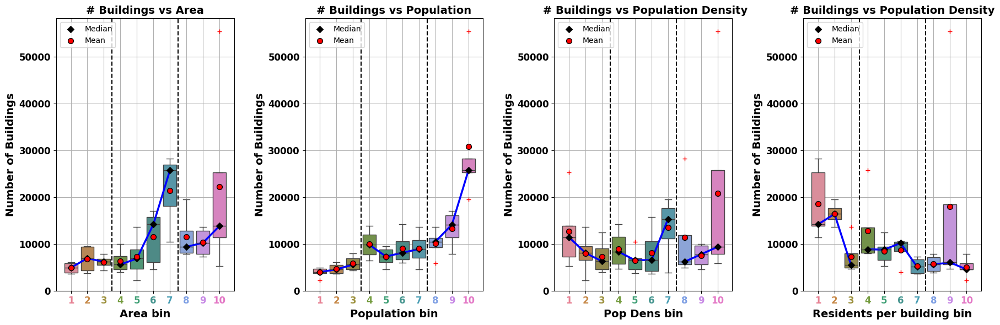

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec

# Define colormap
cmap = ListedColormap([
    "#e68193", "#c68847", "#9e9241", "#759c40", "#43a178",
    "#44948e", "#4a9eb4", "#7fa0e4", "#c789e5", "#e377c5"
])

# Function definition
def plot_colored_boxplot_lined_panel(df, feature_bin, title, ax):
    palette = cmap.colors[:len(df[feature_bin].unique())]
    sns.boxplot(
        x=feature_bin,
        y='buildings',
        data=df,
        palette=palette,
        flierprops=dict(marker='+', markerfacecolor='red', markeredgecolor='red'),
        linewidth=1,
        ax=ax
    )

    bin_medians = df.groupby(feature_bin)['buildings'].median()
    bin_means = df.groupby(feature_bin)['buildings'].mean()
    x_vals = list(range(len(bin_medians)))
    med_vals = bin_medians.values
    mean_vals = bin_means.values

    # Median diamonds
    ax.scatter(x_vals, med_vals, marker='D', color='black', label='Median', zorder=5)

    def draw_segments(indices):
        for i in range(indices[0], indices[-1]):
            ax.plot([i, i + 1], [med_vals[i], med_vals[i + 1]], color='blue', linewidth=2.5)

    draw_segments([0, 1, 2])       # Low
    draw_segments([3, 4, 5, 6])    # Medium
    draw_segments([7, 8, 9])       # High

    # Mean points
    ax.scatter(x_vals, mean_vals, color='red', s=50, edgecolors='black', label='Mean', zorder=5)

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(feature_bin.replace('_', ' '), fontsize=14, fontweight='bold')
    ax.set_ylabel('Number of Buildings', fontsize=14, fontweight='bold')

    tick_labels = [str(i + 1) for i in x_vals]
    ax.set_xticks(x_vals)
    ax.set_xticklabels(tick_labels, fontsize=12, fontweight='bold')
    for i, label in enumerate(ax.get_xticklabels()):
        label.set_color(palette[i])

    ax.tick_params(axis='y', labelsize=12)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    y_max = df['buildings'].max()
    ax.set_ylim(0, y_max * 1.05)
    ax.axvline(x=2.5, color='black', linestyle='--')
    ax.axvline(x=6.5, color='black', linestyle='--')
    ax.grid(True)
    ax.legend(loc='upper left')

# === Create a custom layout ===
fig = plt.figure(figsize=(18, 6))
gs = gridspec.GridSpec(1, 4, figure=fig)

# Top row
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])

# Bottom row: place the 3rd plot in the middle column
ax3 = fig.add_subplot(gs[0, 2])
ax4 = fig.add_subplot(gs[0, 3])
# Plot
plot_colored_boxplot_lined_panel(df, 'Area_bin', '# Buildings vs Area', ax1)
plot_colored_boxplot_lined_panel(df, 'Population_bin', '# Buildings vs Population', ax2)
plot_colored_boxplot_lined_panel(df, 'Pop Dens_bin', ' # Buildings vs Population Density', ax3)
plot_colored_boxplot_lined_panel(df, 'Residents per building_bin', '# Buildings vs Population Density', ax4)
plt.tight_layout()
plt.subplots_adjust(hspace=0.45, wspace=0.4)
plt.show()


In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'PCPP Index', 'CPP Index',
       'Adequacy_Index', 'Area_bin', 'Population_bin', 'Pop Dens_bin',
       'buildings_bin', 'Residents per building_bin',
       'Energy cost per residents_bin', 'Energy cost per household',
       'Energy cost per household_bin', 'annual income per household_bin',
       'BBE SC1_100 – Consumption GWh_bin', 'PV Production Gwh – Only BBE_bin',
       'Energy Poverty Household', 'Energy Poverty Threshold',
       'Household Consumptions', 'Household Consumptions_bin',
       'Energy Poverty Household_bin'],
      dtype='object')

In [ ]:
# Assuming you have your DataFrame already loaded as df
stats = df['annual income per household'].describe(percentiles=[0.01, 0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99])
print(stats)


count       43.000000
mean     30558.046512
std       1230.835217
min      27729.000000
1%       27852.900000
5%       28266.800000
10%      28715.200000
25%      29678.500000
50%      30771.000000
75%      31564.000000
90%      31833.800000
95%      32103.800000
99%      32448.500000
max      32585.000000
Name: annual income per household, dtype: float64


In [ ]:
# Assuming you have your DataFrame already loaded as df
stats = df['Energy cost per household'].describe(percentiles=[0.01, 0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99])
print(stats)


count      43.000000
mean     2184.789094
std      1025.967174
min       552.279905
1%        576.916723
5%        792.332374
10%      1035.991704
25%      1352.738541
50%      2143.418666
75%      2754.631782
90%      3522.770767
95%      4267.967647
99%      4337.871112
max      4381.880965
Name: Energy cost per household, dtype: float64


In [ ]:
# Assuming you have your DataFrame already loaded as df
stats = df['Energy Poverty Household'].describe(percentiles=[0.01, 0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99])
print(stats)

count    43.000000
mean      7.123175
std       3.281664
min       1.954143
1%        2.049027
5%        2.529679
10%       3.551483
25%       4.416694
50%       6.795200
75%       9.068940
90%      11.832212
95%      13.397633
99%      13.970840
max      14.120524
Name: Energy Poverty Household, dtype: float64


In [ ]:
stats = df['Adequacy_Index'].describe(percentiles=[0.01, 0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99])
print(stats)

count    43.000000
mean     35.173699
std      18.014197
min      15.391240
1%       15.829301
5%       18.562302
10%      19.053739
25%      23.720771
50%      28.569436
75%      39.422703
90%      58.112665
95%      69.414695
99%      93.305554
max      98.039870
Name: Adequacy_Index, dtype: float64


In [ ]:
stats = df['Household Consumptions'].describe(percentiles=[0.01, 0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99])
print(stats)


count    43.000000
mean     21.968719
std      10.316412
min       5.553342
1%        5.801073
5%        7.967143
10%      10.417212
25%      13.602197
50%      21.552727
75%      27.698660
90%      35.422532
95%      42.915713
99%      43.618613
max      44.061146
Name: Household Consumptions, dtype: float64


In [ ]:
def stat_bin_x_y(df, feature_bin, x_axis_column, y_axis_column):
    """
    Calculates the mean and median for both x-axis and y-axis variables for each bin.

    Args:
    - df: Pandas DataFrame
    - feature_bin: Column containing bin labels (binned data).
    - x_axis_column: Column for the x-axis data.
    - y_axis_column: Column for the y-axis data.

    Returns:
    - A DataFrame with mean and median statistics for x and y variables by bins.
    """
    # Step 1: Ensure numeric columns
    df[x_axis_column] = pd.to_numeric(df[x_axis_column], errors='coerce')
    df[y_axis_column] = pd.to_numeric(df[y_axis_column], errors='coerce')

    # Step 2: Drop NaN values
    df = df.dropna(subset=[x_axis_column, y_axis_column, feature_bin])

    # Step 3: Group by the feature_bin and calculate stats
    bin_stats = df.groupby(feature_bin).agg(
        mean_x=(x_axis_column, 'mean'),
        median_x=(x_axis_column, 'median'),
        mean_y=(y_axis_column, 'mean'),
        median_y=(y_axis_column, 'median')
    )

    # Step 4: Print and return the statistics
    print(f"\nStatistics for '{x_axis_column}' (x-axis) and '{y_axis_column}' (y-axis) grouped by '{feature_bin}':")
    print(bin_stats)

    return bin_stats


In [ ]:
# Example usage
bin_stats = stat_bin_x_y(
    df=df,
    feature_bin='Area_bin',  # Replace with your bin column name
    x_axis_column='Area',  # Replace with your x-axis column name
    y_axis_column='PV Production Gwh – Only BBE'  # Replace with your y-axis column name
)

# Save the DataFrame to a CSV file
bin_stats.to_csv("Stat_of_Athens_determinants.csv", index=True)

print("✅ Saved as 'Stat_of_Athens_determinants.csv'")



Statistics for 'Area' (x-axis) and 'PV Production Gwh – Only BBE' (y-axis) grouped by 'Area_bin':
              mean_x  median_x      mean_y    median_y
Area_bin                                              
2.40-3.92      3.180       3.5   30.499926   28.438429
3.92-4.38      4.175       4.2   37.860433   37.485966
4.38-4.92      4.625       4.6   44.480335   43.166118
4.92-6.42      5.625       5.7   43.806404   48.035915
6.42-7.90      7.260       7.3   39.327351   39.797292
7.90-9.30      9.100       9.2   47.327012   47.269689
9.30-11.02    10.600      10.8   84.617692   85.984128
11.02-19.78   13.050      12.8   60.213075   56.287353
19.78-35.90   28.150      27.4   91.411166   80.863424
35.90-109.10  65.860      39.0  176.564617  115.273380
✅ Saved as 'Stat_of_Athens_determinants.csv'


/tmp/ipython-input-4026927299.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin).agg(


In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'PCPP Index', 'CPP Index',
       'Adequacy_Index', 'Area_bin', 'Population_bin', 'Pop Dens_bin',
       'buildings_bin', 'Residents per building_bin',
       'Energy cost per residents_bin', 'Energy cost per household',
       'Energy cost per household_bin', 'annual income per household_bin',
       'BBE SC1_100 – Consumption GWh_bin', 'PV Production Gwh – Only BBE_bin',
       'Energy Poverty Household', 'Energy Poverty Threshold',
       'Household Consumptions', 'Household Consumptions_bin',
       'Energy Poverty Household_bin'],
      dtype='object')

In [ ]:
# Example usage
bin_stats = stat_bin_x_y(
    df=df,
    feature_bin='Energy cost per household_bin',  # Replace with your bin column name
    x_axis_column='Energy cost per household',  # Replace with your x-axis column name
    y_axis_column='Energy Poverty Household'  # Replace with your y-axis column name
)

# Save the DataFrame to a CSV file
bin_stats.to_csv("Stat_of_Athens_determinants_adequacy_resident.csv", index=True)

print("✅ Saved as 'Stat_of_Athens_determinants_adequacy_resident.csv'")


Statistics for 'Energy cost per household' (x-axis) and 'Energy Poverty Household' (y-axis) grouped by 'Energy cost per household_bin':
                                    mean_x     median_x     mean_y   median_y
Energy cost per household_bin                                                
552.28-1035.99                  796.745373   767.170682   2.694364   2.447740
1035.99-1239.15                1133.924023  1140.695052   3.744903   3.712784
1239.15-1562.20                1377.643117  1352.738541   4.466782   4.416694
1562.20-1823.66                1637.448343  1609.052848   5.262949   5.078022
1823.66-2143.42                1987.674046  1953.228747   6.475250   6.524213
2143.42-2297.07                2246.427114  2273.512733   7.192771   7.258077
2297.07-2543.45                2433.526104  2424.584260   8.260896   8.125463
2543.45-3084.36                2778.564053  2754.631782   9.188094   8.944369
3084.36-3522.77                3211.642247  3166.961945  10.372173  10.278236
3522.

/tmp/ipython-input-4026927299.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin).agg(


In [ ]:
# Example usage
bin_stats = stat_bin_x_y(
    df=df,
    feature_bin='Energy cost per household_bin',  # Replace with your bin column name
    x_axis_column='Energy cost per household',  # Replace with your x-axis column name
    y_axis_column='Adequacy_Index'  # Replace with your y-axis column name
)

# Save the DataFrame to a CSV file
bin_stats.to_csv("Stat_of_Athens_determinants_adequacy_resident.csv", index=True)

print("✅ Saved as 'Stat_of_Athens_determinants_adequacy_resident.csv'")


Statistics for 'Energy cost per household' (x-axis) and 'Adequacy_Index' (y-axis) grouped by 'Energy cost per household_bin':
                                    mean_x     median_x     mean_y   median_y
Energy cost per household_bin                                                
552.28-1035.99                  796.745373   767.170682  64.665990  57.926941
1035.99-1239.15                1133.924023  1140.695052  37.975430  27.549240
1239.15-1562.20                1377.643117  1352.738541  35.083044  28.533803
1562.20-1823.66                1637.448343  1609.052848  36.634507  38.215609
1823.66-2143.42                1987.674046  1953.228747  36.354288  33.015646
2143.42-2297.07                2246.427114  2273.512733  28.583982  26.373622
2297.07-2543.45                2433.526104  2424.584260  36.918236  37.307462
2543.45-3084.36                2778.564053  2754.631782  28.087903  28.164810
3084.36-3522.77                3211.642247  3166.961945  26.530441  26.170357
3522.77-4381.88

/tmp/ipython-input-4026927299.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin).agg(


In [ ]:
# Example usage
bin_stats = stat_bin_x_y(
    df=df,
    feature_bin='Energy cost per household_bin',  # Replace with your bin column name
    x_axis_column='Energy cost per household',  # Replace with your x-axis column name
    y_axis_column='Household Consumptions'  # Replace with your y-axis column name
)

# Save the DataFrame to a CSV file
bin_stats.to_csv("Stat_of_Athens_determinants_adequacy_resident.csv", index=True)

print("✅ Saved as 'Stat_of_Athens_determinants_adequacy_resident.csv'")


Statistics for 'Energy cost per household' (x-axis) and 'Household Consumptions' (y-axis) grouped by 'Energy cost per household_bin':
                                    mean_x     median_x     mean_y   median_y
Energy cost per household_bin                                                
552.28-1035.99                  796.745373   767.170682   8.011517   7.714135
1035.99-1239.15                1133.924023  1140.695052  11.401951  11.470036
1239.15-1562.20                1377.643117  1352.738541  13.852621  13.602197
1562.20-1823.66                1637.448343  1609.052848  16.465041  16.179516
1823.66-2143.42                1987.674046  1953.228747  19.986667  19.640309
2143.42-2297.07                2246.427114  2273.512733  22.588508  22.860862
2297.07-2543.45                2433.526104  2424.584260  24.469845  24.379932
2543.45-3084.36                2778.564053  2754.631782  27.939307  27.698660
3084.36-3522.77                3211.642247  3166.961945  32.294040  31.844766
3522.77

/tmp/ipython-input-4026927299.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin).agg(


In [ ]:
# Example usage
bin_stats = stat_bin_x_y(
    df=df,
    feature_bin='annual income per household_bin',  # Replace with your bin column name
    x_axis_column='annual income per household',  # Replace with your x-axis column name
    y_axis_column='Adequacy_Index'  # Replace with your y-axis column name
)

# Save the DataFrame to a CSV file
bin_stats.to_csv("Stat_of_Athens_determinants_adequacy_resident.csv", index=True)

print("✅ Saved as 'Stat_of_Athens_determinants_adequacy_resident.csv'")


Statistics for 'annual income per household' (x-axis) and 'Adequacy_Index' (y-axis) grouped by 'annual income per household_bin':
                                   mean_x  median_x     mean_y   median_y
annual income per household_bin                                          
27729.00-28715.20                28176.40   28262.0  64.904320  58.159096
28715.20-29525.40                29400.75   29387.0  29.629804  27.321900
29525.40-29881.00                29701.50   29678.5  44.243825  43.347212
29881.00-30337.00                30132.75   30176.5  39.524505  33.312634
30337.00-30771.00                30618.80   30697.0  30.209193  29.076981
30771.00-31137.00                31053.75   31035.0  21.404997  21.409005
31137.00-31369.60                31214.25   31183.0  35.594044  31.524282
31369.60-31677.20                31543.25   31564.0  27.925356  28.028900
31677.20-31833.80                31755.50   31757.5  33.215829  34.796298
31833.80-32585.00                32162.60   32114.0  22

/tmp/ipython-input-4026927299.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin).agg(


In [ ]:
# Example usage
bin_stats = stat_bin_x_y(
    df=df,
    feature_bin='Area_bin',  # Replace with your bin column name
    x_axis_column='Area',  # Replace with your x-axis column name
    y_axis_column='Adequacy_Index'  # Replace with your y-axis column name
)

# Save the DataFrame to a CSV file
bin_stats.to_csv("Stat_of_Athens_determinants_adequacy.csv", index=True)

print("✅ Saved as 'Stat_of_Athens_determinants_adequacy.csv'")



Statistics for 'Area' (x-axis) and 'Adequacy_Index' (y-axis) grouped by 'Area_bin':
              mean_x  median_x     mean_y   median_y
Area_bin                                            
2.40-3.92      3.180       3.5  41.698278  30.683838
3.92-4.38      4.175       4.2  31.178512  30.794343
4.38-4.92      4.625       4.6  23.821813  21.138030
4.92-6.42      5.625       5.7  34.613389  32.697769
6.42-7.90      7.260       7.3  27.127132  28.253545
7.90-9.30      9.100       9.2  30.719932  26.383767
9.30-11.02    10.600      10.8  27.836758  27.488364
11.02-19.78   13.050      12.8  28.502560  27.510427
19.78-35.90   28.150      27.4  50.130503  51.105211
35.90-109.10  65.860      39.0  51.648988  50.887416
✅ Saved as 'Stat_of_Athens_determinants_adequacy.csv'


/tmp/ipython-input-4026927299.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin).agg(


In [ ]:
# Example usage
bin_stats = stat_bin_x_y(
    df=df,
    feature_bin='Pop Dens_bin',  # Replace with your bin column name
    x_axis_column='Pop Dens',  # Replace with your x-axis column name
    y_axis_column='Energy Poverty Household'  # Replace with your y-axis column name
)

# Save the DataFrame to a CSV file
bin_stats.to_csv("Stat_of_Athens_determinants_poverty.csv", index=True)

print("✅ Saved as 'Stat_of_Athens_determinants_poverty.csv'")



Statistics for 'Pop Dens' (x-axis) and 'Energy Poverty Household' (y-axis) grouped by 'Pop Dens_bin':
                         mean_x      median_x     mean_y   median_y
Pop Dens_bin                                                       
441.40-2032.48      1173.052775   1002.493049   5.294185   5.003187
2032.48-3431.67     2691.338645   2662.401395   6.656504   6.880455
3431.67-5852.33     4778.082905   5008.336810   8.547708   8.667064
5852.33-7047.39     6337.703768   6314.215307   6.482190   6.622875
7047.39-8220.47     7620.873689   7560.487805   9.365798   7.960809
8220.47-9074.15     8750.823753   8829.277778   7.197802   6.856487
9074.15-10467.49    9610.870285   9537.817495   4.415313   3.592539
10467.49-14111.76  12364.471272  12190.138200   5.992986   4.963320
14111.76-14906.10  14280.734400  14288.260465   5.895478   4.911680
14906.10-20815.14  17620.617992  16498.769230  10.448937  13.086126
✅ Saved as 'Stat_of_Athens_determinants_poverty.csv'


/tmp/ipython-input-4026927299.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin).agg(


In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'Energy Security Index',
       'Energy Efficiency Ratio', 'Energy Poverty Index', 'PCPP Index',
       'CPP Index', 'Area_bin', 'Population_bin', 'Pop Dens_bin',
       'buildings_bin', 'Residents per building_bin',
       'Energy cost per residents_bin', 'Energy cost per household',
       'Energy cost per household_bin', 'annual income per household_bin',
       'BBE SC1_100 – Consumption GWh_bin', 'PV Production Gwh – Only BBE_bin',
       'Energy Poverty Household', 'Energy Poverty Threshold'],
      dtype='object')

In [ ]:
# Example usage
bin_stats = stat_bin_x_y(
    df=df,
    feature_bin='Population_bin',  # Replace with your bin column name
    x_axis_column='Population',  # Replace with your x-axis column name
    y_axis_column='PV Production Gwh – Only BBE'  # Replace with your y-axis column name
)

# Save the DataFrame to a CSV file
bin_stats.to_csv("Stat_of_Athens_determinants.csv", index=True)

print("✅ Saved as 'Stat_of_Athens_determinants.csv'")


Statistics for 'Population' (x-axis) and 'PV Production Gwh – Only BBE' (y-axis) grouped by 'Population_bin':
                        mean_x  median_x      mean_y   median_y
Population_bin                                                 
26269.00-31281.80     28367.20   27636.0   30.418575  27.337892
31281.80-37230.40     34217.75   34422.0   33.526845  30.891952
37230.40-47714.60     43788.00   44220.0   46.730924  42.202545
47714.60-56676.40     50306.00   50260.5   70.472594  60.266376
56676.40-61248.00     59539.20   59459.0   36.920684  33.979669
61248.00-65056.60     63270.75   63379.0   52.995987  54.197044
65056.60-72239.20     69799.75   70769.0   55.844673  52.915901
72239.20-81243.20     74890.75   74804.0   82.778736  69.788581
81243.20-102313.60    90188.25   89566.5   63.468048  56.490504
102313.60-643452.00  231378.00  133630.0  174.713146  92.609398
✅ Saved as 'Stat_of_Athens_determinants.csv'


<ipython-input-70-4974368d3266>:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin).agg(


In [ ]:
# Example usage
bin_stats = stat_bin_x_y(
    df=df,
    feature_bin='buildings_bin',  # Replace with your bin column name
    x_axis_column='buildings',  # Replace with your x-axis column name
    y_axis_column='PV Production Gwh – Only BBE'  # Replace with your y-axis column name
)

# Save the DataFrame to a CSV file
bin_stats.to_csv("Stat_of_Athens_determinants.csv", index=True)

print("✅ Saved as 'Stat_of_Athens_determinants.csv'")


Statistics for 'buildings' (x-axis) and 'PV Production Gwh – Only BBE' (y-axis) grouped by 'buildings_bin':
                     mean_x  median_x      mean_y    median_y
buildings_bin                                                
2214.00-4042.80     3478.40    3790.0   26.461003   27.337892
4042.80-4650.60     4505.75    4530.0   35.282715   35.325964
4650.60-5910.60     5196.25    5100.5   41.099681   43.106569
5910.60-6492.60     6127.50    6087.0   37.187583   37.113830
6492.60-7896.00     7286.60    7304.0   59.403948   57.175849
7896.00-9378.00     8565.00    8480.0   47.059906   46.378767
9378.00-10895.00   10095.50   10165.5   58.159121   52.704465
10895.00-13706.60  12757.25   13025.0  103.876662  104.447437
13706.60-18965.80  15185.00   14977.0   59.995023   59.573514
18965.80-55393.00  30798.60   25680.0  174.713146   92.609398
✅ Saved as 'Stat_of_Athens_determinants.csv'


<ipython-input-70-4974368d3266>:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin).agg(


In [ ]:
# Example usage
bin_stats = stat_bin_x_y(
    df=df,
    feature_bin='Pop Dens_bin',  # Replace with your bin column name
    x_axis_column='Pop Dens',  # Replace with your x-axis column name
    y_axis_column='PV Production Gwh – Only BBE'  # Replace with your y-axis column name
)

# Save the DataFrame to a CSV file
bin_stats.to_csv("Stat_of_Athens_determinants.csv", index=True)

print("✅ Saved as 'Stat_of_Athens_determinants.csv'")


Statistics for 'Pop Dens' (x-axis) and 'PV Production Gwh – Only BBE' (y-axis) grouped by 'Pop Dens_bin':
                         mean_x      median_x      mean_y   median_y
Pop Dens_bin                                                        
441.40-2032.48      1173.052775   1002.493049   97.847665  73.563375
2032.48-3431.67     2691.338645   2662.401395   70.127871  57.537365
3431.67-5852.33     4778.082905   5008.336810   63.432909  66.386124
5852.33-7047.39     6337.703768   6314.215307   47.677966  46.695163
7047.39-8220.47     7620.873689   7560.487805   52.633007  44.607798
8220.47-9074.15     8750.823753   8829.277778   37.735157  33.879365
9074.15-10467.49    9610.870285   9537.817495   46.329880  50.642797
10467.49-14111.76  12364.471272  12190.138200   51.415797  43.166118
14111.76-14906.10  14280.734400  14288.260465   38.044848  35.962534
14906.10-20815.14  17620.617992  16498.769230  132.414436  57.175849
✅ Saved as 'Stat_of_Athens_determinants.csv'


<ipython-input-70-4974368d3266>:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin).agg(


In [ ]:
# Example usage
bin_stats = stat_bin_x_y(
    df=df,
    feature_bin='Area_bin',  # Replace with your bin column name
    x_axis_column='Area',  # Replace with your x-axis column name
    y_axis_column='buildings'  # Replace with your y-axis column name
)

# Save the DataFrame to a CSV file
bin_stats.to_csv("Stat_of_Athens_determinants.csv", index=True)

print("✅ Saved as 'Stat_of_Athens_determinants.csv'")


Statistics for 'Area' (x-axis) and 'buildings' (y-axis) grouped by 'Area_bin':
              mean_x  median_x        mean_y  median_y
Area_bin                                              
2.40-3.92      3.180       3.5   4852.400000    4908.0
3.92-4.38      4.175       4.2   6788.750000    6931.5
4.38-4.92      4.625       4.6   6142.500000    6168.0
4.92-6.42      5.625       5.7   6274.750000    5600.5
6.42-7.90      7.260       7.3   7206.800000    6860.0
7.90-9.30      9.100       9.2  11523.400000   14175.0
9.30-11.02    10.600      10.8  21414.666667   25680.0
11.02-19.78   13.050      12.8  11515.250000    9369.5
19.78-35.90   28.150      27.4  10326.750000   10219.5
35.90-109.10  65.860      39.0  22239.600000   13801.0
✅ Saved as 'Stat_of_Athens_determinants.csv'


<ipython-input-70-4974368d3266>:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin).agg(


In [ ]:
# Example usage
bin_stats = stat_bin_x_y(
    df=df,
    feature_bin='Pop Dens_bin',  # Replace with your bin column name
    x_axis_column='Pop Dens',  # Replace with your x-axis column name
    y_axis_column='buildings'  # Replace with your y-axis column name
)
# Save the DataFrame to a CSV file
bin_stats.to_csv("Stat_of_Athens_determinants.csv", index=True)

print("✅ Saved as 'Stat_of_Athens_determinants.csv'")


Statistics for 'Pop Dens' (x-axis) and 'buildings' (y-axis) grouped by 'Pop Dens_bin':
                         mean_x      median_x    mean_y  median_y
Pop Dens_bin                                                     
441.40-2032.48      1173.052775   1002.493049  12621.80   11414.0
2032.48-3431.67     2691.338645   2662.401395   7980.25    8071.5
3431.67-5852.33     4778.082905   5008.336810   7251.25    6275.0
5852.33-7047.39     6337.703768   6314.215307   8870.75    8341.5
7047.39-8220.47     7620.873689   7560.487805   6421.60    6512.0
8220.47-9074.15     8750.823753   8829.277778   8120.50    6554.0
9074.15-10467.49    9610.870285   9537.817495  13458.75   15275.0
10467.49-14111.76  12364.471272  12190.138200  11351.50    6168.0
14111.76-14906.10  14280.734400  14288.260465   7496.75    7771.0
14906.10-20815.14  17620.617992  16498.769230  20842.20    9347.0
✅ Saved as 'Stat_of_Athens_determinants.csv'


<ipython-input-70-4974368d3266>:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin).agg(


In [ ]:
# Example usage
bin_stats = stat_bin_x_y(
    df=df,
    feature_bin='Population_bin',  # Replace with your bin column name
    x_axis_column='Population',  # Replace with your x-axis column name
    y_axis_column='buildings'  # Replace with your y-axis column name
)

# Save the DataFrame to a CSV file
bin_stats.to_csv("Stat_of_Athens_determinants.csv", index=True)

print("✅ Saved as 'Stat_of_Athens_determinants.csv'")


Statistics for 'Population' (x-axis) and 'buildings' (y-axis) grouped by 'Population_bin':
                        mean_x  median_x    mean_y  median_y
Population_bin                                              
26269.00-31281.80     28367.20   27636.0   3914.00    3969.0
31281.80-37230.40     34217.75   34422.0   4688.00    4558.5
37230.40-47714.60     43788.00   44220.0   5857.00    5568.5
47714.60-56676.40     50306.00   50260.5   9955.00    9802.0
56676.40-61248.00     59539.20   59459.0   7245.20    7304.0
61248.00-65056.60     63270.75   63379.0   9075.75    8103.5
65056.60-72239.20     69799.75   70769.0   8974.75    8895.0
72239.20-81243.20     74890.75   74804.0  10102.50   10475.5
81243.20-102313.60    90188.25   89566.5  13286.50   14132.5
102313.60-643452.00  231378.00  133630.0  30798.60   25680.0
✅ Saved as 'Stat_of_Athens_determinants.csv'


<ipython-input-70-4974368d3266>:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin).agg(


In [ ]:
# Example usage
bin_stats = stat_bin_x_y(
    df=df,
    feature_bin='Area_bin',  # Replace with your bin column name
    x_axis_column='Area',  # Replace with your x-axis column name
    y_axis_column='buildings'  # Replace with your y-axis column name
)

# Save the DataFrame to a CSV file
bin_stats.to_csv("Stat_of_Athens_determinants.csv", index=True)

print("✅ Saved as 'Stat_of_Athens_determinants.csv'")


Statistics for 'Area' (x-axis) and 'buildings' (y-axis) grouped by 'Area_bin':
              mean_x  median_x        mean_y  median_y
Area_bin                                              
2.40-3.92      3.180       3.5   4852.400000    4908.0
3.92-4.38      4.175       4.2   6788.750000    6931.5
4.38-4.92      4.625       4.6   6142.500000    6168.0
4.92-6.42      5.625       5.7   6274.750000    5600.5
6.42-7.90      7.260       7.3   7206.800000    6860.0
7.90-9.30      9.100       9.2  11523.400000   14175.0
9.30-11.02    10.600      10.8  21414.666667   25680.0
11.02-19.78   13.050      12.8  11515.250000    9369.5
19.78-35.90   28.150      27.4  10326.750000   10219.5
35.90-109.10  65.860      39.0  22239.600000   13801.0
✅ Saved as 'Stat_of_Athens_determinants.csv'


<ipython-input-70-4974368d3266>:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin).agg(


In [ ]:
# Example usage
bin_stats = stat_bin_x_y(
    df=df,
    feature_bin='Area_bin',  # Replace with your bin column name
    x_axis_column='Area',  # Replace with your x-axis column name
    y_axis_column='Population'  # Replace with your y-axis column name
)

# Save the DataFrame to a CSV file
bin_stats.to_csv("Stat_of_Athens_determinants.csv", index=True)

print("✅ Saved as 'Stat_of_Athens_determinants.csv'")


Statistics for 'Area' (x-axis) and 'Population' (y-axis) grouped by 'Area_bin':
              mean_x  median_x         mean_y  median_y
Area_bin                                               
2.40-3.92      3.180       3.5   40174.600000   33886.0
3.92-4.38      4.175       4.2   53641.500000   59478.5
4.38-4.92      4.625       4.6   63158.500000   57678.5
4.92-6.42      5.625       5.7   43162.000000   36674.0
6.42-7.90      7.260       7.3   51931.800000   60146.0
7.90-9.30      9.100       9.2   72802.000000   69874.0
9.30-11.02    10.600      10.8  126294.333333  133630.0
11.02-19.78   13.050      12.8   75518.750000   74280.0
19.78-35.90   28.150      27.4   67246.250000   66168.5
35.90-109.10  65.860      39.0  177586.800000   52546.0
✅ Saved as 'Stat_of_Athens_determinants.csv'


<ipython-input-70-4974368d3266>:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin).agg(


In [ ]:
# Example usage
bin_stats = stat_bin_x_y(
    df=df,
    feature_bin='Area_bin',  # Replace with your bin column name
    x_axis_column='Area',  # Replace with your x-axis column name
    y_axis_column='Pop Dens'  # Replace with your y-axis column name
)

# Save the DataFrame to a CSV file
bin_stats.to_csv("Stat_of_Athens_determinants.csv", index=True)

print("✅ Saved as 'Stat_of_Athens_determinants.csv'")


Statistics for 'Area' (x-axis) and 'Pop Dens' (y-axis) grouped by 'Area_bin':
              mean_x  median_x        mean_y      median_y
Area_bin                                                  
2.40-3.92      3.180       3.5  12768.810450  11149.583330
3.92-4.38      4.175       4.2  12814.318171  14335.485465
4.38-4.92      4.625       4.6  13556.957729  12538.804345
4.92-6.42      5.625       5.7   7916.775185   6401.904468
6.42-7.90      7.260       7.3   7281.639488   7866.708861
7.90-9.30      9.100       9.2   7997.789302   8220.470588
9.30-11.02    10.600      10.8  11932.154798  13230.693070
11.02-19.78   13.050      12.8   6024.613958   5804.974669
19.78-35.90   28.150      27.4   2424.720871   2074.513787
35.90-109.10  65.860      39.0   4068.323627   1002.493049
✅ Saved as 'Stat_of_Athens_determinants.csv'


<ipython-input-70-4974368d3266>:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin).agg(


In [ ]:
# Example usage
bin_stats = stat_bin_x_y(
    df=df,
    feature_bin='Population_bin',  # Replace with your bin column name
    x_axis_column='Population',  # Replace with your x-axis column name
    y_axis_column='BBE SC1_100 – Consumption GWh'  # Replace with your y-axis column name
)

# Save the DataFrame to a CSV file
bin_stats.to_csv("Stat_of_Athens_determinants.csv", index=True)

print("✅ Saved as 'Stat_of_Athens_determinants.csv'")


Statistics for 'Population' (x-axis) and 'BBE SC1_100 – Consumption GWh' (y-axis) grouped by 'Population_bin':
                        mean_x  median_x      mean_y    median_y
Population_bin                                                  
26269.00-31281.80     28367.20   27636.0   74.948711   82.802837
31281.80-37230.40     34217.75   34422.0   91.597603   92.787923
37230.40-47714.60     43788.00   44220.0  135.990890  144.392154
47714.60-56676.40     50306.00   50260.5  169.175754  151.254707
56676.40-61248.00     59539.20   59459.0  128.340631  140.540737
61248.00-65056.60     63270.75   63379.0  184.798263  207.267109
65056.60-72239.20     69799.75   70769.0  186.379293  177.725497
72239.20-81243.20     74890.75   74804.0  239.524555  250.101610
81243.20-102313.60    90188.25   89566.5  267.699505  272.484871
102313.60-643452.00  231378.00  133630.0  721.068089  336.903998
✅ Saved as 'Stat_of_Athens_determinants.csv'


<ipython-input-70-4974368d3266>:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin).agg(


In [ ]:
# Example usage
bin_stats = stat_bin_x_y(
    df=df,
    feature_bin='Pop Dens_bin',  # Replace with your bin column name
    x_axis_column='Pop Dens',  # Replace with your x-axis column name
    y_axis_column='BBE SC1_100 – Consumption GWh'  # Replace with your y-axis column name
)

# Save the DataFrame to a CSV file
bin_stats.to_csv("Stat_of_Athens_determinants.csv", index=True)

print("✅ Saved as 'Stat_of_Athens_determinants.csv'")


Statistics for 'Pop Dens' (x-axis) and 'BBE SC1_100 – Consumption GWh' (y-axis) grouped by 'Pop Dens_bin':
                         mean_x      median_x      mean_y    median_y
Pop Dens_bin                                                         
441.40-2032.48      1173.052775   1002.493049  181.789246  116.504888
2032.48-3431.67     2691.338645   2662.401395  149.845547  136.741974
3431.67-5852.33     4778.082905   5008.336810  195.519052  182.908433
5852.33-7047.39     6337.703768   6314.215307  146.566169  140.699216
7047.39-8220.47     7620.873689   7560.487805  180.517730  195.426068
8220.47-9074.15     8750.823753   8829.277778  148.752176  145.184955
9074.15-10467.49    9610.870285   9537.817495  154.549180  158.442152
10467.49-14111.76  12364.471272  12190.138200  175.461649  168.843396
14111.76-14906.10  14280.734400  14288.260465  123.730318  121.107117
14906.10-20815.14  17620.617992  16498.769230  706.643872  347.906808
✅ Saved as 'Stat_of_Athens_determinants.csv'


<ipython-input-70-4974368d3266>:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin).agg(


In [ ]:
# Example usage
bin_stats = stat_bin_x_y(
    df=df,
    feature_bin='Area_bin',  # Replace with your bin column name
    x_axis_column='Area',  # Replace with your x-axis column name
    y_axis_column='BBE SC1_100 – Consumption GWh'  # Replace with your y-axis column name
)




Statistics for 'Area' (x-axis) and 'BBE SC1_100 – Consumption GWh' (y-axis) grouped by 'Area_bin':
              mean_x  median_x      mean_y    median_y
Area_bin                                              
2.40-3.92      3.180       3.5  110.753198   92.682110
3.92-4.38      4.175       4.2  132.876002  121.107117
4.38-4.92      4.625       4.6  208.380054  179.810412
4.92-6.42      5.625       5.7  128.938355  136.462828
6.42-7.90      7.260       7.3  140.219286  140.857694
7.90-9.30      9.100       9.2  166.949874  177.921470
9.30-11.02    10.600      10.8  312.823033  336.903998
11.02-19.78   13.050      12.8  209.190494  204.570899
19.78-35.90   28.150      27.4  202.326280  189.440750
35.90-109.10  65.860      39.0  633.504997  289.411612


<ipython-input-70-4974368d3266>:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin).agg(


In [ ]:
# Save the DataFrame to a CSV file
bin_stats.to_csv("Stat_of_Athens_determinants.csv", index=True)

print("✅ Saved as 'Stat_of_Athens_determinants.csv'")


✅ Saved as 'Stat_of_Athens_determinants.csv'


In [ ]:


# Example usage
bin_stats = stat_bin_x_y(
    df=df,
    feature_bin='buildings_bin',  # Replace with your bin column name
    x_axis_column='buildings',  # Replace with your x-axis column name
    y_axis_column='BBE SC1_100 – Consumption GWh'  # Replace with your y-axis column name
)

# Save the DataFrame to a CSV file
bin_stats.to_csv("Stat_of_Athens_determinants.csv", index=True)

print("✅ Saved as 'Stat_of_Athens_determinants.csv'")



Statistics for 'buildings' (x-axis) and 'BBE SC1_100 – Consumption GWh' (y-axis) grouped by 'buildings_bin':
                     mean_x  median_x      mean_y    median_y
buildings_bin                                                
2214.00-4042.80     3478.40    3790.0   82.717759   86.449763
4042.80-4650.60     4505.75    4530.0  156.894511  145.647141
4650.60-5910.60     5196.25    5100.5  121.969143  103.803629
5910.60-6492.60     6127.50    6087.0  142.727410  133.266660
6492.60-7896.00     7286.60    7304.0  217.807630  215.310976
7896.00-9378.00     8565.00    8480.0  154.691814  159.480063
9378.00-10895.00   10095.50   10165.5  175.394898  177.771657
10895.00-13706.60  12757.25   13025.0  256.051890  275.894112
13706.60-18965.80  15185.00   14977.0  145.891139  143.634663
18965.80-55393.00  30798.60   25680.0  721.068089  336.903998
✅ Saved as 'Stat_of_Athens_determinants.csv'


<ipython-input-70-4974368d3266>:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin).agg(


In [ ]:
df.columns


Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'Energy Security Index',
       'Energy Efficiency Ratio', 'Energy Poverty Index', 'PCPP Index',
       'CPP Index', 'Area_bin', 'Population_bin', 'Pop Dens_bin',
       'buildings_bin', 'Residents per building_bin',
       'Energy cost per residents_bin', 'Energy cost per household',
       'Energy cost per household_bin', 'annual income per household_bin',
       'BBE SC1_100 – Consumption GWh_bin', 'PV Production Gwh – Only BBE_bin',
       'Energy Poverty Household', 'Energy Poverty Threshold'],
      dtype='object')

In [ ]:
def analyze_bins_NAME(df, feature_bin, name_column='NAME'):
    """
    Extracts municipality names and counts from each bin in the specified bin column.

    Args:
    - df: Pandas DataFrame
    - feature_bin: Column containing bin labels (e.g., 'Area_bin')
    - name_column: Column containing municipality names (default: 'NAME')

    Returns:
    - A new DataFrame with municipality names and counts for each bin
    """
    # Ensure the columns exist
    if feature_bin not in df.columns or name_column not in df.columns:
        raise KeyError(f"Columns '{feature_bin}' or '{name_column}' do not exist in the DataFrame.")

    # Group by the bin column and aggregate municipality names and counts
    bin_analysis = (
        df.groupby(feature_bin)
        .agg({
            name_column: lambda x: list(x),  # List all municipalities in the bin
            feature_bin: 'size'             # Count the number of rows in each bin
        })
        .rename(columns={feature_bin: 'Count', name_column: 'Municipalities'})
        .sort_index()  # Ensure bins are in the correct order
    )

    return bin_analysis



In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'PCPP Index', 'CPP Index',
       'Adequacy_Index', 'Energy cost per household',
       'Residents per building_bin', 'Household Consumptions',
       'BBE SC1_100 – Consumption GWh_bin', 'Household Consumptions_bin'],
      dtype='object')

In [ ]:

df['Energy Poverty Household'] = (df['Energy cost per household'] / df['annual income per household']) * 100

In [ ]:
df = create_percentile_bins(df, 'Adequacy_Index')
df = create_percentile_bins(df, 'annual income per household')
df = create_percentile_bins(df, 'Energy cost per household')
df = create_percentile_bins(df, 'Energy Poverty Household')
df = create_percentile_bins(df, 'PV Production Gwh – Only BBE')

KeyError: 'Adequacy_Index'

In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'PCPP Index', 'CPP Index',
       'Adequacy_Index', 'Energy cost per household',
       'Residents per building_bin', 'Household Consumptions',
       'BBE SC1_100 – Consumption GWh_bin', 'Household Consumptions_bin',
       'Adequacy_Index_bin', 'annual income per household_bin',
       'Energy cost per household_bin', 'Energy Poverty Household',
       'Energy Poverty Household_bin'],
      dtype='object')

In [ ]:
# Example usage:
area_bin_analysis_NAME = analyze_bins_NAME(df, 'Area_bin')
# Display the analysis
print(area_bin_analysis_NAME)

#'Population_bin' 'Pop Dens_bin',  'buildings_bin'
Population_bin_analysis_NAME = analyze_bins_NAME(df, 'Population_bin')
# Display the analysis
print(Population_bin_analysis_NAME)

Pop_Dens_bin_analysis_NAME= analyze_bins_NAME(df, 'Pop Dens_bin')
# Display the analysis
print(Pop_Dens_bin_analysis_NAME)

buildings_bin_analysis_NAME= analyze_bins_NAME(df, 'buildings_bin')
# Display the analysis
print(buildings_bin_analysis_NAME)

residents_bin_analysis_NAME= analyze_bins_NAME(df, 'Residents per building_bin')
# Display the analysis
print(residents_bin_analysis_NAME)

# Example usage:
consumption_bin_analysis_NAME = analyze_bins_NAME(df, 'Consumption Mwh per building_bin')
# Display the analysis
print(consumption_bin_analysis_NAME)

# Example usage:
Energy_cost_bin_analysis_NAME = analyze_bins_NAME(df, 'Energy cost per household_bin')
# Display the analysis
print(Energy_cost_bin_analysis_NAME)

# Example usage:
annual_income_bin_analysis_NAME = analyze_bins_NAME(df, 'annual income per household_bin')
# Display the analysis
print(annual_income_bin_analysis_NAME)

annual_consumption_bin_analysis_NAME = analyze_bins_NAME(df, 'BBE SC1_100 – Consumption GWh_bin')
# Display the analysis
print(annual_consumption_bin_analysis_NAME)

                                                 Municipalities  Count
Area_bin                                                              
2.40-3.92     [Dafni – Imittos, Agia Varbara, Nea Smyrni, Fi...      5
3.92-4.38     [Galatsi, Lykovrysi – Peyki, Nea Ionia, Koryda...      4
4.38-4.92     [Meosxato – Tauros, Palaio Faliro, Heraklio, K...      4
4.92-6.42     [Agios Dimitrios, Metamorfoeos, Alimos, Filoth...      4
6.42-7.90     [Egaleo, Petroupoli, Papagou – Cholargos, Kais...      5
7.90-9.30     [Zografou, Vyronas, Agioi Anargyroi – Kamatero...      5
9.30-11.02                     [Peristeri, Chalandri, Peiraios]      3
11.02-19.78   [Nikaia – Agios I. Renti, Ilioupoli, Amarousio...      4
19.78-35.90              [Chaidari, Glyfada, Pallini, Kifissia]      4
35.90-109.10  [Penteli, Vari – Voula – Vouliagmeni, Athens, ...      5
                                                        Municipalities  Count
Population_bin                                                        

<ipython-input-88-4331619f6dfd>:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(feature_bin)
<ipython-input-88-4331619f6dfd>:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(feature_bin)
<ipython-input-88-4331619f6dfd>:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(feature_bin)
<ipython-input-88-4331619f6dfd>:19: FutureWarning: The default of observed=False is deprecated and will be

In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'PCPP Index', 'CPP Index',
       'Adequacy_Index', 'Energy cost per household',
       'Residents per building_bin', 'Household Consumptions',
       'BBE SC1_100 – Consumption GWh_bin', 'Household Consumptions_bin',
       'Adequacy_Index_bin', 'annual income per household_bin',
       'Energy cost per household_bin', 'Energy Poverty Household',
       'Energy Poverty Household_bin'],
      dtype='object')

In [ ]:
# Example usage:
adequacy_index_bin_analysis_NAME = analyze_bins_NAME(df, 'Adequacy_Index_bin')
# Display the analysis
print(adequacy_index_bin_analysis_NAME)

#'Population_bin' 'Pop Dens_bin',  'buildings_bin'
annual_icome_per_household_bin_analysis_NAME = analyze_bins_NAME(df, 'annual income per household_bin')
# Display the analysis
print(annual_icome_per_household_bin_analysis_NAME)

Household_Consumptions_bin_analysis_NAME= analyze_bins_NAME(df, 'Household Consumptions_bin')
# Display the analysis
print(Household_Consumptions_bin_analysis_NAME)

Energy_cost_per_household_bin_analysis_NAME= analyze_bins_NAME(df, 'Energy cost per household_bin')
# Display the analysis
print(Energy_cost_per_household_bin_analysis_NAME)

Energy_Poverty_Household_bin_analysis_NAME= analyze_bins_NAME(df, 'Energy Poverty Household_bin')
# Display the analysis
print(Energy_Poverty_Household_bin_analysis_NAME)



                                                       Municipalities  Count
Adequacy_Index_bin                                                          
15.39-19.05         [Nea Smyrni, Palaio Faliro, Kallithea, Zografo...      5
19.05-21.87               [Galatsi, Petroupoli, Kaisariani, Peiraios]      4
21.87-26.49            [Nea Ionia, Meosxato – Tauros, Vyronas, Ilion]      4
26.49-27.59         [Keratsini, Peristeri, Ilioupoli, Elliniko – A...      4
27.59-28.57         [Filadelphia, Alimos, Papagou – Cholargos, Nik...      5
28.57-32.51         [Dafni – Imittos, Agios Dimitrios, Agia Parask...      4
32.51-37.49            [Vrilissia, Heraklio, Metamorfoeos, Chalandri]      4
37.49-43.12         [Lykovrysi – Peyki, Korydalos, Egaleo, Vari – ...      4
43.12-58.11         [Filothei – Psychiko, Agioi Anargyroi – Kamate...      4
58.11-98.04         [Agia Varbara, Chaidari, Kifissia, Acharnai, F...      5
                                                                    Municipa

/tmp/ipython-input-758078729.py:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(feature_bin)
/tmp/ipython-input-758078729.py:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(feature_bin)
/tmp/ipython-input-758078729.py:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(feature_bin)
/tmp/ipython-input-758078729.py:19: FutureWarning: The default of observed=False is deprecated and will be

In [ ]:
!pip install --upgrade gspread gspread_dataframe --quiet
import gspread
from gspread_dataframe import set_with_dataframe
from google.colab import auth
auth.authenticate_user()


In [ ]:
from google.auth import default
creds, _ = default()
gc = gspread.authorize(creds)


In [ ]:
#spreadsheet = gc.create("Analysis_Results_Bins")  # If you want a new sheet

# To open an existing one instead:
spreadsheet = gc.open("Analysis_Results_Bins")


In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'PCPP Index', 'CPP Index',
       'Adequacy_Index', 'Energy cost per household',
       'Residents per building_bin', 'Household Consumptions',
       'BBE SC1_100 – Consumption GWh_bin', 'Household Consumptions_bin'],
      dtype='object')

In [ ]:
# Define a dictionary of all analyses
analysis_dict = {
    'Area_bin': area_bin_analysis_NAME,
    'Population_bin': Population_bin_analysis_NAME,
    'Pop_Dens_bin': Pop_Dens_bin_analysis_NAME,
    'buildings_bin': buildings_bin_analysis_NAME,
    'Residents_per_building_bin': residents_bin_analysis_NAME,
    'Consumption_per_building_bin': consumption_bin_analysis_NAME,
    'Energy_cost_per_household_bin': Energy_cost_bin_analysis_NAME,
    'Annual_income_per_household_bin': annual_income_bin_analysis_NAME,
    'BBE SC1_100 – Consumption GWh_bin':annual_consumption_bin_analysis_NAME
}

# Write each to a sheet
for sheet_name, df_analysis in analysis_dict.items():
    try:
        # Create or open worksheet
        try:
            worksheet = spreadsheet.worksheet(sheet_name)
            spreadsheet.del_worksheet(worksheet)
        except:
            pass
        worksheet = spreadsheet.add_worksheet(title=sheet_name, rows=df_analysis.shape[0]+10, cols=df_analysis.shape[1]+10)

        # Upload DataFrame
        set_with_dataframe(worksheet, df_analysis)
        print(f"✅ Saved: {sheet_name}")
    except Exception as e:
        print(f"❌ Error saving {sheet_name}: {e}")


✅ Saved: Area_bin
✅ Saved: Population_bin
✅ Saved: Pop_Dens_bin
✅ Saved: buildings_bin
✅ Saved: Residents_per_building_bin
✅ Saved: Consumption_per_building_bin
✅ Saved: Energy_cost_per_household_bin
✅ Saved: Annual_income_per_household_bin
✅ Saved: BBE SC1_100 – Consumption GWh_bin


In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'PCPP Index', 'CPP Index',
       'Adequacy_Index', 'Energy cost per household',
       'Residents per building_bin', 'Household Consumptions',
       'BBE SC1_100 – Consumption GWh_bin', 'Household Consumptions_bin',
       'Adequacy_Index_bin', 'annual income per household_bin',
       'Energy cost per household_bin', 'Energy Poverty Household',
       'Energy Poverty Household_bin'],
      dtype='object')

Energy_Poverty_Household_bin_analysis_NAME
Energy_cost_per_household_bin_analysis_NAME
Household_Consumptions_bin_analysis_NAME
annual_icome_per_household_bin_analysis_NAME
adequacy_index_bin_analysis_NAME

In [ ]:
# Define a dictionary of all analyses
analysis_dict = {
    'Energy cost per household_bin': Energy_cost_per_household_bin_analysis_NAME,
    'annual income per household_bin': annual_icome_per_household_bin_analysis_NAME,
    'Household Consumptions_bin':Household_Consumptions_bin_analysis_NAME,
    'Adequacy_Index_bin':adequacy_index_bin_analysis_NAME,
    'Energy Poverty Household_bin':Energy_Poverty_Household_bin_analysis_NAME,

}

# Write each to a sheet
for sheet_name, df_analysis in analysis_dict.items():
    try:
        # Create or open worksheet
        try:
            worksheet = spreadsheet.worksheet(sheet_name)
            spreadsheet.del_worksheet(worksheet)
        except:
            pass
        worksheet = spreadsheet.add_worksheet(title=sheet_name, rows=df_analysis.shape[0]+10, cols=df_analysis.shape[1]+10)

        # Upload DataFrame
        set_with_dataframe(worksheet, df_analysis)
        print(f"✅ Saved: {sheet_name}")
    except Exception as e:
        print(f"❌ Error saving {sheet_name}: {e}")


✅ Saved: Energy cost per household_bin
✅ Saved: annual income per household_bin
✅ Saved: Household Consumptions_bin
✅ Saved: Adequacy_Index_bin
✅ Saved: Energy Poverty Household_bin


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
ls


drive/  sample_data/


In [ ]:
import pandas as pd
import ast

# Load Excel
file_path = "/content/drive/MyDrive/excel_Analysis_Results_Bins.xlsx"
xls = pd.ExcelFile(file_path)
sheet_names = xls.sheet_names[1:]  # Skip first sheet

# Load all sheets into serial -> municipality mappings
municipality_serials = {}

for sheet in sheet_names:
    df = pd.read_excel(xls, sheet_name=sheet)

    records = []
    for idx, row in df.iterrows():
        try:
            # Safe parse of string list
            municipalities = ast.literal_eval(row['Municipalities'])
            for muni in municipalities:
                records.append({'Serial': idx, 'Municipality': muni.strip()})
        except:
            continue
    municipality_serials[sheet] = pd.DataFrame(records)

# 🧪 Check serials 7–9 (means Serial = 7, 8, 9 → idx = 7, 8, 9)
serial_range = [7, 8, 9]

# Sheets to compare
sheet1 = 'Population_bin'
sheet2 = 'Pop_Dens_bin'
sheet3 = 'buildings_bin'

# 🧾 Preview serial rows
def preview_serials(sheet, serial_range):
    print(f"\n📄 Sheet: {sheet}")
    df = municipality_serials[sheet]
    for s in serial_range:
        rows = df[df['Serial'] == s]['Municipality'].tolist()
        print(f"  Serial {s} → {rows}")

# Optional debug preview
preview_serials(sheet1, serial_range)
preview_serials(sheet2, serial_range)
preview_serials(sheet3, serial_range)

# Get sets
pop_munis = set(municipality_serials[sheet1].query("Serial in @serial_range")['Municipality'])
popdens_munis = set(municipality_serials[sheet2].query("Serial in @serial_range")['Municipality'])
build_munis = set(municipality_serials[sheet3].query("Serial in @serial_range")['Municipality'])

# Intersect
common = pop_munis & popdens_munis & build_munis

# ✅ Print Result
print("\n🔗 Common Municipalities across Population, Population Density, and Buildings (Serials 7–9):")
for muni in sorted(common):
    print("-", muni)



📄 Sheet: Population_bin
  Serial 7 → ['Kifissia', 'Nea Smyrni', 'Chalandri', 'Ilioupoli']
  Serial 8 → ['Glyfada', 'Kallithea', 'Ilion', 'Keratsini']
  Serial 9 → ['Athens', 'Acharnai', 'Peristeri', 'Peiraios', 'Nikaia – Agios I. Renti']

📄 Sheet: Pop_Dens_bin
  Serial 7 → ['Palaio Faliro', 'Peristeri', 'Heraklio', 'Agia Varbara']
  Serial 8 → ['Dafni – Imittos', 'Galatsi', 'Agios Dimitrios', 'Korydalos']
  Serial 9 → ['Athens', 'Kallithea', 'Nea Smyrni', 'Nea Ionia', 'Peiraios']

📄 Sheet: buildings_bin
  Serial 7 → ['Vari – Voula – Vouliagmeni', 'Glyfada', 'Kifissia', 'Egaleo']
  Serial 8 → ['Ilion', 'Keratsini', 'Agioi Anargyroi – Kamatero', 'Fyli']
  Serial 9 → ['Athens', 'Acharnai', 'Peristeri', 'Peiraios', 'Nikaia – Agios I. Renti']

🔗 Common Municipalities across Population, Population Density, and Buildings (Serials 7–9):
- Athens
- Peiraios
- Peristeri


In [ ]:
import pandas as pd
import ast

# Load Excel
file_path = "/content/drive/MyDrive/Analysis_Results_Bins_new.xlsx"
xls = pd.ExcelFile(file_path)
sheet_names = xls.sheet_names[1:]  # Skip first sheet

print (sheet_names)

['Area_bin', 'Population_bin', 'Pop_Dens_bin', 'buildings_bin', 'Residents_per_building_bin', 'Consumption_per_building_bin', 'Energy_cost_per_household_bin', 'Annual_income_per_household_bin', 'BBE SC1_100 – Consumption GWh_b']


In [ ]:
import pandas as pd
import ast

# Load Excel
file_path = "/content/drive/MyDrive/Analysis_Results_Bins_new.xlsx"
xls = pd.ExcelFile(file_path)
sheet_names = xls.sheet_names[1:]

# Parse municipalities
municipality_serials = {}
for sheet in sheet_names:
    df = pd.read_excel(xls, sheet_name=sheet)
    records = []
    for idx, row in df.iterrows():
        try:
            municipalities = ast.literal_eval(row['Municipalities'])
            for muni in municipalities:
                records.append({'Serial': idx, 'Municipality': muni.strip()})
        except:
            continue
    municipality_serials[sheet] = pd.DataFrame(records)

# 🧑‍💻 User-defined serials
serial_selection = {
    'Area_bin': [0, 1, 2],
    'Pop_Dens_bin': [7, 8, 9],
    #'Consumption_per_building_bin': [0, 1, 2],
    'BBE SC1_100 – Consumption GWh_b': [7, 8, 9],
    'Population_bin': [7, 8, 9]
}

# 📄 Preview function
def preview_serials(sheet, serial_list):
    print(f"\n📄 Sheet: {sheet}")
    df = municipality_serials.get(sheet)
    if df is not None:
        for s in serial_list:
            rows = df[df['Serial'] == s]['Municipality'].tolist()
            print(f"  Serial {s} → {rows}")
    else:
        print(f"⚠️ Sheet '{sheet}' not found.")

# Preview selections
for sheet, serials in serial_selection.items():
    preview_serials(sheet, serials)

# ✅ Safe filtering using .isin()
area_munis = set(municipality_serials['Area_bin'][municipality_serials['Area_bin']['Serial'].isin(serial_selection['Area_bin'])]['Municipality'])
popdens_munis = set(municipality_serials['Pop_Dens_bin'][municipality_serials['Pop_Dens_bin']['Serial'].isin(serial_selection['Pop_Dens_bin'])]['Municipality'])
pop_munis = set(municipality_serials['Population_bin'][municipality_serials['Population_bin']['Serial'].isin(serial_selection['Population_bin'])]['Municipality'])
#buildcons_munis = set(municipality_serials['Consumption_per_building_bin'][municipality_serials['Consumption_per_building_bin']['Serial'].isin(serial_selection['Consumption_per_building_bin'])]['Municipality'])
cons_munis = set(municipality_serials['BBE SC1_100 – Consumption GWh_b'][municipality_serials['BBE SC1_100 – Consumption GWh_b']['Serial'].isin(serial_selection['BBE SC1_100 – Consumption GWh_b'])]['Municipality'])
#build_munis= set(municipality_serials['buildings_bin'][municipality_serials['buildings_bin']['Serial'].isin(serial_selection['buildings_bin'])]['Municipality'])

# 🔗 Intersection
common = area_munis & popdens_munis & cons_munis & pop_munis

# ✅ Final Output
print("\n🔗 Common Municipalities across selected bins:")
for muni in sorted(common):
    print("-", muni)



📄 Sheet: Area_bin
  Serial 0 → ['Dafni – Imittos', 'Agia Varbara', 'Nea Smyrni', 'Filadelphia', 'Vrilissia']
  Serial 1 → ['Galatsi', 'Lykovrysi – Peyki', 'Nea Ionia', 'Korydalos']
  Serial 2 → ['Meosxato – Tauros', 'Palaio Faliro', 'Heraklio', 'Kallithea']

📄 Sheet: Pop_Dens_bin
  Serial 7 → ['Agia Varbara', 'Palaio Faliro', 'Heraklio', 'Peristeri']
  Serial 8 → ['Dafni – Imittos', 'Galatsi', 'Korydalos', 'Agios Dimitrios']
  Serial 9 → ['Nea Smyrni', 'Nea Ionia', 'Kallithea', 'Peiraios', 'Athens']

📄 Sheet: BBE SC1_100 – Consumption GWh_b
  Serial 7 → ['Agia Paraskevi', 'Chalandri', 'Nikaia – Agios I. Renti', 'Amarousion']
  Serial 8 → ['Nea Smyrni', 'Kifissia', 'Vari – Voula – Vouliagmeni', 'Acharnai']
  Serial 9 → ['Kallithea', 'Peristeri', 'Peiraios', 'Glyfada', 'Athens']

📄 Sheet: Population_bin
  Serial 7 → ['Nea Smyrni', 'Chalandri', 'Ilioupoli', 'Kifissia']
  Serial 8 → ['Kallithea', 'Ilion', 'Keratsini', 'Glyfada']
  Serial 9 → ['Peristeri', 'Peiraios', 'Nikaia – Agios I. Re

In [ ]:
import pandas as pd
import ast

# Load Excel
file_path = "/content/drive/MyDrive/Analysis_Results_Bins_new.xlsx"
xls = pd.ExcelFile(file_path)
sheet_names = xls.sheet_names[1:]

# Parse municipalities
municipality_serials = {}
for sheet in sheet_names:
    df = pd.read_excel(xls, sheet_name=sheet)
    records = []
    for idx, row in df.iterrows():
        try:
            municipalities = ast.literal_eval(row['Municipalities'])
            for muni in municipalities:
                records.append({'Serial': idx, 'Municipality': muni.strip()})
        except:
            continue
    municipality_serials[sheet] = pd.DataFrame(records)

# 🧑‍💻 User-defined serials
serial_selection = {
    'Area_bin': [0, 1, 2],
    'Pop_Dens_bin': [7, 8, 9],
    #'Consumption_per_building_bin': [0, 1, 2],
    #'buildings_bin': [6, 7, 8, 9],
    'BBE SC1_100 – Consumption GWh_b': [0, 1, 2],
    'Population_bin': [0, 1, 2, 3]
}

# 📄 Preview function
def preview_serials(sheet, serial_list):
    print(f"\n📄 Sheet: {sheet}")
    df = municipality_serials.get(sheet)
    if df is not None:
        for s in serial_list:
            rows = df[df['Serial'] == s]['Municipality'].tolist()
            print(f"  Serial {s} → {rows}")
    else:
        print(f"⚠️ Sheet '{sheet}' not found.")

# Preview selections
for sheet, serials in serial_selection.items():
    preview_serials(sheet, serials)

# ✅ Safe filtering using .isin()
area_munis = set(municipality_serials['Area_bin'][municipality_serials['Area_bin']['Serial'].isin(serial_selection['Area_bin'])]['Municipality'])
popdens_munis = set(municipality_serials['Pop_Dens_bin'][municipality_serials['Pop_Dens_bin']['Serial'].isin(serial_selection['Pop_Dens_bin'])]['Municipality'])
pop_munis = set(municipality_serials['Population_bin'][municipality_serials['Population_bin']['Serial'].isin(serial_selection['Population_bin'])]['Municipality'])
#buildcons_munis = set(municipality_serials['Consumption_per_building_bin'][municipality_serials['Consumption_per_building_bin']['Serial'].isin(serial_selection['Consumption_per_building_bin'])]['Municipality'])
cons_munis = set(municipality_serials['BBE SC1_100 – Consumption GWh_b'][municipality_serials['BBE SC1_100 – Consumption GWh_b']['Serial'].isin(serial_selection['BBE SC1_100 – Consumption GWh_b'])]['Municipality'])
#build_munis= set(municipality_serials['buildings_bin'][municipality_serials['buildings_bin']['Serial'].isin(serial_selection['buildings_bin'])]['Municipality'])

# 🔗 Intersection
common = area_munis & popdens_munis & cons_munis & pop_munis

# ✅ Final Output
print("\n🔗 Common Municipalities across selected bins:")
for muni in sorted(common):
    print("-", muni)



📄 Sheet: Area_bin
  Serial 0 → ['Dafni – Imittos', 'Agia Varbara', 'Nea Smyrni', 'Filadelphia', 'Vrilissia']
  Serial 1 → ['Galatsi', 'Lykovrysi – Peyki', 'Nea Ionia', 'Korydalos']
  Serial 2 → ['Meosxato – Tauros', 'Palaio Faliro', 'Heraklio', 'Kallithea']

📄 Sheet: Pop_Dens_bin
  Serial 7 → ['Agia Varbara', 'Palaio Faliro', 'Heraklio', 'Peristeri']
  Serial 8 → ['Dafni – Imittos', 'Galatsi', 'Korydalos', 'Agios Dimitrios']
  Serial 9 → ['Nea Smyrni', 'Nea Ionia', 'Kallithea', 'Peiraios', 'Athens']

📄 Sheet: BBE SC1_100 – Consumption GWh_b
  Serial 0 → ['Agia Varbara', 'Lykovrysi – Peyki', 'Metamorfoeos', 'Kaisariani', 'Fyli']
  Serial 1 → ['Dafni – Imittos', 'Filadelphia', 'Vrilissia', 'Penteli']
  Serial 2 → ['Korydalos', 'Filothei – Psychiko', 'Agioi Anargyroi – Kamatero', 'Chaidari']

📄 Sheet: Population_bin
  Serial 0 → ['Agia Varbara', 'Lykovrysi – Peyki', 'Metamorfoeos', 'Filothei – Psychiko', 'Kaisariani']
  Serial 1 → ['Dafni – Imittos', 'Filadelphia', 'Vrilissia', 'Penteli'

In [ ]:
import pandas as pd
import ast

# Load Excel
file_path = "/content/drive/MyDrive/Analysis_Results_Bins_new.xlsx"
xls = pd.ExcelFile(file_path)
sheet_names = xls.sheet_names[1:]

# Parse municipalities
municipality_serials = {}
for sheet in sheet_names:
    df = pd.read_excel(xls, sheet_name=sheet)
    records = []
    for idx, row in df.iterrows():
        try:
            municipalities = ast.literal_eval(row['Municipalities'])
            for muni in municipalities:
                records.append({'Serial': idx, 'Municipality': muni.strip()})
        except:
            continue
    municipality_serials[sheet] = pd.DataFrame(records)

# 🧑‍💻 User-defined serials
serial_selection = {
    'Area_bin': [7, 8, 9],
    'Pop_Dens_bin': [0, 1, 2],
    'Consumption_per_building_bin': [0, 1, 2],
    'buildings_bin': [6, 7, 8, 9],
    'BBE SC1_100 – Consumption GWh_b': [0, 1, 2],
    'Population_bin': [0, 1, 2, 3]
}

# 📄 Preview function
def preview_serials(sheet, serial_list):
    print(f"\n📄 Sheet: {sheet}")
    df = municipality_serials.get(sheet)
    if df is not None:
        for s in serial_list:
            rows = df[df['Serial'] == s]['Municipality'].tolist()
            print(f"  Serial {s} → {rows}")
    else:
        print(f"⚠️ Sheet '{sheet}' not found.")

# Preview selections
for sheet, serials in serial_selection.items():
    preview_serials(sheet, serials)

# ✅ Safe filtering using .isin()
area_munis = set(municipality_serials['Area_bin'][municipality_serials['Area_bin']['Serial'].isin(serial_selection['Area_bin'])]['Municipality'])
popdens_munis = set(municipality_serials['Pop_Dens_bin'][municipality_serials['Pop_Dens_bin']['Serial'].isin(serial_selection['Pop_Dens_bin'])]['Municipality'])
pop_munis = set(municipality_serials['Population_bin'][municipality_serials['Population_bin']['Serial'].isin(serial_selection['Population_bin'])]['Municipality'])
buildcons_munis = set(municipality_serials['Consumption_per_building_bin'][municipality_serials['Consumption_per_building_bin']['Serial'].isin(serial_selection['Consumption_per_building_bin'])]['Municipality'])
cons_munis = set(municipality_serials['BBE SC1_100 – Consumption GWh_b'][municipality_serials['BBE SC1_100 – Consumption GWh_b']['Serial'].isin(serial_selection['BBE SC1_100 – Consumption GWh_b'])]['Municipality'])
build_munis= set(municipality_serials['buildings_bin'][municipality_serials['buildings_bin']['Serial'].isin(serial_selection['buildings_bin'])]['Municipality'])

# 🔗 Intersection
common = area_munis & popdens_munis & cons_munis & pop_munis & buildcons_munis & build_munis

# ✅ Final Output
print("\n🔗 Common Municipalities across selected bins:")
for muni in sorted(common):
    print("-", muni)



📄 Sheet: Area_bin
  Serial 7 → ['Nikaia – Agios I. Renti', 'Ilioupoli', 'Amarousion', 'Elliniko – Argyroupoli']
  Serial 8 → ['Chaidari', 'Glyfada', 'Pallini', 'Kifissia']
  Serial 9 → ['Penteli', 'Vari – Voula – Vouliagmeni', 'Athens', 'Acharnai', 'Fyli']

📄 Sheet: Pop_Dens_bin
  Serial 0 → ['Pallini', 'Penteli', 'Vari – Voula – Vouliagmeni', 'Acharnai', 'Fyli']
  Serial 1 → ['Kaisariani', 'Elliniko – Argyroupoli', 'Chaidari', 'Kifissia']
  Serial 2 → ['Metamorfoeos', 'Filothei – Psychiko', 'Amarousion', 'Glyfada']

📄 Sheet: Consumption_per_building_bin
  Serial 0 → ['Agia Varbara', 'Korydalos', 'Egaleo', 'Agioi Anargyroi – Kamatero', 'Fyli']
  Serial 1 → ['Keratsini', 'Peristeri', 'Nikaia – Agios I. Renti', 'Chaidari']
  Serial 2 → ['Dafni – Imittos', 'Ilion', 'Peiraios', 'Acharnai']

📄 Sheet: buildings_bin
  Serial 6 → ['Korydalos', 'Agios Dimitrios', 'Chalandri', 'Ilioupoli']
  Serial 7 → ['Egaleo', 'Glyfada', 'Kifissia', 'Vari – Voula – Vouliagmeni']
  Serial 8 → ['Agioi Anargyro

In [ ]:
import pandas as pd
import ast

# Load Excel
file_path = "/content/drive/MyDrive/Analysis_Results_Bins_new.xlsx"
xls = pd.ExcelFile(file_path)
sheet_names = xls.sheet_names[1:]

# Parse municipalities
municipality_serials = {}
for sheet in sheet_names:
    df = pd.read_excel(xls, sheet_name=sheet)
    records = []
    for idx, row in df.iterrows():
        try:
            municipalities = ast.literal_eval(row['Municipalities'])
            for muni in municipalities:
                records.append({'Serial': idx, 'Municipality': muni.strip()})
        except:
            continue
    municipality_serials[sheet] = pd.DataFrame(records)

# 🧑‍💻 User-defined serials
serial_selection = {
    'Area_bin': [7, 8, 9],
    'Pop_Dens_bin': [0, 1, 2],
    'Population_bin': [0, 1, 2],
    'BBE SC1_100 – Consumption GWh_b': [0, 1, 2]
}

# 📄 Preview function
def preview_serials(sheet, serial_list):
    print(f"\n📄 Sheet: {sheet}")
    df = municipality_serials.get(sheet)
    if df is not None:
        for s in serial_list:
            rows = df[df['Serial'] == s]['Municipality'].tolist()
            print(f"  Serial {s} → {rows}")
    else:
        print(f"⚠️ Sheet '{sheet}' not found.")

# Preview selections
for sheet, serials in serial_selection.items():
    preview_serials(sheet, serials)

# ✅ Safe filtering using .isin()
area_munis = set(municipality_serials['Area_bin'][municipality_serials['Area_bin']['Serial'].isin(serial_selection['Area_bin'])]['Municipality'])
popdens_munis = set(municipality_serials['Pop_Dens_bin'][municipality_serials['Pop_Dens_bin']['Serial'].isin(serial_selection['Pop_Dens_bin'])]['Municipality'])
pop_munis = set(municipality_serials['Population_bin'][municipality_serials['Population_bin']['Serial'].isin(serial_selection['Population_bin'])]['Municipality'])
#buildcons_munis = set(municipality_serials['Consumption_per_building_bin'][municipality_serials['Consumption_per_building_bin']['Serial'].isin(serial_selection['Consumption_per_building_bin'])]['Municipality'])
cons_munis = set(municipality_serials['BBE SC1_100 – Consumption GWh_b'][municipality_serials['BBE SC1_100 – Consumption GWh_b']['Serial'].isin(serial_selection['BBE SC1_100 – Consumption GWh_b'])]['Municipality'])

# 🔗 Intersection
common = area_munis & popdens_munis & pop_munis & cons_munis

# ✅ Final Output
print("\n🔗 Common Municipalities across selected bins:")
for muni in sorted(common):
    print("-", muni)



📄 Sheet: Area_bin
  Serial 7 → ['Nikaia – Agios I. Renti', 'Ilioupoli', 'Amarousion', 'Elliniko – Argyroupoli']
  Serial 8 → ['Chaidari', 'Glyfada', 'Pallini', 'Kifissia']
  Serial 9 → ['Penteli', 'Vari – Voula – Vouliagmeni', 'Athens', 'Acharnai', 'Fyli']

📄 Sheet: Pop_Dens_bin
  Serial 0 → ['Pallini', 'Penteli', 'Vari – Voula – Vouliagmeni', 'Acharnai', 'Fyli']
  Serial 1 → ['Kaisariani', 'Elliniko – Argyroupoli', 'Chaidari', 'Kifissia']
  Serial 2 → ['Metamorfoeos', 'Filothei – Psychiko', 'Amarousion', 'Glyfada']

📄 Sheet: Population_bin
  Serial 0 → ['Agia Varbara', 'Lykovrysi – Peyki', 'Metamorfoeos', 'Filothei – Psychiko', 'Kaisariani']
  Serial 1 → ['Dafni – Imittos', 'Filadelphia', 'Vrilissia', 'Penteli']
  Serial 2 → ['Meosxato – Tauros', 'Alimos', 'Papagou – Cholargos', 'Chaidari']

📄 Sheet: BBE SC1_100 – Consumption GWh_b
  Serial 0 → ['Agia Varbara', 'Lykovrysi – Peyki', 'Metamorfoeos', 'Kaisariani', 'Fyli']
  Serial 1 → ['Dafni – Imittos', 'Filadelphia', 'Vrilissia', 'Pen

In [ ]:
import pandas as pd
import ast

# Load Excel
file_path = "/content/drive/MyDrive/Analysis_Results_Bins_new.xlsx"
xls = pd.ExcelFile(file_path)
sheet_names = xls.sheet_names[1:]

# Parse municipalities
municipality_serials = {}
for sheet in sheet_names:
    df = pd.read_excel(xls, sheet_name=sheet)
    records = []
    for idx, row in df.iterrows():
        try:
            municipalities = ast.literal_eval(row['Municipalities'])
            for muni in municipalities:
                records.append({'Serial': idx, 'Municipality': muni.strip()})
        except:
            continue
    municipality_serials[sheet] = pd.DataFrame(records)

# 🧑‍💻 User-defined serials
serial_selection = {
    'Area_bin': [7, 8, 9],
    'Pop_Dens_bin': [7, 8, 9],
    #'Population_bin': [7, 8, 9],
    'BBE SC1_100 – Consumption GWh_b': [7, 8, 9]
}

# 📄 Preview function
def preview_serials(sheet, serial_list):
    print(f"\n📄 Sheet: {sheet}")
    df = municipality_serials.get(sheet)
    if df is not None:
        for s in serial_list:
            rows = df[df['Serial'] == s]['Municipality'].tolist()
            print(f"  Serial {s} → {rows}")
    else:
        print(f"⚠️ Sheet '{sheet}' not found.")

# Preview selections
for sheet, serials in serial_selection.items():
    preview_serials(sheet, serials)

# ✅ Safe filtering using .isin()
area_munis = set(municipality_serials['Area_bin'][municipality_serials['Area_bin']['Serial'].isin(serial_selection['Area_bin'])]['Municipality'])
popdens_munis = set(municipality_serials['Pop_Dens_bin'][municipality_serials['Pop_Dens_bin']['Serial'].isin(serial_selection['Pop_Dens_bin'])]['Municipality'])
#pop_munis = set(municipality_serials['Population_bin'][municipality_serials['Population_bin']['Serial'].isin(serial_selection['Population_bin'])]['Municipality'])
#buildcons_munis = set(municipality_serials['Consumption_per_building_bin'][municipality_serials['Consumption_per_building_bin']['Serial'].isin(serial_selection['Consumption_per_building_bin'])]['Municipality'])
cons_munis = set(municipality_serials['BBE SC1_100 – Consumption GWh_b'][municipality_serials['BBE SC1_100 – Consumption GWh_b']['Serial'].isin(serial_selection['BBE SC1_100 – Consumption GWh_b'])]['Municipality'])

# 🔗 Intersection
common = area_munis & popdens_munis  & cons_munis

# ✅ Final Output
print("\n🔗 Common Municipalities across selected bins:")
for muni in sorted(common):
    print("-", muni)



📄 Sheet: Area_bin
  Serial 7 → ['Nikaia – Agios I. Renti', 'Ilioupoli', 'Amarousion', 'Elliniko – Argyroupoli']
  Serial 8 → ['Chaidari', 'Glyfada', 'Pallini', 'Kifissia']
  Serial 9 → ['Penteli', 'Vari – Voula – Vouliagmeni', 'Athens', 'Acharnai', 'Fyli']

📄 Sheet: Pop_Dens_bin
  Serial 7 → ['Agia Varbara', 'Palaio Faliro', 'Heraklio', 'Peristeri']
  Serial 8 → ['Dafni – Imittos', 'Galatsi', 'Korydalos', 'Agios Dimitrios']
  Serial 9 → ['Nea Smyrni', 'Nea Ionia', 'Kallithea', 'Peiraios', 'Athens']

📄 Sheet: BBE SC1_100 – Consumption GWh_b
  Serial 7 → ['Agia Paraskevi', 'Chalandri', 'Nikaia – Agios I. Renti', 'Amarousion']
  Serial 8 → ['Nea Smyrni', 'Kifissia', 'Vari – Voula – Vouliagmeni', 'Acharnai']
  Serial 9 → ['Kallithea', 'Peristeri', 'Peiraios', 'Glyfada', 'Athens']

🔗 Common Municipalities across selected bins:
- Athens


In [ ]:
import pandas as pd
import ast

# Load Excel
file_path = "/content/drive/MyDrive/Analysis_Results_Bins_new.xlsx"
xls = pd.ExcelFile(file_path)
sheet_names = xls.sheet_names[1:]

# Parse municipalities
municipality_serials = {}
for sheet in sheet_names:
    df = pd.read_excel(xls, sheet_name=sheet)
    records = []
    for idx, row in df.iterrows():
        try:
            municipalities = ast.literal_eval(row['Municipalities'])
            for muni in municipalities:
                records.append({'Serial': idx, 'Municipality': muni.strip()})
        except:
            continue
    municipality_serials[sheet] = pd.DataFrame(records)

# 🧑‍💻 User-defined serials
serial_selection = {
    'Area_bin': [0, 1, 2],
    'Pop_Dens_bin': [7, 8, 9],
    'Consumption_per_building_bin': [0, 1, 2],
    #'BBE SC1_100 – Consumption GWh_b': [7, 8, 9]
}

# 📄 Preview function
def preview_serials(sheet, serial_list):
    print(f"\n📄 Sheet: {sheet}")
    df = municipality_serials.get(sheet)
    if df is not None:
        for s in serial_list:
            rows = df[df['Serial'] == s]['Municipality'].tolist()
            print(f"  Serial {s} → {rows}")
    else:
        print(f"⚠️ Sheet '{sheet}' not found.")

# Preview selections
for sheet, serials in serial_selection.items():
    preview_serials(sheet, serials)

# ✅ Safe filtering using .isin()
area_munis = set(municipality_serials['Area_bin'][municipality_serials['Area_bin']['Serial'].isin(serial_selection['Area_bin'])]['Municipality'])
popdens_munis = set(municipality_serials['Pop_Dens_bin'][municipality_serials['Pop_Dens_bin']['Serial'].isin(serial_selection['Pop_Dens_bin'])]['Municipality'])
#buildcons_munis = set(municipality_serials['Consumption_per_building_bin'][municipality_serials['Consumption_per_building_bin']['Serial'].isin(serial_selection['Consumption_per_building_bin'])]['Municipality'])
#cons_munis = set(municipality_serials['BBE SC1_100 – Consumption GWh_b'][municipality_serials['BBE SC1_100 – Consumption GWh_b']['Serial'].isin(serial_selection['BBE SC1_100 – Consumption GWh_b'])]['Municipality'])

# 🔗 Intersection
common = area_munis & popdens_munis & buildcons_munis

# ✅ Final Output
print("\n🔗 Common Municipalities across selected bins:")
for muni in sorted(common):
    print("-", muni)



📄 Sheet: Area_bin
  Serial 0 → ['Dafni – Imittos', 'Agia Varbara', 'Nea Smyrni', 'Filadelphia', 'Vrilissia']
  Serial 1 → ['Galatsi', 'Lykovrysi – Peyki', 'Nea Ionia', 'Korydalos']
  Serial 2 → ['Meosxato – Tauros', 'Palaio Faliro', 'Heraklio', 'Kallithea']

📄 Sheet: Pop_Dens_bin
  Serial 7 → ['Agia Varbara', 'Palaio Faliro', 'Heraklio', 'Peristeri']
  Serial 8 → ['Dafni – Imittos', 'Galatsi', 'Korydalos', 'Agios Dimitrios']
  Serial 9 → ['Nea Smyrni', 'Nea Ionia', 'Kallithea', 'Peiraios', 'Athens']

📄 Sheet: Consumption_per_building_bin
  Serial 0 → ['Agia Varbara', 'Korydalos', 'Egaleo', 'Agioi Anargyroi – Kamatero', 'Fyli']
  Serial 1 → ['Keratsini', 'Peristeri', 'Nikaia – Agios I. Renti', 'Chaidari']
  Serial 2 → ['Dafni – Imittos', 'Ilion', 'Peiraios', 'Acharnai']

🔗 Common Municipalities across selected bins:
- Agia Varbara
- Dafni – Imittos
- Korydalos


In [ ]:
import pandas as pd
import ast

# Load Excel
file_path = "/content/drive/MyDrive/Analysis_Results_Bins_new.xlsx"
xls = pd.ExcelFile(file_path)
sheet_names = xls.sheet_names[1:]

# Parse municipalities
municipality_serials = {}
for sheet in sheet_names:
    df = pd.read_excel(xls, sheet_name=sheet)
    records = []
    for idx, row in df.iterrows():
        try:
            municipalities = ast.literal_eval(row['Municipalities'])
            for muni in municipalities:
                records.append({'Serial': idx, 'Municipality': muni.strip()})
        except:
            continue
    municipality_serials[sheet] = pd.DataFrame(records)

# 🧑‍💻 User-defined serials
serial_selection = {
    'Area_bin': [0, 1, 2, 3],
    'Pop_Dens_bin': [6,7, 8, 9],
    'Population_bin': [6,7, 8, 9],
    'Consumption_per_building_bin': [6,7, 8, 9],
    'BBE SC1_100 – Consumption GWh_b': [6, 7, 8, 9],
    'buildings_bin': [0, 1, 2, 3]
}

# 📄 Preview function
def preview_serials(sheet, serial_list):
    print(f"\n📄 Sheet: {sheet}")
    df = municipality_serials.get(sheet)
    if df is not None:
        for s in serial_list:
            rows = df[df['Serial'] == s]['Municipality'].tolist()
            print(f"  Serial {s} → {rows}")
    else:
        print(f"⚠️ Sheet '{sheet}' not found.")

# Preview selections
for sheet, serials in serial_selection.items():
    preview_serials(sheet, serials)

# ✅ Safe filtering using .isin()
area_munis = set(municipality_serials['Area_bin'][municipality_serials['Area_bin']['Serial'].isin(serial_selection['Area_bin'])]['Municipality'])
popdens_munis = set(municipality_serials['Pop_Dens_bin'][municipality_serials['Pop_Dens_bin']['Serial'].isin(serial_selection['Pop_Dens_bin'])]['Municipality'])
pop_munis = set(municipality_serials['Population_bin'][municipality_serials['Population_bin']['Serial'].isin(serial_selection['Population_bin'])]['Municipality'])
buildcons_munis = set(municipality_serials['Consumption_per_building_bin'][municipality_serials['Consumption_per_building_bin']['Serial'].isin(serial_selection['Consumption_per_building_bin'])]['Municipality'])
total_cons_munis = set(municipality_serials['BBE SC1_100 – Consumption GWh_b'][municipality_serials['BBE SC1_100 – Consumption GWh_b']['Serial'].isin(serial_selection['BBE SC1_100 – Consumption GWh_b'])]['Municipality'])
build_munis = set(municipality_serials['buildings_bin'][municipality_serials['buildings_bin']['Serial'].isin(serial_selection['buildings_bin'])]['Municipality'])

# 🔗 Intersection
common = area_munis & popdens_munis & buildcons_munis & total_cons_munis & build_munis & pop_munis

# ✅ Final Output
print("\n🔗 Common Municipalities across selected bins:")
for muni in sorted(common):
    print("-", muni)



📄 Sheet: Area_bin
  Serial 0 → ['Dafni – Imittos', 'Agia Varbara', 'Nea Smyrni', 'Filadelphia', 'Vrilissia']
  Serial 1 → ['Galatsi', 'Lykovrysi – Peyki', 'Nea Ionia', 'Korydalos']
  Serial 2 → ['Meosxato – Tauros', 'Palaio Faliro', 'Heraklio', 'Kallithea']
  Serial 3 → ['Agios Dimitrios', 'Metamorfoeos', 'Alimos', 'Filothei – Psychiko']

📄 Sheet: Pop_Dens_bin
  Serial 6 → ['Filadelphia', 'Egaleo', 'Keratsini', 'Nikaia – Agios I. Renti']
  Serial 7 → ['Agia Varbara', 'Palaio Faliro', 'Heraklio', 'Peristeri']
  Serial 8 → ['Dafni – Imittos', 'Galatsi', 'Korydalos', 'Agios Dimitrios']
  Serial 9 → ['Nea Smyrni', 'Nea Ionia', 'Kallithea', 'Peiraios', 'Athens']

📄 Sheet: Population_bin
  Serial 6 → ['Agios Dimitrios', 'Egaleo', 'Zografou', 'Amarousion']
  Serial 7 → ['Nea Smyrni', 'Chalandri', 'Ilioupoli', 'Kifissia']
  Serial 8 → ['Kallithea', 'Ilion', 'Keratsini', 'Glyfada']
  Serial 9 → ['Peristeri', 'Peiraios', 'Nikaia – Agios I. Renti', 'Athens', 'Acharnai']

📄 Sheet: Consumption_per

In [ ]:
df.columns

Index(['Municipalities', 'Count'], dtype='object')

In [ ]:
import pandas as pd
import ast

# Load Excel
file_path = "/content/drive/MyDrive/excel_Analysis_Results_Bins.xlsx"
xls = pd.ExcelFile(file_path)
sheet_names = xls.sheet_names[1:]  # Skip first sheet

# Load all sheets into serial -> municipality mappings
municipality_serials = {}

for sheet in sheet_names:
    df = pd.read_excel(xls, sheet_name=sheet)

    records = []
    for idx, row in df.iterrows():
        try:
            # Safe parse of string list
            municipalities = ast.literal_eval(row['Municipalities'])
            for muni in municipalities:
                records.append({'Serial': idx, 'Municipality': muni.strip()})
        except:
            continue
    municipality_serials[sheet] = pd.DataFrame(records)

# 🧪 Check serials 7–9 (means Serial = 7, 8, 9 → idx = 7, 8, 9)
serial_range = [7, 8, 9]

# Sheets to compare
sheet1 = 'Area_bin'
sheet2 = 'Consumption_per_building_bin'
sheet3 = 'Pop_Dens_bin'

# 🧾 Preview serial rows
def preview_serials(sheet, serial_range):
    print(f"\n📄 Sheet: {sheet}")
    df = municipality_serials[sheet]
    for s in serial_range:
        rows = df[df['Serial'] == s]['Municipality'].tolist()
        print(f"  Serial {s} → {rows}")

# Optional debug preview
preview_serials(sheet1, serial_range)
preview_serials(sheet2, serial_range)
preview_serials(sheet3, serial_range)

# Get sets
pop_munis = set(municipality_serials[sheet1].query("Serial in @serial_range")['Municipality'])
popdens_munis = set(municipality_serials[sheet2].query("Serial in @serial_range")['Municipality'])
build_munis = set(municipality_serials[sheet3].query("Serial in @serial_range")['Municipality'])

# Intersect
common = pop_munis & popdens_munis & build_munis

# ✅ Print Result
print("\n🔗 Common Municipalities across Area, Population Density, and Consumptions (Serials 7–9):")
for muni in sorted(common):
    print("-", muni)



📄 Sheet: Area_bin
  Serial 7 → ['Elliniko – Argyroupoli', 'Amarousion', 'Ilioupoli', 'Nikaia – Agios I. Renti']
  Serial 8 → ['Glyfada', 'Kifissia', 'Chaidari', 'Pallini']
  Serial 9 → ['Vari – Voula – Vouliagmeni', 'Athens', 'Acharnai', 'Penteli', 'Fyli']

📄 Sheet: Consumption_per_building_bin
  Serial 7 → ['Glyfada', 'Papagou – Cholargos', 'Vrilissia', 'Kaisariani']
  Serial 8 → ['Meosxato – Tauros', 'Amarousion', 'Agia Paraskevi', 'Galatsi']
  Serial 9 → ['Athens', 'Kallithea', 'Nea Smyrni', 'Palaio Faliro', 'Zografou']

📄 Sheet: Pop_Dens_bin
  Serial 7 → ['Palaio Faliro', 'Peristeri', 'Heraklio', 'Agia Varbara']
  Serial 8 → ['Dafni – Imittos', 'Galatsi', 'Agios Dimitrios', 'Korydalos']
  Serial 9 → ['Athens', 'Kallithea', 'Nea Smyrni', 'Nea Ionia', 'Peiraios']

🔗 Common Municipalities across Area, Population Density, and Consumptions (Serials 7–9):
- Athens


In [ ]:
import pandas as pd
import ast

# Load Excel
file_path = "/content/drive/MyDrive/Analysis_Results_Bins_sep3.xlsx"
xls = pd.ExcelFile(file_path)
sheet_names = xls.sheet_names[1:]

print(sheet_names)

['Area_bin', 'Population_bin', 'PV_pot_bin', 'Pop_Dens_bin', 'buildings_bin', 'Residents_per_building_bin', 'Consumption_per_building_bin', 'Energy_cost_per_household_bin', 'Annual_income_per_household_bin', 'BBE SC1_100 – Consumption GWh_b', 'Energy cost per household_bin', 'annual income per household_bin', 'Household Consumptions_bin', 'Adequacy_Index_bin', 'Energy Poverty Household_bin']


In [ ]:
import pandas as pd
import ast

# Load Excel
file_path = "/content/drive/MyDrive/Analysis_Results_Bins_sep3.xlsx"
xls = pd.ExcelFile(file_path)
sheet_names = xls.sheet_names[1:]

# Parse municipalities
municipality_serials = {}
for sheet in sheet_names:
    df = pd.read_excel(xls, sheet_name=sheet)
    records = []
    for idx, row in df.iterrows():
        try:
            municipalities = ast.literal_eval(row['Municipalities'])
            for muni in municipalities:
                records.append({'Serial': idx, 'Municipality': muni.strip()})
        except:
            continue
    municipality_serials[sheet] = pd.DataFrame(records)

# 🧑‍💻 User-defined serials
serial_selection = {
    'Area_bin': [0, 1, 2],
    'Pop_Dens_bin': [7, 8, 9],
    'Population_bin': [7, 8, 9],
    'Energy Poverty Household_bin': [7, 8, 9]
}

# 📄 Preview function
def preview_serials(sheet, serial_list):
    print(f"\n📄 Sheet: {sheet}")
    df = municipality_serials.get(sheet)
    if df is not None:
        for s in serial_list:
            rows = df[df['Serial'] == s]['Municipality'].tolist()
            print(f"  Serial {s} → {rows}")
    else:
        print(f"⚠️ Sheet '{sheet}' not found.")

# Preview selections
for sheet, serials in serial_selection.items():
    preview_serials(sheet, serials)

# ✅ Safe filtering using .isin()
area_munis = set(municipality_serials['Area_bin'][municipality_serials['Area_bin']['Serial'].isin(serial_selection['Area_bin'])]['Municipality'])
popdens_munis = set(municipality_serials['Pop_Dens_bin'][municipality_serials['Pop_Dens_bin']['Serial'].isin(serial_selection['Pop_Dens_bin'])]['Municipality'])
pop_munis = set(municipality_serials['Population_bin'][municipality_serials['Population_bin']['Serial'].isin(serial_selection['Population_bin'])]['Municipality'])
burden_munis = set(municipality_serials['Energy Poverty Household_bin'][municipality_serials['Energy Poverty Household_bin']['Serial'].isin(serial_selection['Energy Poverty Household_bin'])]['Municipality'])
#buildcons_munis = set(municipality_serials['Consumption_per_building_bin'][municipality_serials['Consumption_per_building_bin']['Serial'].isin(serial_selection['Consumption_per_building_bin'])]['Municipality'])
#cons_munis = set(municipality_serials['BBE SC1_100 – Consumption GWh_b'][municipality_serials['BBE SC1_100 – Consumption GWh_b']['Serial'].isin(serial_selection['BBE SC1_100 – Consumption GWh_b'])]['Municipality'])

# 🔗 Intersection
common = area_munis & popdens_munis & pop_munis & burden_munis

# ✅ Final Output
print("\n🔗 Common Municipalities across selected bins:")
for muni in sorted(common):
    print("-", muni)



📄 Sheet: Area_bin
  Serial 0 → ['Dafni – Imittos', 'Agia Varbara', 'Nea Smyrni', 'Filadelphia', 'Vrilissia']
  Serial 1 → ['Galatsi', 'Lykovrysi – Peyki', 'Nea Ionia', 'Korydalos']
  Serial 2 → ['Meosxato – Tauros', 'Palaio Faliro', 'Heraklio', 'Kallithea']

📄 Sheet: Pop_Dens_bin
  Serial 7 → ['Agia Varbara', 'Palaio Faliro', 'Heraklio', 'Peristeri']
  Serial 8 → ['Dafni – Imittos', 'Galatsi', 'Korydalos', 'Agios Dimitrios']
  Serial 9 → ['Nea Smyrni', 'Nea Ionia', 'Kallithea', 'Peiraios', 'Athens']

📄 Sheet: Population_bin
  Serial 7 → ['Nea Smyrni', 'Chalandri', 'Ilioupoli', 'Kifissia']
  Serial 8 → ['Kallithea', 'Ilion', 'Keratsini', 'Glyfada']
  Serial 9 → ['Peristeri', 'Peiraios', 'Nikaia – Agios I. Renti', 'Athens', 'Acharnai']

📄 Sheet: Energy Poverty Household_bin
  Serial 7 → ['Galatsi', 'Kaisariani', 'Glyfada', 'Vari – Voula – Vouliagmeni']
  Serial 8 → ['Meosxato – Tauros', 'Papagou – Cholargos', 'Agia Paraskevi', 'Amarousion']
  Serial 9 → ['Nea Smyrni', 'Palaio Faliro', '

In [ ]:
import pandas as pd
import ast

# Load Excel
file_path = "/content/drive/MyDrive/Analysis_Results_Bins_sep3.xlsx"
xls = pd.ExcelFile(file_path)
sheet_names = xls.sheet_names[1:]

# Parse municipalities
municipality_serials = {}
for sheet in sheet_names:
    df = pd.read_excel(xls, sheet_name=sheet)
    records = []
    for idx, row in df.iterrows():
        try:
            municipalities = ast.literal_eval(row['Municipalities'])
            for muni in municipalities:
                records.append({'Serial': idx, 'Municipality': muni.strip()})
        except:
            continue
    municipality_serials[sheet] = pd.DataFrame(records)

# 🧑‍💻 User-defined serials
serial_selection = {
    'Area_bin': [7, 8, 9],
    'Pop_Dens_bin': [0,1,2],
    'Population_bin':  [0,1,2],
    'buildings_bin': [0,1,2],
    'Energy Poverty Household_bin': [0,1,2]
}

# 📄 Preview function
def preview_serials(sheet, serial_list):
    print(f"\n📄 Sheet: {sheet}")
    df = municipality_serials.get(sheet)
    if df is not None:
        for s in serial_list:
            rows = df[df['Serial'] == s]['Municipality'].tolist()
            print(f"  Serial {s} → {rows}")
    else:
        print(f"⚠️ Sheet '{sheet}' not found.")

# Preview selections
for sheet, serials in serial_selection.items():
    preview_serials(sheet, serials)

# ✅ Safe filtering using .isin()
area_munis = set(municipality_serials['Area_bin'][municipality_serials['Area_bin']['Serial'].isin(serial_selection['Area_bin'])]['Municipality'])
popdens_munis = set(municipality_serials['Pop_Dens_bin'][municipality_serials['Pop_Dens_bin']['Serial'].isin(serial_selection['Pop_Dens_bin'])]['Municipality'])
build_munis = set(municipality_serials['buildings_bin'][municipality_serials['buildings_bin']['Serial'].isin(serial_selection['buildings_bin'])]['Municipality'])
pop_munis = set(municipality_serials['Population_bin'][municipality_serials['Population_bin']['Serial'].isin(serial_selection['Population_bin'])]['Municipality'])
burden_munis = set(municipality_serials['Energy Poverty Household_bin'][municipality_serials['Energy Poverty Household_bin']['Serial'].isin(serial_selection['Energy Poverty Household_bin'])]['Municipality'])
#buildcons_munis = set(municipality_serials['Consumption_per_building_bin'][municipality_serials['Consumption_per_building_bin']['Serial'].isin(serial_selection['Consumption_per_building_bin'])]['Municipality'])
#cons_munis = set(municipality_serials['BBE SC1_100 – Consumption GWh_b'][municipality_serials['BBE SC1_100 – Consumption GWh_b']['Serial'].isin(serial_selection['BBE SC1_100 – Consumption GWh_b'])]['Municipality'])

# 🔗 Intersection
common = area_munis & popdens_munis & pop_munis & burden_munis

# ✅ Final Output
print("\n🔗 Common Municipalities across selected bins:")
for muni in sorted(common):
    print("-", muni)



📄 Sheet: Area_bin
  Serial 7 → ['Nikaia – Agios I. Renti', 'Ilioupoli', 'Amarousion', 'Elliniko – Argyroupoli']
  Serial 8 → ['Chaidari', 'Glyfada', 'Pallini', 'Kifissia']
  Serial 9 → ['Penteli', 'Vari – Voula – Vouliagmeni', 'Athens', 'Acharnai', 'Fyli']

📄 Sheet: Pop_Dens_bin
  Serial 0 → ['Pallini', 'Penteli', 'Vari – Voula – Vouliagmeni', 'Acharnai', 'Fyli']
  Serial 1 → ['Kaisariani', 'Elliniko – Argyroupoli', 'Chaidari', 'Kifissia']
  Serial 2 → ['Metamorfoeos', 'Filothei – Psychiko', 'Amarousion', 'Glyfada']

📄 Sheet: Population_bin
  Serial 0 → ['Agia Varbara', 'Lykovrysi – Peyki', 'Metamorfoeos', 'Filothei – Psychiko', 'Kaisariani']
  Serial 1 → ['Dafni – Imittos', 'Filadelphia', 'Vrilissia', 'Penteli']
  Serial 2 → ['Meosxato – Tauros', 'Alimos', 'Papagou – Cholargos', 'Chaidari']

📄 Sheet: buildings_bin
  Serial 0 → ['Filadelphia', 'Vrilissia', 'Lykovrysi – Peyki', 'Metamorfoeos', 'Kaisariani']
  Serial 1 → ['Galatsi', 'Meosxato – Tauros', 'Papagou – Cholargos', 'Zografou'

In [ ]:
import pandas as pd
import ast

# Load Excel
file_path = "/content/drive/MyDrive/Analysis_Results_Bins_sep3.xlsx"
xls = pd.ExcelFile(file_path)
sheet_names = xls.sheet_names[1:]

# Parse municipalities
municipality_serials = {}
for sheet in sheet_names:
    df = pd.read_excel(xls, sheet_name=sheet)
    records = []
    for idx, row in df.iterrows():
        try:
            municipalities = ast.literal_eval(row['Municipalities'])
            for muni in municipalities:
                records.append({'Serial': idx, 'Municipality': muni.strip()})
        except:
            continue
    municipality_serials[sheet] = pd.DataFrame(records)

# 🧑‍💻 User-defined serials
serial_selection = {
    'Adequacy_Index_bin': [7, 8, 9],
    #'Pop_Dens_bin': [7, 8, 9],
    #'Consumption_per_building_bin': [0, 1, 2],
    'BBE SC1_100 – Consumption GWh_b': [0, 1, 2],
    'PV_pot_bin': [7, 8, 9]
}

# 📄 Preview function
def preview_serials(sheet, serial_list):
    print(f"\n📄 Sheet: {sheet}")
    df = municipality_serials.get(sheet)
    if df is not None:
        for s in serial_list:
            rows = df[df['Serial'] == s]['Municipality'].tolist()
            print(f"  Serial {s} → {rows}")
    else:
        print(f"⚠️ Sheet '{sheet}' not found.")

# Preview selections
for sheet, serials in serial_selection.items():
    preview_serials(sheet, serials)

# ✅ Safe filtering using .isin()
area_munis = set(municipality_serials['Adequacy_Index_bin'][municipality_serials['Adequacy_Index_bin']['Serial'].isin(serial_selection['Adequacy_Index_bin'])]['Municipality'])
popdens_munis = set(municipality_serials['BBE SC1_100 – Consumption GWh_b'][municipality_serials['BBE SC1_100 – Consumption GWh_b']['Serial'].isin(serial_selection['BBE SC1_100 – Consumption GWh_b'])]['Municipality'])
pop_munis = set(municipality_serials['PV_pot_bin'][municipality_serials['PV_pot_bin']['Serial'].isin(serial_selection['PV_pot_bin'])]['Municipality'])
#buildcons_munis = set(municipality_serials['Consumption_per_building_bin'][municipality_serials['Consumption_per_building_bin']['Serial'].isin(serial_selection['Consumption_per_building_bin'])]['Municipality'])
#cons_munis = set(municipality_serials['BBE SC1_100 – Consumption GWh_b'][municipality_serials['BBE SC1_100 – Consumption GWh_b']['Serial'].isin(serial_selection['BBE SC1_100 – Consumption GWh_b'])]['Municipality'])
#build_munis= set(municipality_serials['buildings_bin'][municipality_serials['buildings_bin']['Serial'].isin(serial_selection['buildings_bin'])]['Municipality'])

# 🔗 Intersection
common = area_munis & popdens_munis  & pop_munis

# ✅ Final Output
print("\n🔗 Common Municipalities across selected bins:")
for muni in sorted(common):
    print("-", muni)



📄 Sheet: Adequacy_Index_bin
  Serial 7 → ['Lykovrysi – Peyki', 'Korydalos', 'Egaleo', 'Vari – Voula – Vouliagmeni']
  Serial 8 → ['Filothei – Psychiko', 'Agioi Anargyroi – Kamatero', 'Pallini', 'Penteli']
  Serial 9 → ['Agia Varbara', 'Chaidari', 'Kifissia', 'Acharnai', 'Fyli']

📄 Sheet: BBE SC1_100 – Consumption GWh_b
  Serial 0 → ['Agia Varbara', 'Lykovrysi – Peyki', 'Metamorfoeos', 'Kaisariani', 'Fyli']
  Serial 1 → ['Dafni – Imittos', 'Filadelphia', 'Vrilissia', 'Penteli']
  Serial 2 → ['Korydalos', 'Filothei – Psychiko', 'Agioi Anargyroi – Kamatero', 'Chaidari']

📄 Sheet: PV_pot_bin
  Serial 7 → ['Agia Paraskevi', 'Agioi Anargyroi – Kamatero', 'Chaidari', 'Fyli']
  Serial 8 → ['Peristeri', 'Chalandri', 'Peiraios', 'Amarousion']
  Serial 9 → ['Glyfada', 'Kifissia', 'Vari – Voula – Vouliagmeni', 'Athens', 'Acharnai']

🔗 Common Municipalities across selected bins:
- Agioi Anargyroi – Kamatero
- Chaidari
- Fyli


In [ ]:
import pandas as pd
import ast

# Load Excel
file_path = "/content/drive/MyDrive/Analysis_Results_Bins_sep3.xlsx"
xls = pd.ExcelFile(file_path)
sheet_names = xls.sheet_names[1:]

# Parse municipalities
municipality_serials = {}
for sheet in sheet_names:
    df = pd.read_excel(xls, sheet_name=sheet)
    records = []
    for idx, row in df.iterrows():
        try:
            municipalities = ast.literal_eval(row['Municipalities'])
            for muni in municipalities:
                records.append({'Serial': idx, 'Municipality': muni.strip()})
        except:
            continue
    municipality_serials[sheet] = pd.DataFrame(records)

# 🧑‍💻 User-defined serials
serial_selection = {
    'Adequacy_Index_bin': [7, 8, 9],
    #'Pop_Dens_bin': [7, 8, 9],
    #'Consumption_per_building_bin': [0, 1, 2],
    'BBE SC1_100 – Consumption GWh_b': [7, 8, 9],
    'PV_pot_bin': [7, 8, 9]
}

# 📄 Preview function
def preview_serials(sheet, serial_list):
    print(f"\n📄 Sheet: {sheet}")
    df = municipality_serials.get(sheet)
    if df is not None:
        for s in serial_list:
            rows = df[df['Serial'] == s]['Municipality'].tolist()
            print(f"  Serial {s} → {rows}")
    else:
        print(f"⚠️ Sheet '{sheet}' not found.")

# Preview selections
for sheet, serials in serial_selection.items():
    preview_serials(sheet, serials)

# ✅ Safe filtering using .isin()
area_munis = set(municipality_serials['Adequacy_Index_bin'][municipality_serials['Adequacy_Index_bin']['Serial'].isin(serial_selection['Adequacy_Index_bin'])]['Municipality'])
popdens_munis = set(municipality_serials['BBE SC1_100 – Consumption GWh_b'][municipality_serials['BBE SC1_100 – Consumption GWh_b']['Serial'].isin(serial_selection['BBE SC1_100 – Consumption GWh_b'])]['Municipality'])
pop_munis = set(municipality_serials['PV_pot_bin'][municipality_serials['PV_pot_bin']['Serial'].isin(serial_selection['PV_pot_bin'])]['Municipality'])
#buildcons_munis = set(municipality_serials['Consumption_per_building_bin'][municipality_serials['Consumption_per_building_bin']['Serial'].isin(serial_selection['Consumption_per_building_bin'])]['Municipality'])
#cons_munis = set(municipality_serials['BBE SC1_100 – Consumption GWh_b'][municipality_serials['BBE SC1_100 – Consumption GWh_b']['Serial'].isin(serial_selection['BBE SC1_100 – Consumption GWh_b'])]['Municipality'])
#build_munis= set(municipality_serials['buildings_bin'][municipality_serials['buildings_bin']['Serial'].isin(serial_selection['buildings_bin'])]['Municipality'])

# 🔗 Intersection
common = area_munis & popdens_munis  & pop_munis

# ✅ Final Output
print("\n🔗 Common Municipalities across selected bins:")
for muni in sorted(common):
    print("-", muni)



📄 Sheet: Adequacy_Index_bin
  Serial 7 → ['Lykovrysi – Peyki', 'Korydalos', 'Egaleo', 'Vari – Voula – Vouliagmeni']
  Serial 8 → ['Filothei – Psychiko', 'Agioi Anargyroi – Kamatero', 'Pallini', 'Penteli']
  Serial 9 → ['Agia Varbara', 'Chaidari', 'Kifissia', 'Acharnai', 'Fyli']

📄 Sheet: BBE SC1_100 – Consumption GWh_b
  Serial 7 → ['Agia Paraskevi', 'Chalandri', 'Nikaia – Agios I. Renti', 'Amarousion']
  Serial 8 → ['Nea Smyrni', 'Kifissia', 'Vari – Voula – Vouliagmeni', 'Acharnai']
  Serial 9 → ['Kallithea', 'Peristeri', 'Peiraios', 'Glyfada', 'Athens']

📄 Sheet: PV_pot_bin
  Serial 7 → ['Agia Paraskevi', 'Agioi Anargyroi – Kamatero', 'Chaidari', 'Fyli']
  Serial 8 → ['Peristeri', 'Chalandri', 'Peiraios', 'Amarousion']
  Serial 9 → ['Glyfada', 'Kifissia', 'Vari – Voula – Vouliagmeni', 'Athens', 'Acharnai']

🔗 Common Municipalities across selected bins:
- Acharnai
- Kifissia
- Vari – Voula – Vouliagmeni


In [ ]:
import pandas as pd
import ast

# Load Excel
file_path = "/content/drive/MyDrive/Analysis_Results_Bins_sep3.xlsx"
xls = pd.ExcelFile(file_path)
sheet_names = xls.sheet_names[1:]

# Parse municipalities
municipality_serials = {}
for sheet in sheet_names:
    df = pd.read_excel(xls, sheet_name=sheet)
    records = []
    for idx, row in df.iterrows():
        try:
            municipalities = ast.literal_eval(row['Municipalities'])
            for muni in municipalities:
                records.append({'Serial': idx, 'Municipality': muni.strip()})
        except:
            continue
    municipality_serials[sheet] = pd.DataFrame(records)

# 🧑‍💻 User-defined serials
serial_selection = {
    'Adequacy_Index_bin': [7, 8, 9],
    #'Pop_Dens_bin': [7, 8, 9],
    #'Consumption_per_building_bin': [0, 1, 2],
    #'BBE SC1_100 – Consumption GWh_b': [0, 1, 2],
    'PV_pot_bin': [7, 8, 9]
}

# 📄 Preview function
def preview_serials(sheet, serial_list):
    print(f"\n📄 Sheet: {sheet}")
    df = municipality_serials.get(sheet)
    if df is not None:
        for s in serial_list:
            rows = df[df['Serial'] == s]['Municipality'].tolist()
            print(f"  Serial {s} → {rows}")
    else:
        print(f"⚠️ Sheet '{sheet}' not found.")

# Preview selections
for sheet, serials in serial_selection.items():
    preview_serials(sheet, serials)

# ✅ Safe filtering using .isin()
area_munis = set(municipality_serials['Adequacy_Index_bin'][municipality_serials['Adequacy_Index_bin']['Serial'].isin(serial_selection['Adequacy_Index_bin'])]['Municipality'])
#popdens_munis = set(municipality_serials['BBE SC1_100 – Consumption GWh_b'][municipality_serials['BBE SC1_100 – Consumption GWh_b']['Serial'].isin(serial_selection['BBE SC1_100 – Consumption GWh_b'])]['Municipality'])
pop_munis = set(municipality_serials['PV_pot_bin'][municipality_serials['PV_pot_bin']['Serial'].isin(serial_selection['PV_pot_bin'])]['Municipality'])
#buildcons_munis = set(municipality_serials['Consumption_per_building_bin'][municipality_serials['Consumption_per_building_bin']['Serial'].isin(serial_selection['Consumption_per_building_bin'])]['Municipality'])
#cons_munis = set(municipality_serials['BBE SC1_100 – Consumption GWh_b'][municipality_serials['BBE SC1_100 – Consumption GWh_b']['Serial'].isin(serial_selection['BBE SC1_100 – Consumption GWh_b'])]['Municipality'])
#build_munis= set(municipality_serials['buildings_bin'][municipality_serials['buildings_bin']['Serial'].isin(serial_selection['buildings_bin'])]['Municipality'])

# 🔗 Intersection
common = area_munis  & pop_munis

# ✅ Final Output
print("\n🔗 Common Municipalities across selected bins:")
for muni in sorted(common):
    print("-", muni)



📄 Sheet: Adequacy_Index_bin
  Serial 7 → ['Lykovrysi – Peyki', 'Korydalos', 'Egaleo', 'Vari – Voula – Vouliagmeni']
  Serial 8 → ['Filothei – Psychiko', 'Agioi Anargyroi – Kamatero', 'Pallini', 'Penteli']
  Serial 9 → ['Agia Varbara', 'Chaidari', 'Kifissia', 'Acharnai', 'Fyli']

📄 Sheet: PV_pot_bin
  Serial 7 → ['Agia Paraskevi', 'Agioi Anargyroi – Kamatero', 'Chaidari', 'Fyli']
  Serial 8 → ['Peristeri', 'Chalandri', 'Peiraios', 'Amarousion']
  Serial 9 → ['Glyfada', 'Kifissia', 'Vari – Voula – Vouliagmeni', 'Athens', 'Acharnai']

🔗 Common Municipalities across selected bins:
- Acharnai
- Agioi Anargyroi – Kamatero
- Chaidari
- Fyli
- Kifissia
- Vari – Voula – Vouliagmeni


In [ ]:
import pandas as pd
import ast

# Load Excel
file_path = "/content/drive/MyDrive/Analysis_Results_Bins_sep3.xlsx"
xls = pd.ExcelFile(file_path)
sheet_names = xls.sheet_names[1:]

# Parse municipalities
municipality_serials = {}
for sheet in sheet_names:
    df = pd.read_excel(xls, sheet_name=sheet)
    records = []
    for idx, row in df.iterrows():
        try:
            municipalities = ast.literal_eval(row['Municipalities'])
            for muni in municipalities:
                records.append({'Serial': idx, 'Municipality': muni.strip()})
        except:
            continue
    municipality_serials[sheet] = pd.DataFrame(records)

# 🧑‍💻 User-defined serials
serial_selection = {
    'Adequacy_Index_bin': [7, 8, 9],
    #'Pop_Dens_bin': [7, 8, 9],
    #'Consumption_per_building_bin': [0, 1, 2],
    'BBE SC1_100 – Consumption GWh_b': [0, 1, 2],
    #'PV_pot_bin': [7, 8, 9]
}

# 📄 Preview function
def preview_serials(sheet, serial_list):
    print(f"\n📄 Sheet: {sheet}")
    df = municipality_serials.get(sheet)
    if df is not None:
        for s in serial_list:
            rows = df[df['Serial'] == s]['Municipality'].tolist()
            print(f"  Serial {s} → {rows}")
    else:
        print(f"⚠️ Sheet '{sheet}' not found.")

# Preview selections
for sheet, serials in serial_selection.items():
    preview_serials(sheet, serials)

# ✅ Safe filtering using .isin()
area_munis = set(municipality_serials['Adequacy_Index_bin'][municipality_serials['Adequacy_Index_bin']['Serial'].isin(serial_selection['Adequacy_Index_bin'])]['Municipality'])
popdens_munis = set(municipality_serials['BBE SC1_100 – Consumption GWh_b'][municipality_serials['BBE SC1_100 – Consumption GWh_b']['Serial'].isin(serial_selection['BBE SC1_100 – Consumption GWh_b'])]['Municipality'])
#pop_munis = set(municipality_serials['PV_pot_bin'][municipality_serials['PV_pot_bin']['Serial'].isin(serial_selection['PV_pot_bin'])]['Municipality'])
#buildcons_munis = set(municipality_serials['Consumption_per_building_bin'][municipality_serials['Consumption_per_building_bin']['Serial'].isin(serial_selection['Consumption_per_building_bin'])]['Municipality'])
#cons_munis = set(municipality_serials['BBE SC1_100 – Consumption GWh_b'][municipality_serials['BBE SC1_100 – Consumption GWh_b']['Serial'].isin(serial_selection['BBE SC1_100 – Consumption GWh_b'])]['Municipality'])
#build_munis= set(municipality_serials['buildings_bin'][municipality_serials['buildings_bin']['Serial'].isin(serial_selection['buildings_bin'])]['Municipality'])

# 🔗 Intersection
common = area_munis  & popdens_munis

# ✅ Final Output
print("\n🔗 Common Municipalities across selected bins:")
for muni in sorted(common):
    print("-", muni)



📄 Sheet: Adequacy_Index_bin
  Serial 7 → ['Lykovrysi – Peyki', 'Korydalos', 'Egaleo', 'Vari – Voula – Vouliagmeni']
  Serial 8 → ['Filothei – Psychiko', 'Agioi Anargyroi – Kamatero', 'Pallini', 'Penteli']
  Serial 9 → ['Agia Varbara', 'Chaidari', 'Kifissia', 'Acharnai', 'Fyli']

📄 Sheet: BBE SC1_100 – Consumption GWh_b
  Serial 0 → ['Agia Varbara', 'Lykovrysi – Peyki', 'Metamorfoeos', 'Kaisariani', 'Fyli']
  Serial 1 → ['Dafni – Imittos', 'Filadelphia', 'Vrilissia', 'Penteli']
  Serial 2 → ['Korydalos', 'Filothei – Psychiko', 'Agioi Anargyroi – Kamatero', 'Chaidari']

🔗 Common Municipalities across selected bins:
- Agia Varbara
- Agioi Anargyroi – Kamatero
- Chaidari
- Filothei – Psychiko
- Fyli
- Korydalos
- Lykovrysi – Peyki
- Penteli


In [ ]:
import pandas as pd
import ast

# Load Excel
file_path = "/content/drive/MyDrive/Analysis_Results_Bins_sep3.xlsx"
xls = pd.ExcelFile(file_path)
sheet_names = xls.sheet_names[1:]

print (sheet_names)

['Area_bin', 'Population_bin', 'PV_pot_bin', 'Pop_Dens_bin', 'buildings_bin', 'Residents_per_building_bin', 'Consumption_per_building_bin', 'Energy_cost_per_household_bin', 'Annual_income_per_household_bin', 'BBE SC1_100 – Consumption GWh_b', 'Energy cost per household_bin', 'annual income per household_bin', 'Household Consumptions_bin', 'Adequacy_Index_bin', 'Energy Poverty Household_bin']


In [ ]:
import pandas as pd
import ast

# Load Excel
file_path = "/content/drive/MyDrive/Analysis_Results_Bins_sep3.xlsx"
xls = pd.ExcelFile(file_path)
sheet_names = xls.sheet_names[1:]

# Parse municipalities
municipality_serials = {}
for sheet in sheet_names:
    df = pd.read_excel(xls, sheet_name=sheet)
    records = []
    for idx, row in df.iterrows():
        try:
            municipalities = ast.literal_eval(row['Municipalities'])
            for muni in municipalities:
                records.append({'Serial': idx, 'Municipality': muni.strip()})
        except:
            continue
    municipality_serials[sheet] = pd.DataFrame(records)

# 🧑‍💻 User-defined serials
serial_selection = {
    'Adequacy_Index_bin': [0, 1, 2],
    'Pop_Dens_bin': [7, 8, 9],
    'BBE SC1_100 – Consumption GWh_b': [0, 1, 2],
    'Population_bin': [7, 8, 9],
    'Area_bin': [7, 8, 9]
}

# 📄 Preview function
def preview_serials(sheet, serial_list):
    print(f"\n📄 Sheet: {sheet}")
    df = municipality_serials.get(sheet)
    if df is not None:
        for s in serial_list:
            rows = df[df['Serial'] == s]['Municipality'].tolist()
            print(f"  Serial {s} → {rows}")
    else:
        print(f"⚠️ Sheet '{sheet}' not found.")

# Preview selections
for sheet, serials in serial_selection.items():
    preview_serials(sheet, serials)

# ✅ Safe filtering using .isin()
adeq_munis = set(municipality_serials['Adequacy_Index_bin'][municipality_serials['Adequacy_Index_bin']['Serial'].isin(serial_selection['Adequacy_Index_bin'])]['Municipality'])
area_munis = set(municipality_serials['Area_bin'][municipality_serials['Area_bin']['Serial'].isin(serial_selection['Area_bin'])]['Municipality'])
pop_munis = set(municipality_serials['Population_bin'][municipality_serials['Population_bin']['Serial'].isin(serial_selection['Population_bin'])]['Municipality'])
popdens_munis = set(municipality_serials['Pop_Dens_bin'][municipality_serials['Pop_Dens_bin']['Serial'].isin(serial_selection['Pop_Dens_bin'])]['Municipality'])
#pv_munis = set(municipality_serials['PV_pot_bin'][municipality_serials['PV_pot_bin']['Serial'].isin(serial_selection['PV_pot_bin'])]['Municipality'])
#buildcons_munis = set(municipality_serials['Consumption_per_building_bin'][municipality_serials['Consumption_per_building_bin']['Serial'].isin(serial_selection['Consumption_per_building_bin'])]['Municipality'])
cons_munis = set(municipality_serials['BBE SC1_100 – Consumption GWh_b'][municipality_serials['BBE SC1_100 – Consumption GWh_b']['Serial'].isin(serial_selection['BBE SC1_100 – Consumption GWh_b'])]['Municipality'])
#build_munis= set(municipality_serials['buildings_bin'][municipality_serials['buildings_bin']['Serial'].isin(serial_selection['buildings_bin'])]['Municipality'])

# 🔗 Intersection
common = area_munis & popdens_munis & pop_munis & adeq_munis

# ✅ Final Output
print("\n🔗 Common Municipalities across selected bins:")
for muni in sorted(common):
    print("-", muni)



📄 Sheet: Adequacy_Index_bin
  Serial 0 → ['Nea Smyrni', 'Palaio Faliro', 'Kallithea', 'Zografou', 'Athens']
  Serial 1 → ['Galatsi', 'Petroupoli', 'Kaisariani', 'Peiraios']
  Serial 2 → ['Nea Ionia', 'Meosxato – Tauros', 'Vyronas', 'Ilion']

📄 Sheet: Pop_Dens_bin
  Serial 7 → ['Agia Varbara', 'Palaio Faliro', 'Heraklio', 'Peristeri']
  Serial 8 → ['Dafni – Imittos', 'Galatsi', 'Korydalos', 'Agios Dimitrios']
  Serial 9 → ['Nea Smyrni', 'Nea Ionia', 'Kallithea', 'Peiraios', 'Athens']

📄 Sheet: BBE SC1_100 – Consumption GWh_b
  Serial 0 → ['Agia Varbara', 'Lykovrysi – Peyki', 'Metamorfoeos', 'Kaisariani', 'Fyli']
  Serial 1 → ['Dafni – Imittos', 'Filadelphia', 'Vrilissia', 'Penteli']
  Serial 2 → ['Korydalos', 'Filothei – Psychiko', 'Agioi Anargyroi – Kamatero', 'Chaidari']

📄 Sheet: Population_bin
  Serial 7 → ['Nea Smyrni', 'Chalandri', 'Ilioupoli', 'Kifissia']
  Serial 8 → ['Kallithea', 'Ilion', 'Keratsini', 'Glyfada']
  Serial 9 → ['Peristeri', 'Peiraios', 'Nikaia – Agios I. Renti',

In [ ]:
sheet_names

['Area_bin',
 'Population_bin',
 'PV_pot_bin',
 'Pop_Dens_bin',
 'buildings_bin',
 'Residents_per_building_bin',
 'Consumption_per_building_bin',
 'Energy_cost_per_household_bin',
 'Annual_income_per_household_bin',
 'BBE SC1_100 – Consumption GWh_b',
 'Energy cost per household_bin',
 'annual income per household_bin',
 'Household Consumptions_bin',
 'Adequacy_Index_bin',
 'Energy Poverty Household_bin']

In [ ]:
import pandas as pd
import ast

# Load Excel
file_path = "/content/drive/MyDrive/Analysis_Results_Bins_sep3.xlsx"
xls = pd.ExcelFile(file_path)
sheet_names = xls.sheet_names[1:]

# Parse municipalities
municipality_serials = {}
for sheet in sheet_names:
    df = pd.read_excel(xls, sheet_name=sheet)
    records = []
    for idx, row in df.iterrows():
        try:
            municipalities = ast.literal_eval(row['Municipalities'])
            for muni in municipalities:
                records.append({'Serial': idx, 'Municipality': muni.strip()})
        except:
            continue
    municipality_serials[sheet] = pd.DataFrame(records)

# 🧑‍💻 User-defined serials
serial_selection = {
    'Adequacy_Index_bin': [0, 1, 2],
    'Pop_Dens_bin': [7, 8, 9],
    'BBE SC1_100 – Consumption GWh_b': [0, 1, 2],
    'Population_bin': [7, 8, 9],
    'buildings_bin':[7, 8, 9],
    'PV_pot_bin': [7, 8, 9]
}

# 📄 Preview function
def preview_serials(sheet, serial_list):
    print(f"\n📄 Sheet: {sheet}")
    df = municipality_serials.get(sheet)
    if df is not None:
        for s in serial_list:
            rows = df[df['Serial'] == s]['Municipality'].tolist()
            print(f"  Serial {s} → {rows}")
    else:
        print(f"⚠️ Sheet '{sheet}' not found.")

# Preview selections
for sheet, serials in serial_selection.items():
    preview_serials(sheet, serials)

# ✅ Safe filtering using .isin()
area_munis = set(municipality_serials['Adequacy_Index_bin'][municipality_serials['Adequacy_Index_bin']['Serial'].isin(serial_selection['Adequacy_Index_bin'])]['Municipality'])
pop_munis = set(municipality_serials['Population_bin'][municipality_serials['Population_bin']['Serial'].isin(serial_selection['Population_bin'])]['Municipality'])
popdens_munis = set(municipality_serials['Pop_Dens_bin'][municipality_serials['Pop_Dens_bin']['Serial'].isin(serial_selection['Pop_Dens_bin'])]['Municipality'])
pv_munis = set(municipality_serials['PV_pot_bin'][municipality_serials['PV_pot_bin']['Serial'].isin(serial_selection['PV_pot_bin'])]['Municipality'])
#buildcons_munis = set(municipality_serials['Consumption_per_building_bin'][municipality_serials['Consumption_per_building_bin']['Serial'].isin(serial_selection['Consumption_per_building_bin'])]['Municipality'])
cons_munis = set(municipality_serials['BBE SC1_100 – Consumption GWh_b'][municipality_serials['BBE SC1_100 – Consumption GWh_b']['Serial'].isin(serial_selection['BBE SC1_100 – Consumption GWh_b'])]['Municipality'])
build_munis= set(municipality_serials['buildings_bin'][municipality_serials['buildings_bin']['Serial'].isin(serial_selection['buildings_bin'])]['Municipality'])

# 🔗 Intersection
common = area_munis & popdens_munis & pop_munis & build_munis

# ✅ Final Output
print("\n🔗 Common Municipalities across selected bins:")
for muni in sorted(common):
    print("-", muni)



📄 Sheet: Adequacy_Index_bin
  Serial 0 → ['Nea Smyrni', 'Palaio Faliro', 'Kallithea', 'Zografou', 'Athens']
  Serial 1 → ['Galatsi', 'Petroupoli', 'Kaisariani', 'Peiraios']
  Serial 2 → ['Nea Ionia', 'Meosxato – Tauros', 'Vyronas', 'Ilion']

📄 Sheet: Pop_Dens_bin
  Serial 7 → ['Agia Varbara', 'Palaio Faliro', 'Heraklio', 'Peristeri']
  Serial 8 → ['Dafni – Imittos', 'Galatsi', 'Korydalos', 'Agios Dimitrios']
  Serial 9 → ['Nea Smyrni', 'Nea Ionia', 'Kallithea', 'Peiraios', 'Athens']

📄 Sheet: BBE SC1_100 – Consumption GWh_b
  Serial 0 → ['Agia Varbara', 'Lykovrysi – Peyki', 'Metamorfoeos', 'Kaisariani', 'Fyli']
  Serial 1 → ['Dafni – Imittos', 'Filadelphia', 'Vrilissia', 'Penteli']
  Serial 2 → ['Korydalos', 'Filothei – Psychiko', 'Agioi Anargyroi – Kamatero', 'Chaidari']

📄 Sheet: Population_bin
  Serial 7 → ['Nea Smyrni', 'Chalandri', 'Ilioupoli', 'Kifissia']
  Serial 8 → ['Kallithea', 'Ilion', 'Keratsini', 'Glyfada']
  Serial 9 → ['Peristeri', 'Peiraios', 'Nikaia – Agios I. Renti',

In [ ]:
import pandas as pd
import ast

# Load Excel
file_path = "/content/drive/MyDrive/Analysis_Results_Bins_sep3.xlsx"
xls = pd.ExcelFile(file_path)
sheet_names = xls.sheet_names[1:]

# Parse municipalities
municipality_serials = {}
for sheet in sheet_names:
    df = pd.read_excel(xls, sheet_name=sheet)
    records = []
    for idx, row in df.iterrows():
        try:
            municipalities = ast.literal_eval(row['Municipalities'])
            for muni in municipalities:
                records.append({'Serial': idx, 'Municipality': muni.strip()})
        except:
            continue
    municipality_serials[sheet] = pd.DataFrame(records)

# 🧑‍💻 User-defined serials
serial_selection = {
    'Adequacy_Index_bin': [7, 8, 9],
    'Pop_Dens_bin': [0, 1, 2],
    'BBE SC1_100 – Consumption GWh_b': [0, 1, 2],
    'Population_bin': [0, 1, 2],
    'buildings_bin':[0, 1, 2],
    'PV_pot_bin': [7, 8, 9]
}

# 📄 Preview function
def preview_serials(sheet, serial_list):
    print(f"\n📄 Sheet: {sheet}")
    df = municipality_serials.get(sheet)
    if df is not None:
        for s in serial_list:
            rows = df[df['Serial'] == s]['Municipality'].tolist()
            print(f"  Serial {s} → {rows}")
    else:
        print(f"⚠️ Sheet '{sheet}' not found.")

# Preview selections
for sheet, serials in serial_selection.items():
    preview_serials(sheet, serials)

# ✅ Safe filtering using .isin()
area_munis = set(municipality_serials['Adequacy_Index_bin'][municipality_serials['Adequacy_Index_bin']['Serial'].isin(serial_selection['Adequacy_Index_bin'])]['Municipality'])
pop_munis = set(municipality_serials['Population_bin'][municipality_serials['Population_bin']['Serial'].isin(serial_selection['Population_bin'])]['Municipality'])
popdens_munis = set(municipality_serials['Pop_Dens_bin'][municipality_serials['Pop_Dens_bin']['Serial'].isin(serial_selection['Pop_Dens_bin'])]['Municipality'])
pv_munis = set(municipality_serials['PV_pot_bin'][municipality_serials['PV_pot_bin']['Serial'].isin(serial_selection['PV_pot_bin'])]['Municipality'])
#buildcons_munis = set(municipality_serials['Consumption_per_building_bin'][municipality_serials['Consumption_per_building_bin']['Serial'].isin(serial_selection['Consumption_per_building_bin'])]['Municipality'])
cons_munis = set(municipality_serials['BBE SC1_100 – Consumption GWh_b'][municipality_serials['BBE SC1_100 – Consumption GWh_b']['Serial'].isin(serial_selection['BBE SC1_100 – Consumption GWh_b'])]['Municipality'])
build_munis= set(municipality_serials['buildings_bin'][municipality_serials['buildings_bin']['Serial'].isin(serial_selection['buildings_bin'])]['Municipality'])

# 🔗 Intersection
common = area_munis & popdens_munis & pop_munis & build_munis

# ✅ Final Output
print("\n🔗 Common Municipalities across selected bins:")
for muni in sorted(common):
    print("-", muni)



📄 Sheet: Adequacy_Index_bin
  Serial 7 → ['Lykovrysi – Peyki', 'Korydalos', 'Egaleo', 'Vari – Voula – Vouliagmeni']
  Serial 8 → ['Filothei – Psychiko', 'Agioi Anargyroi – Kamatero', 'Pallini', 'Penteli']
  Serial 9 → ['Agia Varbara', 'Chaidari', 'Kifissia', 'Acharnai', 'Fyli']

📄 Sheet: Pop_Dens_bin
  Serial 0 → ['Pallini', 'Penteli', 'Vari – Voula – Vouliagmeni', 'Acharnai', 'Fyli']
  Serial 1 → ['Kaisariani', 'Elliniko – Argyroupoli', 'Chaidari', 'Kifissia']
  Serial 2 → ['Metamorfoeos', 'Filothei – Psychiko', 'Amarousion', 'Glyfada']

📄 Sheet: BBE SC1_100 – Consumption GWh_b
  Serial 0 → ['Agia Varbara', 'Lykovrysi – Peyki', 'Metamorfoeos', 'Kaisariani', 'Fyli']
  Serial 1 → ['Dafni – Imittos', 'Filadelphia', 'Vrilissia', 'Penteli']
  Serial 2 → ['Korydalos', 'Filothei – Psychiko', 'Agioi Anargyroi – Kamatero', 'Chaidari']

📄 Sheet: Population_bin
  Serial 0 → ['Agia Varbara', 'Lykovrysi – Peyki', 'Metamorfoeos', 'Filothei – Psychiko', 'Kaisariani']
  Serial 1 → ['Dafni – Imittos'

In [ ]:
import pandas as pd
import ast

# Load Excel
file_path = "/content/drive/MyDrive/Analysis_Results_Bins_sep3.xlsx"
xls = pd.ExcelFile(file_path)
sheet_names = xls.sheet_names[1:]

# Parse municipalities
municipality_serials = {}
for sheet in sheet_names:
    df = pd.read_excel(xls, sheet_name=sheet)
    records = []
    for idx, row in df.iterrows():
        try:
            municipalities = ast.literal_eval(row['Municipalities'])
            for muni in municipalities:
                records.append({'Serial': idx, 'Municipality': muni.strip()})
        except:
            continue
    municipality_serials[sheet] = pd.DataFrame(records)

# 🧑‍💻 User-defined serials
serial_selection = {
    'Adequacy_Index_bin': [7, 8, 9],
    'Pop_Dens_bin': [0, 1, 2],
    'BBE SC1_100 – Consumption GWh_b': [0, 1, 2],
    'Population_bin': [0, 1, 2],
    'Area_bin': [7, 8, 9]
}

# 📄 Preview function
def preview_serials(sheet, serial_list):
    print(f"\n📄 Sheet: {sheet}")
    df = municipality_serials.get(sheet)
    if df is not None:
        for s in serial_list:
            rows = df[df['Serial'] == s]['Municipality'].tolist()
            print(f"  Serial {s} → {rows}")
    else:
        print(f"⚠️ Sheet '{sheet}' not found.")

# Preview selections
for sheet, serials in serial_selection.items():
    preview_serials(sheet, serials)

# ✅ Safe filtering using .isin()
adeq_munis = set(municipality_serials['Adequacy_Index_bin'][municipality_serials['Adequacy_Index_bin']['Serial'].isin(serial_selection['Adequacy_Index_bin'])]['Municipality'])
area_munis = set(municipality_serials['Area_bin'][municipality_serials['Area_bin']['Serial'].isin(serial_selection['Area_bin'])]['Municipality'])
pop_munis = set(municipality_serials['Population_bin'][municipality_serials['Population_bin']['Serial'].isin(serial_selection['Population_bin'])]['Municipality'])
popdens_munis = set(municipality_serials['Pop_Dens_bin'][municipality_serials['Pop_Dens_bin']['Serial'].isin(serial_selection['Pop_Dens_bin'])]['Municipality'])
#pv_munis = set(municipality_serials['PV_pot_bin'][municipality_serials['PV_pot_bin']['Serial'].isin(serial_selection['PV_pot_bin'])]['Municipality'])
#buildcons_munis = set(municipality_serials['Consumption_per_building_bin'][municipality_serials['Consumption_per_building_bin']['Serial'].isin(serial_selection['Consumption_per_building_bin'])]['Municipality'])
cons_munis = set(municipality_serials['BBE SC1_100 – Consumption GWh_b'][municipality_serials['BBE SC1_100 – Consumption GWh_b']['Serial'].isin(serial_selection['BBE SC1_100 – Consumption GWh_b'])]['Municipality'])
#build_munis= set(municipality_serials['buildings_bin'][municipality_serials['buildings_bin']['Serial'].isin(serial_selection['buildings_bin'])]['Municipality'])

# 🔗 Intersection
common = area_munis & popdens_munis & pop_munis & adeq_munis

# ✅ Final Output
print("\n🔗 Common Municipalities across selected bins:")
for muni in sorted(common):
    print("-", muni)



📄 Sheet: Adequacy_Index_bin
  Serial 7 → ['Lykovrysi – Peyki', 'Korydalos', 'Egaleo', 'Vari – Voula – Vouliagmeni']
  Serial 8 → ['Filothei – Psychiko', 'Agioi Anargyroi – Kamatero', 'Pallini', 'Penteli']
  Serial 9 → ['Agia Varbara', 'Chaidari', 'Kifissia', 'Acharnai', 'Fyli']

📄 Sheet: Pop_Dens_bin
  Serial 0 → ['Pallini', 'Penteli', 'Vari – Voula – Vouliagmeni', 'Acharnai', 'Fyli']
  Serial 1 → ['Kaisariani', 'Elliniko – Argyroupoli', 'Chaidari', 'Kifissia']
  Serial 2 → ['Metamorfoeos', 'Filothei – Psychiko', 'Amarousion', 'Glyfada']

📄 Sheet: BBE SC1_100 – Consumption GWh_b
  Serial 0 → ['Agia Varbara', 'Lykovrysi – Peyki', 'Metamorfoeos', 'Kaisariani', 'Fyli']
  Serial 1 → ['Dafni – Imittos', 'Filadelphia', 'Vrilissia', 'Penteli']
  Serial 2 → ['Korydalos', 'Filothei – Psychiko', 'Agioi Anargyroi – Kamatero', 'Chaidari']

📄 Sheet: Population_bin
  Serial 0 → ['Agia Varbara', 'Lykovrysi – Peyki', 'Metamorfoeos', 'Filothei – Psychiko', 'Kaisariani']
  Serial 1 → ['Dafni – Imittos'

In [ ]:
import pandas as pd

def create_bin_stats_dataframe(bin_stats, municipalities_column):
    """
    Combines bin statistics (mean, median) with a column from municipalities data.

    Args:
    - bin_stats: DataFrame containing statistics like mean and median for bins.
    - municipalities_column: A pandas Series or list representing the "Municipalities" column.

    Returns:
    - A new DataFrame with bin statistics and municipalities column.
    """
    # Ensure the municipalities column is of the same length as bin_stats
    if len(bin_stats) != len(municipalities_column):
        raise ValueError("Length of 'municipalities_column' must match the length of 'bin_stats'.")

    # Create a new DataFrame by adding the municipalities column
    combined_df = bin_stats.copy()
    combined_df['Municipalities'] = municipalities_column.values

    return combined_df




In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'Energy Security Index',
       'Energy Efficiency Ratio', 'Energy Poverty Index', 'PCPP Index',
       'CPP Index', 'Area_bin', 'Population_bin', 'Pop Dens_bin',
       'buildings_bin', 'Residents per building_bin',
       'Energy cost per residents_bin'],
      dtype='object')

In [ ]:
# Example usage
bin_stats = stat_bin_x_y(
    df=df,
    feature_bin='buildings_bin',  # Replace with your bin column name
    x_axis_column='buildings',  # Replace with your x-axis column name
    y_axis_column='PV Production Gwh – Only BBE'  # Replace with your y-axis column name
)


Statistics for 'buildings' (x-axis) and 'PV Production Gwh – Only BBE' (y-axis) grouped by 'buildings_bin':
                     mean_x  median_x      mean_y    median_y
buildings_bin                                                
2214.00-4042.80     3478.40    3790.0   26.461003   27.337892
4042.80-4650.60     4505.75    4530.0   35.282715   35.325964
4650.60-5910.60     5196.25    5100.5   41.099681   43.106569
5910.60-6492.60     6127.50    6087.0   37.187583   37.113830
6492.60-7896.00     7286.60    7304.0   59.403948   57.175849
7896.00-9378.00     8565.00    8480.0   47.059906   46.378767
9378.00-10895.00   10095.50   10165.5   58.159121   52.704465
10895.00-13706.60  12757.25   13025.0  103.876662  104.447437
13706.60-18965.80  15185.00   14977.0   59.995023   59.573514
18965.80-55393.00  30798.60   25680.0  174.713146   92.609398


<ipython-input-31-4974368d3266>:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin).agg(


In [ ]:
# Example usage
bin_stats = stat_bin_x_y(
    df=df,
    feature_bin='Pop Dens_bin',  # Replace with your bin column name
    x_axis_column='Pop Dens',  # Replace with your x-axis column name
    y_axis_column='PV Production Gwh – Only BBE'  # Replace with your y-axis column name
)



Statistics for 'Pop Dens' (x-axis) and 'PV Production Gwh – Only BBE' (y-axis) grouped by 'Pop Dens_bin':
                         mean_x      median_x      mean_y   median_y
Pop Dens_bin                                                        
441.40-2032.48      1173.052775   1002.493049   97.847665  73.563375
2032.48-3431.67     2691.338645   2662.401395   70.127871  57.537365
3431.67-5852.33     4778.082905   5008.336810   63.432909  66.386124
5852.33-7047.39     6337.703768   6314.215307   47.677966  46.695163
7047.39-8220.47     7620.873689   7560.487805   52.633007  44.607798
8220.47-9074.15     8750.823753   8829.277778   37.735157  33.879365
9074.15-10467.49    9610.870285   9537.817495   46.329880  50.642797
10467.49-14111.76  12364.471272  12190.138200   51.415797  43.166118
14111.76-14906.10  14280.734400  14288.260465   38.044848  35.962534
14906.10-20815.14  17620.617992  16498.769230  132.414436  57.175849


<ipython-input-31-4974368d3266>:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin).agg(


In [ ]:
# Example usage
bin_stats = stat_bin_x_y(
    df=df,
    feature_bin='Population_bin',  # Replace with your bin column name
    x_axis_column='Population',  # Replace with your x-axis column name
    y_axis_column='PV Production Gwh – Only BBE'  # Replace with your y-axis column name
)



Statistics for 'Population' (x-axis) and 'PV Production Gwh – Only BBE' (y-axis) grouped by 'Population_bin':
                        mean_x  median_x      mean_y   median_y
Population_bin                                                 
26269.00-31281.80     28367.20   27636.0   30.418575  27.337892
31281.80-37230.40     34217.75   34422.0   33.526845  30.891952
37230.40-47714.60     43788.00   44220.0   46.730924  42.202545
47714.60-56676.40     50306.00   50260.5   70.472594  60.266376
56676.40-61248.00     59539.20   59459.0   36.920684  33.979669
61248.00-65056.60     63270.75   63379.0   52.995987  54.197044
65056.60-72239.20     69799.75   70769.0   55.844673  52.915901
72239.20-81243.20     74890.75   74804.0   82.778736  69.788581
81243.20-102313.60    90188.25   89566.5   63.468048  56.490504
102313.60-643452.00  231378.00  133630.0  174.713146  92.609398


<ipython-input-31-4974368d3266>:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin).agg(


In [ ]:
print(df.columns)

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'Energy Security Index',
       'Energy Efficiency Ratio', 'Energy Poverty Index', 'PCPP Index',
       'CPP Index', 'Area_bin', 'Population_bin', 'Pop Dens_bin',
       'buildings_bin'],
      dtype='object')


In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt



In [ ]:
cd '/content/drive/MyDrive/attiki_municipalities'

/content/drive/MyDrive/attiki_municipalities


In [ ]:
# Step 1: Load the shapefile
shapefile_path = "/content/drive/MyDrive/attiki_municipalities/attiki_municipalities.shp"  # Replace with your actual file path
gdf = gpd.read_file(shapefile_path)

# Step 2: Display basic information
print("Shapefile loaded successfully!")
#print(gdf.info())
print(gdf.head(10))



Shapefile loaded successfully!
    fid                        NAME KWD_YPES  \
0   8.0                       Ilion     9182   
1  12.0                Agia Varbara     9179   
2  13.0              Agia Paraskevi     9167   
3  15.0             Agios Dimitrios     9194   
4  18.0  Agioi Anargyroi – Kamatero     9180   
5  24.0                      Athens     9186   
6  25.0                      Egaleo     9181   
7  27.0                      Alimos     9195   
8  35.0                  Amarousion     9168   
9  56.0                    Acharnai     9215   

                                            geometry  
0  POLYGON ((735455.841 4216350.223, 735791.397 4...  
1  POLYGON ((732155.158 4208953.082, 732157.627 4...  
2  POLYGON ((749295.251 4212296.592, 749305.912 4...  
3  POLYGON ((740873.869 4203509.346, 740957.69 42...  
4  POLYGON ((737245.435 4216695.384, 737955.634 4...  
5  POLYGON ((740797.262 4213101.603, 740858.039 4...  
6  POLYGON ((734508.389 4210195.373, 734527.663 4...  


# New Section

In [ ]:
gdf.columns

Index(['fid', 'NAME', 'KWD_YPES', 'geometry'], dtype='object')

In [ ]:
gdf.to_csv('/content/drive/MyDrive/gdf_KPD.csv', index=True)


In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'Energy Security Index',
       'Energy Efficiency Ratio', 'Energy Poverty Index', 'PCPP Index',
       'CPP Index', 'Area_bin', 'Population_bin', 'Pop Dens_bin',
       'buildings_bin', 'Residents per building_bin',
       'Energy cost per residents_bin'],
      dtype='object')

In [ ]:
# Access KWD_YPES column from df
if "KWD_YPES" in df.columns:
    print("KWD_YPES column in df:")
    print(df["KWD_YPES"].head())
else:
    print("KWD_YPES column not found in df.")

# Access KWD_YPES column from gdf
if "KWD_YPES" in gdf.columns:
    print("\nKWD_YPES column in gdf:")
    print(gdf["KWD_YPES"].head())
else:
    print("KWD_YPES column not found in gdf.")


KWD_YPES column in df:
0    9189
1    9179
2    9200
3    9193
4    9169
Name: KWD_YPES, dtype: int64

KWD_YPES column in gdf:
0    9182
1    9179
2    9167
3    9194
4    9180
Name: KWD_YPES, dtype: object


In [ ]:
if "KWD_YPES" in df.columns and "KWD_YPES" in gdf.columns:
    matching_rows = df[df["KWD_YPES"].isin(gdf["KWD_YPES"])]
    print("\nRows in df with matching KWD_YPES in gdf:")
    print(matching_rows)
else:
    print("KWD_YPES column not found in both DataFrames.")



Rows in df with matching KWD_YPES in gdf:
Empty DataFrame
Columns: [NAME, Περιφερειακή ενότητα, KWD_YPES, buildings, Area, Pop Dens, PV Production Gwh – Only BBE, BBE SC1_100 – Consumption GWh, Adequacy, Population, Residents per building, Energy consuption per resident Mwh, Energy consumption per household Mwh 4 residents, Consumption Mwh per building, Energy cost per residents, Average, annual income per household, Energy Security Index, Energy Efficiency Ratio, Energy Poverty Index, PCPP Index, CPP Index, Area_bin, Population_bin, Pop Dens_bin, buildings_bin, Residents per building_bin, Energy cost per residents_bin]
Index: []

[0 rows x 28 columns]


<Figure size 1000x1000 with 0 Axes>

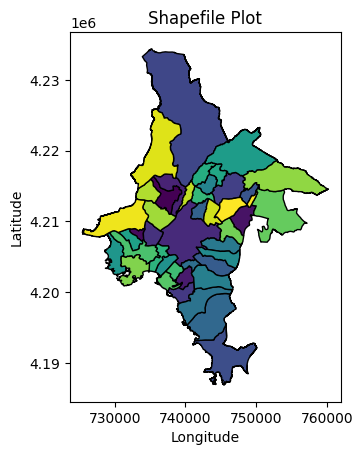

In [ ]:
# Step 3: Plot the shapefile
plt.figure(figsize=(10, 10))
gdf.plot(edgecolor='black', cmap='viridis')  # Adjust cmap as needed
plt.title("Shapefile Plot")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_colored_boxplot_Energy(df, feature_bin, title):
    """
    Plots a colorful boxplot for 'Energy Security Index', connects the medians with a line,
    and overlays the means as red circles with black edges.

    Args:
    - df: Pandas DataFrame
    - feature_bin: Column containing bin labels
    - title: Title for the plot

    Returns:
    - A boxplot with colorful bins, median line, and mean markers.
    """
    if feature_bin not in df.columns or 'Energy Poverty Index' not in df.columns:
        raise KeyError(f"Columns '{feature_bin}' or 'Energy Poverty Index' do not exist in the DataFrame.")

    # Ensure the bin column contains valid data
    if df[feature_bin].isna().all():
        raise ValueError(f"The column '{feature_bin}' contains no valid data.")

    plt.figure(figsize=(10, 6))

    # Step 1: Create a colorful boxplot
    palette = sns.color_palette("husl", len(df[feature_bin].unique()))  # Generate a colorful palette
    sns.boxplot(
        x=feature_bin,
        y='Energy Poverty Index',
        data=df,
        showfliers=False,
        palette=palette  # Apply the colorful palette
    )

    # Step 2: Calculate the mean and median for each bin
    bin_stats = df.groupby(feature_bin)['Energy Poverty Index'].agg(['median', 'mean'])
    bin_medians = bin_stats['median']
    bin_means = bin_stats['mean']

    # Step 3: Add a line to connect the medians
    plt.plot(
        bin_medians.index,
        bin_medians.values,
        marker='o',
        color='blue',
        label='Median',
        linestyle='-',
        linewidth=2
    )

    # Step 4: Overlay the means as red circles with black edges
    plt.scatter(
        bin_means.index,
        bin_means.values,
        color='red',
        s=100,
        label='Mean',
        edgecolors='black'
    )

    # Step 5: Add title, labels, and legend
    plt.title(title, fontsize=14)
    plt.xlabel(feature_bin, fontsize=12)
    plt.ylabel('Energy Security Index', fontsize=12)
    plt.xticks(rotation=45, fontsize=10)
    plt.yticks(fontsize=10)
    plt.grid(True, which='major', linestyle='--', alpha=0.7)
    plt.legend(fontsize=10)
    plt.tight_layout()
    plt.show()


In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'Energy Security Index',
       'Energy Efficiency Ratio', 'Energy Poverty Index', 'PCPP Index',
       'CPP Index', 'Area_bin', 'Population_bin', 'Pop Dens_bin',
       'buildings_bin', 'Residents per building_bin',
       'Energy cost per residents_bin'],
      dtype='object')

<ipython-input-48-b8de404fc7bc>:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
<ipython-input-48-b8de404fc7bc>:37: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin)['Energy Poverty Index'].agg(['median', 'mean'])


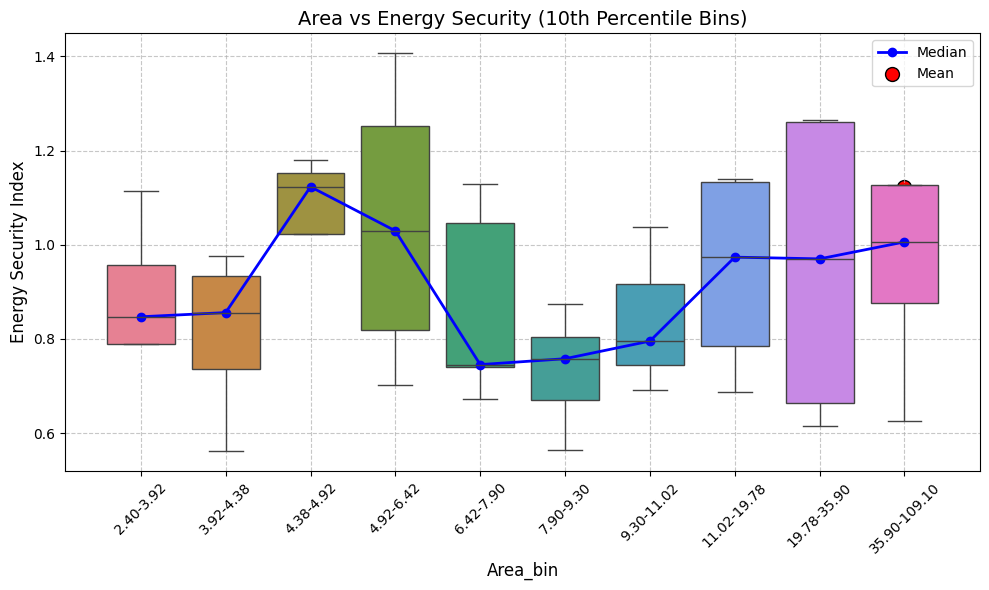

<ipython-input-48-b8de404fc7bc>:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
<ipython-input-48-b8de404fc7bc>:37: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin)['Energy Poverty Index'].agg(['median', 'mean'])


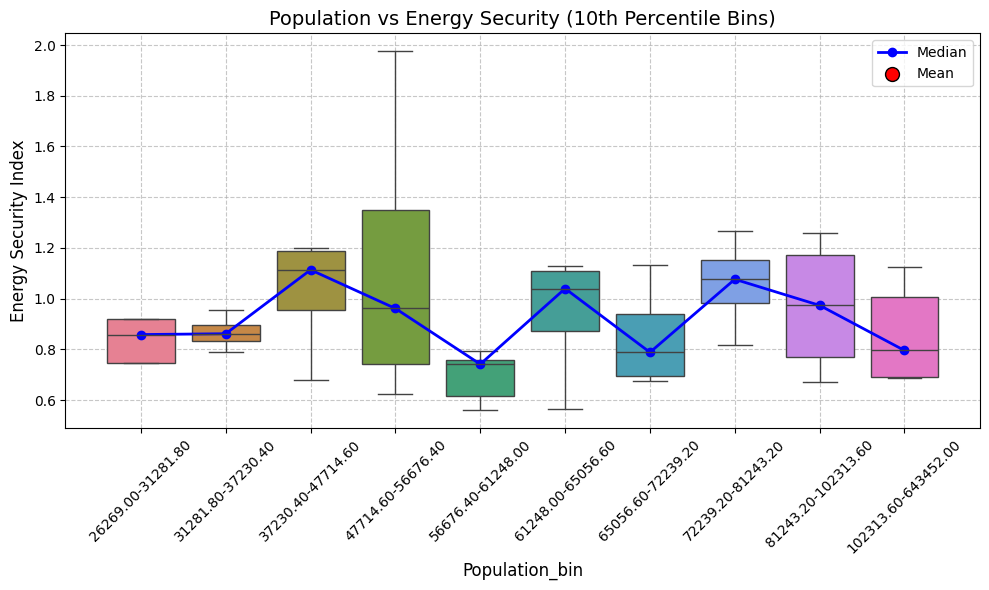

<ipython-input-48-b8de404fc7bc>:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
<ipython-input-48-b8de404fc7bc>:37: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin)['Energy Poverty Index'].agg(['median', 'mean'])


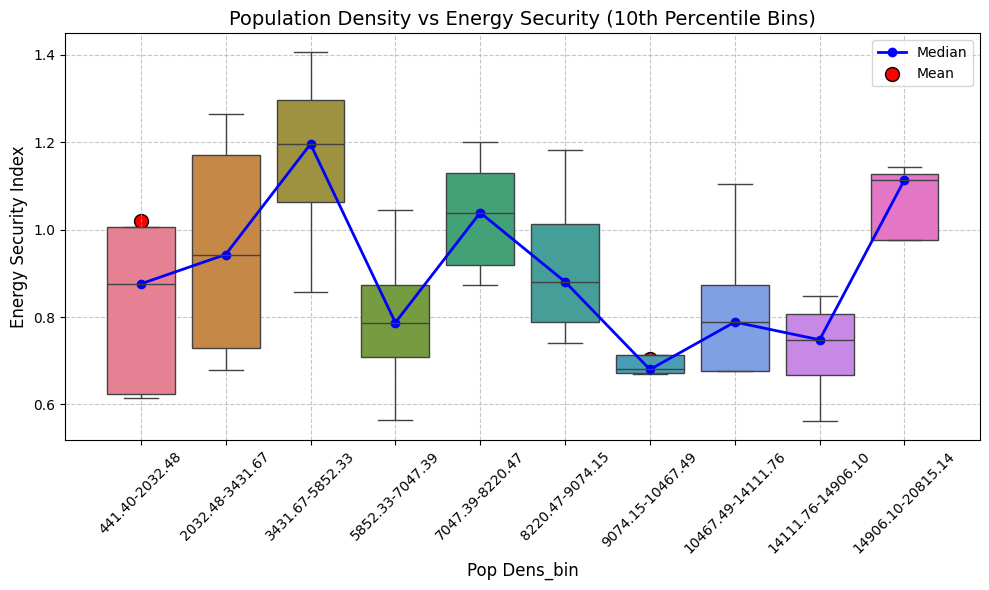

<ipython-input-48-b8de404fc7bc>:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
<ipython-input-48-b8de404fc7bc>:37: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby(feature_bin)['Energy Poverty Index'].agg(['median', 'mean'])


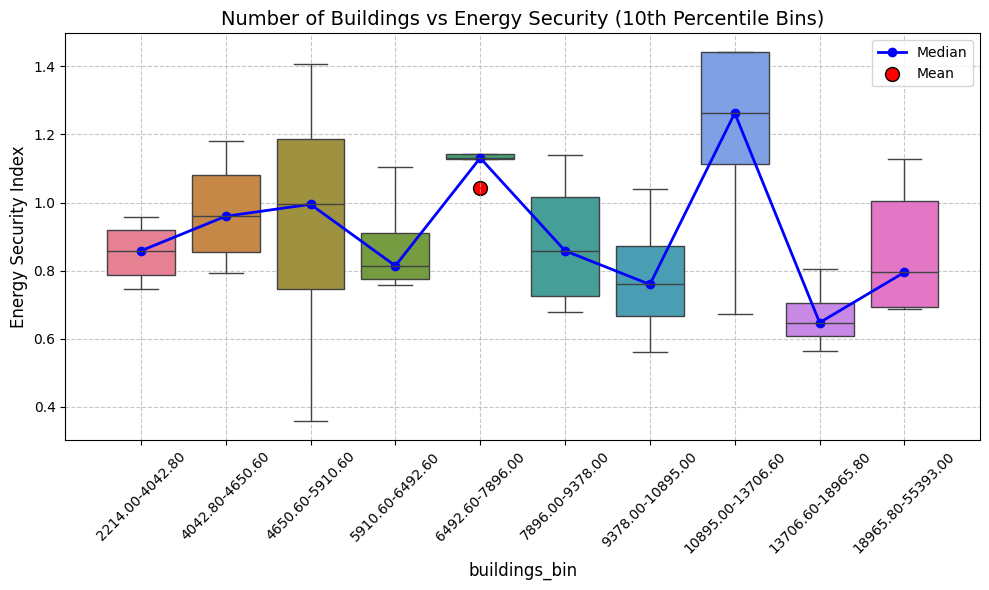

In [ ]:
# Step 5: Plot boxplots for each feature
plot_colored_boxplot_Energy(df, 'Area_bin', 'Area vs Energy Security (10th Percentile Bins)')
plot_colored_boxplot_Energy(df, 'Population_bin', 'Population vs Energy Security (10th Percentile Bins)')
plot_colored_boxplot_Energy(df, 'Pop Dens_bin', 'Population Density vs Energy Security (10th Percentile Bins)')
plot_colored_boxplot_Energy(df, 'buildings_bin', 'Number of Buildings vs Energy Security (10th Percentile Bins)')

In [ ]:
def analyze_bins(df, feature_bin, name_column='NAME'):
    """
    Extracts municipality names and counts from each bin in the specified bin column.

    Args:
    - df: Pandas DataFrame
    - feature_bin: Column containing bin labels (e.g., 'Area_bin')
    - name_column: Column containing municipality names (default: 'NAME')

    Returns:
    - A new DataFrame with municipality names and counts for each bin
    """
    # Ensure the columns exist
    if feature_bin not in df.columns or name_column not in df.columns:
        raise KeyError(f"Columns '{feature_bin}' or '{name_column}' do not exist in the DataFrame.")

    # Group by the bin column and aggregate municipality names and counts
    bin_analysis = (
        df.groupby(feature_bin)
        .agg({
            name_column: lambda x: list(x),  # List all municipalities in the bin
            feature_bin: 'size'             # Count the number of rows in each bin
        })
        .rename(columns={feature_bin: 'Count', name_column: 'Municipalities'})
        .sort_index()  # Ensure bins are in the correct order
    )

    return bin_analysis



In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'Energy Security Index',
       'Energy Efficiency Ratio', 'Energy Poverty Index', 'PCPP Index',
       'CPP Index', 'Area_bin', 'Population_bin', 'Pop Dens_bin',
       'buildings_bin', 'Residents per building_bin',
       'Energy cost per residents_bin', 'Energy cost per household',
       'Energy cost per household_bin', 'annual income per household_bin',
       'Energy Poverty Household', 'Energy Poverty Threshold'],
      dtype='object')

In [ ]:
# Example usage:
area_bin_analysis = analyze_bins(df, 'Area_bin')
# Display the analysis
print(area_bin_analysis)

#'Population_bin' 'Pop Dens_bin',  'buildings_bin'
Population_bin_analysis = analyze_bins(df, 'Population_bin')
# Display the analysis
print(Population_bin_analysis)

Pop_Dens_bin_analysis = analyze_bins(df, 'Pop Dens_bin')
# Display the analysis
print(Pop_Dens_bin_analysis)

buildings_bin_analysis = analyze_bins(df, 'buildings_bin')
# Display the analysis
print(buildings_bin_analysis)

                                                 Municipalities  Count
Area_bin                                                              
2.40-3.92     [Dafni – Imittos, Agia Varbara, Nea Smyrni, Fi...      5
3.92-4.38     [Galatsi, Lykovrysi – Peyki, Nea Ionia, Koryda...      4
4.38-4.92     [Meosxato – Tauros, Palaio Faliro, Heraklio, K...      4
4.92-6.42     [Agios Dimitrios, Metamorfoeos, Alimos, Filoth...      4
6.42-7.90     [Egaleo, Petroupoli, Papagou – Cholargos, Kais...      5
7.90-9.30     [Zografou, Vyronas, Agioi Anargyroi – Kamatero...      5
9.30-11.02                     [Peristeri, Chalandri, Peiraios]      3
11.02-19.78   [Nikaia – Agios I. Renti, Ilioupoli, Amarousio...      4
19.78-35.90              [Chaidari, Glyfada, Pallini, Kifissia]      4
35.90-109.10  [Penteli, Vari – Voula – Vouliagmeni, Athens, ...      5
                                                        Municipalities  Count
Population_bin                                                        

<ipython-input-51-4853c16c56a7>:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(feature_bin)
<ipython-input-51-4853c16c56a7>:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(feature_bin)
<ipython-input-51-4853c16c56a7>:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(feature_bin)
<ipython-input-51-4853c16c56a7>:19: FutureWarning: The default of observed=False is deprecated and will be

In [ ]:
df

,NAME,Περιφερειακή ενότητα,KWD_YPES,buildings,Area,Pop Dens,PV Production Gwh – Only BBE,BBE SC1_100 – Consumption GWh,Adequacy,Population,...,Energy Efficiency Ratio,Energy Poverty Index,PCPP Index,CPP Index,Area_bin,Population_bin,Pop Dens_bin,buildings_bin,Residents per building_bin,Energy cost per residents_bin
0,Dafni – Imittos,Κεντρική Αττική,9189,6040,2.4,14119.166670,28.438429,92.682110,0.306838,33886,...,0.015345,0.847005,0.000839,0.002735,2.40-3.92,31281.80-37230.40,14111.76-14906.10,5910.60-6492.60,5.34-5.91,250.22-272.01
1,Agia Varbara,Δυτική Αττική,9179,4908,2.4,11149.583330,26.721555,27.255805,0.980399,26759,...,0.005553,0.358419,0.000999,0.001019,2.40-3.92,26269.00-31281.80,10467.49-14111.76,4650.60-5910.60,5.34-5.91,101.30-195.42
2,Nea Smyrni,Νότια Αττική,9200,5895,3.5,20815.142860,38.941916,253.013508,0.153912,72853,...,0.042920,1.113744,0.000535,0.003473,2.40-3.92,72239.20-81243.20,14906.10-20815.14,4650.60-5910.60,11.82-15.38,321.13-349.60
3,Filadelphia,Κεντρική Αττική,9193,3824,3.7,9448.108108,25.052255,87.689008,0.285694,34958,...,0.022931,0.788586,0.000717,0.002508,2.40-3.92,31281.80-37230.40,9074.15-10467.49,2214.00-4042.80,9.03-9.44,238.83-250.22
4,Vrilissia,Βόρεια Αττική,9169,3595,3.9,8312.051282,33.345475,93.125557,0.358070,32417,...,0.025904,0.956874,0.001029,0.002873,2.40-3.92,31281.80-37230.40,8220.47-9074.15,2214.00-4042.80,7.66-9.03,272.01-288.38
5,Galatsi,Κεντρική Αττική,9188,4516,4.0,14427.250000,30.681642,143.367668,0.214007,57709,...,0.031747,0.793174,0.000532,0.002484,3.92-4.38,56676.40-61248.00,14111.76-14906.10,4042.80-4650.60,11.82-15.38,238.83-250.22
6,Lykovrysi – Peyki,Βόρεια Αττική,9172,3790,4.1,7560.487805,33.728506,86.449763,0.390152,30998,...,0.022810,0.918605,0.001088,0.002789,3.92-4.38,26269.00-31281.80,7047.39-8220.47,2214.00-4042.80,7.66-9.03,272.01-288.38
7,Nea Ionia,Βόρεια Αττική,9174,9347,4.3,15025.813950,45.788157,202.840010,0.225735,64611,...,0.021701,0.975302,0.000709,0.003139,3.92-4.38,61248.00-65056.60,14906.10-20815.14,7896.00-9378.00,6.61-7.18,288.38-321.13
8,Korydalos,Δυτική Αττική,9203,9502,4.3,14243.720930,41.243425,98.846567,0.417247,61248,...,0.010403,0.562033,0.000673,0.001614,3.92-4.38,56676.40-61248.00,14111.76-14906.10,9378.00-10895.00,5.91-6.61,101.30-195.42
9,Meosxato – Tauros,Νότια Αττική,9199,4338,4.5,8813.555556,34.413254,147.926615,0.232637,39661,...,0.034100,1.180880,0.000868,0.003730,4.38-4.92,37230.40-47714.60,8220.47-9074.15,4042.80-4650.60,9.03-9.44,366.56-547.75


In [ ]:
def analyze_bins_NAME(df, feature_bin, name_column='NAME'):
    """
    Extracts municipality names and counts from each bin in the specified bin column.

    Args:
    - df: Pandas DataFrame
    - feature_bin: Column containing bin labels (e.g., 'Area_bin')
    - name_column: Column containing municipality names (default: 'NAME')

    Returns:
    - A new DataFrame with municipality names and counts for each bin
    """
    # Ensure the columns exist
    if feature_bin not in df.columns or name_column not in df.columns:
        raise KeyError(f"Columns '{feature_bin}' or '{name_column}' do not exist in the DataFrame.")

    # Group by the bin column and aggregate municipality names and counts
    bin_analysis = (
        df.groupby(feature_bin)
        .agg({
            name_column: lambda x: list(x),  # List all municipalities in the bin
            feature_bin: 'size'             # Count the number of rows in each bin
        })
        .rename(columns={feature_bin: 'Count', name_column: 'Municipalities'})
        .sort_index()  # Ensure bins are in the correct order
    )

    return bin_analysis



In [ ]:
# Example usage:
area_bin_analysis_NAME = analyze_bins_NAME(df, 'Area_bin')
# Display the analysis
print(area_bin_analysis_NAME)

#'Population_bin' 'Pop Dens_bin',  'buildings_bin'
Population_bin_analysis_NAME = analyze_bins_NAME(df, 'Population_bin')
# Display the analysis
print(Population_bin_analysis_NAME)

Pop_Dens_bin_analysis_NAME= analyze_bins_NAME(df, 'Pop Dens_bin')
# Display the analysis
print(Pop_Dens_bin_analysis_NAME)

buildings_bin_analysis_NAME= analyze_bins_NAME(df, 'buildings_bin')
# Display the analysis
print(buildings_bin_analysis_NAME)

residents_bin_analysis_NAME= analyze_bins_NAME(df, 'Residents per building_bin')
# Display the analysis
print(residents_bin_analysis_NAME)

energy_cost_per_resident_bin_analysis_NAME= analyze_bins_NAME(df, 'Energy cost per residents_bin')
# Display the analysis
print(energy_cost_per_resident_bin_analysis_NAME)

                                                 Municipalities  Count
Area_bin                                                              
2.40-3.92     [Dafni – Imittos, Agia Varbara, Nea Smyrni, Fi...      5
3.92-4.38     [Galatsi, Lykovrysi – Peyki, Nea Ionia, Koryda...      4
4.38-4.92     [Meosxato – Tauros, Palaio Faliro, Heraklio, K...      4
4.92-6.42     [Agios Dimitrios, Metamorfoeos, Alimos, Filoth...      4
6.42-7.90     [Egaleo, Petroupoli, Papagou – Cholargos, Kais...      5
7.90-9.30     [Zografou, Vyronas, Agioi Anargyroi – Kamatero...      5
9.30-11.02                     [Peristeri, Chalandri, Peiraios]      3
11.02-19.78   [Nikaia – Agios I. Renti, Ilioupoli, Amarousio...      4
19.78-35.90              [Chaidari, Glyfada, Pallini, Kifissia]      4
35.90-109.10  [Penteli, Vari – Voula – Vouliagmeni, Athens, ...      5
                                                        Municipalities  Count
Population_bin                                                        

<ipython-input-54-4331619f6dfd>:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(feature_bin)
<ipython-input-54-4331619f6dfd>:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(feature_bin)
<ipython-input-54-4331619f6dfd>:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(feature_bin)
<ipython-input-54-4331619f6dfd>:19: FutureWarning: The default of observed=False is deprecated and will be

In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'Energy Security Index',
       'Energy Efficiency Ratio', 'Energy Poverty Index', 'PCPP Index',
       'CPP Index', 'Area_bin', 'Population_bin', 'Pop Dens_bin',
       'buildings_bin', 'Residents per building_bin',
       'Energy cost per residents_bin'],
      dtype='object')

In [ ]:
df

,NAME,Περιφερειακή ενότητα,KWD_YPES,buildings,Area,Pop Dens,PV Production Gwh – Only BBE,BBE SC1_100 – Consumption GWh,Adequacy,Population,...,Energy Efficiency Ratio,Energy Poverty Index,PCPP Index,CPP Index,Area_bin,Population_bin,Pop Dens_bin,buildings_bin,Residents per building_bin,Energy cost per residents_bin
0,Dafni – Imittos,Κεντρική Αττική,9189,6040,2.4,14119.166670,28.438429,92.682110,0.306838,33886,...,0.015345,0.847005,0.000839,0.002735,2.40-3.92,31281.80-37230.40,14111.76-14906.10,5910.60-6492.60,5.34-5.91,250.22-272.01
1,Agia Varbara,Δυτική Αττική,9179,4908,2.4,11149.583330,26.721555,27.255805,0.980399,26759,...,0.005553,0.358419,0.000999,0.001019,2.40-3.92,26269.00-31281.80,10467.49-14111.76,4650.60-5910.60,5.34-5.91,101.30-195.42
2,Nea Smyrni,Νότια Αττική,9200,5895,3.5,20815.142860,38.941916,253.013508,0.153912,72853,...,0.042920,1.113744,0.000535,0.003473,2.40-3.92,72239.20-81243.20,14906.10-20815.14,4650.60-5910.60,11.82-15.38,321.13-349.60
3,Filadelphia,Κεντρική Αττική,9193,3824,3.7,9448.108108,25.052255,87.689008,0.285694,34958,...,0.022931,0.788586,0.000717,0.002508,2.40-3.92,31281.80-37230.40,9074.15-10467.49,2214.00-4042.80,9.03-9.44,238.83-250.22
4,Vrilissia,Βόρεια Αττική,9169,3595,3.9,8312.051282,33.345475,93.125557,0.358070,32417,...,0.025904,0.956874,0.001029,0.002873,2.40-3.92,31281.80-37230.40,8220.47-9074.15,2214.00-4042.80,7.66-9.03,272.01-288.38
5,Galatsi,Κεντρική Αττική,9188,4516,4.0,14427.250000,30.681642,143.367668,0.214007,57709,...,0.031747,0.793174,0.000532,0.002484,3.92-4.38,56676.40-61248.00,14111.76-14906.10,4042.80-4650.60,11.82-15.38,238.83-250.22
6,Lykovrysi – Peyki,Βόρεια Αττική,9172,3790,4.1,7560.487805,33.728506,86.449763,0.390152,30998,...,0.022810,0.918605,0.001088,0.002789,3.92-4.38,26269.00-31281.80,7047.39-8220.47,2214.00-4042.80,7.66-9.03,272.01-288.38
7,Nea Ionia,Βόρεια Αττική,9174,9347,4.3,15025.813950,45.788157,202.840010,0.225735,64611,...,0.021701,0.975302,0.000709,0.003139,3.92-4.38,61248.00-65056.60,14906.10-20815.14,7896.00-9378.00,6.61-7.18,288.38-321.13
8,Korydalos,Δυτική Αττική,9203,9502,4.3,14243.720930,41.243425,98.846567,0.417247,61248,...,0.010403,0.562033,0.000673,0.001614,3.92-4.38,56676.40-61248.00,14111.76-14906.10,9378.00-10895.00,5.91-6.61,101.30-195.42
9,Meosxato – Tauros,Νότια Αττική,9199,4338,4.5,8813.555556,34.413254,147.926615,0.232637,39661,...,0.034100,1.180880,0.000868,0.003730,4.38-4.92,37230.40-47714.60,8220.47-9074.15,4042.80-4650.60,9.03-9.44,366.56-547.75


In [ ]:
def analyze_bins_KWD(df, feature_bin, name_column='KWD_YPES'):
    """
    Extracts municipality names and counts from each bin in the specified bin column.

    Args:
    - df: Pandas DataFrame
    - feature_bin: Column containing bin labels (e.g., 'Area_bin')
    - name_column: Column containing municipality names (default: 'NAME')

    Returns:
    - A new DataFrame with municipality names and counts for each bin
    """
    # Ensure the columns exist
    if feature_bin not in df.columns or name_column not in df.columns:
        raise KeyError(f"Columns '{feature_bin}' or '{name_column}' do not exist in the DataFrame.")

    # Group by the bin column and aggregate municipality names and counts
    bin_analysis = (
        df.groupby(feature_bin)
        .agg({
            name_column: lambda x: list(x),  # List all municipalities in the bin
            feature_bin: 'size'             # Count the number of rows in each bin
        })
        .rename(columns={feature_bin: 'Count', name_column: 'Municipalities'})
        .sort_index()  # Ensure bins are in the correct order
    )

    return bin_analysis




In [ ]:
# create few consistent indicators such energy consumptions per households (already present)
# energy cost per household (energy cost per resident * nos of resident per buildings)
# annual income per household (already present)

df['Energy cost per household'] = df['Energy cost per residents'] * df['Residents per building']


In [ ]:
df = create_percentile_bins(df, 'Consumption Mwh per building')
df = create_percentile_bins(df, 'annual income per household')
df =create_percentile_bins(df,'Energy cost per household')

In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'Energy Security Index',
       'Energy Efficiency Ratio', 'Energy Poverty Index', 'PCPP Index',
       'CPP Index', 'Area_bin', 'Population_bin', 'Pop Dens_bin',
       'buildings_bin', 'Residents per building_bin',
       'Energy cost per residents_bin', 'Consumption Mwh per building_bin',
       'annual income per household_bin', 'Energy cost per household',
       'Energy cost per household_bin'],
      dtype='object')

In [ ]:
# Example usage:
area_bin_analysis = analyze_bins_KWD(df, 'Area_bin')
# Display the analysis
print(area_bin_analysis)

#'Population_bin' 'Pop Dens_bin',  'buildings_bin'
Population_bin_analysis = analyze_bins_KWD(df, 'Population_bin')
# Display the analysis
print(Population_bin_analysis)

Pop_Dens_bin_analysis = analyze_bins_KWD(df, 'Pop Dens_bin')
# Display the analysis
print(Pop_Dens_bin_analysis)

buildings_bin_analysis = analyze_bins_KWD(df, 'buildings_bin')
# Display the analysis
print(buildings_bin_analysis)

residents_bin_analysis = analyze_bins_KWD(df, 'Residents per building_bin')
# Display the analysis
print(residents_bin_analysis)

energy_cost_per_resident_bin_analysis= analyze_bins_KWD(df, 'Energy cost per residents_bin')
# Display the analysis
print(energy_cost_per_resident_bin_analysis)

energy_cost_per_building_bin_analysis= analyze_bins_KWD(df, 'Energy cost per household_bin')
# Display the analysis
print(energy_cost_per_building_bin_analysis)

consumption_per_building_bin_analysis= analyze_bins_KWD(df, 'Consumption Mwh per building_bin')
# Display the analysis
print(consumption_per_building_bin_analysis)

income_per_building_bin_analysis= analyze_bins_KWD(df, 'annual income per household_bin')
# Display the analysis
print(income_per_building_bin_analysis)

                              Municipalities  Count
Area_bin                                           
2.40-3.92     [9189, 9179, 9200, 9193, 9169]      5
3.92-4.38           [9188, 9172, 9174, 9203]      4
4.38-4.92           [9199, 9201, 9170, 9198]      4
4.92-6.42           [9194, 9173, 9195, 9177]      4
6.42-7.90     [9181, 9184, 9175, 9192, 9167]      5
7.90-9.30     [9190, 9187, 9180, 9182, 9202]      5
9.30-11.02                [9183, 9178, 9205]      3
11.02-19.78         [9204, 9191, 9168, 9197]      4
19.78-35.90         [9185, 9196, 9223, 9171]      4
35.90-109.10  [9176, 9216, 9186, 9215, 9232]      5
                                     Municipalities  Count
Population_bin                                            
26269.00-31281.80    [9179, 9172, 9173, 9177, 9192]      5
31281.80-37230.40          [9189, 9193, 9169, 9176]      4
37230.40-47714.60          [9199, 9195, 9175, 9185]      4
47714.60-56676.40          [9170, 9197, 9216, 9232]      4
56676.40-61248.00    [

<ipython-input-58-df27a532d980>:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(feature_bin)
<ipython-input-58-df27a532d980>:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(feature_bin)
<ipython-input-58-df27a532d980>:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(feature_bin)
<ipython-input-58-df27a532d980>:19: FutureWarning: The default of observed=False is deprecated and will be

In [ ]:
area_bin_analysis.to_csv('/content/drive/MyDrive/Area1_bin_analysis_KPD.csv', index=True)

Population_bin_analysis.to_csv('/content/drive/MyDrive/Population1_bin_analysis_KPD.csv', index=True)

Pop_Dens_bin_analysis.to_csv('/content/drive/MyDrive/Pop_Dens1_bin_analysis_KPD.csv', index=True)

buildings_bin_analysis.to_csv('/content/drive/MyDrive/buildings1_bin_analysis_KPD.csv', index=True)

residents_bin_analysis.to_csv('/content/drive/MyDrive/resident_per_buildings1_bin_analysis_KPD.csv', index=True)

In [ ]:
energy_cost_per_building_bin_analysis.to_csv('/content/drive/MyDrive/energy_cost_per_building1_bin_analysis_KPD.csv', index=True)
consumption_per_building_bin_analysis.to_csv('/content/drive/MyDrive/consumption_per_building1_bin_analysis_KPD.csv', index=True)
income_per_building_bin_analysis.to_csv('/content/drive/MyDrive/income_per_building1_bin_analysis_KPD.csv', index=True)

In [ ]:
area_bin_analysis.to_csv('area_bin_analysis_1.csv', index=True)

Population_bin_analysis.to_csv('Population_bin_analysis_1.csv', index=True)

Pop_Dens_bin_analysis.to_csv('/content/drive/MyDrive/Pop_Dens_bin_analysis_1.csv', index=True)

buildings_bin_analysis.to_csv('buildings_bin_analysis_1.csv', index=True)


In [ ]:
  ls

area_bin_analysis_1.csv       drive/                         sample_data/
buildings_bin_analysis_1.csv  Population_bin_analysis_1.csv  updated_municipality_data.xlsx


In [ ]:
import pandas as pd

# Read the CSV file into a DataFrame
file_path = "/content/drive/MyDrive/Pop_Dens1_bin_analysis_KPD.csv"  # Replace with the actual path of your file
df_pop_dens = pd.read_csv(file_path)

# Add a new column 'perc_cat' starting from 1 to the number of rows
df_pop_dens['perc_cat'] = range(1, len(df_pop_dens) + 1)  # Correctly reference the DataFrame name

# Display the updated DataFrame
print(df_pop_dens.head(10))


        Pop Dens_bin                                     Municipalities  \
0     441.40-2032.48  ['Vari – Voula – Vouliagmeni', 'Acharnai', 'Pe...   
1    2032.48-3431.67  ['Kifissia', 'Elliniko – Argyroupoli', 'Kaisar...   
2    3431.67-5852.33  ['Filothei – Psychiko', 'Glyfada', 'Amarousion...   
3    5852.33-7047.39  ['Papagou – Cholargos', 'Ilioupoli', 'Vyronas'...   
4    7047.39-8220.47  ['Alimos', 'Agia Paraskevi', 'Chalandri', 'Zog...   
5    8220.47-9074.15  ['Meosxato – Tauros', 'Vrilissia', 'Ilion', 'P...   
6   9074.15-10467.49  ['Filadelphia', 'Egaleo', 'Nikaia – Agios I. R...   
7  10467.49-14111.76  ['Palaio Faliro', 'Peristeri', 'Heraklio', 'Ag...   
8  14111.76-14906.10  ['Dafni – Imittos', 'Galatsi', 'Agios Dimitrio...   
9  14906.10-20815.14  ['Athens', 'Kallithea', 'Nea Smyrni', 'Nea Ion...   

   Count  perc_cat  
0      5         1  
1      4         2  
2      4         3  
3      4         4  
4      5         5  
5      4         6  
6      4         7  
7     

In [ ]:
import pandas as pd

# Read the CSV file into a DataFrame
file_path = "/content/drive/MyDrive/Population1_bin_analysis_KPD.csv"  # Replace with the actual path of your file
df_pop= pd.read_csv(file_path)

# Add a new column 'perc_cat' starting from 1 to the number of rows
df_pop['perc_cat'] = range(1, len(df_pop) + 1)

# Display the updated DataFrame
print(df_pop.head())



      Population_bin                                     Municipalities  \
0  26269.00-31281.80  ['Filothei – Psychiko', 'Lykovrysi – Peyki', '...   
1  31281.80-37230.40  ['Vrilissia', 'Dafni – Imittos', 'Penteli', 'F...   
2  37230.40-47714.60  ['Meosxato – Tauros', 'Alimos', 'Papagou – Cho...   
3  47714.60-56676.40  ['Vari – Voula – Vouliagmeni', 'Elliniko – Arg...   
4  56676.40-61248.00  ['Galatsi', 'Vyronas', 'Petroupoli', 'Pallini'...   

   Count  perc_cat  
0      5         1  
1      4         2  
2      4         3  
3      4         4  
4      5         5  


In [ ]:
import pandas as pd

# Read the CSV file into a DataFrame
file_path = '/content/drive/MyDrive/Area1_bin_analysis_KPD.csv'  # Replace with the actual path of your file
df_area= pd.read_csv(file_path)

# Add a new column 'perc_cat' starting from 1 to the number of rows
df_area['perc_cat'] = range(1, len(df_area) + 1)

# Display the updated DataFrame
print(df_area.head())

    Area_bin                                     Municipalities  Count  \
0  2.40-3.92  ['Nea Smyrni', 'Vrilissia', 'Dafni – Imittos',...      5   
1  3.92-4.38  ['Nea Ionia', 'Lykovrysi – Peyki', 'Galatsi', ...      4   
2  4.38-4.92  ['Meosxato – Tauros', 'Kallithea', 'Palaio Fal...      4   
3  4.92-6.42  ['Filothei – Psychiko', 'Alimos', 'Metamorfoeo...      4   
4  6.42-7.90  ['Agia Paraskevi', 'Papagou – Cholargos', 'Kai...      5   

   perc_cat  
0         1  
1         2  
2         3  
3         4  
4         5  


In [ ]:
# Step 1: Define a function to find common municipalities for each perc_cat
def find_common_municipalities_by_perc_cat(df1, df2):
    """
    Finds common municipalities for each perc_cat across two DataFrames.

    Args:
    - df1: First DataFrame (e.g., df_pop)
    - df2: Second DataFrame (e.g., df_area)

    Returns:
    - A dictionary with perc_cat as keys and lists of common municipalities as values.
    """
    common_municipalities = {}

    # Iterate over unique perc_cat values
    for perc_cat in df1['perc_cat'].unique():
        # Get municipalities for the current perc_cat from both DataFrames
        municipalities1 = set(eval(df1[df1['perc_cat'] == perc_cat]['Municipalities'].values[0]))
        municipalities2 = set(eval(df2[df2['perc_cat'] == perc_cat]['Municipalities'].values[0]))

        # Find the intersection (common municipalities)
        common = municipalities1.intersection(municipalities2)

        # Store the result
        common_municipalities[perc_cat] = list(common)

    return common_municipalities

# Step 2: Find common municipalities by perc_cat
common_municipalities = find_common_municipalities_by_perc_cat(df_pop, df_area)

# Step 3: Display the results
for perc_cat, municipalities in common_municipalities.items():
    print(f"perc_cat {perc_cat}: {municipalities}")


perc_cat 1: ['Agia Varbara']
perc_cat 2: []
perc_cat 3: ['Meosxato – Tauros']
perc_cat 4: []
perc_cat 5: ['Petroupoli']
perc_cat 6: ['Agioi Anargyroi – Kamatero']
perc_cat 7: []
perc_cat 8: ['Ilioupoli']
perc_cat 9: ['Glyfada']
perc_cat 10: ['Athens', 'Acharnai']


In [ ]:
# Step 2: Find common municipalities by perc_cat
common_municipalities = find_common_municipalities_by_perc_cat(df_pop, df_area)

# Step 3: Display the results
for perc_cat, municipalities in common_municipalities.items():
    print(f"Population & Area {perc_cat}: {municipalities}")


Population & Area 1: ['Agia Varbara']
Population & Area 2: []
Population & Area 3: ['Meosxato – Tauros']
Population & Area 4: []
Population & Area 5: ['Petroupoli']
Population & Area 6: ['Agioi Anargyroi – Kamatero']
Population & Area 7: []
Population & Area 8: ['Ilioupoli']
Population & Area 9: ['Glyfada']
Population & Area 10: ['Athens', 'Acharnai']


In [ ]:
# Step 2: Find common municipalities by perc_cat
common_municipalities = find_common_municipalities_by_perc_cat(df_pop_dens, df_area)

# Step 3: Display the results
for perc_cat, municipalities in common_municipalities.items():
    print(f"Pop Dense & Area {perc_cat}: {municipalities}")


Pop Dense & Area 1: []
Pop Dense & Area 2: []
Pop Dense & Area 3: []
Pop Dense & Area 4: []
Pop Dense & Area 5: ['Agia Paraskevi']
Pop Dense & Area 6: ['Ilion']
Pop Dense & Area 7: []
Pop Dense & Area 8: []
Pop Dense & Area 9: []
Pop Dense & Area 10: ['Athens']


In [ ]:
# Step 2: Find common municipalities by perc_cat
common_municipalities = find_common_municipalities_by_perc_cat(df_pop_dens, df_pop)

# Step 3: Display the results
for perc_cat, municipalities in common_municipalities.items():
    print(f"Pop Dense & Pop {perc_cat}: {municipalities}")

Pop Dense & Pop 1: []
Pop Dense & Pop 2: []
Pop Dense & Pop 3: []
Pop Dense & Pop 4: []
Pop Dense & Pop 5: []
Pop Dense & Pop 6: []
Pop Dense & Pop 7: ['Egaleo']
Pop Dense & Pop 8: []
Pop Dense & Pop 9: []
Pop Dense & Pop 10: ['Athens', 'Peiraios']


In [ ]:
df.columns

Index(['NAME', 'Περιφερειακή ενότητα', 'KWD_YPES', 'buildings', 'Area',
       'Pop Dens', 'PV Production Gwh – Only BBE',
       'BBE SC1_100 – Consumption GWh', 'Adequacy', 'Population',
       'Residents per building', 'Energy consuption per resident Mwh',
       'Energy consumption per household Mwh 4 residents',
       'Consumption Mwh per building', 'Energy cost per residents', 'Average',
       'annual income per household', 'Energy Security Index',
       'Energy Efficiency Ratio', 'Energy Poverty Index', 'PCPP Index',
       'CPP Index', 'Area_bin', 'Population_bin', 'Pop Dens_bin',
       'buildings_bin', 'Residents per building_bin',
       'Energy cost per residents_bin'],
      dtype='object')